# Imports

In [1]:
pip install scipy

In [1]:
import numpy as np
from numpy import pi
# importing Qiskit
from qiskit import QuantumCircuit, QuantumRegister, ClassicalRegister,transpile, assemble
from qiskit.circuit import Gate
from qiskit_aer import Aer
from qiskit.visualization import plot_histogram, plot_bloch_multivector
import math
import numpy as np
from qiskit.quantum_info import Statevector, partial_trace, state_fidelity

import random
import matplotlib.pyplot as plt
from scipy.optimize import minimize
from scipy.optimize import curve_fit
from qiskit.quantum_info import Operator
from qiskit.quantum_info import random_statevector
from scipy.interpolate import make_interp_spline
from numpy.polynomial import Polynomial
import csv
import pandas as pd
import seaborn as sns

# Initializing a Quantum State

In [12]:
#defining the initial statae before applying the qft
def init_state_random(m, meth):
    qr1 = QuantumRegister(m, name='qr1') 
    circ = QuantumCircuit(qr1) 
    
    if meth=='state1':
        for i in range(m):
            circ.x(i)# switch all qubits to state 1 
    
    if meth=='random':
        for i in range(m):
            if random.choice([0,1]):
                circ.x(i)# switch qubit to state 1 with prob 0.5
    
    if meth=='hadamard':
        for i in range(m):
            circ.h(i)# switch qubit to state 0+1 mixed
            
    if meth=='random_sup': #creates a completely random state with completely random superpositions
        state = random_statevector(2**m)
        circ.initialize(state.data, circ.qubits)
        
    if meth=='entangle':
        state = random_statevector(2**m)
        circ.initialize(state.data, circ.qubits)
        for i in range(1,m):
            circ.cx(0, i)
                
    
    return (qr1, circ)

In [13]:
m=6
circuit=init_state_random(m, 'random')
circ=circuit[1]
print(circ.draw())
qr=circuit[0]


            
qr1_0: ─────
       ┌───┐
qr1_1: ┤ X ├
       ├───┤
qr1_2: ┤ X ├
       ├───┤
qr1_3: ┤ X ├
       └───┘
qr1_4: ─────
       ┌───┐
qr1_5: ┤ X ├
       └───┘


# Making QFT gate

In [14]:
#QFT function
def QFT_circ(m):
    """QFT circ"""
    QFT = QuantumCircuit(m, name="QFT")
    for qubit in reversed(range(m)):
        QFT.h(qubit)
        for k in range(qubit):
            QFT.cp(2*pi/(2**(k+2)), qubit-k-1, qubit)

    for number in range(int(m/2)):
        QFT.swap(number, m-number-1)
    
    #print(QFT.draw())
    
    QFT_gate = QFT.to_gate()
    return QFT_gate


In [15]:
#Applying the QFT to m qubits

m=6 #number of qubits in the QFT


qr1 = QuantumRegister(m, name='qr1') 
circ = QuantumCircuit(qr1) 

QFT_gate=QFT_circ(m)

circ.append(QFT_gate, [qr1[i] for i in range(m)]) 
circ.draw()

┌──────┐
qr1_0: ┤0     ├
       │      │
qr1_1: ┤1     ├
       │      │
qr1_2: ┤2     ├
       │  QFT │
qr1_3: ┤3     ├
       │      │
qr1_4: ┤4     ├
       │      │
qr1_5: ┤5     ├
       └──────┘

# Adding Cut-off to Approximate QFT gate

In [29]:
#Approximate QFT 
def approx_QFT_circ(m, cut_off): #The cut_off is defined as the number of rotation gates which are still implemented. If cut_off>=m-1, it's just the normal QFT 
    """Approx QFT circ. The cut-off does not correspond with the same parameter as in literature as a cut-off in this context is one lower than the 
    same cut-off in literature. This will be adjusted in the graphs for illustration purposes."""
    QFT = QuantumCircuit(m, name="QFT")
    for qubit in reversed(range(m)): #summing over all qubits in the circuit, starting from the bottom one.
        QFT.h(qubit) #hadamard on the qubit
        for k in range(min(qubit, cut_off)):
            QFT.cp(2*pi/(2**(k+2)), qubit-k-1, qubit) #rotation gates on the qubits (k many of them)

    for number in range(m//2):
        QFT.swap(number, m-number-1)
    
    #print(QFT.draw())
    
    QFT_gate = QFT.to_gate()
    return QFT_gate

In [17]:
approx_QFT_circ(5, 3)

                                                                          »
q_0: ─────────────────────────────────────────────────────────────■───────»
                                                                  │       »
q_1: ─────────────────────────────■─────────────────■─────────────┼───────»
                                  │                 │       ┌───┐ │       »
q_2: ───────────────■─────────────┼────────■────────┼───────┤ H ├─┼───────»
                    │       ┌───┐ │        │P(π/2)  │P(π/4) └───┘ │P(π/8) »
q_3: ──────■────────┼───────┤ H ├─┼────────■────────■─────────────■───────»
     ┌───┐ │P(π/2)  │P(π/4) └───┘ │P(π/8)                                 »
q_4: ┤ H ├─■────────■─────────────■───────────────────────────────────────»
     └───┘                                                                »
«                                     ┌───┐   
«q_0: ──────────■─────────────■───────┤ H ├─X─
«               │       ┌───┐ │P(π/2) └───┘ │ 
«q_1: ─■────────┼──────

Instruction(name='QFT', num_qubits=5, num_clbits=0, params=[])

In [18]:
#Applying the approxomate QFT to m qubits

def output_from_approx_QFT(m, circ, qr, cut_off): #input the starting circuit and quantum register

    
    new_circ = QuantumCircuit(qr) #new circuit to make sure we don't change the initial one
    new_circ.compose(circ, inplace=True)
    
    #print(circ1.draw())
    
    approx_QFT_gate=approx_QFT_circ(m, cut_off)

    new_circ.append(approx_QFT_gate, [qr[i] for i in range(m)]) 
    #print(circ1.draw())

    state = Statevector.from_instruction(new_circ)
    return state


In [19]:
qr1, circ1=init_state_random(m, 'random')
print(circ1.draw())

            
qr1_0: ─────
       ┌───┐
qr1_1: ┤ X ├
       └───┘
qr1_2: ─────
            
qr1_3: ─────
            
qr1_4: ─────
       ┌───┐
qr1_5: ┤ X ├
       └───┘


# Implementing Noise

In [20]:
def Noisy_gate(circ, qubit, fidelity): #should this be characterized and different for each gate?
    probabilities = [fidelity, (1-fidelity)/3, (1-fidelity)/3, (1-fidelity)/3]  # Must sum to 1
    #print(probabilities)
    error_after_gate = error_after_gate = [
        lambda: circ.id(qubit),  # Identity
        lambda: circ.x(qubit),  # Pauli-X
        lambda: circ.y(qubit),  # Pauli-Y
        lambda: circ.z(qubit)   # Pauli-Z
    ]
    op = random.choices(error_after_gate, weights=probabilities, k=1)[0]
    op()
    
    
    return(circ)

In [21]:
#testing the noisy gate
m=5
qr1 = QuantumRegister(m, name='qr1') 
circ = QuantumCircuit(qr1)
print(Noisy_gate(circ, 2, 0.7))


            
qr1_0: ─────
            
qr1_1: ─────
       ┌───┐
qr1_2: ┤ I ├
       └───┘
qr1_3: ─────
            
qr1_4: ─────
            


In [22]:
#approx QFT with error
def approx_QFT_circ_error(m, cut_off, fidelity_single, fidelity_mult): #The cut_off is defined as the number of rotation gates which are still implemented. If cut_off>=m-1, it's just the normal QFT
    """QFT circ"""
    QFT_err = QuantumCircuit(m, name="QFT")
    for qubit in reversed(range(m)): #summing over all qubits in the circuit, starting from the bottom one.
        QFT_err.h(qubit) #hadamard on the qubit
        Noisy_gate(QFT_err, qubit, fidelity_single) #adding noise after each hadamard **********characterize for different gate???
        for k in range(min(qubit, cut_off)):
            QFT_err.cp(2*pi/(2**(k+2)), qubit-k-1, qubit) #rotation gates on the qubits (k many of them)
            Noisy_gate(QFT_err, qubit, fidelity_mult) #adding noise after each hadamard **********characterize for different gate???

    for number in range(int(m/2)):
        QFT_err.swap(number, m-number-1)
        Noisy_gate(QFT_err, number, fidelity_mult)
        Noisy_gate(QFT_err, m-number-1, fidelity_mult)
        Noisy_gate(QFT_err, number, fidelity_mult)

        #swap gate needs 3 double qubit gates
        
    
    #print(QFT.draw())
    
    QFT_gate = QFT_err.to_gate()
    return QFT_gate

approx_QFT_circ_error(5, 2, 0.7, 0.7)

Instruction(name='QFT', num_qubits=5, num_clbits=0, params=[])

In [23]:
def output_from_approx_QFT_error(m, circ, qr, cut_off, fidelity_single, fidelity_mult):
    
    new_circ = QuantumCircuit(qr) #new circuit to make sure we don't change the initial one
    new_circ.compose(circ, inplace=True)
    
    
    approx_QFT_gate=approx_QFT_circ_error(m, cut_off, fidelity_single, fidelity_mult)

    new_circ.append(approx_QFT_gate, [qr[i] for i in range(m)]) 
    #circ.draw()

    state = Statevector.from_instruction(new_circ)
    return state


# Computing the Fidelity and Norm

In [51]:
#computing the error
def norm(state1, state2, method='norm'): 
    #print(state1)
    #print(state1.data)
    #print(state2)
    #print(state2.data)
    if method == 'norm':
        # Euclidean norm of the difference vector
        diff = state1.data - state2.data
        return np.linalg.norm(diff)
    
    elif method == 'Fidelity': #fidelity is overlap squared
        # Fidelity: value in [0, 1], 1 means identical
        return state_fidelity(state1, state2)

    elif method == 'overlap':
        # Absolute value of inner product ⟨ψ|ϕ⟩
        return abs(np.vdot(state1.data, state2.data))
    
    elif method == 'overlap_fidelity':
        #Returns the squared magnitude of the inner product: |<ψ|ϕ>|²"""
        return abs(np.vdot(state1.data, state2.data)) ** 2

In [54]:
m=10
qr, circ=init_state_random(m, 'random')
#print(output_from_approx_QFT(4, 4))
norm(output_from_approx_QFT(m, circ, qr, m), output_from_approx_QFT_error(m, circ, qr, 4, 0.9999, 0.995), method='Fidelity')

0.9932426212940043

# Determining Pauli error

In [55]:
def pauli_prob_to_fidelity(m, trials, pauli_probs, gatetype):
    avg_fid_per_prob=[]

    for pauli_prob in pauli_probs:
        fidelities_for_prob=[]
        for trial in range(trials):
            #state 1 (without error)
            qr1 = QuantumRegister(m, name='qr1') 
            circ = QuantumCircuit(qr1)

            state = random_statevector(2**m)
            circ.initialize(state.data, circ.qubits)
            if gatetype=='multi':
                circ.cp(pi, 0, 1)
            if gatetype=='single':
                circ.h(1)
           
            state1=Statevector.from_instruction(circ)

            #making state 2 with noise
            new_circ = QuantumCircuit(qr1) #new circuit to make sure we don't change the initial one
            new_circ.compose(circ, inplace=True)

            new_circ=Noisy_gate(new_circ, 1, pauli_prob)

            state2=Statevector.from_instruction(new_circ)

            #computing the fidelity between the two states
            fidelity=norm(state1, state2, 'Fidelity')


            fidelities_for_prob.append(fidelity)

        avg_fid=sum(fidelities_for_prob)/trials
        std_dev=np.std(fidelities_for_prob)
        maxi=max(fidelities_for_prob)
        mini=min(fidelities_for_prob)

        avg_fid_per_prob.append(avg_fid)
        
    return (avg_fid_per_prob, std_dev, maxi, mini)

In [56]:
pauli_prob_to_fidelity(5, 1000, [0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1], 'multi')

([0.02958029519549931,
  0.13706502867126963,
  0.22534025961721102,
  0.3086365457885059,
  0.4066122453848393,
  0.5310084484621458,
  0.6186709743039266,
  0.7071326887763303,
  0.7977385334676665,
  0.9060582071408618,
  1.0],
 3.437032449029926e-16,
 1.0000000000000009,
 0.9999999999999991)

In [445]:
pauli_prob_to_fidelity(5, 1000, [0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1], 'single')

[0.03039234562809832,
 0.1407446685586634,
 0.22699637020407146,
 0.3296507504150505,
 0.42823818874505104,
 0.48579026116931995,
 0.6104606231739432,
 0.6759542648114713,
 0.8010037707155773,
 0.9118759513844372,
 0.9999999999999997]

In [169]:
paulis=[]
for _ in range(100):
    paulis.append(pauli_prob_to_fidelity(3, 10000, [0.998832], 'single')[0][0])

avg=sum(paulis)/100
std_dev=np.std(paulis)
maxi=max(paulis)
mini=min(paulis)
print(avg, std_dev, maxi, mini)


0.9988944313565898 0.0002881570355952337 0.9996221881375427 0.9981790336950626


In [167]:
paulis=[]
for _ in range(100):
    paulis.append(pauli_prob_to_fidelity(3, 10000, [0.9683], 'multi')[0][0])

avg=sum(paulis)/100
std_dev=np.std(paulis)
maxi=max(paulis)
mini=min(paulis)
print(avg, std_dev, maxi, mini)


0.9719683714426038 0.0015670345626202663 0.9749665094146165 0.967872724419242


In [170]:
paulis=[]
for _ in range(100):
    paulis.append(pauli_prob_to_fidelity(3, 10000, [0.99968], 'single')[0][0])

avg=sum(paulis)/100
std_dev=np.std(paulis)
maxi=max(paulis)
mini=min(paulis)
print(avg, std_dev, maxi, mini)

0.9997048497778157 0.00014507268590782088 0.9999999999999997 0.9992473541838739


In [171]:
paulis=[]
for _ in range(100):
    paulis.append(pauli_prob_to_fidelity(3, 10000, [0.967], 'multi')[0][0])

avg=sum(paulis)/100
std_dev=np.std(paulis)
maxi=max(paulis)
mini=min(paulis)
print(avg, std_dev, maxi, mini)

0.9705823736941948 0.0016009712336595744 0.9741085436133151 0.9673825614077712


In [20]:
def binary_search_pauli_prob(m, target_fidelity, trials, gatetype, tolerance=1e-4, max_iter=20):
    low = 0.0
    high = 1.0
    iter_count = 0

    while low <= high and iter_count < max_iter:
        mid = (low + high) / 2
        avg_fid = pauli_prob_to_fidelity(m, trials, [mid], gatetype)[0][0]
        #print(mid, avg_fid)

        if abs(avg_fid - target_fidelity) < tolerance:
            return mid  # Found a good enough match

        if avg_fid > target_fidelity:
            high = mid  # Increase noise to reduce fidelity
        else:
            low = mid  # Decrease noise

        iter_count += 1

    # If we exit loop without finding exact match, return closest estimate
    return (low + high) / 2

In [556]:
binary_search_pauli_prob(5, 0.995, 1000, 'multi', tolerance=1e-4, max_iter=20)

0.5 0.5300084989473487
0.75 0.7560450757790868
0.875 0.8916098920381557
0.9375 0.9473359162746389
0.96875 0.9724512297317719
0.984375 0.9846442049522587
0.9921875 0.9980042029575605
0.98828125 0.9826381058172416
0.990234375 0.9903553045565668
0.9912109375 0.9893552920394152
0.99169921875 0.9868432500787135
0.991943359375 0.9940856774606963
0.9920654296875 0.9933730068332269
0.99212646484375 0.9954513800611761
0.992095947265625 0.9923621539865641
0.9921112060546875 0.9913502598533294
0.9921188354492188 0.9923173254152567
0.9921226501464844 0.9924282821057991
0.9921245574951172 0.9876831123586013
0.9921255111694336 0.9911379559171027


0.9921259880065918

In [457]:
binary_search_pauli_prob(3, 0.9997, 10000, 'single', tolerance=1e-4, max_iter=20)

0.5 0.5567223241358233
0.75 0.7727406183796804
0.875 0.8923309763279336
0.9375 0.9464409675935754
0.96875 0.9720363260127407
0.984375 0.986861735223088
0.9921875 0.992860450796496
0.99609375 0.9966483634780403
0.998046875 0.9981513075835599
0.9990234375 0.99957929689794
0.99951171875 0.999454980802104
0.999755859375 0.9995495848638569
0.9998779296875 0.9999999999999997
0.99981689453125 0.999902652156309
0.999786376953125 0.9996741886995087


0.999786376953125

In [177]:
binary_search_pauli_prob(2, 0.995, 10000, 'single', tolerance=1e-4, max_iter=20)

0.9951176643371582

In [458]:
binary_search_pauli_prob(3, 0.995, 10000, 'multi', tolerance=1e-4, max_iter=20)

0.5 0.5580514107410145
0.75 0.7743142503884916
0.875 0.8890124441794407
0.9375 0.9423581907645701
0.96875 0.9720826002380718
0.984375 0.9856695882833988
0.9921875 0.993966116834107
0.99609375 0.996483636137068
0.994140625 0.9952139969411841
0.9931640625 0.9950443312126447


0.9931640625

# Graphing Cut-off vs Fidelity Line Plot

In [21]:
def errvscutoff_graph(n, init_state, fidelity_single, fidelity_mult, trials, err): #n is number of qubits in circuit, probs is error probabilities and trials is number of trials to compute the fidelity for each cut_off
    cut_offs=[]
    fidelities=[]
    for cut_off in range(n):
        cut_offs.append(cut_off)
        trial_cutoff=[]
        for i in range(trials):
            qr, circ=init_state_random(n, init_state)
                      
            ideal=output_from_approx_QFT(n, circ, qr, n)
            output=output_from_approx_QFT_error(n, circ, qr, cut_off, fidelity_single, fidelity_mult)
            y=norm(ideal, output, err)
            trial_cutoff.append(y)
        fidelity=sum(trial_cutoff)/trials
        fidelities.append(fidelity)
    plt.figure()
    plt.plot(cut_offs, fidelities, marker='o', linestyle='-', color='blue')
    plt.title(f'Fidelity at Different Cut-Offs for Approximate QFT on {n} Qubits')
    plt.xlabel('Cut-off')
    plt.ylabel(f'{err}')
    print(plt.show())
    
    if err=='norm':
        min_fidelity = min(fidelities)
        min_index = fidelities.index(min_fidelity)
        min_cutoff = cut_offs[min_index]

        print(f"Minimum {err}: {min_fidelity:.4f} at cut-off = {min_cutoff}")
        
    if err=='Fidelity':
        min_fidelity = max(fidelities)
        min_index = fidelities.index(min_fidelity)
        min_cutoff = cut_offs[min_index]
    
        print(f"Maximum  {err}: {min_fidelity:.4f} at cut-off = {min_cutoff}")
    
    return(min_cutoff)
    

# Making Smooth Poly Curve Cut-Off vs Fidelity

In [23]:
def poly_graph(n, init_state, fidelity_single, fidelity_mult, trials, err):
    cut_offs = list(range(1, n))
    fidelities = []
    
    std_devs = []
    
    results_dict = {}  # Store all norms or fidelities per cutoff

    for cut_off in cut_offs:
        trial_cutoff = []
        for _ in range(trials):
            qr, circ = init_state_random(n, init_state)
            ideal = output_from_approx_QFT(n, circ, qr, n)
            output = output_from_approx_QFT_error(n, circ, qr, cut_off, fidelity_single, fidelity_mult)
            y = norm(ideal, output, err)
            trial_cutoff.append(y)
        
        results_dict[cut_off] = trial_cutoff
        
        avg_fidelity = sum(trial_cutoff) / trials
        fidelities.append(avg_fidelity)
    
        #using std devs
        std_dev = np.std(trial_cutoff)
        
        std_devs.append(std_dev)

    print(fidelities) 
    # Fit polynomial (quadratic or cubic typically works well)
    degree = 4  # You can change to 2 or 4 if needed
    p_fit = np.polyfit(cut_offs, fidelities, degree)
    poly = np.poly1d(p_fit)

    # Create smooth x values for the curve
    x_smooth = np.linspace(1, n-1, 200)
    y_smooth = poly(x_smooth)

        
    # Evaluate fitted curve at integer cut-off values
    fit_vals = [poly(x) for x in cut_offs]  # Evaluate polynomial at integer points only

    if err == 'norm':
        opt_index = int(np.argmin(fit_vals))
        
        # Find optimal cut-off on the smooth curve (including non-integer values)
        min_index = np.argmin(y_smooth)
        opt_cutoff_real = x_smooth[min_index]
        opt_value_real = y_smooth[min_index]
    elif err == 'Fidelity':
        opt_index = int(np.argmax(fit_vals))
        
         # Find optimal cut-off on the smooth curve (including non-integer values)
        max_index = np.argmax(y_smooth)
        opt_cutoff_real = x_smooth[max_index]
        opt_value_real = y_smooth[max_index]
    else:
        raise ValueError("err must be either 'norm' or 'Fidelity'")

    opt_cutoff = cut_offs[opt_index]
    opt_value = fit_vals[opt_index]

    # Plot data points and best-fit curve
    plt.figure(figsize=(8, 5))
    
    plt.errorbar(cut_offs, fidelities, yerr=std_devs, fmt='o', color='blue', ecolor='gray', capsize=4, label='Data w/ error bars')

    x_smooth_new = np.linspace(2, n, 200)
    #plt.plot(cut_offs, fidelities, 'o', color='blue')
    plt.plot(x_smooth_new, y_smooth, '-', color='orange')
    plt.axvline(opt_cutoff, color='red', linestyle='--', label=f'Optimal Cut-off ≈ {opt_cutoff:.2f}')
    
    plt.title(f'Fidelity vs Cut-Off for Approximate QFT on {n} Qubits')
    plt.xlabel('Cut-off')
    plt.ylabel(err)
    plt.grid(True)
    plt.tight_layout()
    plt.show()
        

    print(f"{'Maximum' if err == 'Fidelity' else 'Minimum'} {err}: {opt_value:.4f} at cut-off ≈ {opt_cutoff:.2f}")
    print(f"At non-integer cut off {'Maximum' if err == 'Fidelity' else 'Minimum'} {err}: {opt_value_real:.4f} at cut-off ≈ {opt_cutoff_real:.2f}")
    
    #Storing the files since they take very long to run
    with open(f"qft_results_{n}_qubits_{fidelity_mult}_fidelity.csv", mode="w", newline="") as file:
        writer = csv.writer(file)
        writer.writerow(["Cut-off", "Trial", "Value"])  # Header
        for cutoff, values in results_dict.items():
            for i, val in enumerate(values):
                writer.writerow([cutoff, i, val])
    
    return (opt_cutoff, opt_cutoff_real, results_dict)


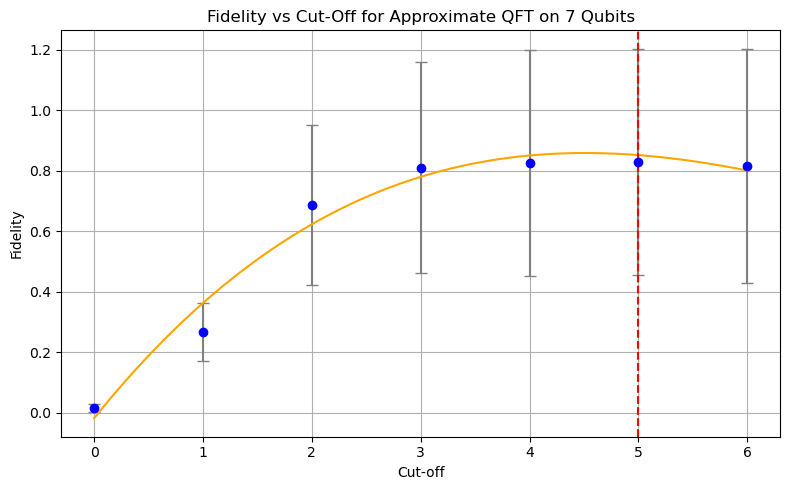

Maximum Fidelity: 0.8513 at cut-off ≈ 5.00
At non-integer cut off Maximum Fidelity: 0.8583 at cut-off ≈ 4.52


(5, 4.522613065326633)

In [643]:
poly_graph(7, 'random_sup', 0.999786, 0.99316, 1000,'Fidelity')

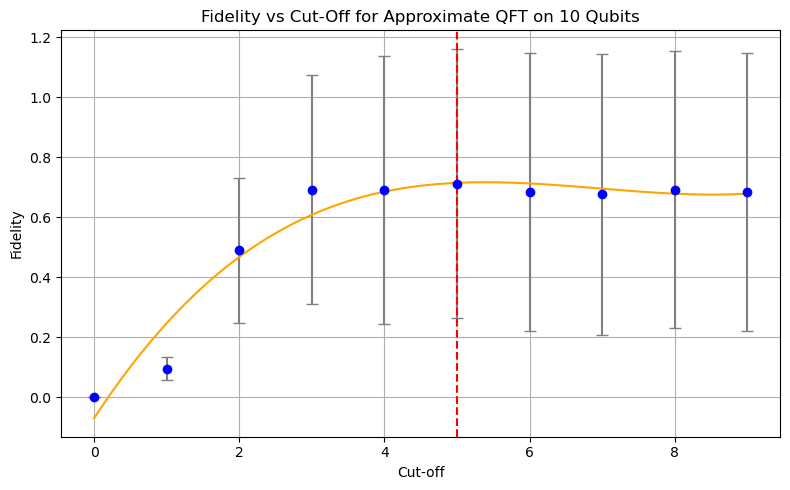

Maximum Fidelity: 0.7148 at cut-off ≈ 5.00
At non-integer cut off Maximum Fidelity: 0.7168 at cut-off ≈ 5.38


(5, 5.381909547738694)

In [675]:
poly_graph(10, 'random_sup', 0.999786, 0.99316, 1000,'Fidelity')

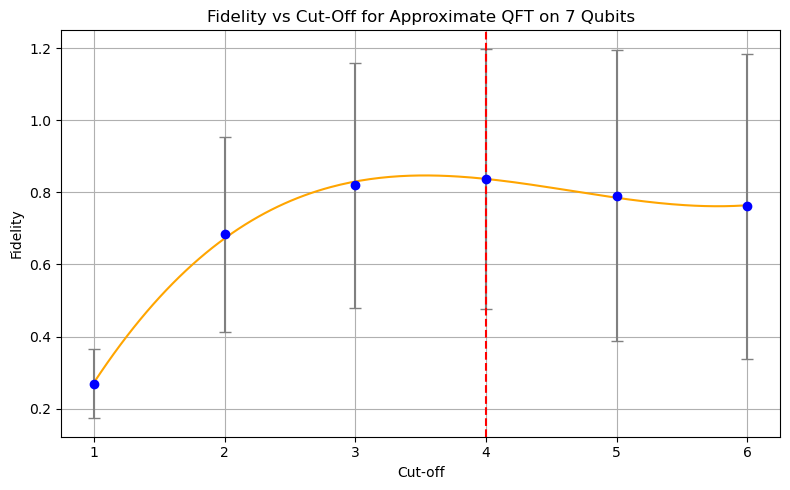

Maximum Fidelity: 0.8375 at cut-off ≈ 4.00
At non-integer cut off Maximum Fidelity: 0.8471 at cut-off ≈ 3.54


(4, 3.5376884422110555)

In [31]:
poly_graph(7, 'random_sup', 0.999786, 0.99316, 100,'Fidelity')

[0.2696090697281045, 0.6198834258199709, 0.9623280259175926, 0.5972556529261274, 0.999551594141965, 0.8000644017675913]


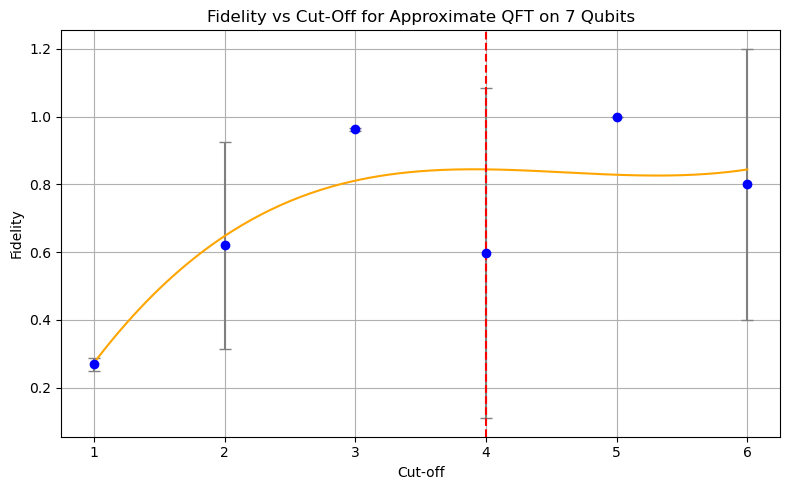

Maximum Fidelity: 0.8442 at cut-off ≈ 4.00
At non-integer cut off Maximum Fidelity: 0.8445 at cut-off ≈ 3.91


(4,
 3.9145728643216082,
 {1: [0.2450920744520654,
   0.28863231922669036,
   0.2854966449218802,
   0.24792835825684517,
   0.2808959517830412],
  2: [0.7679119787831361,
   0.7356804510481675,
   0.7812832770766325,
   0.011137894484386731,
   0.8034035277075319],
  3: [0.967629615288452,
   0.9601831811336446,
   0.961076884756983,
   0.968092524411604,
   0.9546579239972797],
  4: [0.99555236970809,
   0.9953062315462077,
   0.0005512354040127214,
   3.587486918099251e-05,
   0.9948325531031456],
  5: [0.9996228452076203,
   0.9994959472161657,
   0.9995433708290041,
   0.9995001083509748,
   0.9995956991060607],
  6: [0.9999999999999973,
   0.9999999999999973,
   0.00032200883796589176,
   0.9999999999999978,
   0.999999999999998]})

In [95]:
poly_graph(7, 'random_sup', 0.999786, 0.99316, 5,'Fidelity')

In [96]:
#checking if the extracting of files works
df = pd.read_csv("qft_results_7_qubits_0.99316_fidelity.csv")
print(df[df["Cut-off"] == 5])  # All trials for cut-off = 5
((df[df["Cut-off"] == 5]).sum())['Value']

    Cut-off  Trial     Value
20        5      0  0.999623
21        5      1  0.999496
22        5      2  0.999543
23        5      3  0.999500
24        5      4  0.999596


4.997757970709825

# Comparing Optimum Cut-off for Different Number of Qubits

In [24]:
def qubit_vs_cutoff(max_qubits, trials, fidelity_single, fidelity_mult):
    number_qubits=list(range(2,max_qubits+1)) # back to 2
    optimum_cut_offs=[]
    
    std_devs = []
    
    for qubits in number_qubits:
        opt_cut_off=poly_graph(qubits, 'random_sup', fidelity_single, fidelity_mult, trials,'Fidelity')[0] #use 0 for integer value and 1 for the non-integer value
        optimum_cut_offs.append(opt_cut_off)
        print(opt_cut_off)
    print(f"all optimum cutt-offs are {optimum_cut_offs}")    
        #if qubits>3:
            #plateau=poly_graph_exp(qubits, 'random_sup', fidelity_single, fidelity_mult, trials, 'Fidelity') #use 0 for integer value and 1 for the non-integer value        

    plt.figure()
    plt.scatter(number_qubits, optimum_cut_offs, marker='o', color='blue')
    plt.title(f'Optimum Cut-Off Point for QFT Applied on Different Number of Qubits')
    plt.xlabel('Number of Qubits')
    plt.ylabel(f'Optimum Cut Off')
    plt.grid(True)
    plt.show()

    # Fit polynomial (quadratic or cubic typically works well)
    degree = 3  # You can change to 2 or 4 if needed
    p_fit = np.polyfit(number_qubits, optimum_cut_offs, degree)
    poly = np.poly1d(p_fit)

    # Create smooth x values for the curve
    smooth_qubits = np.linspace(2, max(number_qubits), 200)
    smooth_optima = poly(smooth_qubits)



    plt.figure(figsize=(8, 5))
    plt.plot(number_qubits, optimum_cut_offs, 'o', color='blue')
    plt.plot(smooth_qubits, smooth_optima, '-', color='orange')
    plt.title(f'Optimum Cut-Off Point for QFT Applied on Different Number of Qubits')
    plt.xlabel('Number of Qubits')
    plt.ylabel(f'Optimum Cut Off')
    plt.grid(True)
    plt.tight_layout()
    plt.show()
    

    
    return(optimum_cut_offs)

    #shall I plot the integer or non-integer value?

C:\Users\20221753\AppData\Local\Temp\ipykernel_18680\3792844738.py:26: RankWarning: Polyfit may be poorly conditioned
  p_fit = np.polyfit(cut_offs, fidelities, degree)


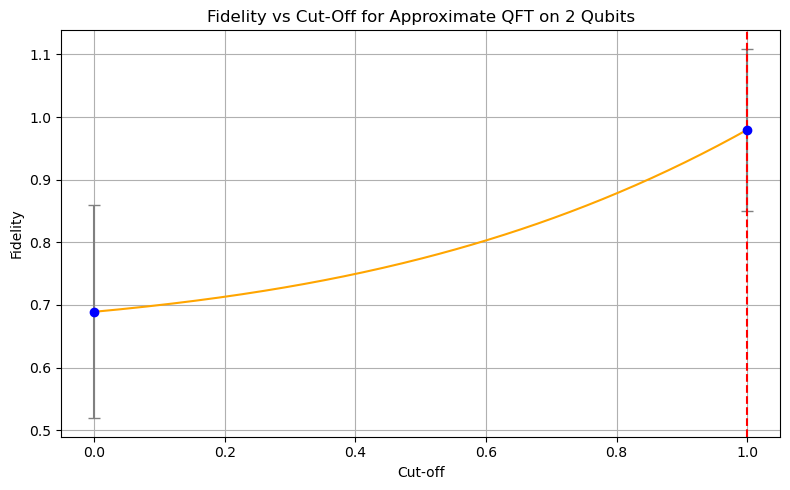

Maximum Fidelity: 0.9799 at cut-off ≈ 1.00
At non-integer cut off Maximum Fidelity: 0.9799 at cut-off ≈ 1.00


C:\Users\20221753\AppData\Local\Temp\ipykernel_18680\3792844738.py:26: RankWarning: Polyfit may be poorly conditioned
  p_fit = np.polyfit(cut_offs, fidelities, degree)


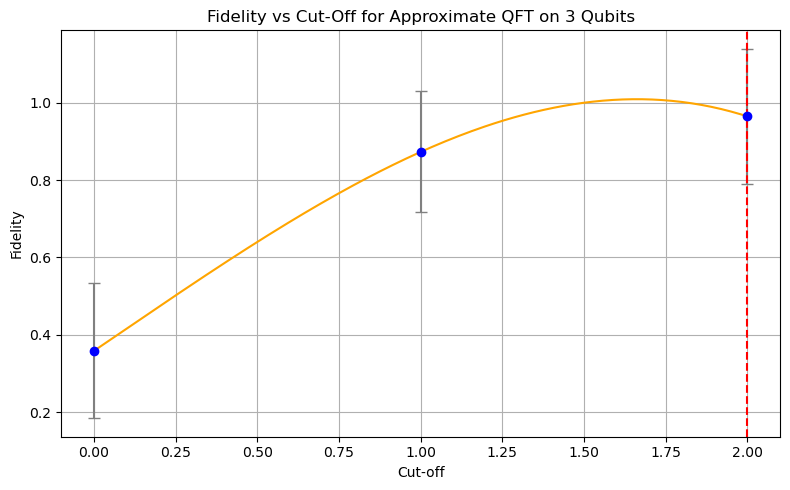

Maximum Fidelity: 0.9649 at cut-off ≈ 2.00
At non-integer cut off Maximum Fidelity: 1.0093 at cut-off ≈ 1.66


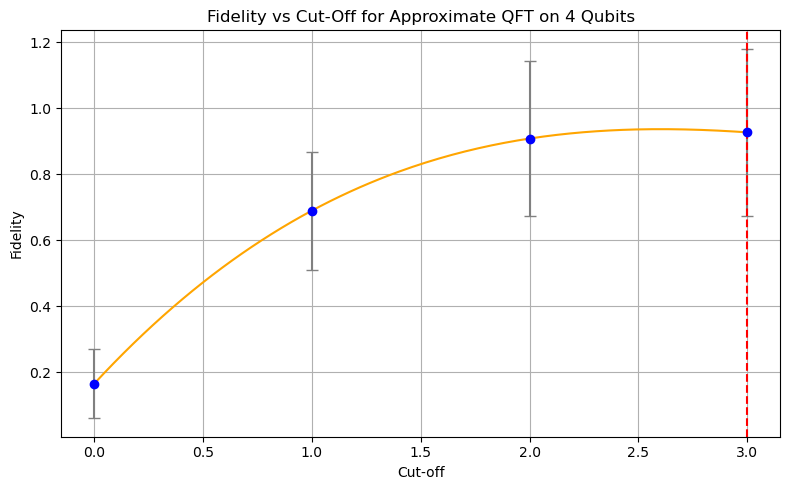

Maximum Fidelity: 0.9267 at cut-off ≈ 3.00
At non-integer cut off Maximum Fidelity: 0.9363 at cut-off ≈ 2.61


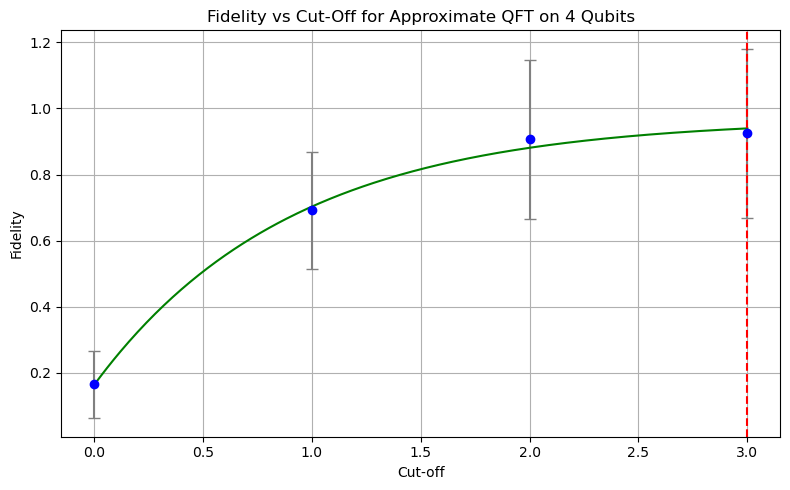

Plateau cutoff (where function flattens): ~3 (real ≈ 2.17)


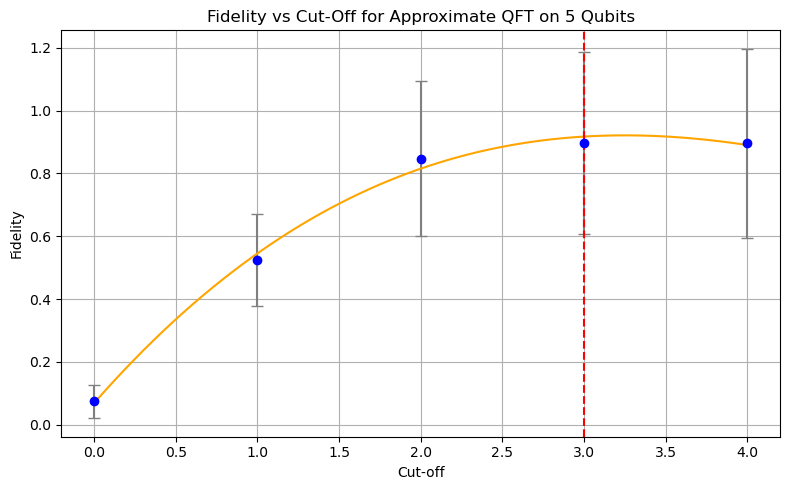

Maximum Fidelity: 0.9172 at cut-off ≈ 3.00
At non-integer cut off Maximum Fidelity: 0.9210 at cut-off ≈ 3.26


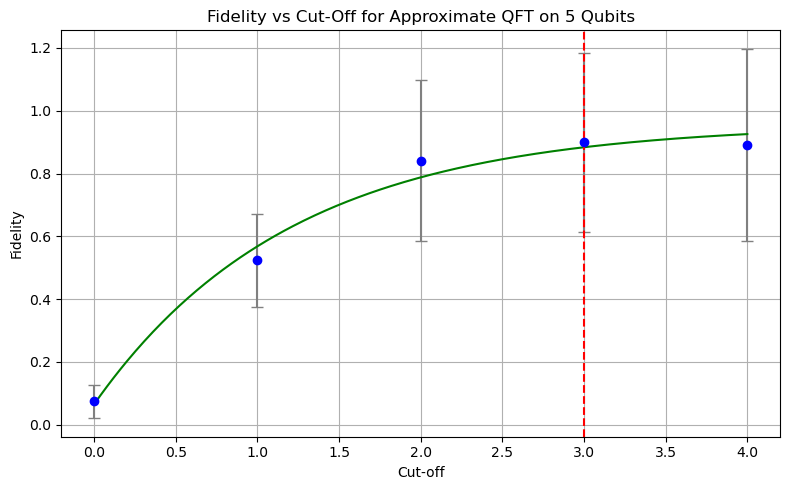

Plateau cutoff (where function flattens): ~3 (real ≈ 2.68)


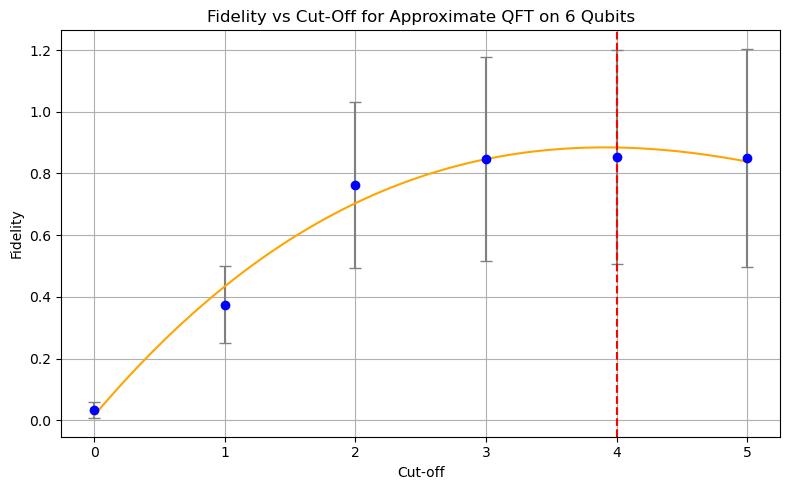

Maximum Fidelity: 0.8841 at cut-off ≈ 4.00
At non-integer cut off Maximum Fidelity: 0.8845 at cut-off ≈ 3.92


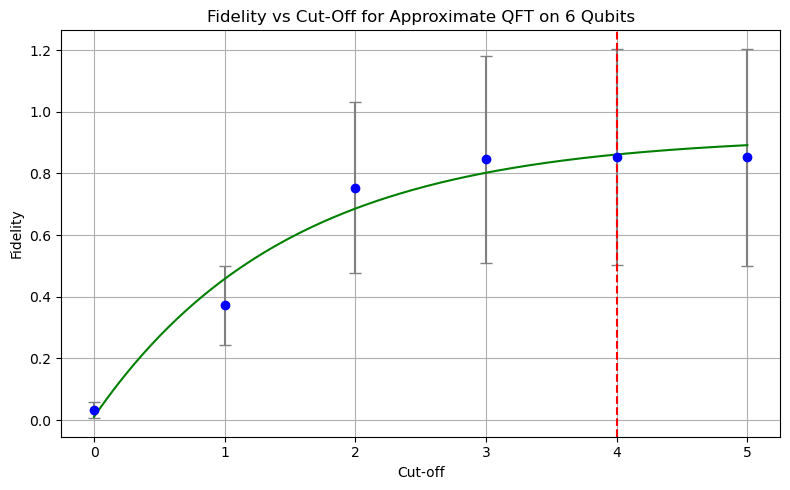

Plateau cutoff (where function flattens): ~4 (real ≈ 3.03)


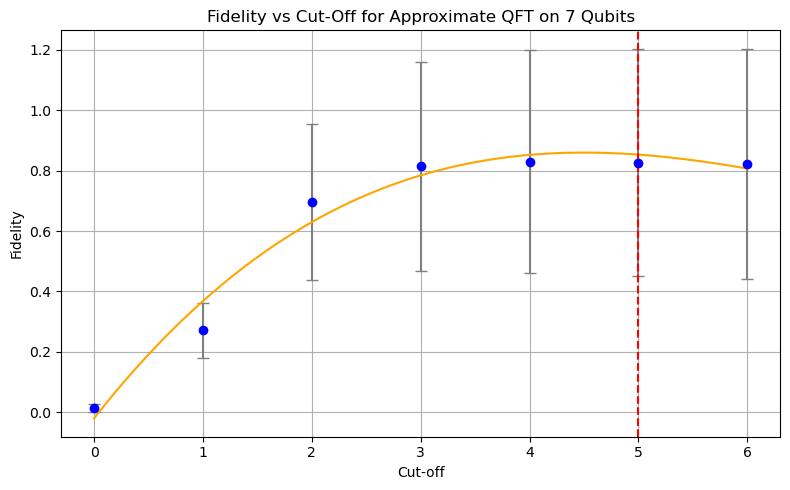

Maximum Fidelity: 0.8528 at cut-off ≈ 5.00
At non-integer cut off Maximum Fidelity: 0.8595 at cut-off ≈ 4.49


In [ ]:
qubit_vs_cutoff(max_qubits=12, trials=10000, fidelity_single=0.99978, fidelity_mult=0.99316)

[0.9999999999999993]


C:\Users\20221753\AppData\Local\Temp\ipykernel_12504\1617428785.py:27: RankWarning: Polyfit may be poorly conditioned
  p_fit = np.polyfit(cut_offs, fidelities, degree)


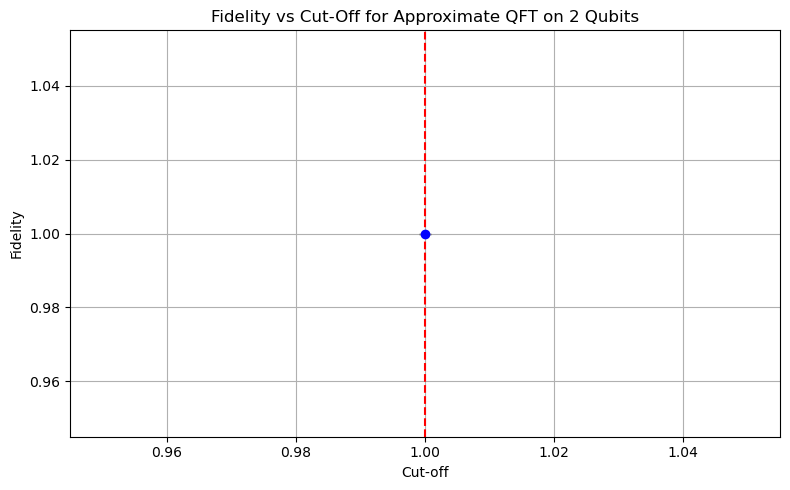

Maximum Fidelity: 1.0000 at cut-off ≈ 1.00
At non-integer cut off Maximum Fidelity: 1.0000 at cut-off ≈ 1.00
1
[0.8994041242050494, 0.9999999999999988]


C:\Users\20221753\AppData\Local\Temp\ipykernel_12504\1617428785.py:27: RankWarning: Polyfit may be poorly conditioned
  p_fit = np.polyfit(cut_offs, fidelities, degree)


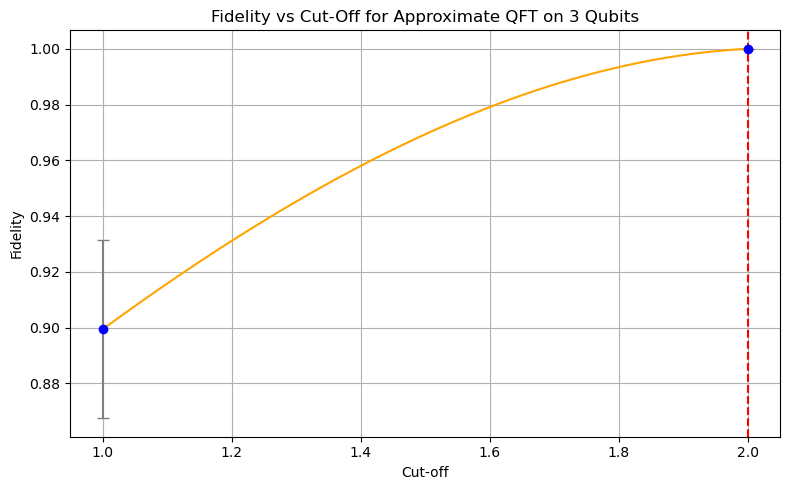

Maximum Fidelity: 1.0000 at cut-off ≈ 2.00
At non-integer cut off Maximum Fidelity: 1.0000 at cut-off ≈ 2.00
2
[0.4683785997340433, 0.7790173747323852, 0.9999999999999986]


C:\Users\20221753\AppData\Local\Temp\ipykernel_12504\1617428785.py:27: RankWarning: Polyfit may be poorly conditioned
  p_fit = np.polyfit(cut_offs, fidelities, degree)


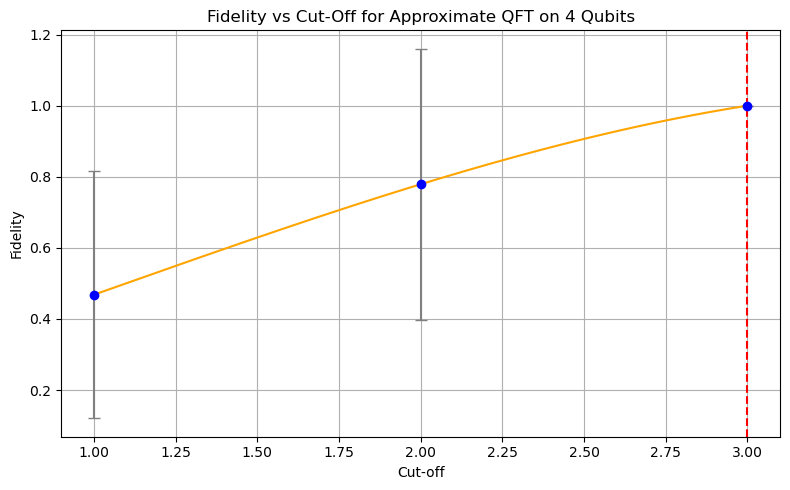

Maximum Fidelity: 1.0000 at cut-off ≈ 3.00
At non-integer cut off Maximum Fidelity: 1.0000 at cut-off ≈ 3.00
3
[0.5853023838954948, 0.9171968546682343, 0.9933375496334882, 0.9999999999999982]


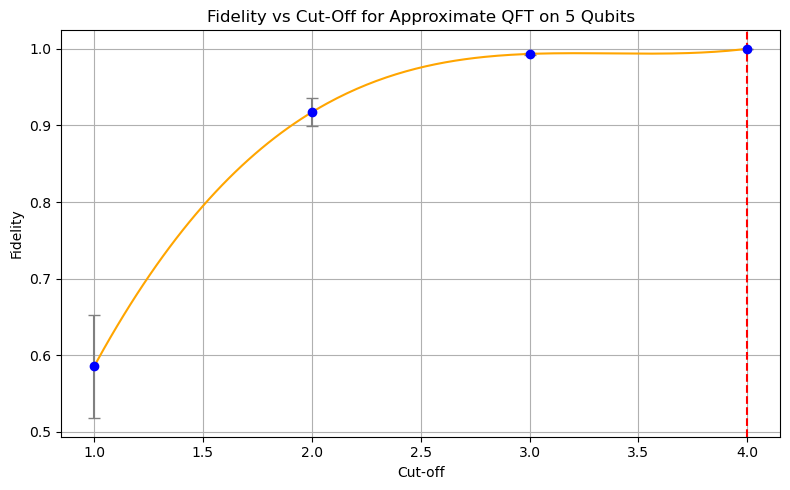

Maximum Fidelity: 1.0000 at cut-off ≈ 4.00
At non-integer cut off Maximum Fidelity: 1.0000 at cut-off ≈ 4.00
4
[0.3129365094443114, 0.8653119703352647, 0.7859663163255113, 0.9982320437879592, 0.6048893002696666]


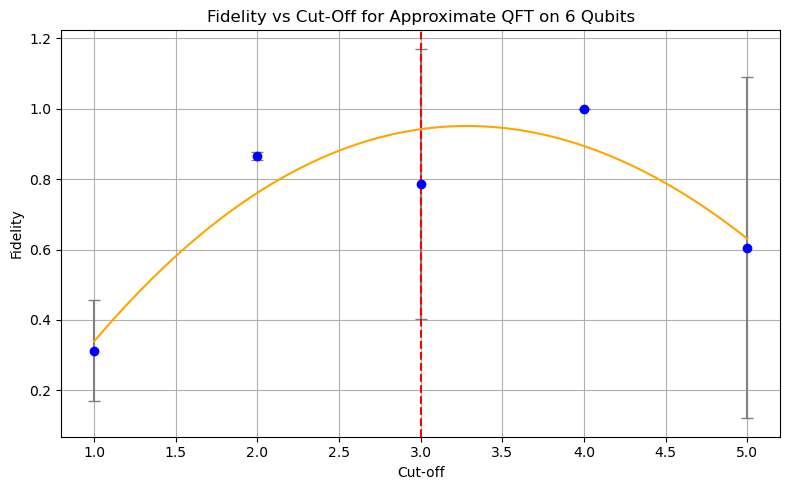

Maximum Fidelity: 0.9420 at cut-off ≈ 3.00
At non-integer cut off Maximum Fidelity: 0.9511 at cut-off ≈ 3.29
3
[0.23895390394675742, 0.6408534639969243, 0.9614602009326034, 0.9948794998625603, 0.40621560531694445, 0.6003090998698043]


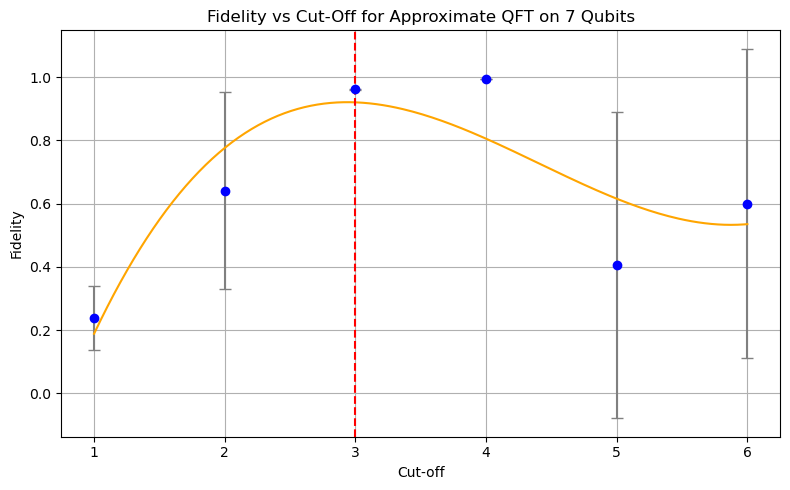

Maximum Fidelity: 0.9206 at cut-off ≈ 3.00
At non-integer cut off Maximum Fidelity: 0.9211 at cut-off ≈ 2.93
3
all optimum cutt-offs are [1, 2, 3, 4, 3, 3]


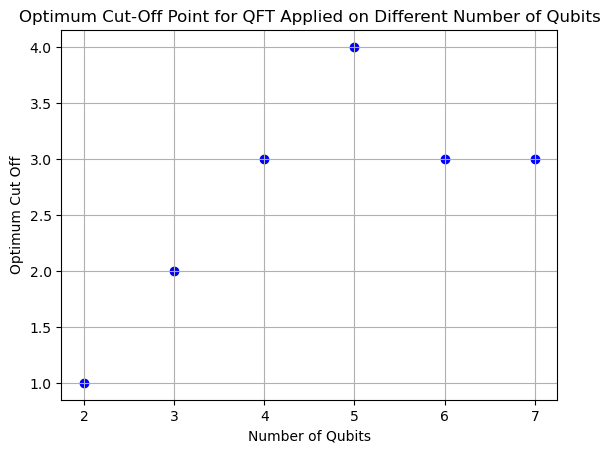

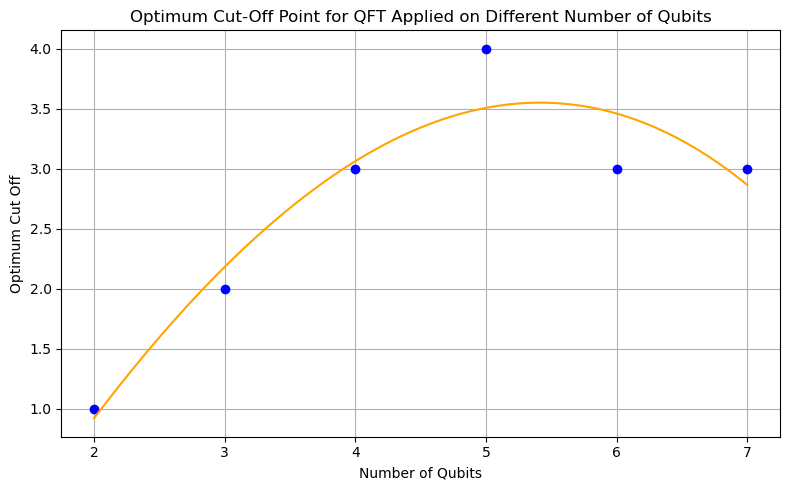

[1, 2, 3, 4, 3, 3]

In [55]:
qubit_vs_cutoff(max_qubits=7, trials=5, fidelity_single=0.99978, fidelity_mult=0.99316)

# Changing Fidelities

In [24]:
def qubits_vs_cutoff_diff_fidelity(max_qubits, trials, fidelities, fidelity_single=0.99978):
    
    qubits=list(range(2, max_qubits+1))
    plt.figure(figsize=(10, 6))
    
    all_opt_cut_offs=[]
    
    for target_fidelity in fidelities:
        trials_fidelity_test=100
        tolerance=1e-4
        max_iter=20
        fidelity_mult=binary_search_pauli_prob(3, target_fidelity, trials_fidelity_test, 'multi', tolerance=1e-4, max_iter=20)
        print(f'Pauli prob is {fidelity_mult} for target fidelity {target_fidelity}')
        
        optimum_cut_offs=qubit_vs_cutoff(max_qubits, trials, fidelity_single, fidelity_mult)
        print(f"Optimum Cut offs for fidelity {target_fidelity}: {optimum_cut_offs}")
        
        all_opt_cut_offs.append(optimum_cut_offs)
    
    
    for opt_cutoffs, target_fidelity in zip(all_opt_cut_offs, fidelities):
        plt.plot(qubits, opt_cutoffs, marker='o', label=f'{target_fidelity}')
    
    plt.xlabel("Number of Qubits")
    plt.ylabel("Optimum Cut-Off")
    plt.title("Optimum Cut-Off vs Number of Qubits for Different Target Fidelities")
    plt.legend(title="Target Fidelity")
    plt.grid(True)
    plt.tight_layout()
    plt.show()
        
        

Pauli prob is 0.9378056526184082 for target fidelity 0.9


C:\Users\20221753\AppData\Local\Temp\ipykernel_18680\4268912252.py:18: RankWarning: Polyfit may be poorly conditioned
  p_fit = np.polyfit(cut_offs, fidelities, degree)


<Figure size 1000x600 with 0 Axes>

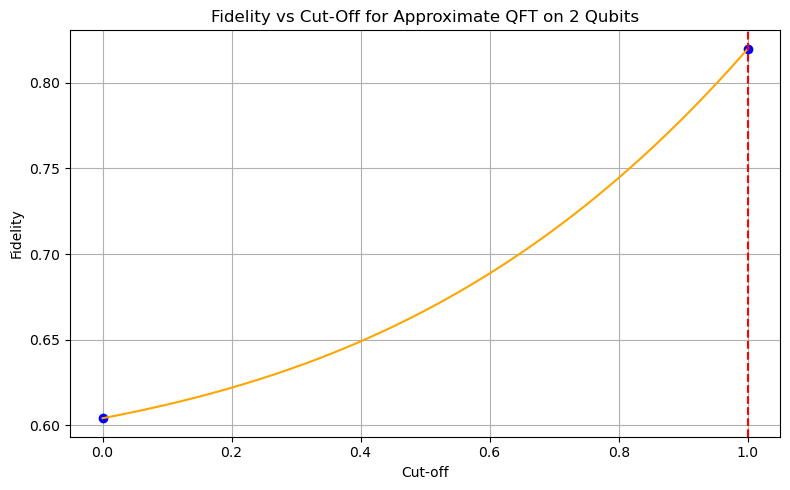

Maximum Fidelity: 0.8198 at cut-off ≈ 1.00
At non-integer cut off Maximum Fidelity: 0.8198 at cut-off ≈ 1.00


C:\Users\20221753\AppData\Local\Temp\ipykernel_18680\4268912252.py:18: RankWarning: Polyfit may be poorly conditioned
  p_fit = np.polyfit(cut_offs, fidelities, degree)


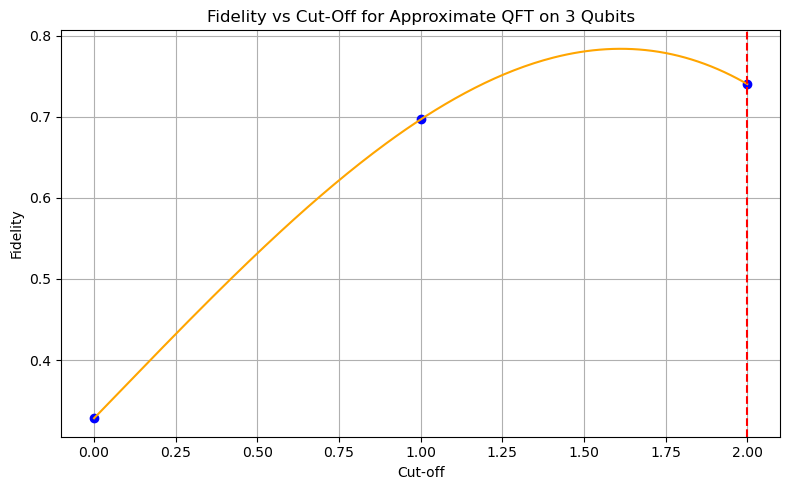

Maximum Fidelity: 0.7401 at cut-off ≈ 2.00
At non-integer cut off Maximum Fidelity: 0.7836 at cut-off ≈ 1.61


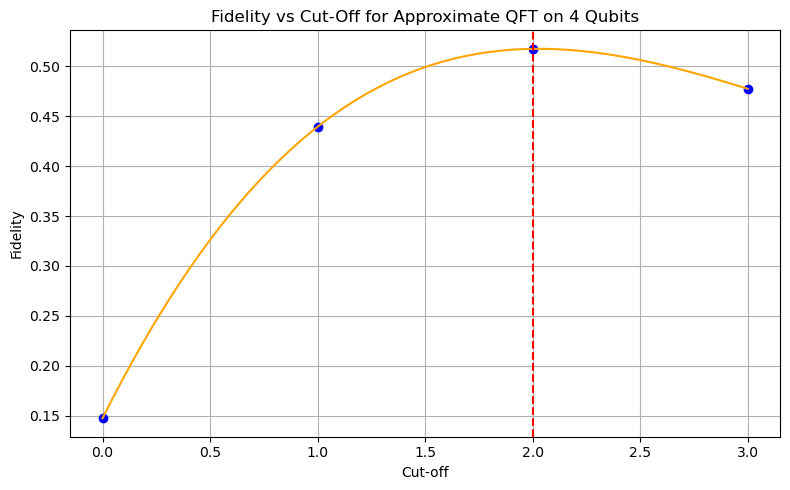

Maximum Fidelity: 0.5176 at cut-off ≈ 2.00
At non-integer cut off Maximum Fidelity: 0.5177 at cut-off ≈ 2.02


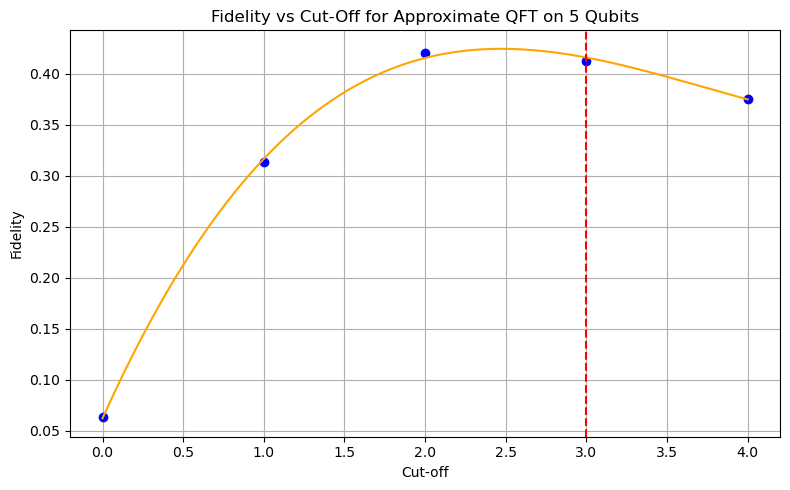

Maximum Fidelity: 0.4158 at cut-off ≈ 3.00
At non-integer cut off Maximum Fidelity: 0.4243 at cut-off ≈ 2.47


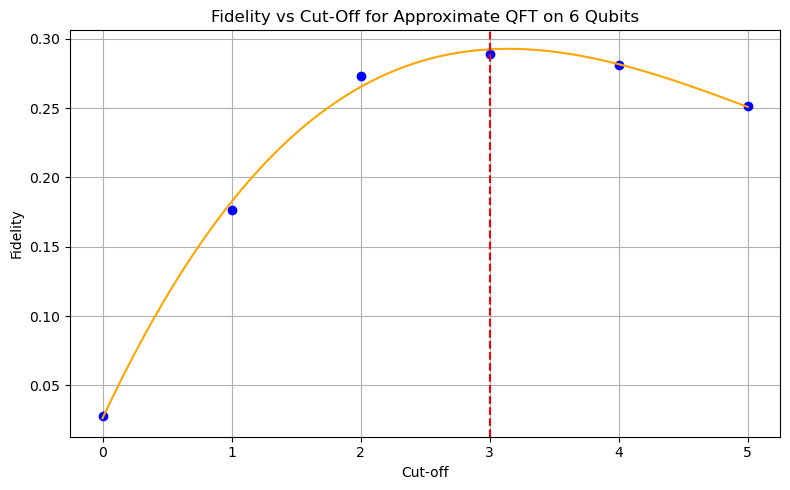

Maximum Fidelity: 0.2923 at cut-off ≈ 3.00
At non-integer cut off Maximum Fidelity: 0.2927 at cut-off ≈ 3.14


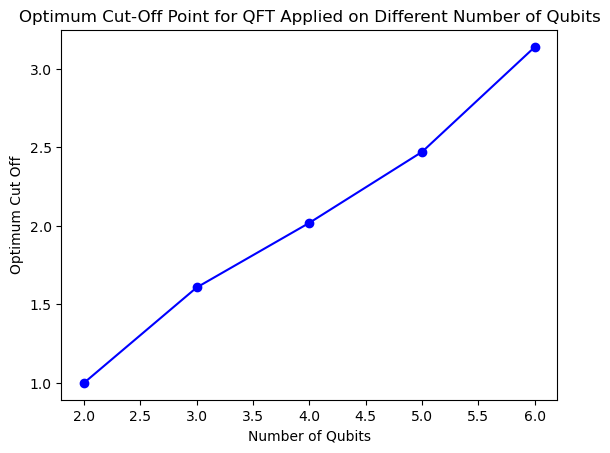

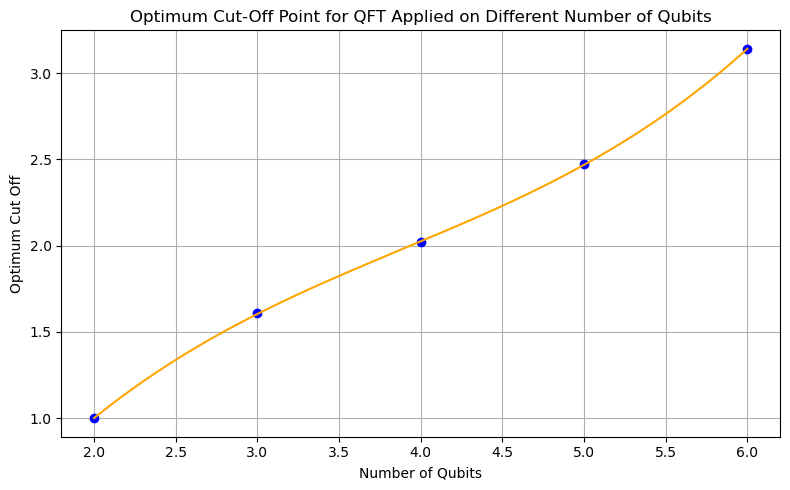

Optimum Cut offs for fidelity 0.9: [1.0, 1.6080402010050252, 2.020100502512563, 2.472361809045226, 3.14070351758794]
Pauli prob is 0.924802303314209 for target fidelity 0.95


C:\Users\20221753\AppData\Local\Temp\ipykernel_18680\4268912252.py:18: RankWarning: Polyfit may be poorly conditioned
  p_fit = np.polyfit(cut_offs, fidelities, degree)


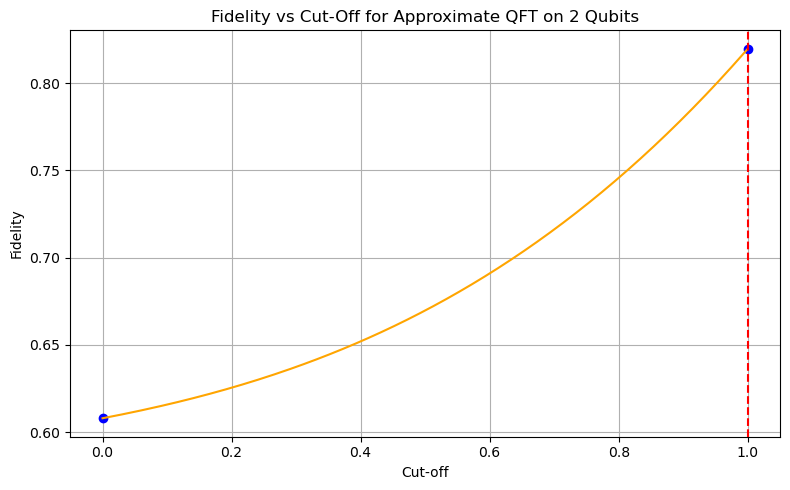

Maximum Fidelity: 0.8197 at cut-off ≈ 1.00
At non-integer cut off Maximum Fidelity: 0.8197 at cut-off ≈ 1.00


C:\Users\20221753\AppData\Local\Temp\ipykernel_18680\4268912252.py:18: RankWarning: Polyfit may be poorly conditioned
  p_fit = np.polyfit(cut_offs, fidelities, degree)


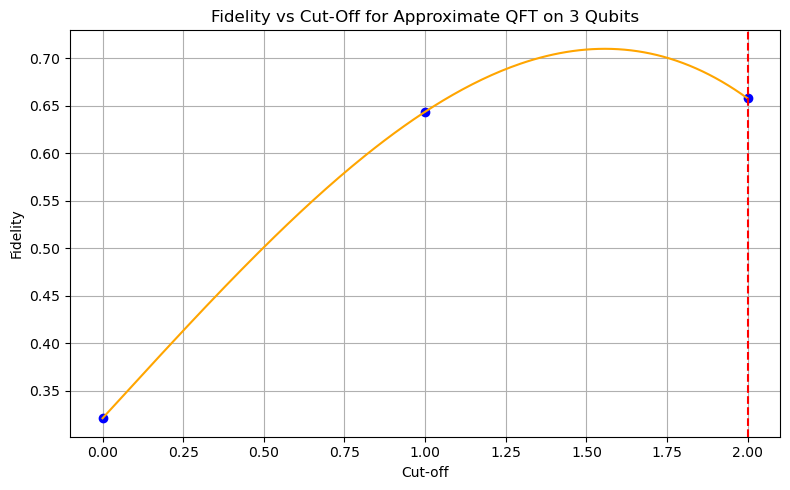

Maximum Fidelity: 0.6578 at cut-off ≈ 2.00
At non-integer cut off Maximum Fidelity: 0.7102 at cut-off ≈ 1.56


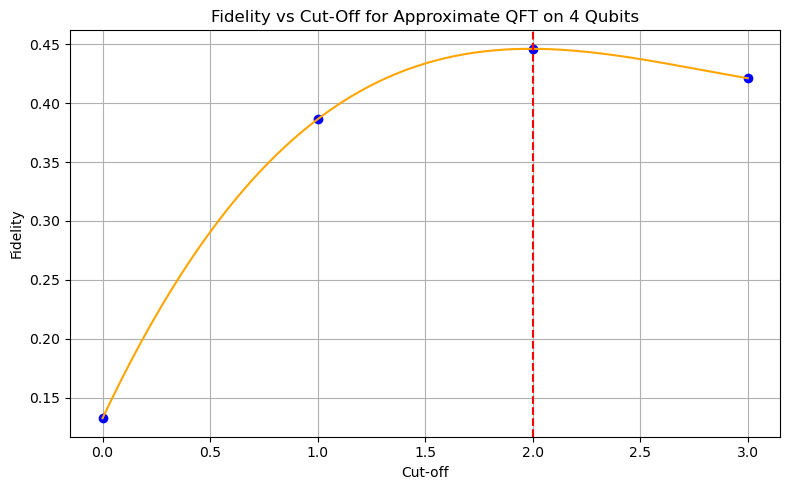

Maximum Fidelity: 0.4462 at cut-off ≈ 2.00
At non-integer cut off Maximum Fidelity: 0.4462 at cut-off ≈ 1.99


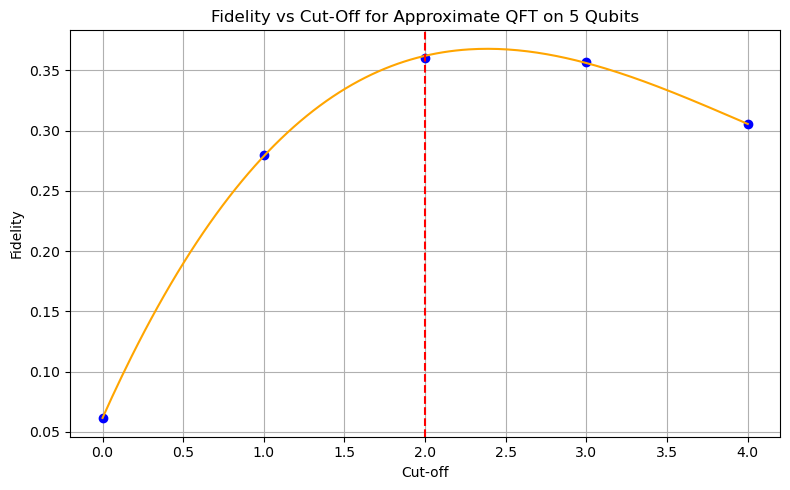

Maximum Fidelity: 0.3621 at cut-off ≈ 2.00
At non-integer cut off Maximum Fidelity: 0.3679 at cut-off ≈ 2.39


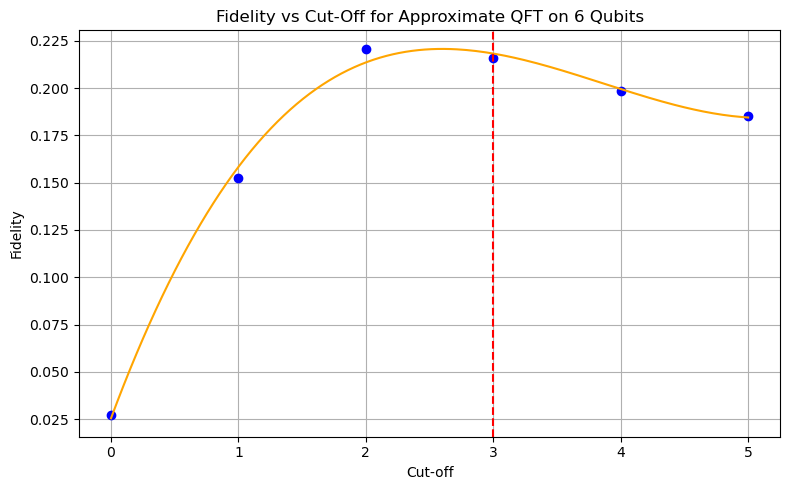

Maximum Fidelity: 0.2182 at cut-off ≈ 3.00
At non-integer cut off Maximum Fidelity: 0.2207 at cut-off ≈ 2.59


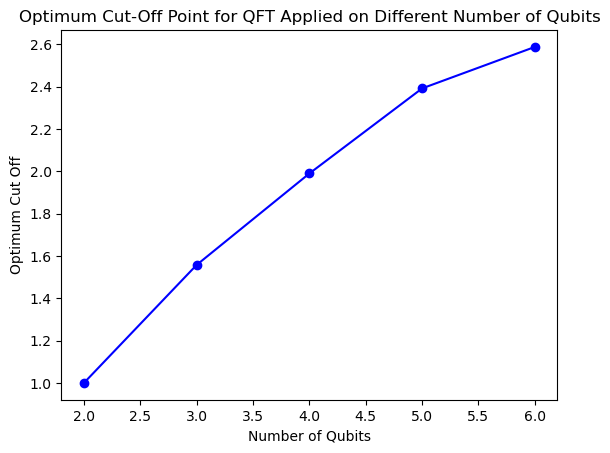

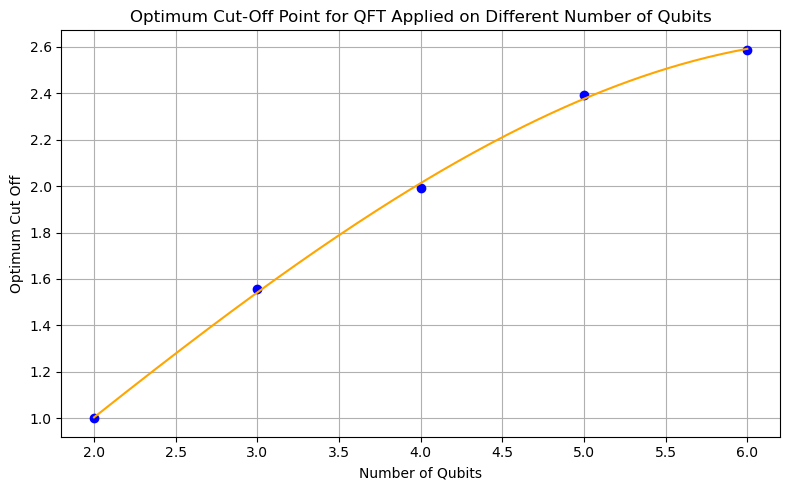

Optimum Cut offs for fidelity 0.95: [1.0, 1.5577889447236182, 1.9899497487437185, 2.391959798994975, 2.5879396984924625]


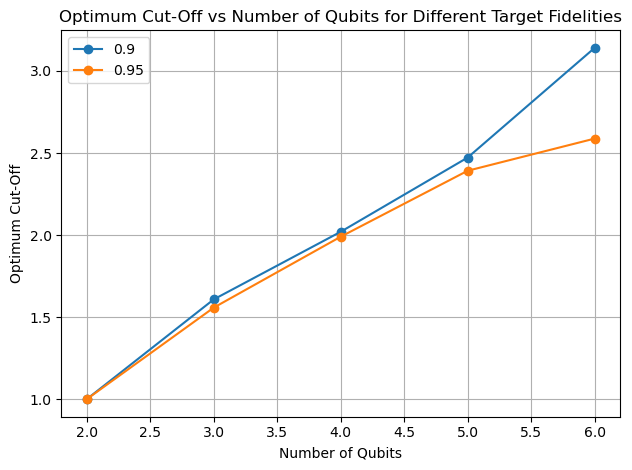

In [629]:
qubits_vs_cutoff_diff_fidelity(max_qubits=6, trials=1000, fidelities=[0.9, 0.95], fidelity_single=0.99978)

Pauli prob is 0.9765629768371582 for target fidelity 0.974
Pauli prob is 0.9699358940124512 for target fidelity 0.974
Pauli prob is 0.9627375602722168 for target fidelity 0.974
Pauli prob is 0.9674601554870605 for target fidelity 0.974
Pauli prob is 0.9678826332092285 for target fidelity 0.974
Pauli prob is 0.9693894386291504 for target fidelity 0.974
Pauli prob is 0.9728856086730957 for target fidelity 0.974
Pauli prob is 0.9713826179504395 for target fidelity 0.974
Pauli prob is 0.9723038673400879 for target fidelity 0.974
Pauli prob is 0.9675240516662598 for target fidelity 0.974
0.9698064804077149
[0.9080365793732841]


C:\Users\20221753\AppData\Local\Temp\ipykernel_12504\1721594825.py:31: RankWarning: Polyfit may be poorly conditioned
  p_fit = np.polyfit(cut_offs, fidelities, degree)


<Figure size 1000x600 with 0 Axes>

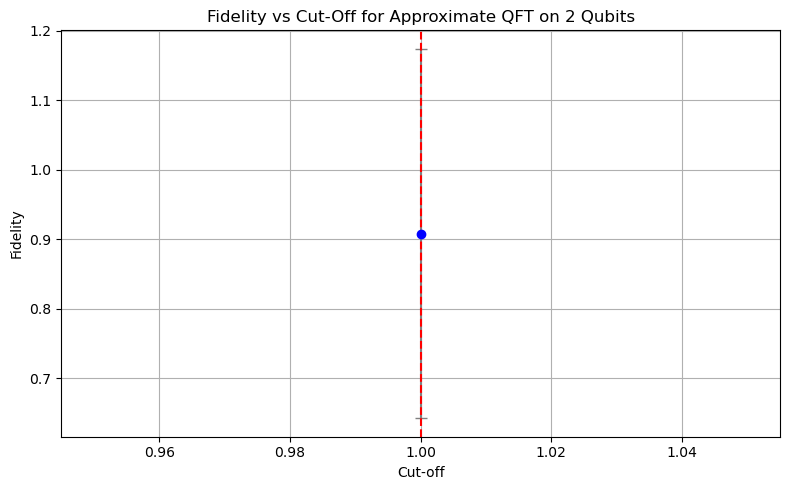

Maximum Fidelity: 0.9080 at cut-off ≈ 1.00
At non-integer cut off Maximum Fidelity: 0.9080 at cut-off ≈ 1.00
1
[0.7934772904318925, 0.8532930749484432]


C:\Users\20221753\AppData\Local\Temp\ipykernel_12504\1721594825.py:31: RankWarning: Polyfit may be poorly conditioned
  p_fit = np.polyfit(cut_offs, fidelities, degree)


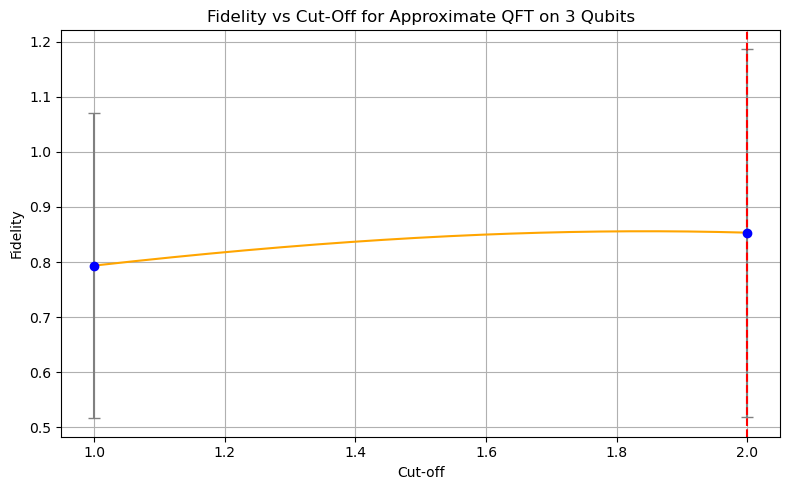

Maximum Fidelity: 0.8533 at cut-off ≈ 2.00
At non-integer cut off Maximum Fidelity: 0.8559 at cut-off ≈ 1.84
2
[0.56807753086426, 0.7129859748933313, 0.7152196753590208]


C:\Users\20221753\AppData\Local\Temp\ipykernel_12504\1721594825.py:31: RankWarning: Polyfit may be poorly conditioned
  p_fit = np.polyfit(cut_offs, fidelities, degree)


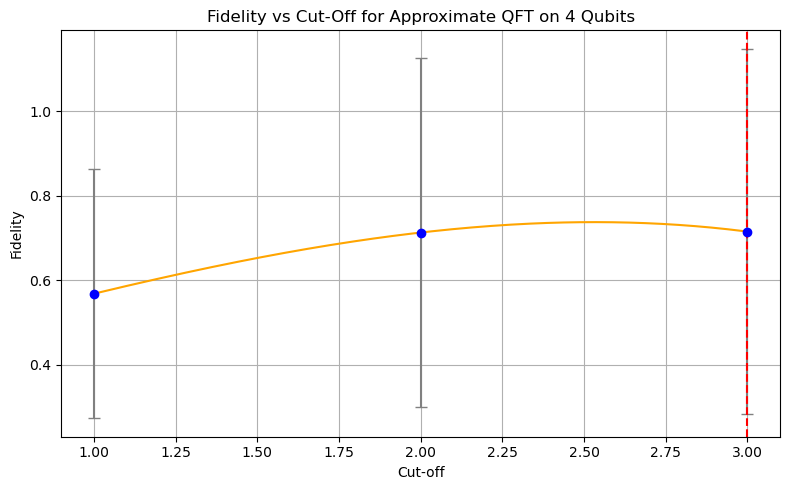

Maximum Fidelity: 0.7152 at cut-off ≈ 3.00
At non-integer cut off Maximum Fidelity: 0.7377 at cut-off ≈ 2.53
3
[0.41661807489849295, 0.6310412482394436, 0.6468450130616449, 0.633281347033805]


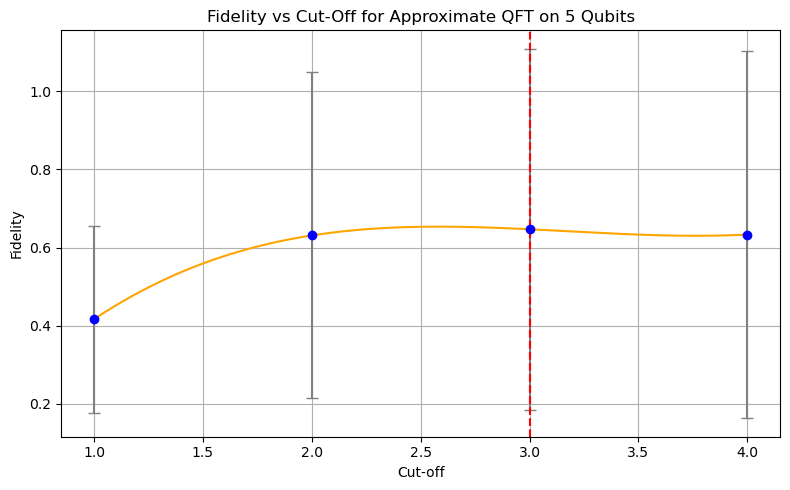

Maximum Fidelity: 0.6468 at cut-off ≈ 3.00
At non-integer cut off Maximum Fidelity: 0.6535 at cut-off ≈ 2.58
3
[0.27941527325568505, 0.5094108088212738, 0.5203909433244814, 0.5148037054739076, 0.494812786813688]


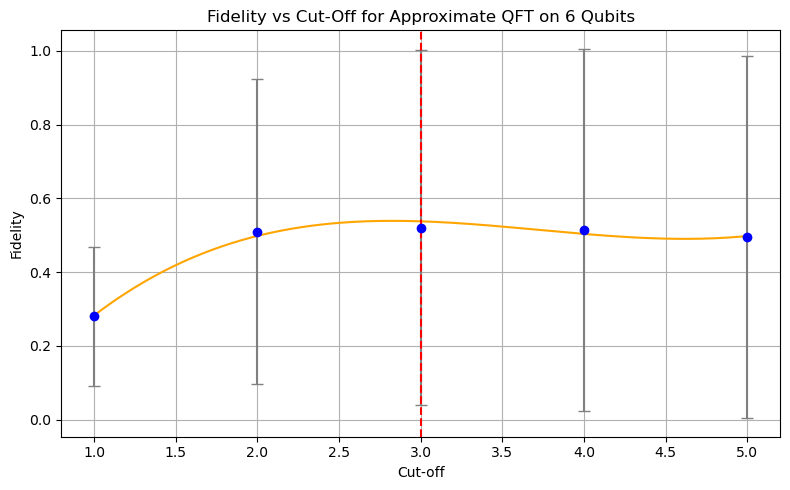

Maximum Fidelity: 0.5376 at cut-off ≈ 3.00
At non-integer cut off Maximum Fidelity: 0.5388 at cut-off ≈ 2.83
3
[0.19639305976360424, 0.43096782171160003, 0.4661936953289157, 0.4414856487002439, 0.4286725562284548, 0.40771889736440364]


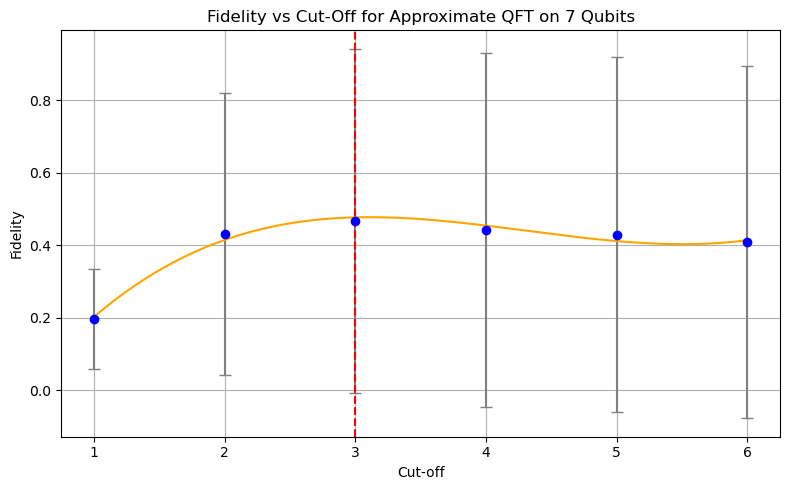

Maximum Fidelity: 0.4766 at cut-off ≈ 3.00
At non-integer cut off Maximum Fidelity: 0.4771 at cut-off ≈ 3.11
3
[0.12473236093215359, 0.3336286970456911, 0.3817537491147126, 0.35621662007765464, 0.3367112715867595, 0.3105848258772543, 0.3068006591812605]


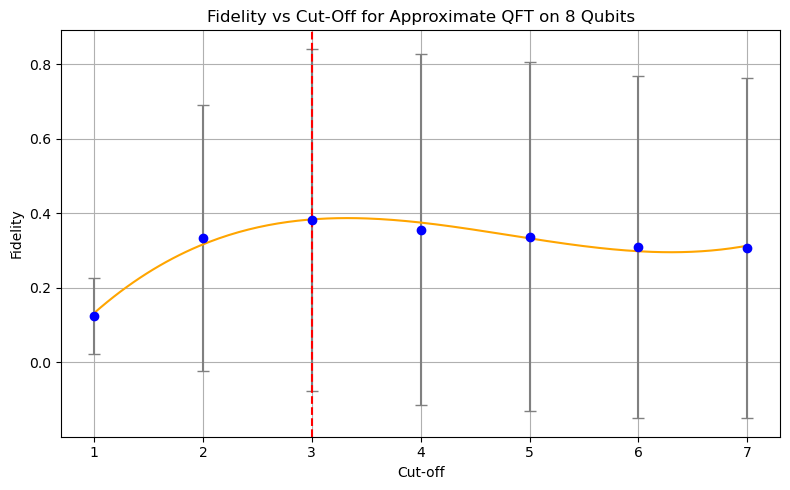

Maximum Fidelity: 0.3835 at cut-off ≈ 3.00
At non-integer cut off Maximum Fidelity: 0.3870 at cut-off ≈ 3.32
3
[0.08787859386592105, 0.2977372609070963, 0.34290734579538573, 0.3152063975393301, 0.28127904638753326, 0.27220040414652935, 0.2586229394508361, 0.23599515336043828]


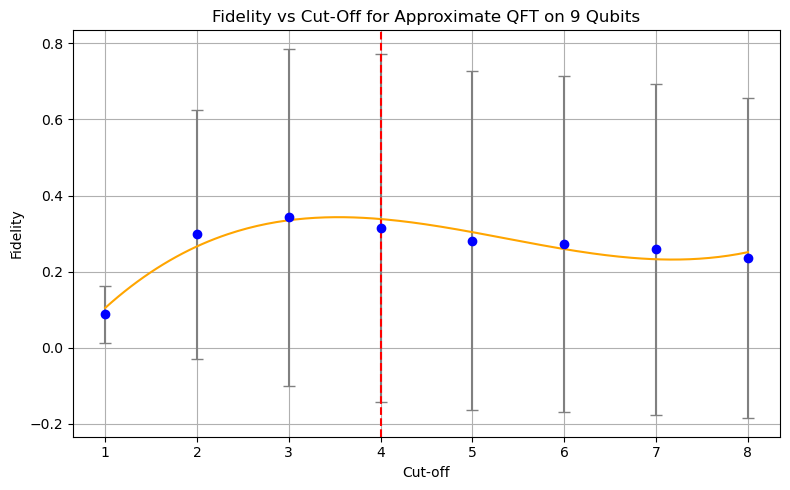

Maximum Fidelity: 0.3384 at cut-off ≈ 4.00
At non-integer cut off Maximum Fidelity: 0.3432 at cut-off ≈ 3.53
4
[0.055537590376644935, 0.2411075094373408, 0.27527229874096676, 0.25717364375610885, 0.2212875319461792, 0.20159428465046134, 0.18617765313868379, 0.1738986339527069, 0.16977725269108251]


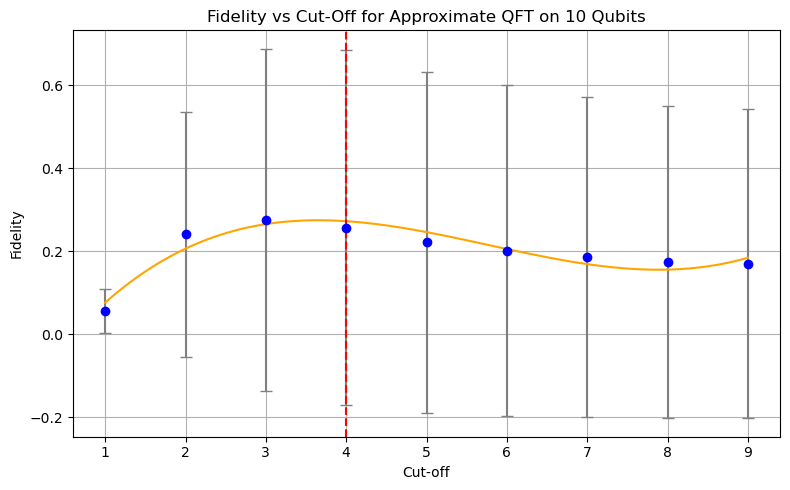

Maximum Fidelity: 0.2726 at cut-off ≈ 4.00
At non-integer cut off Maximum Fidelity: 0.2749 at cut-off ≈ 3.65
4
all optimum cutt-offs are [1, 2, 3, 3, 3, 3, 3, 4, 4]


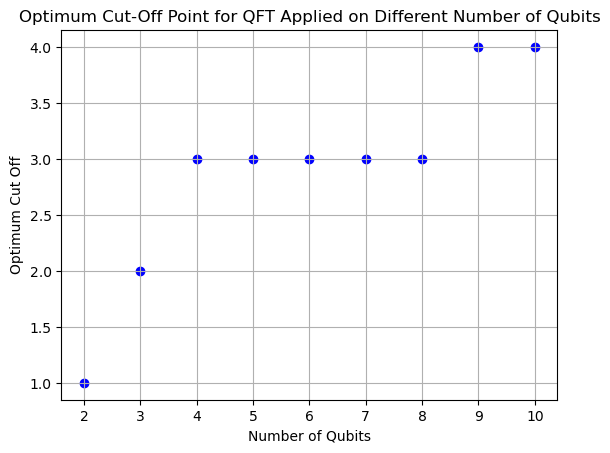

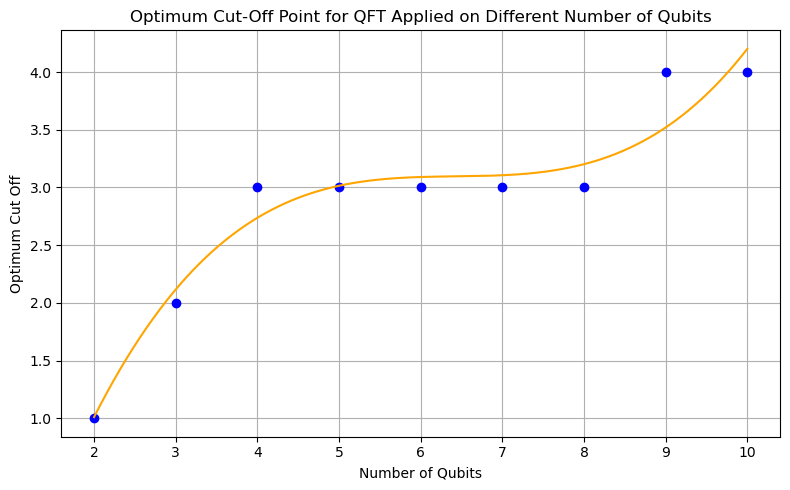

Pauli prob is 0.9935164451599121 for target fidelity 0.995
Pauli prob is 0.9953694343566895 for target fidelity 0.995
Pauli prob is 0.9916834831237793 for target fidelity 0.995
Pauli prob is 0.9916987419128418 for target fidelity 0.995
Pauli prob is 0.99609375 for target fidelity 0.995
Pauli prob is 0.9931139945983887 for target fidelity 0.995
Pauli prob is 0.9943733215332031 for target fidelity 0.995
Pauli prob is 0.9957318305969238 for target fidelity 0.995
Pauli prob is 0.9921259880065918 for target fidelity 0.995
Pauli prob is 0.9962010383605957 for target fidelity 0.995
0.9939908027648926
[0.9773143312254641]


C:\Users\20221753\AppData\Local\Temp\ipykernel_12504\1721594825.py:31: RankWarning: Polyfit may be poorly conditioned
  p_fit = np.polyfit(cut_offs, fidelities, degree)


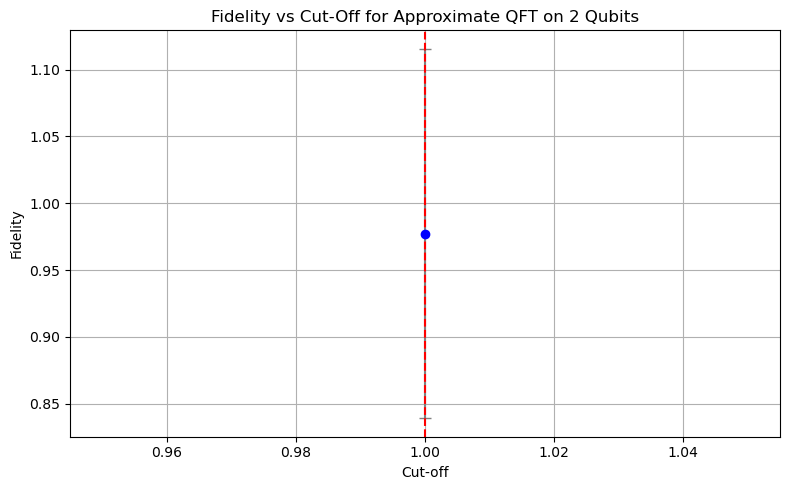

Maximum Fidelity: 0.9773 at cut-off ≈ 1.00
At non-integer cut off Maximum Fidelity: 0.9773 at cut-off ≈ 1.00
1
[0.8795877014585127, 0.965611101144814]


C:\Users\20221753\AppData\Local\Temp\ipykernel_12504\1721594825.py:31: RankWarning: Polyfit may be poorly conditioned
  p_fit = np.polyfit(cut_offs, fidelities, degree)


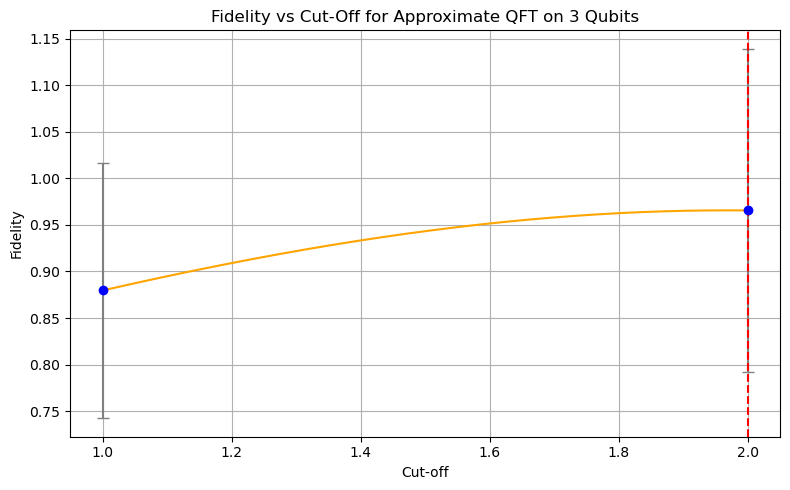

Maximum Fidelity: 0.9656 at cut-off ≈ 2.00
At non-integer cut off Maximum Fidelity: 0.9657 at cut-off ≈ 1.96
2
[0.6965459706636908, 0.9121079476753319, 0.9365300930788691]


C:\Users\20221753\AppData\Local\Temp\ipykernel_12504\1721594825.py:31: RankWarning: Polyfit may be poorly conditioned
  p_fit = np.polyfit(cut_offs, fidelities, degree)


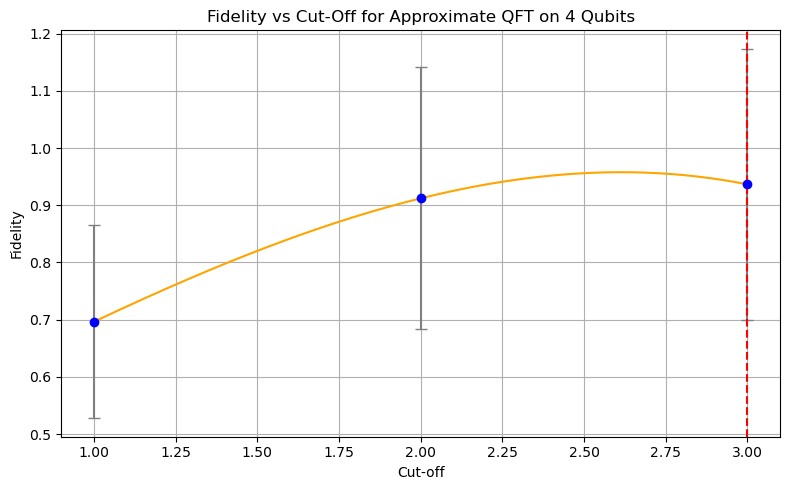

Maximum Fidelity: 0.9365 at cut-off ≈ 3.00
At non-integer cut off Maximum Fidelity: 0.9578 at cut-off ≈ 2.62
3
[0.5284381306813353, 0.8560354704137286, 0.9092256118007772, 0.9119547111811575]


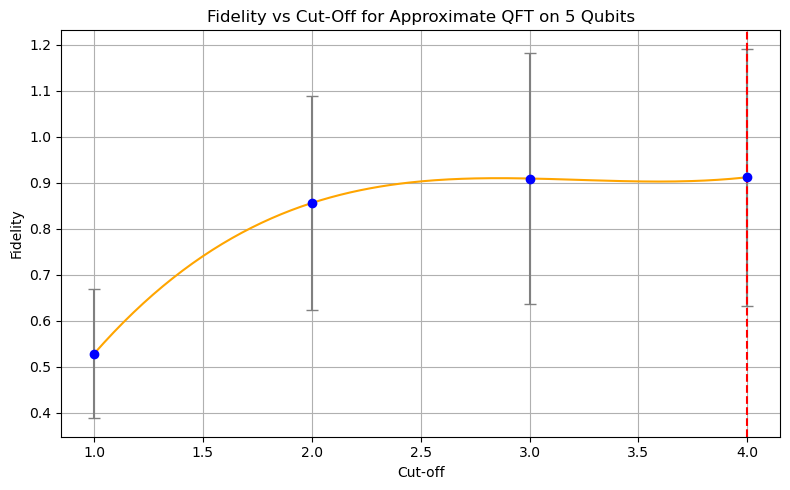

Maximum Fidelity: 0.9120 at cut-off ≈ 4.00
At non-integer cut off Maximum Fidelity: 0.9120 at cut-off ≈ 4.00
4
[0.37772541198787096, 0.7715414727323157, 0.8648152260663821, 0.8652288159724764, 0.8657364086617106]


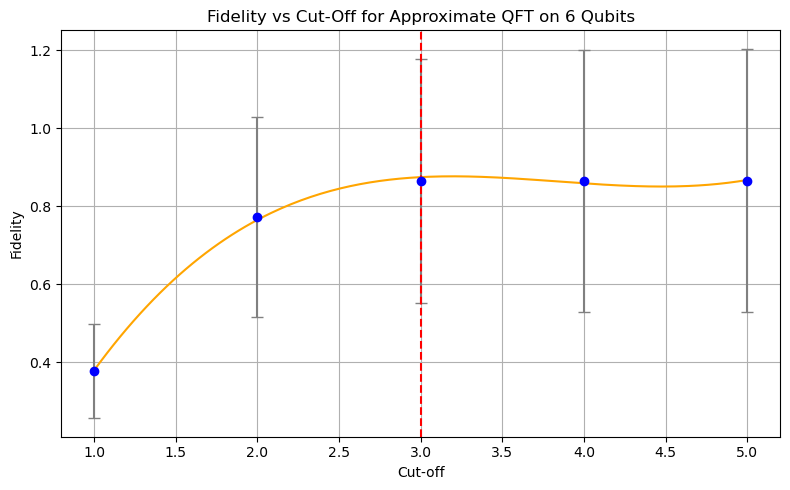

Maximum Fidelity: 0.8746 at cut-off ≈ 3.00
At non-integer cut off Maximum Fidelity: 0.8767 at cut-off ≈ 3.19
3
[0.27083385850806807, 0.7017621673811555, 0.8318932499950652, 0.8477766545775312, 0.835868668691058, 0.8450817475982196]


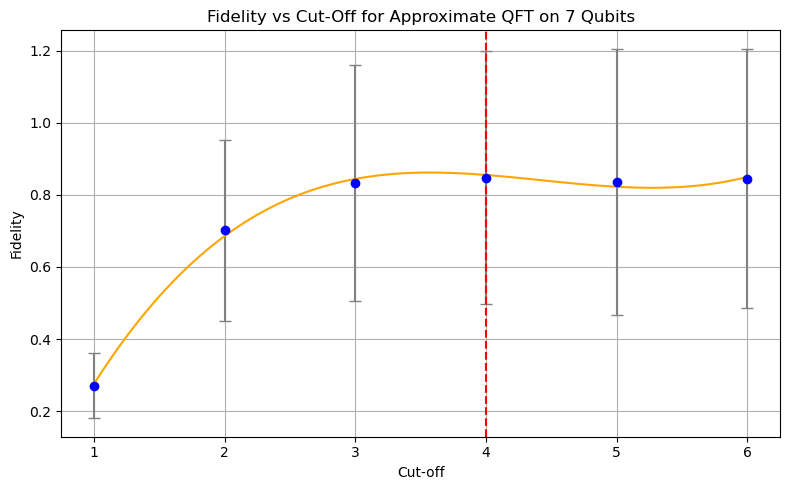

Maximum Fidelity: 0.8551 at cut-off ≈ 4.00
At non-integer cut off Maximum Fidelity: 0.8618 at cut-off ≈ 3.56
4
[0.19105678473728877, 0.6286965085077822, 0.7802331544503576, 0.8099546889997742, 0.7990850691107103, 0.7942064026427487, 0.782177365450331]


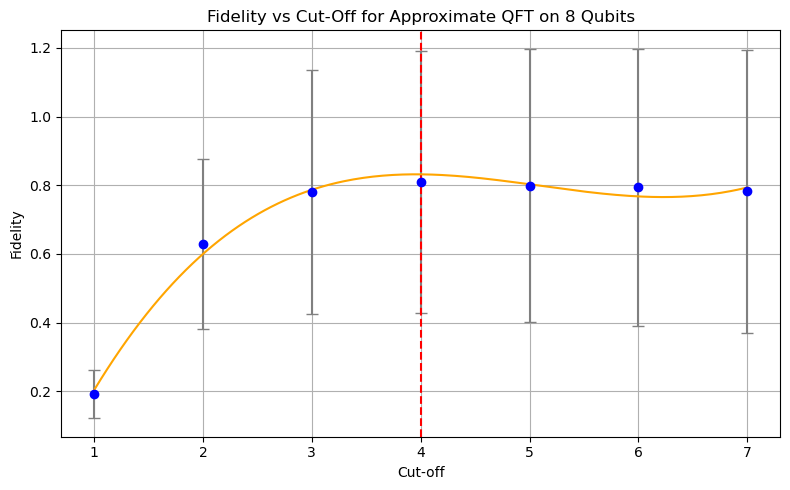

Maximum Fidelity: 0.8318 at cut-off ≈ 4.00
At non-integer cut off Maximum Fidelity: 0.8319 at cut-off ≈ 3.95
4
[0.13597171427828122, 0.5708392023538637, 0.7598675144543867, 0.7846743926750085, 0.7672632948055478, 0.7610219272285161, 0.7479119691818557, 0.7501790825791707]


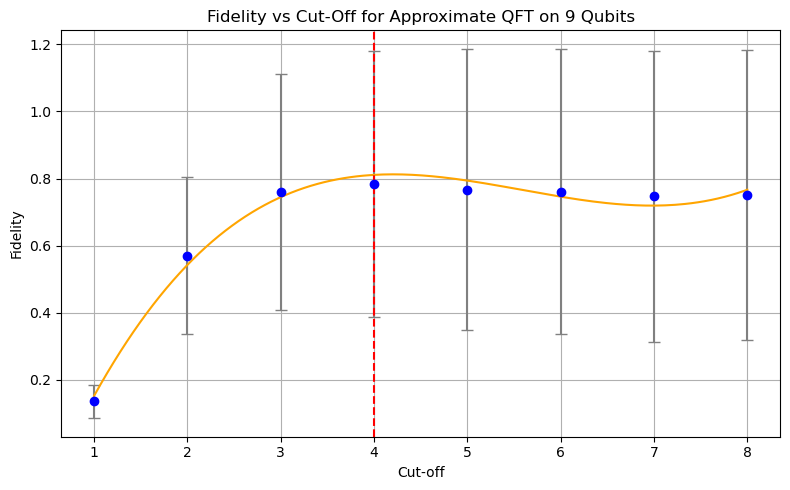

Maximum Fidelity: 0.8111 at cut-off ≈ 4.00
At non-integer cut off Maximum Fidelity: 0.8127 at cut-off ≈ 4.20
4
[0.09576426212460547, 0.5025759792072287, 0.7135317847172553, 0.7455438906412525, 0.7340389888963931, 0.7170087261513939, 0.7022423069481358, 0.6944270763181399, 0.6933408139246051]


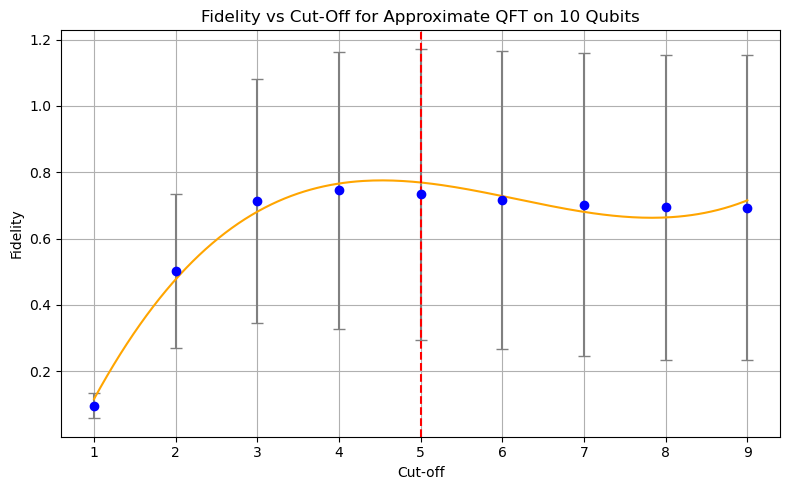

Maximum Fidelity: 0.7692 at cut-off ≈ 5.00
At non-integer cut off Maximum Fidelity: 0.7755 at cut-off ≈ 4.54
5
all optimum cutt-offs are [1, 2, 3, 4, 3, 4, 4, 4, 5]


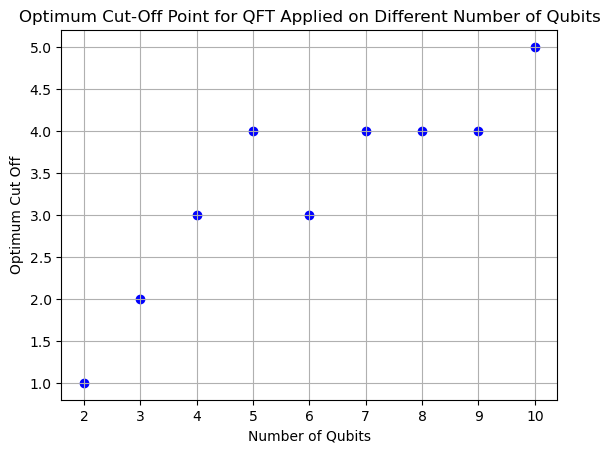

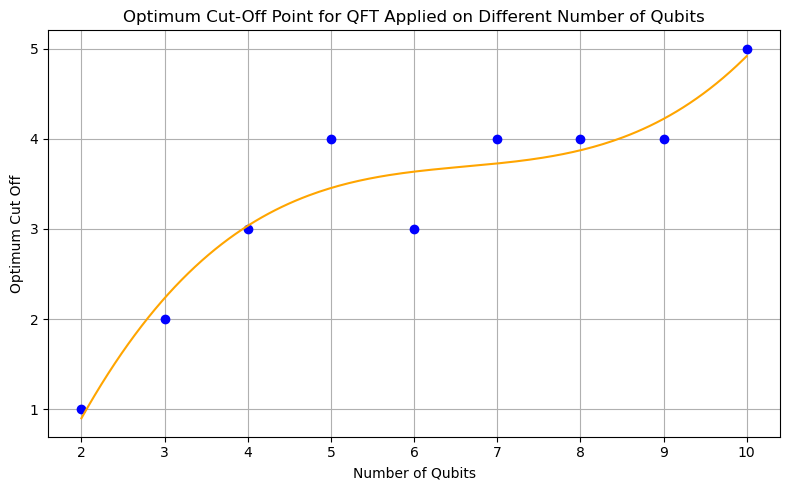

[2, 3, 4, 5, 6, 7, 8, 9, 10] [1, 2, 3, 3, 3, 3, 3, 4, 4]
[2, 3, 4, 5, 6, 7, 8, 9, 10] [1, 2, 3, 4, 3, 4, 4, 4, 5]


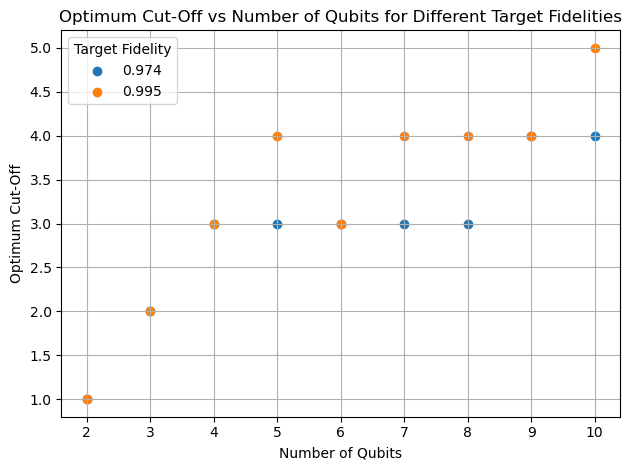

In [102]:
fidelities_qubits_vs_cutoff_fit(max_qubits=10, trials=10000, fidelities=[0.954, 0.974, 0.995], fidelity_single=0.99978)

Pauli prob is 0.9951052665710449 for target fidelity 0.996
Pauli prob is 0.9980473518371582 for target fidelity 0.996
Pauli prob is 0.9951171875 for target fidelity 0.996
Pauli prob is 0.9961094856262207 for target fidelity 0.996
Pauli prob is 0.9949073791503906 for target fidelity 0.996
Pauli prob is 0.9957385063171387 for target fidelity 0.996
Pauli prob is 0.99481201171875 for target fidelity 0.996
Pauli prob is 0.9965887069702148 for target fidelity 0.996
Pauli prob is 0.9959750175476074 for target fidelity 0.996
Pauli prob is 0.9921760559082031 for target fidelity 0.996
0.9954576969146729
[0.9871687421801327]


C:\Users\20221753\AppData\Local\Temp\ipykernel_12504\1721594825.py:31: RankWarning: Polyfit may be poorly conditioned
  p_fit = np.polyfit(cut_offs, fidelities, degree)


<Figure size 1000x600 with 0 Axes>

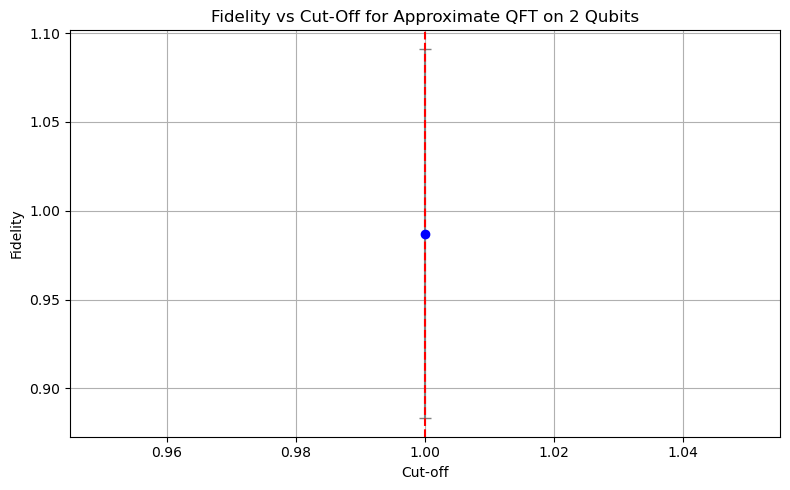

Maximum Fidelity: 0.9872 at cut-off ≈ 1.00
At non-integer cut off Maximum Fidelity: 0.9872 at cut-off ≈ 1.00
1
[0.8829573126473385, 0.9780941552681659]


C:\Users\20221753\AppData\Local\Temp\ipykernel_12504\1721594825.py:31: RankWarning: Polyfit may be poorly conditioned
  p_fit = np.polyfit(cut_offs, fidelities, degree)


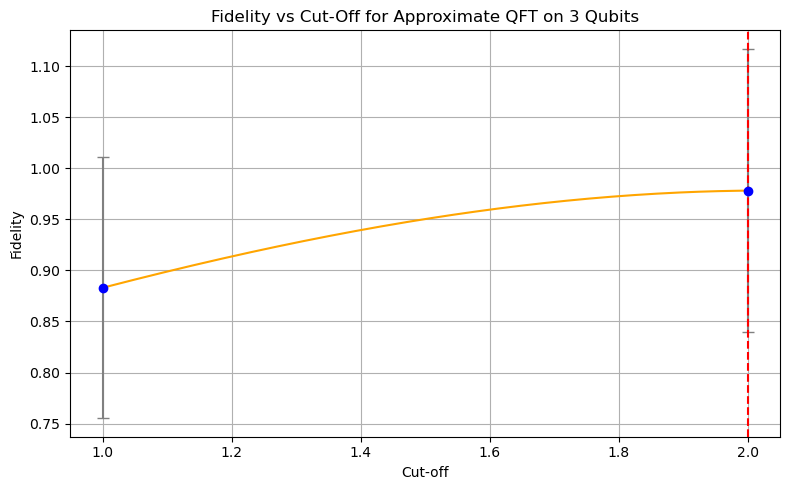

Maximum Fidelity: 0.9781 at cut-off ≈ 2.00
At non-integer cut off Maximum Fidelity: 0.9781 at cut-off ≈ 2.00
2
[0.7065999516347024, 0.9278164984344599, 0.9474794855331589]


C:\Users\20221753\AppData\Local\Temp\ipykernel_12504\1721594825.py:31: RankWarning: Polyfit may be poorly conditioned
  p_fit = np.polyfit(cut_offs, fidelities, degree)


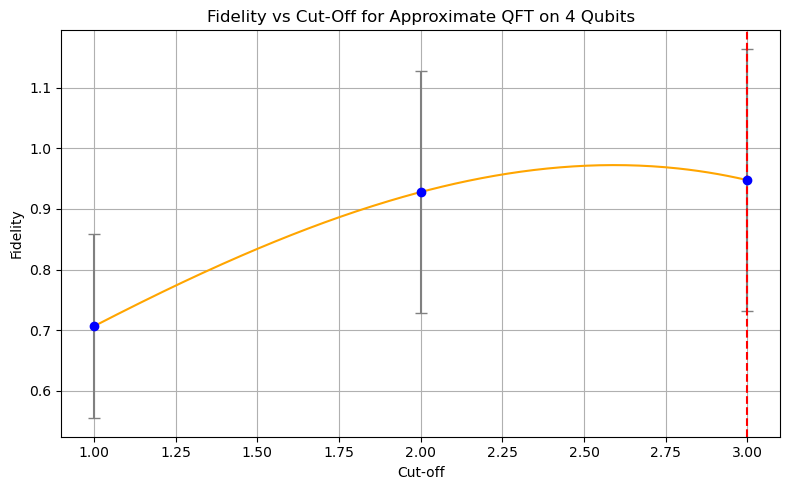

Maximum Fidelity: 0.9475 at cut-off ≈ 3.00
At non-integer cut off Maximum Fidelity: 0.9723 at cut-off ≈ 2.59
3
[0.5344322339089319, 0.869940124604143, 0.9309915077896711, 0.931317866781005]


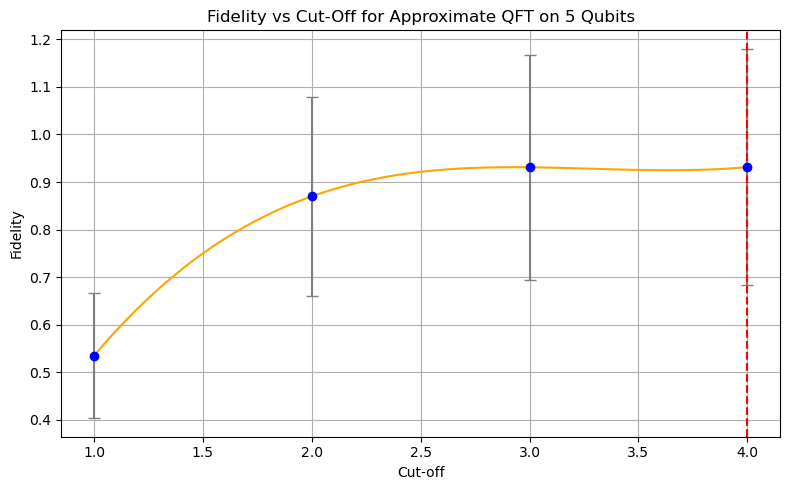

Maximum Fidelity: 0.9313 at cut-off ≈ 4.00
At non-integer cut off Maximum Fidelity: 0.9313 at cut-off ≈ 4.00
4
[0.3846972648707603, 0.7940380877393327, 0.885353657057915, 0.8998089454414833, 0.898015341474414]


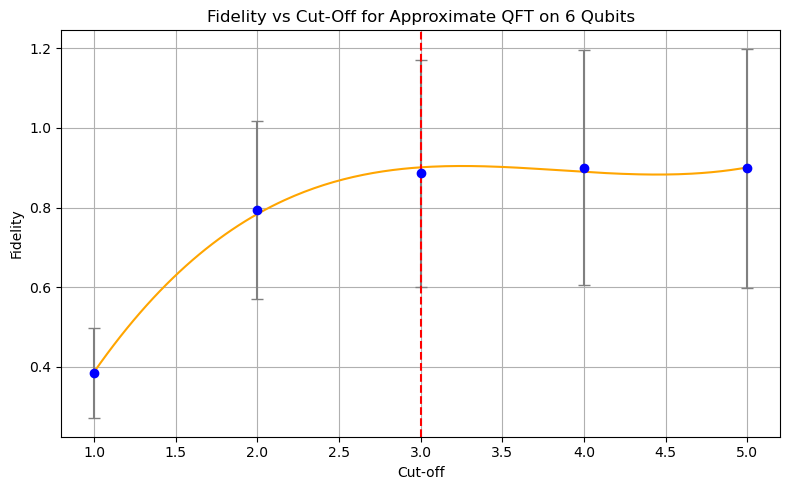

Maximum Fidelity: 0.9008 at cut-off ≈ 3.00
At non-integer cut off Maximum Fidelity: 0.9041 at cut-off ≈ 3.25
3
[0.2771267715455104, 0.7229391216135682, 0.8623439582346857, 0.8816899197320476, 0.8802478852283339, 0.8723918583027662]


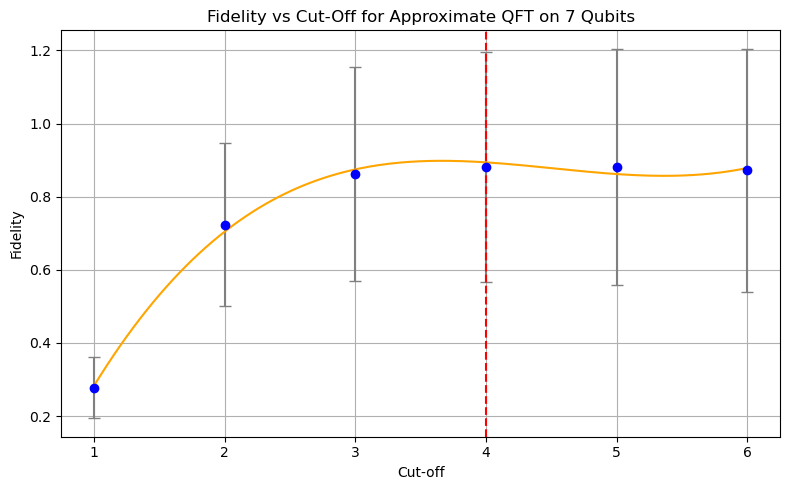

Maximum Fidelity: 0.8939 at cut-off ≈ 4.00
At non-integer cut off Maximum Fidelity: 0.8981 at cut-off ≈ 3.66
4
[0.1971322492412461, 0.6491730145438939, 0.8203138997308203, 0.8503527604308231, 0.8435828629760832, 0.8391351588369642, 0.8245096728910665]


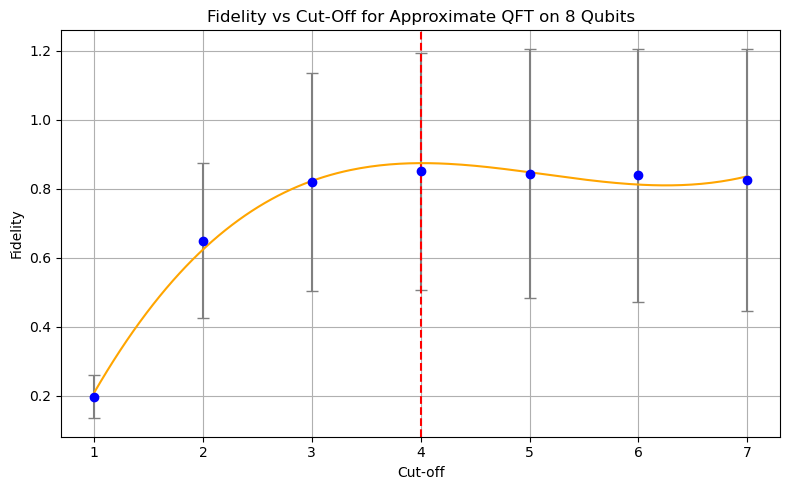

Maximum Fidelity: 0.8742 at cut-off ≈ 4.00
At non-integer cut off Maximum Fidelity: 0.8742 at cut-off ≈ 4.02
4
[0.14058987050445373, 0.588440840256233, 0.7906885749316013, 0.8300567239752344, 0.8191966644885469, 0.8148166020969394, 0.8101020222961439, 0.8038557564434116]


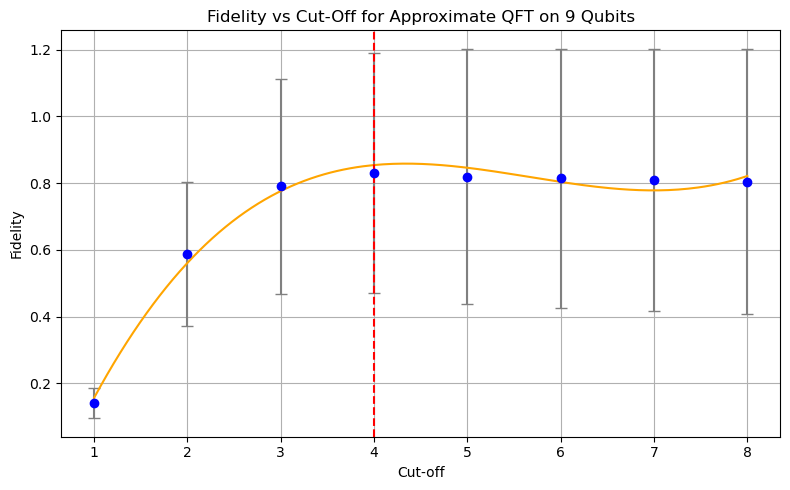

Maximum Fidelity: 0.8541 at cut-off ≈ 4.00
At non-integer cut off Maximum Fidelity: 0.8585 at cut-off ≈ 4.34
4
[0.09897921695458341, 0.5281010606944463, 0.757207733890057, 0.8025214335924368, 0.7929379234385974, 0.7777750866157984, 0.7733060683522621, 0.7628617553619501, 0.7538664675632184]


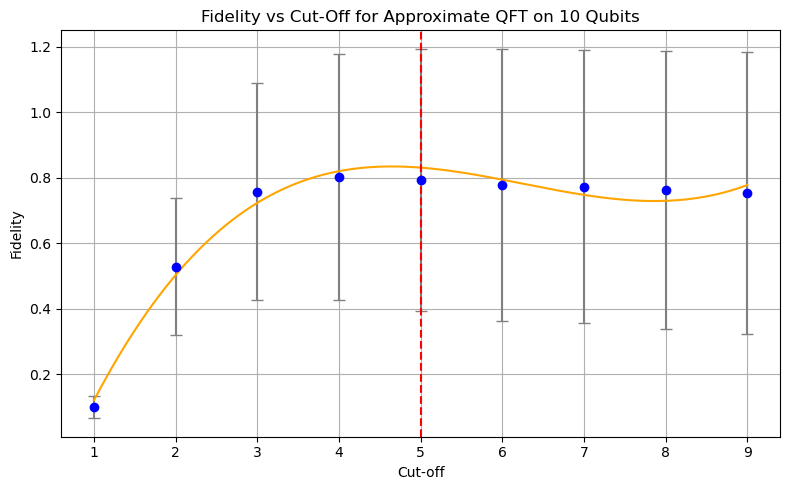

Maximum Fidelity: 0.8311 at cut-off ≈ 5.00
At non-integer cut off Maximum Fidelity: 0.8346 at cut-off ≈ 4.66
5
all optimum cutt-offs are [1, 2, 3, 4, 3, 4, 4, 4, 5]


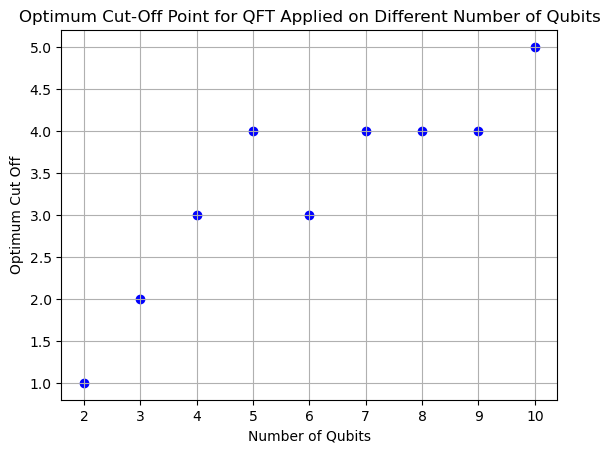

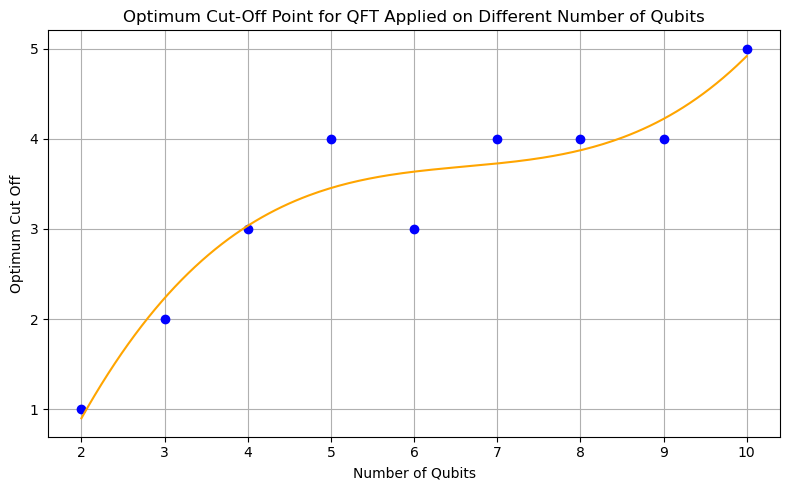

Pauli prob is 0.9967217445373535 for target fidelity 0.997
Pauli prob is 0.9975743293762207 for target fidelity 0.997
Pauli prob is 0.994140625 for target fidelity 0.997
Pauli prob is 0.9931640625 for target fidelity 0.997
Pauli prob is 0.9966750144958496 for target fidelity 0.997
Pauli prob is 0.9971170425415039 for target fidelity 0.997
Pauli prob is 0.9959444999694824 for target fidelity 0.997
Pauli prob is 0.9962234497070312 for target fidelity 0.997
Pauli prob is 0.9980635643005371 for target fidelity 0.997
Pauli prob is 0.9963116645812988 for target fidelity 0.997
0.9961935997009277
[0.9887715136654164]


C:\Users\20221753\AppData\Local\Temp\ipykernel_12504\1721594825.py:31: RankWarning: Polyfit may be poorly conditioned
  p_fit = np.polyfit(cut_offs, fidelities, degree)


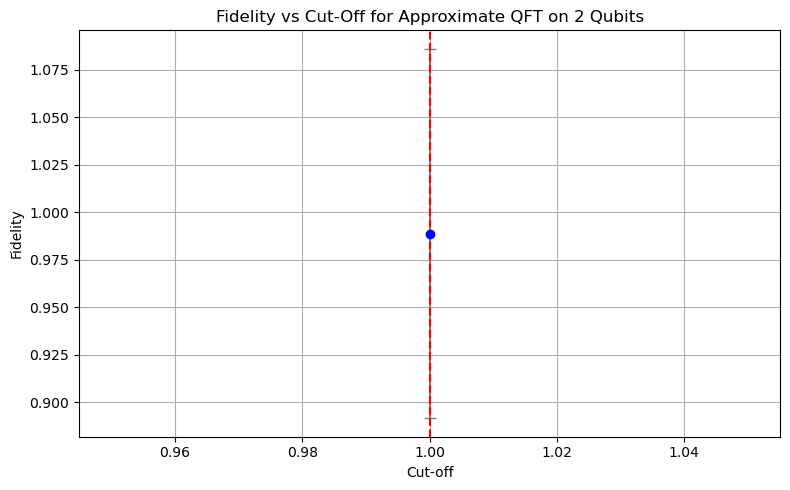

Maximum Fidelity: 0.9888 at cut-off ≈ 1.00
At non-integer cut off Maximum Fidelity: 0.9888 at cut-off ≈ 1.00
1
[0.8877626287459538, 0.97946280934367]


C:\Users\20221753\AppData\Local\Temp\ipykernel_12504\1721594825.py:31: RankWarning: Polyfit may be poorly conditioned
  p_fit = np.polyfit(cut_offs, fidelities, degree)


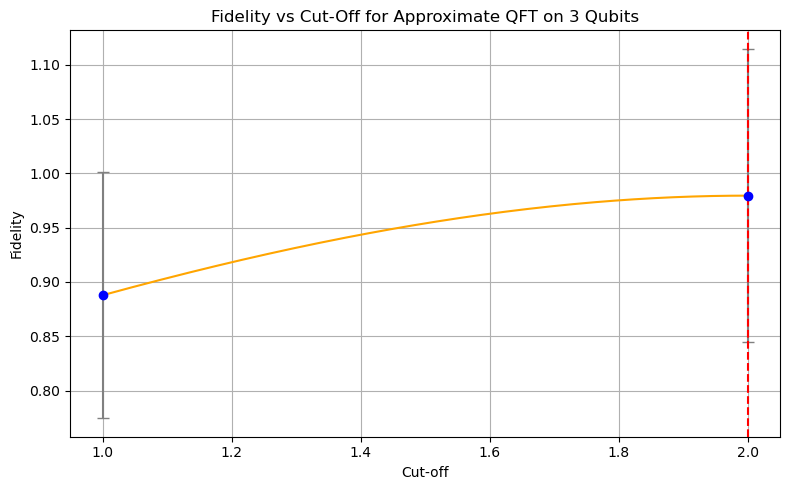

Maximum Fidelity: 0.9795 at cut-off ≈ 2.00
At non-integer cut off Maximum Fidelity: 0.9795 at cut-off ≈ 2.00
2
[0.7106119320650934, 0.9339830332767526, 0.9598438783464446]


C:\Users\20221753\AppData\Local\Temp\ipykernel_12504\1721594825.py:31: RankWarning: Polyfit may be poorly conditioned
  p_fit = np.polyfit(cut_offs, fidelities, degree)


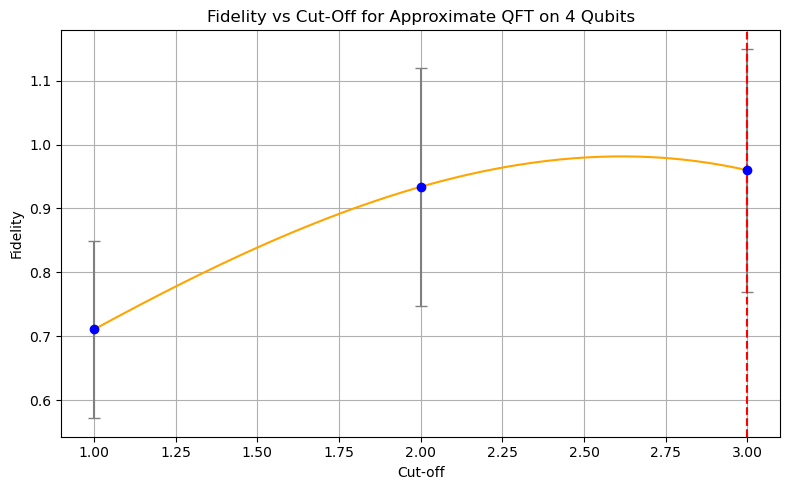

Maximum Fidelity: 0.9598 at cut-off ≈ 3.00
At non-integer cut off Maximum Fidelity: 0.9816 at cut-off ≈ 2.62
3
[0.538038381863673, 0.8813372360781981, 0.9362926074703563, 0.938800402962682]


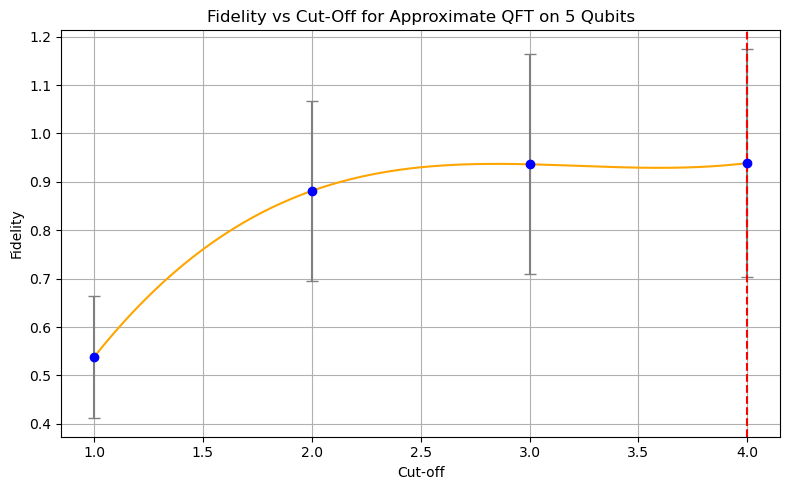

Maximum Fidelity: 0.9388 at cut-off ≈ 4.00
At non-integer cut off Maximum Fidelity: 0.9388 at cut-off ≈ 4.00
4
[0.38990945531087506, 0.8016949525883361, 0.9036107659322954, 0.9153237300882907, 0.9094732351547961]


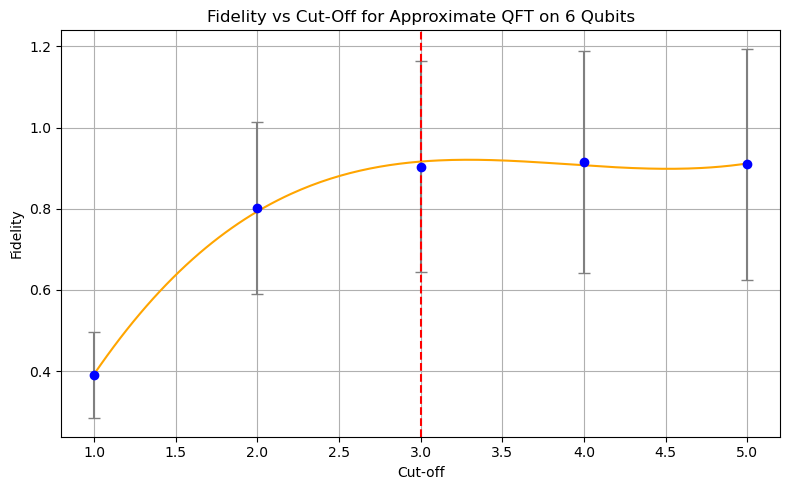

Maximum Fidelity: 0.9162 at cut-off ≈ 3.00
At non-integer cut off Maximum Fidelity: 0.9207 at cut-off ≈ 3.29
3
[0.28115822823483916, 0.7292516986872103, 0.8749040560880803, 0.8983548844689955, 0.8927809436219762, 0.8908085486656079]


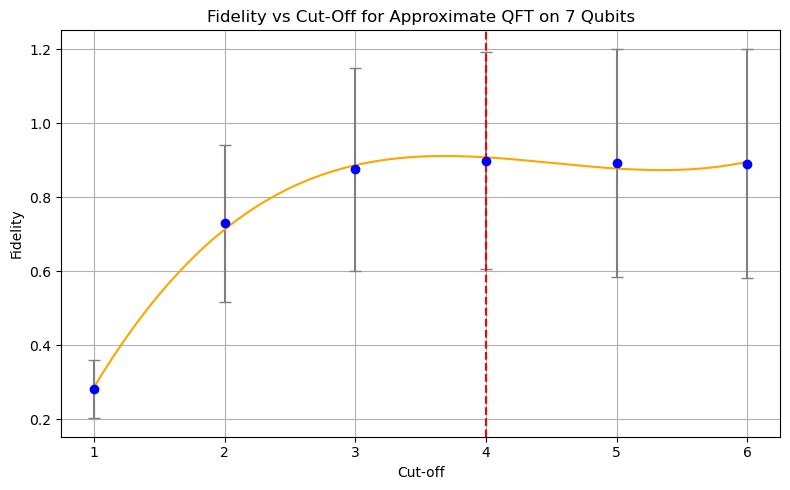

Maximum Fidelity: 0.9078 at cut-off ≈ 4.00
At non-integer cut off Maximum Fidelity: 0.9115 at cut-off ≈ 3.69
4
[0.1993676996895607, 0.662536474110415, 0.838114760130503, 0.8715950017949788, 0.8683842398375702, 0.8594650879400489, 0.8573618698400703]


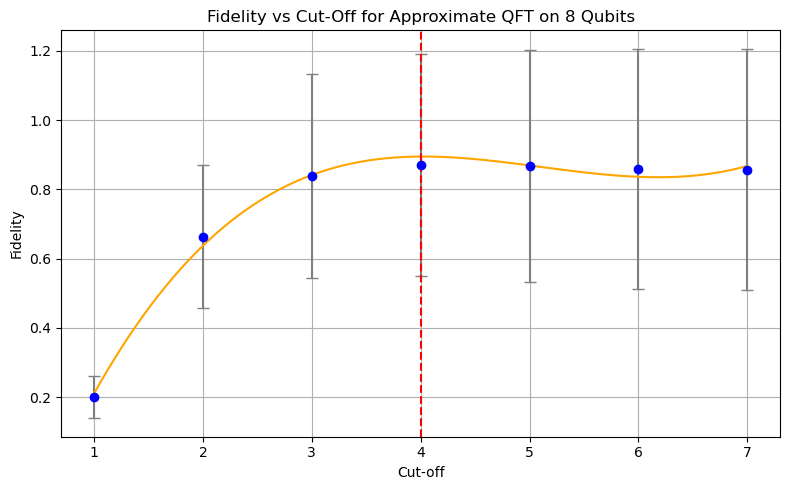

Maximum Fidelity: 0.8949 at cut-off ≈ 4.00
At non-integer cut off Maximum Fidelity: 0.8949 at cut-off ≈ 4.02
4
[0.14233939542337473, 0.6023635512708004, 0.8133750168227372, 0.8535972623289183, 0.848677457710056, 0.8400020157888517, 0.8368340057541742, 0.8288273313411153]


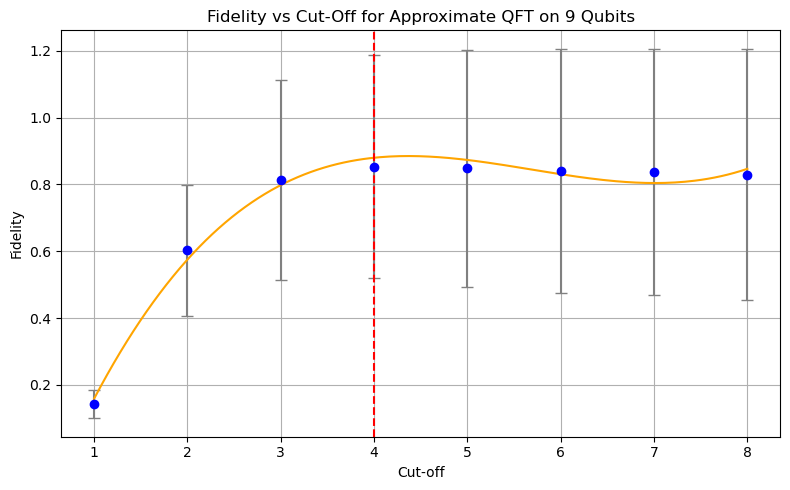

Maximum Fidelity: 0.8798 at cut-off ≈ 4.00
At non-integer cut off Maximum Fidelity: 0.8849 at cut-off ≈ 4.38
4
[0.10081362393180449, 0.5417773370334801, 0.7700598999564248, 0.8185501674814285, 0.8212978217820209, 0.8160732562286078, 0.8022516581886026, 0.794916091869894, 0.7998660024175072]


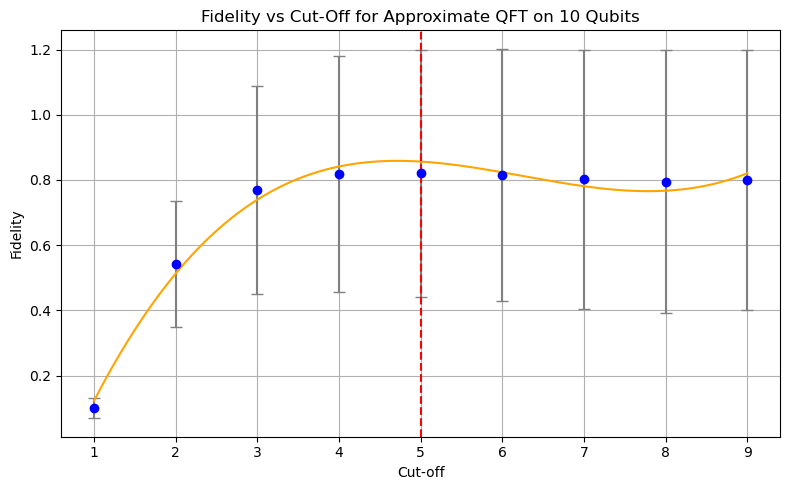

Maximum Fidelity: 0.8565 at cut-off ≈ 5.00
At non-integer cut off Maximum Fidelity: 0.8588 at cut-off ≈ 4.70
5
all optimum cutt-offs are [1, 2, 3, 4, 3, 4, 4, 4, 5]


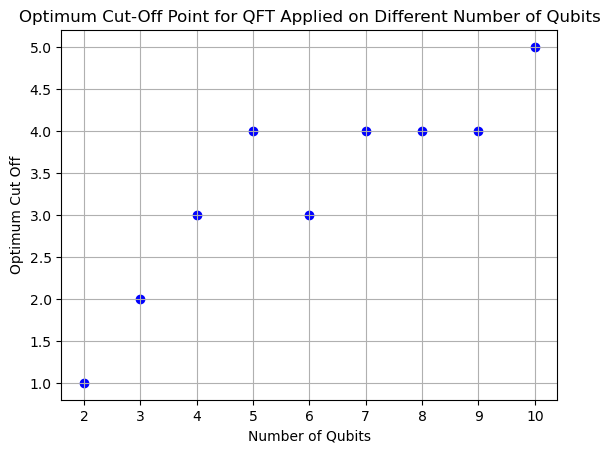

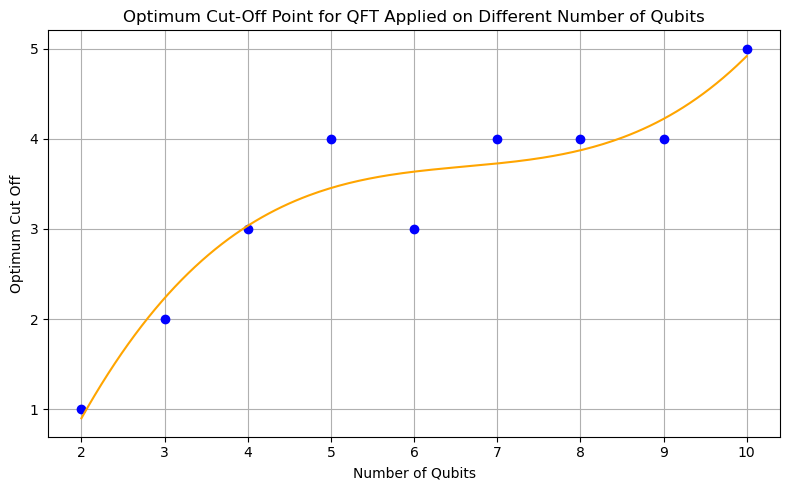

Pauli prob is 0.9969630241394043 for target fidelity 0.998
Pauli prob is 0.9984359741210938 for target fidelity 0.998
Pauli prob is 0.99737548828125 for target fidelity 0.998
Pauli prob is 0.9960932731628418 for target fidelity 0.998
Pauli prob is 0.99853515625 for target fidelity 0.998
Pauli prob is 0.9983081817626953 for target fidelity 0.998
Pauli prob is 0.99609375 for target fidelity 0.998
Pauli prob is 0.9981088638305664 for target fidelity 0.998
Pauli prob is 0.9960131645202637 for target fidelity 0.998
Pauli prob is 0.9959716796875 for target fidelity 0.998
0.9971898555755615
[0.9910660292100447]


C:\Users\20221753\AppData\Local\Temp\ipykernel_12504\1721594825.py:31: RankWarning: Polyfit may be poorly conditioned
  p_fit = np.polyfit(cut_offs, fidelities, degree)


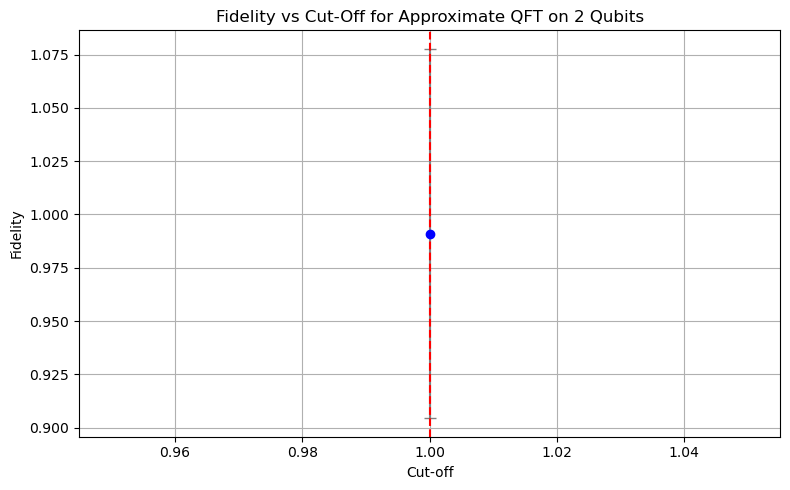

Maximum Fidelity: 0.9911 at cut-off ≈ 1.00
At non-integer cut off Maximum Fidelity: 0.9911 at cut-off ≈ 1.00
1
[0.715519668054273, 0.9433189635664485, 0.9680052065648477]


C:\Users\20221753\AppData\Local\Temp\ipykernel_12504\1721594825.py:31: RankWarning: Polyfit may be poorly conditioned
  p_fit = np.polyfit(cut_offs, fidelities, degree)


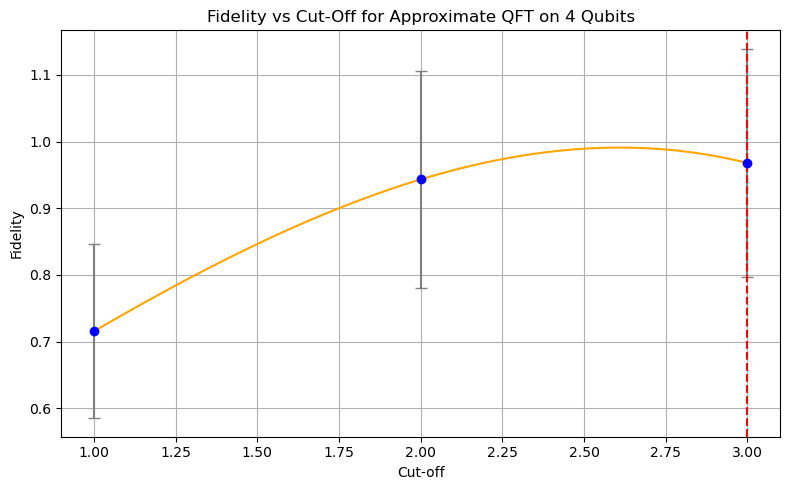

Maximum Fidelity: 0.9680 at cut-off ≈ 3.00
At non-integer cut off Maximum Fidelity: 0.9911 at cut-off ≈ 2.61
3
[0.5413125302977463, 0.8889367091221994, 0.9533759109077861, 0.956178479024105]


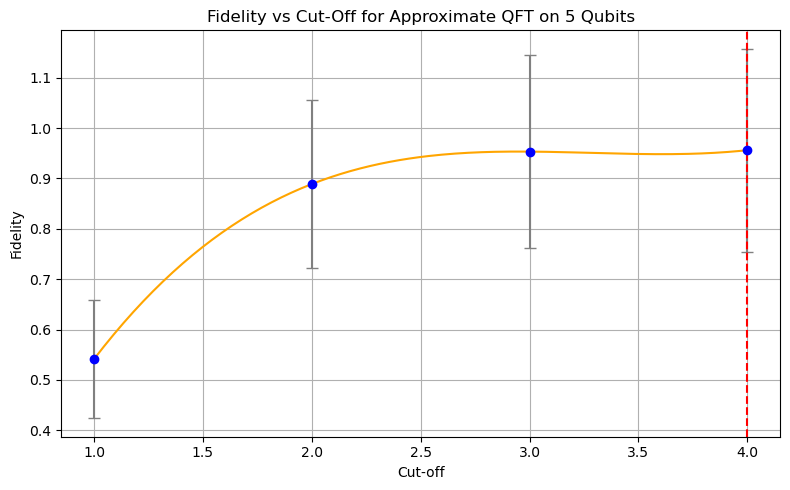

Maximum Fidelity: 0.9562 at cut-off ≈ 4.00
At non-integer cut off Maximum Fidelity: 0.9562 at cut-off ≈ 4.00
4
[0.39275395007644603, 0.8167153232830477, 0.9217178900722327, 0.9388586002269276, 0.9346000262546077]


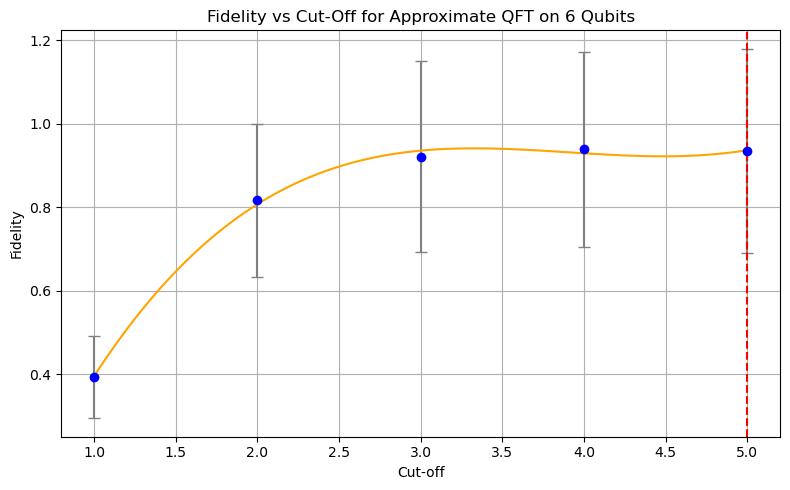

Maximum Fidelity: 0.9370 at cut-off ≈ 5.00
At non-integer cut off Maximum Fidelity: 0.9413 at cut-off ≈ 3.33
5
[0.28354056992931076, 0.7444115298025004, 0.8972951825068681, 0.921802276700932, 0.9256064937156457, 0.9196079460757323]


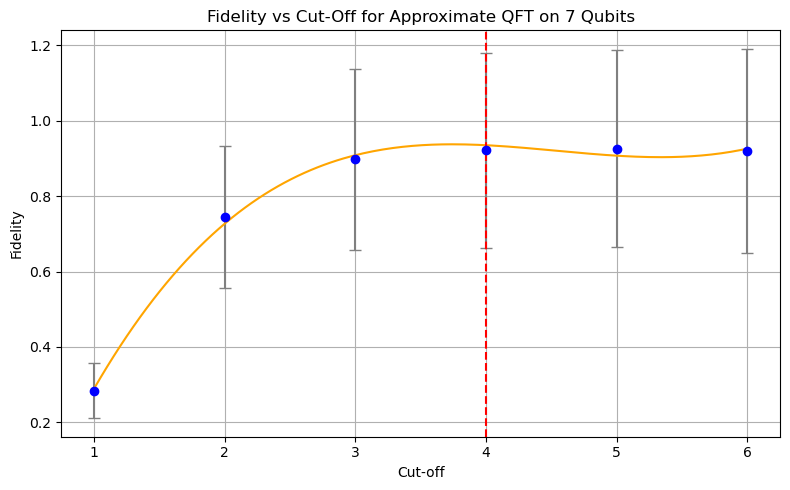

Maximum Fidelity: 0.9348 at cut-off ≈ 4.00
At non-integer cut off Maximum Fidelity: 0.9372 at cut-off ≈ 3.74
4
[0.20300012916025892, 0.6797898130789055, 0.8631712500630215, 0.9016403341188625, 0.8955525409803992, 0.8926567388673384, 0.8953910042277504]


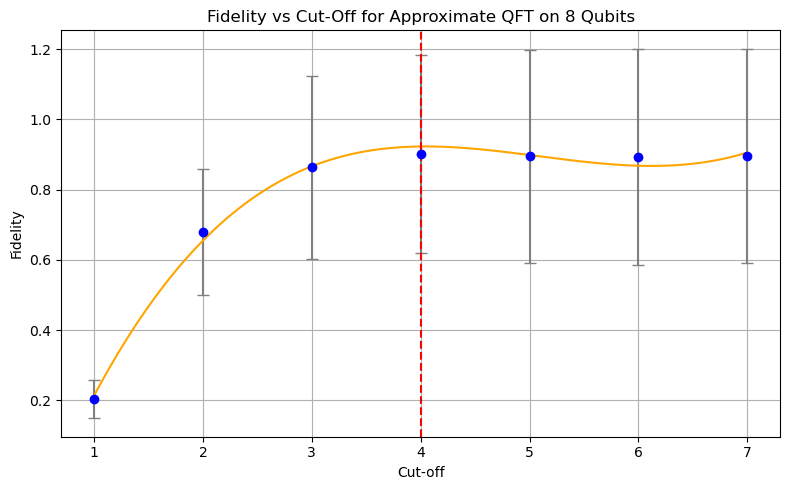

Maximum Fidelity: 0.9231 at cut-off ≈ 4.00
At non-integer cut off Maximum Fidelity: 0.9231 at cut-off ≈ 4.05
4
[0.14520376162463763, 0.6151312816015753, 0.8392980617407957, 0.88707215802227, 0.8851382078009025, 0.8871026247923383, 0.877312130373509, 0.871145442741634]


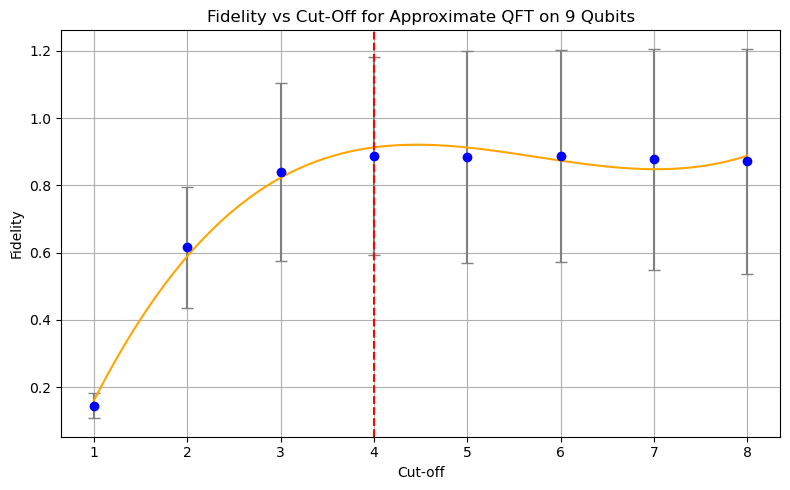

Maximum Fidelity: 0.9129 at cut-off ≈ 4.00
At non-integer cut off Maximum Fidelity: 0.9208 at cut-off ≈ 4.45
4
[0.10274573466735643, 0.5566859616916721, 0.8076739606524358, 0.8638542793501552, 0.8668321517657906, 0.8610716930265031, 0.8536527867604152, 0.8452441946300397, 0.8381881275142267]


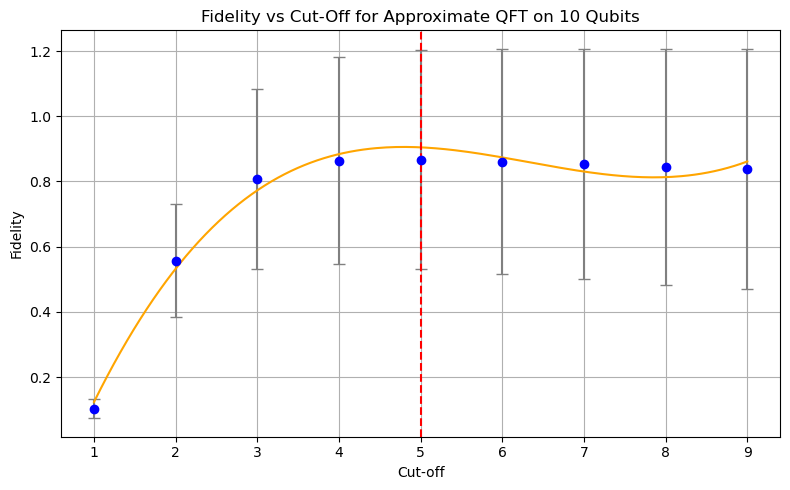

Maximum Fidelity: 0.9045 at cut-off ≈ 5.00
At non-integer cut off Maximum Fidelity: 0.9058 at cut-off ≈ 4.78
5
all optimum cutt-offs are [1, 2, 3, 4, 5, 4, 4, 4, 5]


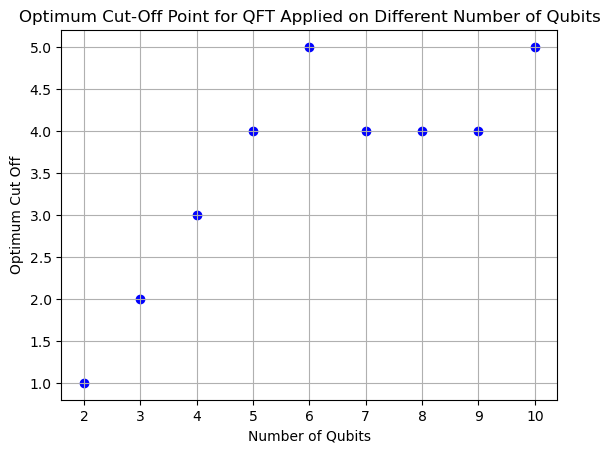

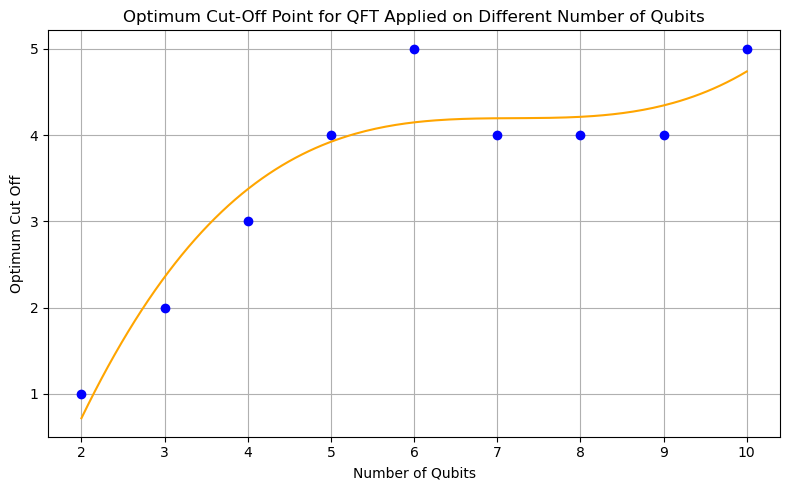

Pauli prob is 0.9990634918212891 for target fidelity 0.999
Pauli prob is 0.998046875 for target fidelity 0.999
Pauli prob is 0.9975476264953613 for target fidelity 0.999
Pauli prob is 0.9993896484375 for target fidelity 0.999
Pauli prob is 0.9985499382019043 for target fidelity 0.999
Pauli prob is 0.998046875 for target fidelity 0.999
Pauli prob is 0.9990234375 for target fidelity 0.999
Pauli prob is 0.998046875 for target fidelity 0.999
Pauli prob is 0.9990234375 for target fidelity 0.999
Pauli prob is 0.99658203125 for target fidelity 0.999
0.9983320236206055
[0.9941174395619214]


C:\Users\20221753\AppData\Local\Temp\ipykernel_12504\1721594825.py:31: RankWarning: Polyfit may be poorly conditioned
  p_fit = np.polyfit(cut_offs, fidelities, degree)


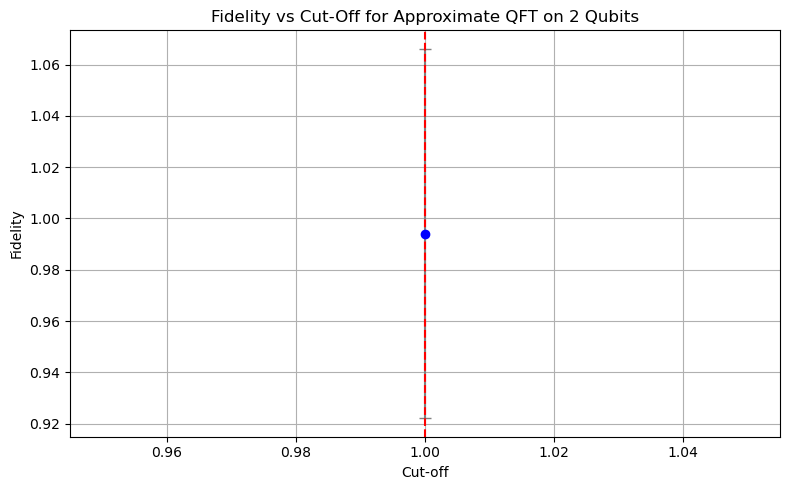

Maximum Fidelity: 0.9941 at cut-off ≈ 1.00
At non-integer cut off Maximum Fidelity: 0.9941 at cut-off ≈ 1.00
1
[0.8956615094953925, 0.9894033635400629]


C:\Users\20221753\AppData\Local\Temp\ipykernel_12504\1721594825.py:31: RankWarning: Polyfit may be poorly conditioned
  p_fit = np.polyfit(cut_offs, fidelities, degree)


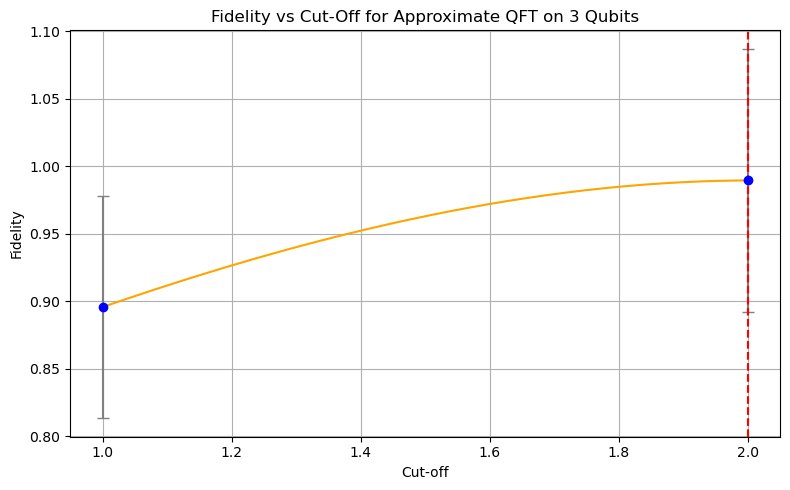

Maximum Fidelity: 0.9894 at cut-off ≈ 2.00
At non-integer cut off Maximum Fidelity: 0.9894 at cut-off ≈ 2.00
2
[0.7235693643654635, 0.9581442710826157, 0.9792140515576843]


C:\Users\20221753\AppData\Local\Temp\ipykernel_12504\1721594825.py:31: RankWarning: Polyfit may be poorly conditioned
  p_fit = np.polyfit(cut_offs, fidelities, degree)


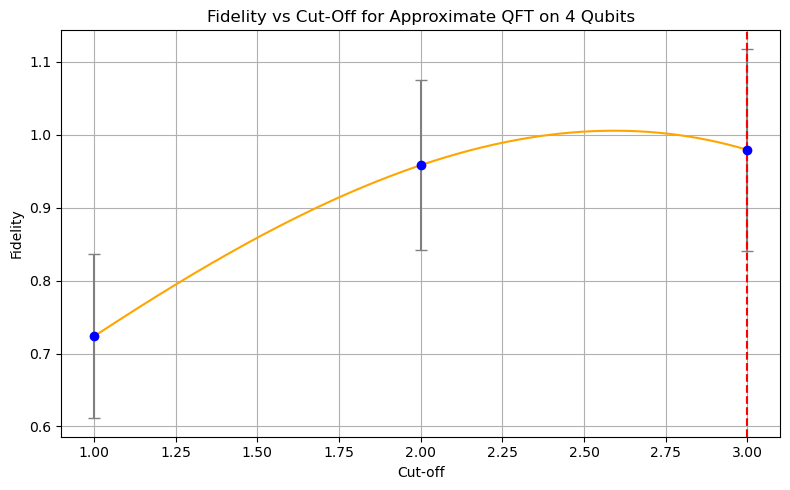

Maximum Fidelity: 0.9792 at cut-off ≈ 3.00
At non-integer cut off Maximum Fidelity: 1.0054 at cut-off ≈ 2.59
3
[0.5478265270966459, 0.900127501246489, 0.9667145048480834, 0.9724170438061231]


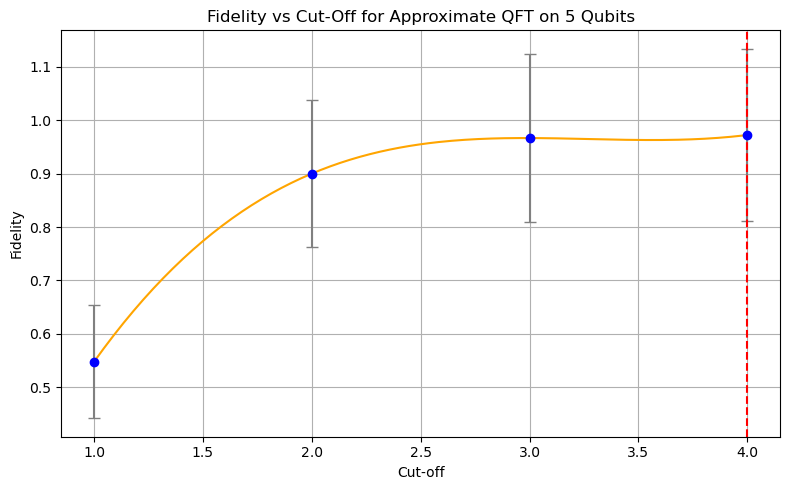

Maximum Fidelity: 0.9724 at cut-off ≈ 4.00
At non-integer cut off Maximum Fidelity: 0.9724 at cut-off ≈ 4.00
4
[0.3989136324661985, 0.8334836050435913, 0.943584202989911, 0.9588292093762959, 0.958784596660751]


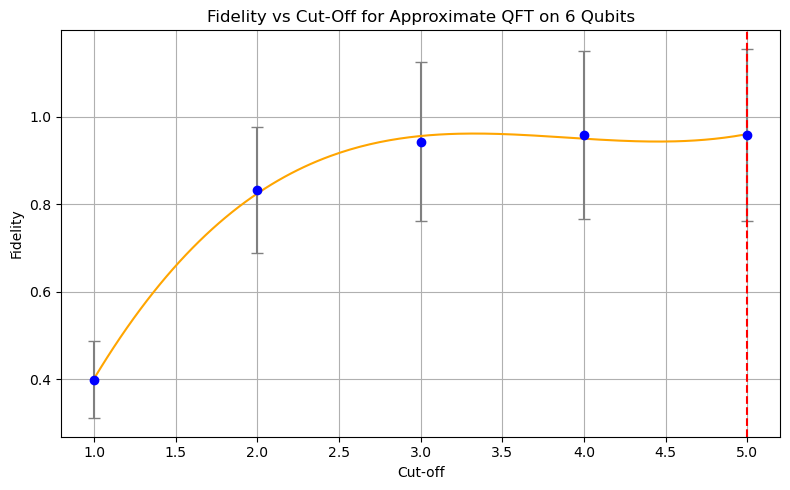

Maximum Fidelity: 0.9609 at cut-off ≈ 5.00
At non-integer cut off Maximum Fidelity: 0.9621 at cut-off ≈ 3.33
5
[0.2882196847715636, 0.7654344839771419, 0.9255180930962282, 0.9515950033409012, 0.949927169867736, 0.9518899283118925]


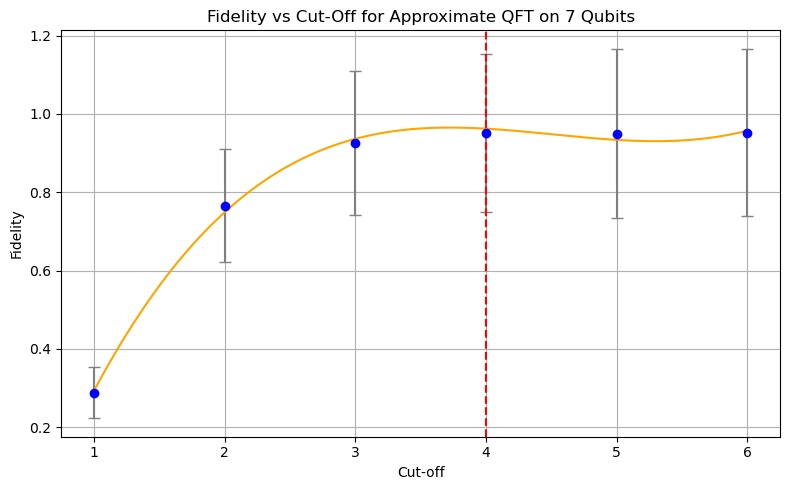

Maximum Fidelity: 0.9624 at cut-off ≈ 4.00
At non-integer cut off Maximum Fidelity: 0.9652 at cut-off ≈ 3.71
4
[0.2065816471687527, 0.7002994541941613, 0.8972029248206796, 0.9360326880720818, 0.9355198994647477, 0.9378439174330583, 0.9334709462261606]


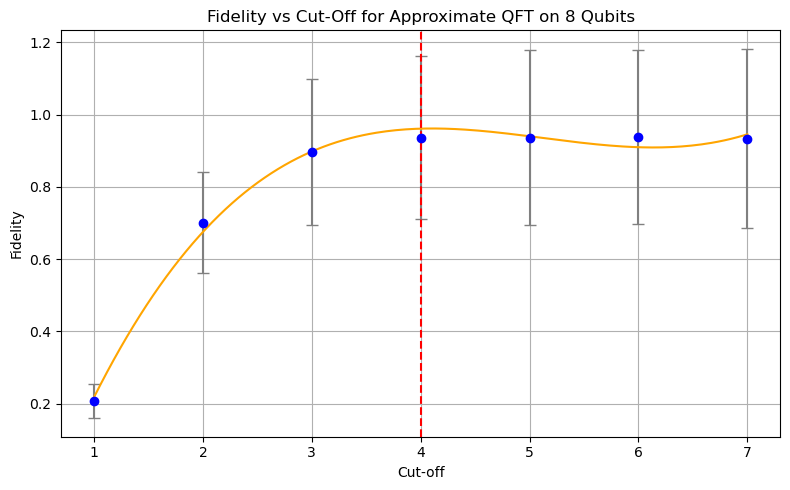

Maximum Fidelity: 0.9611 at cut-off ≈ 4.00
At non-integer cut off Maximum Fidelity: 0.9615 at cut-off ≈ 4.11
4
[0.1483387643419158, 0.6373730099649451, 0.8711119446214954, 0.9186789810307484, 0.9285831085279486, 0.9269463759879414, 0.9227312107928034, 0.920760117090112]


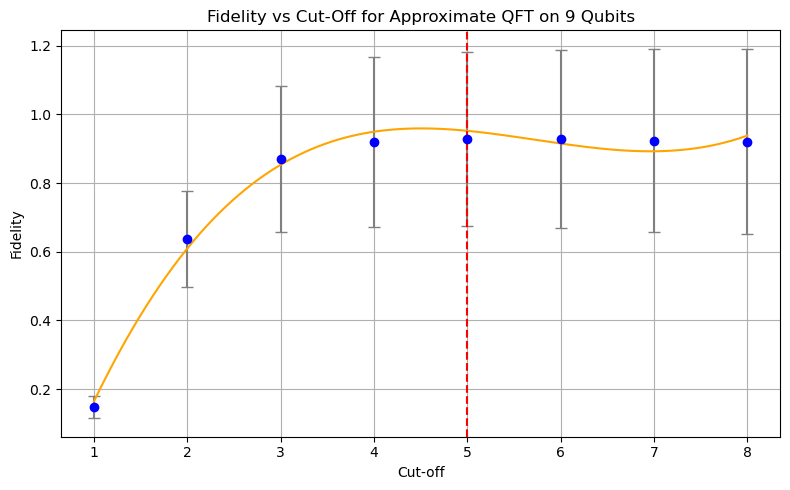

Maximum Fidelity: 0.9519 at cut-off ≈ 5.00
At non-integer cut off Maximum Fidelity: 0.9589 at cut-off ≈ 4.52
5
[0.10547238117875142, 0.5769747291341694, 0.8439488226214926, 0.9039651315380614, 0.911621922241253, 0.9111369054458822, 0.9073271185114833, 0.903694698094588, 0.9011576708177221]


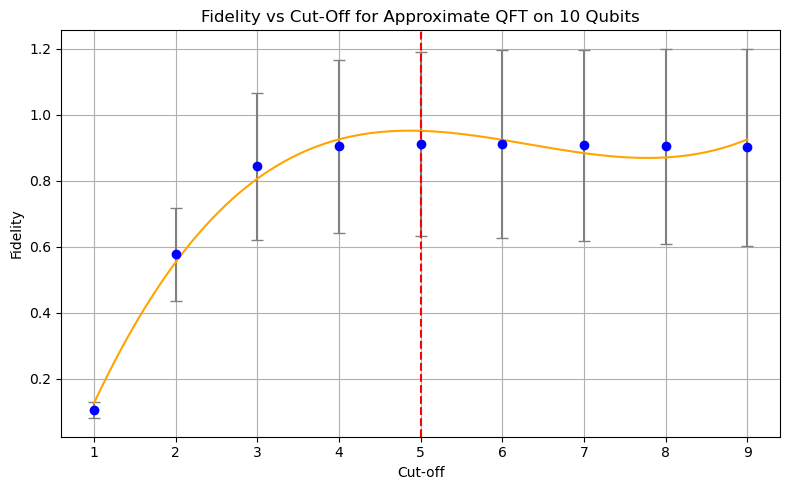

Maximum Fidelity: 0.9510 at cut-off ≈ 5.00
At non-integer cut off Maximum Fidelity: 0.9516 at cut-off ≈ 4.86
5
all optimum cutt-offs are [1, 2, 3, 4, 5, 4, 4, 5, 5]


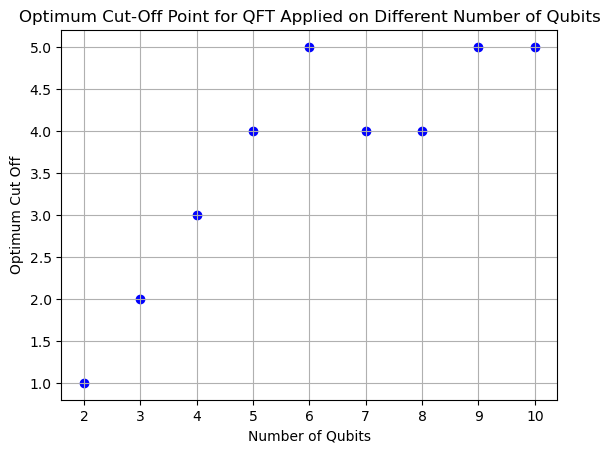

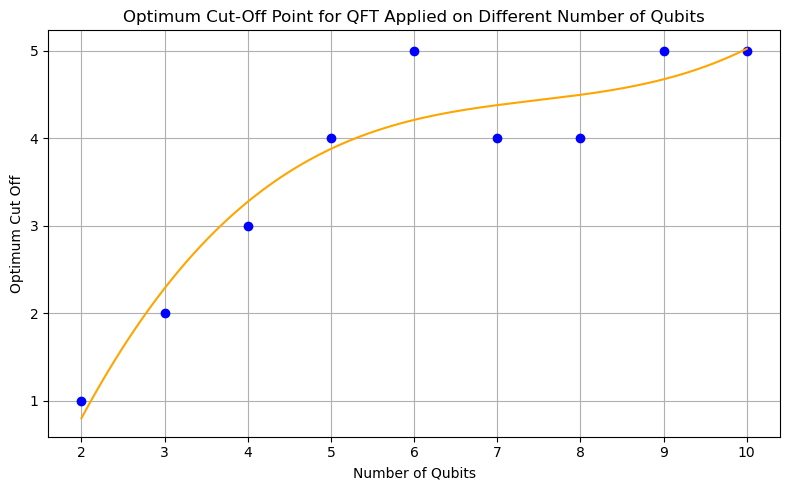

[2, 3, 4, 5, 6, 7, 8, 9, 10] [1, 2, 3, 4, 3, 4, 4, 4, 5]
[2, 3, 4, 5, 6, 7, 8, 9, 10] [1, 2, 3, 4, 3, 4, 4, 4, 5]
[2, 3, 4, 5, 6, 7, 8, 9, 10] [1, 2, 3, 4, 5, 4, 4, 4, 5]
[2, 3, 4, 5, 6, 7, 8, 9, 10] [1, 2, 3, 4, 5, 4, 4, 5, 5]


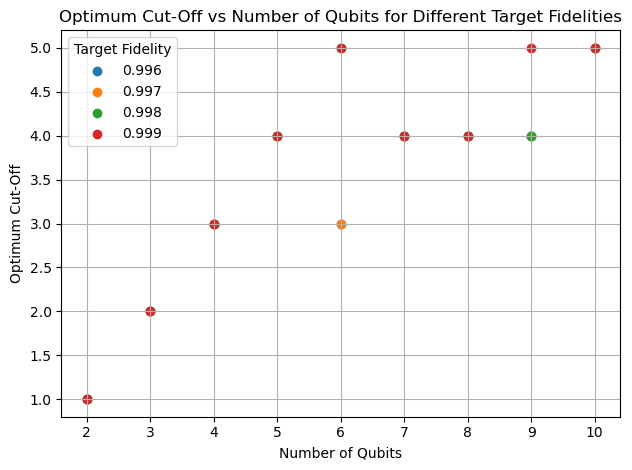

In [103]:
fidelities_qubits_vs_cutoff_fit(max_qubits=10, trials=10000, fidelities=[0.996, 0.997, 0.998, 0.999], fidelity_single=0.99978)

In [26]:
def extract_all_data(target_fidelity, fidelity):
    for n in range(2, 10+1):
        df = pd.read_csv(f"C:\\Users\\20221753\\OneDrive - TU Eindhoven\\Desktop\\BEP\\Programming Qiskit\\{target_fidelity}\\qft_results_{n}_qubits_{fidelity}_fidelity.csv")  # Only one column: "fidelity"
        #print(df)
        cutoff_groups = df.groupby('Cut-off')['Value'].apply(list)
        #print(cutoff_groups)


        cutoff_stats = {
            'Cut-off': [],
            'Mean': [],
            'Standard Deviation': []
        }

        for cutoff, values in cutoff_groups.items():
            cutoff_stats['Cut-off'].append(cutoff)
            cutoff_stats['Mean'].append(np.mean(values))
            cutoff_stats['Standard Deviation'].append(np.std(values))

        # Convert to a DataFrame for easy viewing and use
        cutoff_stats_df = pd.DataFrame(cutoff_stats)
        cutoff_stats_df.set_index('Cut-off', inplace=True)

        print(cutoff_stats_df)

In [27]:
def extract_data(n,target_fidelity, fidelity):
    
    df = pd.read_csv(f"C:\\Users\\20221753\\OneDrive - TU Eindhoven\\Desktop\\BEP\\Programming Qiskit\\{target_fidelity}\\qft_results_{n}_qubits_{fidelity}_fidelity.csv")  # Only one column: "fidelity"
    #print(df)
    cutoff_groups = df.groupby('Cut-off')['Value'].apply(list)
    #print(cutoff_groups)


    cutoff_stats = {
        'Cut-off': [],
        'Mean': [],
        'Standard Deviation': []
    }

    for cutoff, values in cutoff_groups.items():
        cutoff_stats['Cut-off'].append(cutoff)
        cutoff_stats['Mean'].append(np.mean(values))
        cutoff_stats['Standard Deviation'].append(np.std(values))

    # Convert to a DataFrame for easy viewing and use
    cutoff_stats_df = pd.DataFrame(cutoff_stats)

    return(cutoff_stats_df)




In [210]:
extract_data(8, 0.995, 0.9939908027648926)

,Cut-off,Mean,Standard Deviation
0,1,0.191057,0.069697
1,2,0.628697,0.248359
2,3,0.780233,0.355096
3,4,0.809955,0.381038
4,5,0.799085,0.398368
5,6,0.794206,0.402992
6,7,0.782177,0.411606


In [34]:
def graph_per_fidelity(n, target_fidelity, fidelity, threshold):

    df=extract_data(n, target_fidelity, fidelity)
    cut_offs = df['Cut-off'].values
    fidelities = df['Mean'].values
    print(fidelities)
    std_devs = df['Standard Deviation'].values

    plt.figure(figsize=(10, 6))

    degree = 4
    p_fit = np.polyfit(cut_offs, fidelities, degree)
    poly = np.poly1d(p_fit)

    # Create smooth x values for the curve
    x_smooth = np.linspace(cut_offs.min(), cut_offs.max(), 200)
    y_smooth = poly(x_smooth)


    # Evaluate fitted curve at integer cut-off values
    fit_vals = [poly(x) for x in cut_offs]  # Evaluate polynomial at integer points only


    
    opt_index = int(np.argmax(fit_vals))

     # Find optimal cut-off on the smooth curve (including non-integer values)
    max_index = np.argmax(y_smooth)
    opt_cutoff_real = x_smooth[max_index]
    opt_value_real = y_smooth[max_index]


    opt_cutoff = cut_offs[opt_index]
    opt_value = fit_vals[opt_index]
    
    #finding points close enough to optimal
    closeby = np.abs(fidelities - opt_value) <= threshold
    closeby=closeby.tolist()
    first_true_index = closeby.index(True)+1
    true_indices = [i for i, val in enumerate(closeby) if val]
    last_true_index=max(true_indices)+1
    

    # Plot data points and best-fit curve
    plt.figure(figsize=(8, 5))

    plt.errorbar([cutoff+1 for cutoff in cut_offs], fidelities, yerr=std_devs, fmt='o', color='blue', ecolor='gray', capsize=4, label='Data w/ error bars')

    
    x_smooth_new = np.linspace(cut_offs.min()+1, cut_offs.max()+1, 200)
    #plt.plot(cut_offs, fidelities, 'o', color='blue')
    plt.plot(x_smooth_new, y_smooth, '-', color='orange')
    plt.axvline(opt_cutoff+1, color='red', linestyle='--', label=f'Optimal Cut-off ≈ {opt_cutoff:.2f}')

    plt.title(f'State Fidelity vs Cut-Off for Approximate QFT on {n} Qubits with {target_fidelity} Gate Fidelity')
    plt.xlabel('Cut-off')
    plt.ylabel('State Fidelity')
    plt.grid(True)
    plt.tight_layout()
    plt.show()


    print(f"Maximum Fidelity: {opt_value:.4f} at cut-off ≈ {opt_cutoff:.2f}")
    print(f"At non-integer cut off Maximum Fidelity: {opt_value_real:.4f} at cut-off ≈ {opt_cutoff_real:.2f}")
    
    return(opt_cutoff, opt_cutoff_real, [first_true_index, last_true_index])

    



[0.13597171 0.5708392  0.75986751 0.78467439 0.76726329 0.76102193
 0.74791197 0.75017908]


<Figure size 1000x600 with 0 Axes>

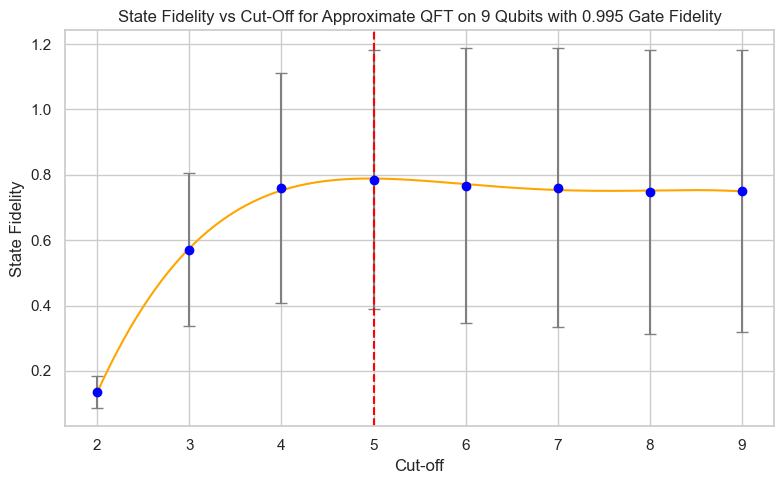

Maximum Fidelity: 0.7887 at cut-off ≈ 4.00
At non-integer cut off Maximum Fidelity: 0.7887 at cut-off ≈ 3.95


(4, 3.9547738693467336, [4, 4])

In [44]:
#graph_per_fidelity(6, 0.996, 0.9954576969146729, 0.02) 
graph_per_fidelity(9, 0.995, 0.9939908027648926, 0.02) 
#graph_per_fidelity(6, 0.974, 0.9698064804077149, 0.02) 

In [198]:
#density plots

def density(n, cut_off, target_fidelity, fidelity):
    df = pd.read_csv(f"C:\\Users\\20221753\\OneDrive - TU Eindhoven\\Desktop\\BEP\\Programming Qiskit\\{target_fidelity}\\qft_results_{n}_qubits_{fidelity}_fidelity.csv")  # Only one column: "fidelity"
    #print(df)
    #print(cutoff_groups)


    df_cutoff=df[df['Cut-off'] == cut_off]
    
    sns.kdeplot(df_cutoff['Value'], fill=True, bw_adjust=0.2, color='skyblue', linewidth=2)

    plt.title(f'Density Plot of State Fidelity for {n} Qubit System and Cut-off {cut_off}')
    plt.xlabel('State Fidelity')
    plt.ylabel('Density')
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.tight_layout()
    plt.show()
    

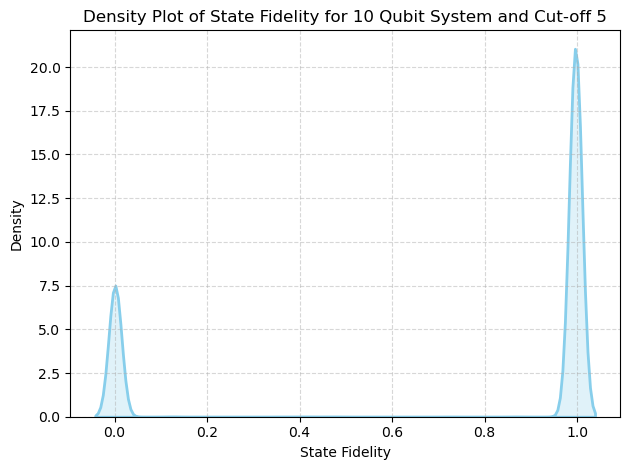

In [210]:
density(10, 5, 0.995, 0.9939908027648926)

In [36]:

def density_plot_multiple_cutoffs(n, cutoffs, target_fidelity, fidelity):
    # Load data
    df = pd.read_csv(
        f"C:\\Users\\20221753\\OneDrive - TU Eindhoven\\Desktop\\BEP\\Programming Qiskit\\{target_fidelity}\\qft_results_{n}_qubits_{fidelity}_fidelity.csv"
    )

    # Set plot style
    sns.set(style="whitegrid")

    # Plot KDE for each cut-off
    plt.figure(figsize=(10, 6))
    for cutoff in cutoffs:
        subset = df[df['Cut-off'] == cutoff]
        
        if not subset.empty:
            sns.kdeplot(
                subset['Value'], fill=True, alpha=0.1,
                label=f'{cutoff+1}',
                bw_adjust=0.3,
                linewidth=2
            )

    # Add plot details
    plt.title(f'Density Plot of Fidelity for Different Cut-Offs for {n} Qubits AQFT Circuit', size=19)
    plt.xlabel('State Fidelity', size=16)
    plt.ylabel('Density', size=16)
    plt.legend(title="Cut-Off")
    plt.grid(True)
    plt.tight_layout()
    plt.show()


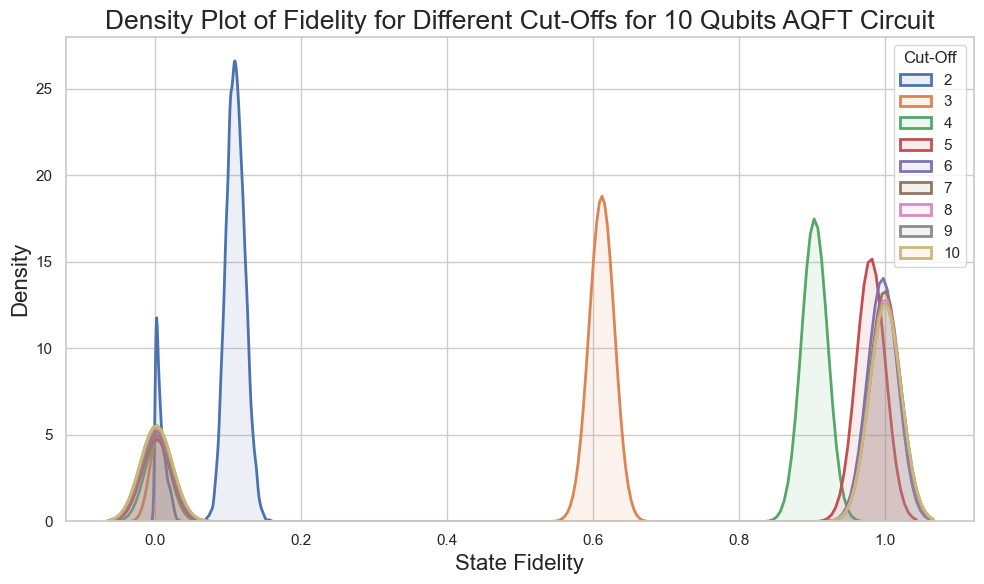

In [37]:
density_plot_multiple_cutoffs(10, [1, 2, 3, 4, 5, 6, 7, 8 ,9], 0.995, 0.9939908027648926)

In [ ]:
def opt_cut_offs_diff_fid_real(fidelities):
    lst1=[0.954, 0.974, 0.995, 0.996, 0.997, 0.998, 0.999]
    lst2=[0.949327039718628, 0.9698064804077149, 0.9939908027648926,0.9954576969146729,0.9961935997009277,0.9971898555755615,0.9983320236206055]
    all_opt_cut_offs_real=[]
    qubits=[i for i in range(2,10+1)]
    
    
    for target_fidelity in fidelities: 
        index = lst1.index(target_fidelity)
        fidelity=lst2[index]
        opt_cutoffs_real=[]
        
        for n in range(2,10+1):  
            cutoff=graph_per_fidelity(n, target_fidelity, fidelity)
            cutoff_int=cutoff[0]
            cutoff_real=cutoff[1]
            print(cutoff_int, cutoff_real)
            
            
            
            opt_cutoffs_real.append(cutoff_real)
        
        all_opt_cut_offs_real.append(opt_cutoffs_real)
        
        for opt_cutoffs, target_fidelity in zip(all_opt_cut_offs_real, fidelities): #change integer or real
            print(qubits, opt_cutoffs)
            plt.scatter(qubits, opt_cutoffs, marker='o', label=f'{target_fidelity}', alpha=0.6, edgecolors='k')
        
        #try:
            #popt, _ = curve_fit(poly2, qubits, opt_cutoffs)
            #fit_x = np.linspace(min(qubits), max(qubits), 300)
            #fit_y = poly2(fit_x, *popt)
            #plt.plot(fit_x, fit_y, '--', label=f'Fit {target_fidelity}')
       # except Exception as e:
            #print(f"Fit failed for fidelity {target_fidelity}: {e}")

    plt.xlabel("Number of Qubits")
    plt.ylabel("Optimum Cut-Off")
    plt.title("Optimum Cut-Off vs Number of Qubits for Different Target Fidelities")
    plt.legend(title="Target Fidelity")
    plt.grid(True)
    plt.tight_layout()
    plt.show()
            
            

In [47]:
def opt_cut_offs_diff_fid_int_better(fidelities, threshold):
    lst1=[0.954, 0.974, 0.995, 0.996, 0.997, 0.998, 0.999]
    lst2=[0.949327039718628, 0.9698064804077149, 0.9939908027648926,0.9954576969146729,0.9961935997009277,0.9971898555755615,0.9983320236206055]
    all_opt_cut_offs_int=[]
    qubits=[i for i in range(2,10+1)]
    errbars=[]
    
    standard_colors = ['blue', 'orange', 'green', 'red', 'purple', 
                       'brown', 'pink', 'gray', 'olive', 'cyan']
    
    colors=[standard_colors[i] for i in range(len(fidelities))]
    
    for target_fidelity in fidelities: 
        index = lst1.index(target_fidelity)
        fidelity=lst2[index]
        opt_cutoffs_int=[]
        opt_cutoffs_real=[]
        
        cutoff_lows=[]
        cutoff_highs=[]
        
        for n in range(2,10+1):  
            cutoff=graph_per_fidelity(n, target_fidelity, fidelity, threshold)
            cutoff_int=cutoff[0]
            cutoff_real=cutoff[1]
            cutoff_err_low=cutoff[2][0]
            cutoff_err_high=cutoff[2][1]
            print(cutoff_int, cutoff_real)
            
            cutoff_lows.append(cutoff_err_low)
            cutoff_highs.append(cutoff_err_high)
            
            
            opt_cutoffs_int.append(cutoff_int)
        print(cutoff_lows, cutoff_highs) 
        lower_errorbars=[opt_cutoffs_int[i]-cutoff_lows[i] for i in range(9)]
        upper_errorbars=[cutoff_highs[i]-opt_cutoffs_int[i] for i in range(9)]
        errorbar = [lower_errorbars, upper_errorbars]
        
        all_opt_cut_offs_int.append(opt_cutoffs_int)
        errbars.append(errorbar)
        
        # Fixed horizontal offsets so points are equally spaced per qubit value
        offsets = np.linspace(-0.15, 0.15, len(fidelities))  # e.g., for 3 fidelities: [-0.25, 0, 0.25]

        
        for i, (opt_cutoffs, errs, color, target_fidelity) in enumerate(zip(all_opt_cut_offs_int, errbars, colors, fidelities)):
            x_jittered = qubits + offsets[i]
            plt.errorbar(x_jittered, [opt+1 for opt in opt_cutoffs], yerr=errs, fmt='o', color=color, ecolor=color, capsize=4, label=f'{target_fidelity}')
        
        #try:
            #popt, _ = curve_fit(poly2, qubits, opt_cutoffs)
            #fit_x = np.linspace(min(qubits), max(qubits), 300)
            #fit_y = poly2(fit_x, *popt)
            #plt.plot(fit_x, fit_y, '--', label=f'Fit {target_fidelity}')
       # except Exception as e:
            #print(f"Fit failed for fidelity {target_fidelity}: {e}")

    plt.xlabel("Number of Qubits")
    plt.ylabel("Optimum Cut-Off")
    plt.title("Optimum Cut-Off vs Number of Qubits for Different Gate Fidelities")
    plt.legend(title="Gate Fidelity")
    plt.xticks(qubits)             # Set x-axis ticks exactly at all integers in qubits list
    plt.grid(True, which='both')   # Enable grid for both major and minor ticks (optional)    plt.tight_layout()
    plt.show()
            
            

[0.8504417]


C:\Users\20221753\AppData\Local\Temp\ipykernel_12504\3180408729.py:12: RankWarning: Polyfit may be poorly conditioned
  p_fit = np.polyfit(cut_offs, fidelities, degree)


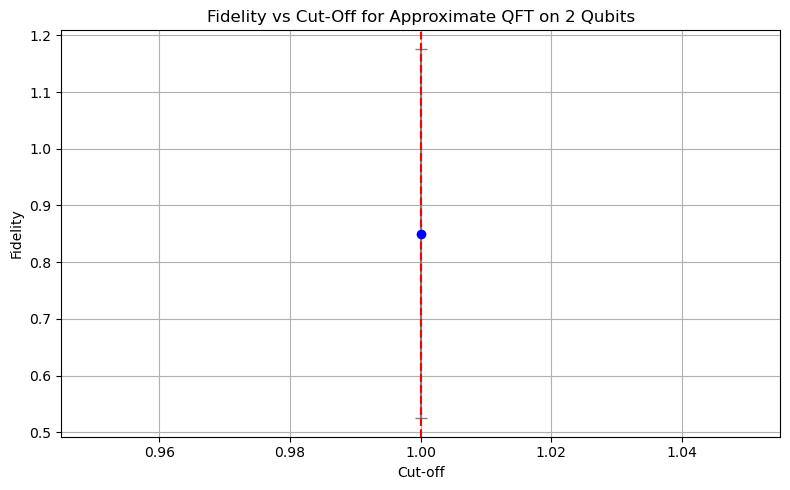

Maximum Fidelity: 0.8504 at cut-off ≈ 1.00
At non-integer cut off Maximum Fidelity: 0.8504 at cut-off ≈ 1.00
1 1.0
[0.7285435  0.76485135]


C:\Users\20221753\AppData\Local\Temp\ipykernel_12504\3180408729.py:12: RankWarning: Polyfit may be poorly conditioned
  p_fit = np.polyfit(cut_offs, fidelities, degree)


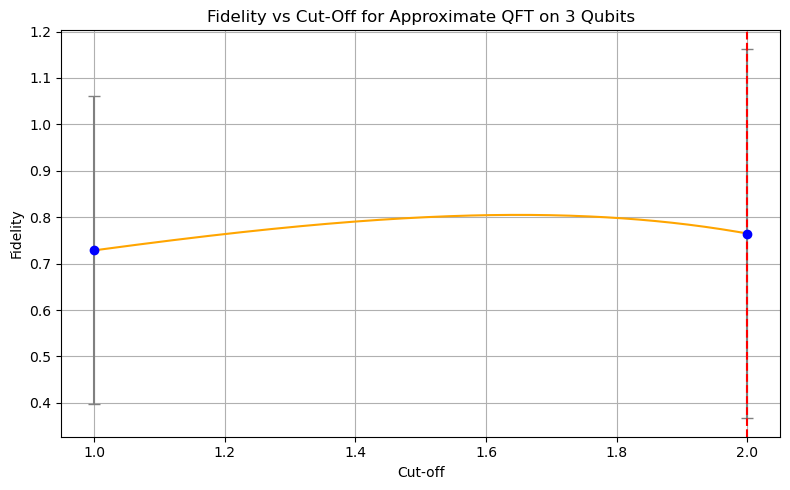

Maximum Fidelity: 0.7649 at cut-off ≈ 2.00
At non-integer cut off Maximum Fidelity: 0.8050 at cut-off ≈ 1.65
2 1.6482412060301508
[0.48687413 0.58164477 0.57037132]


C:\Users\20221753\AppData\Local\Temp\ipykernel_12504\3180408729.py:12: RankWarning: Polyfit may be poorly conditioned
  p_fit = np.polyfit(cut_offs, fidelities, degree)


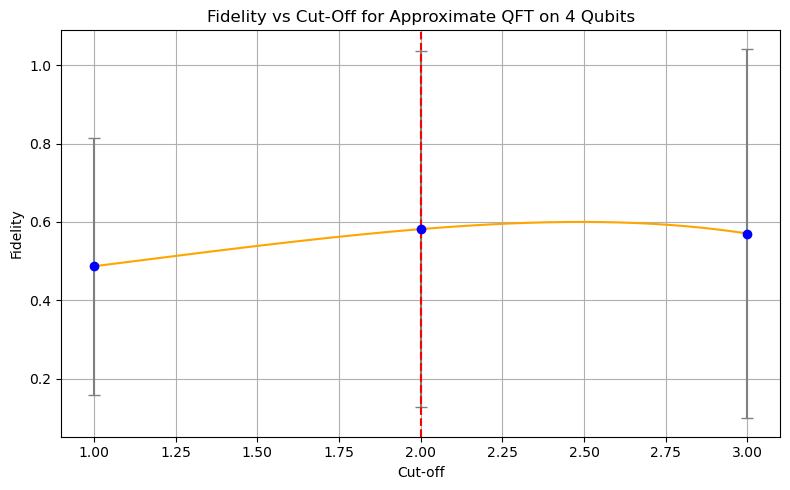

Maximum Fidelity: 0.5816 at cut-off ≈ 2.00
At non-integer cut off Maximum Fidelity: 0.6000 at cut-off ≈ 2.49
2 2.4874371859296485
[0.35396704 0.50190578 0.4806039  0.45956905]


C:\Users\20221753\AppData\Local\Temp\ipykernel_12504\3180408729.py:12: RankWarning: Polyfit may be poorly conditioned
  p_fit = np.polyfit(cut_offs, fidelities, degree)


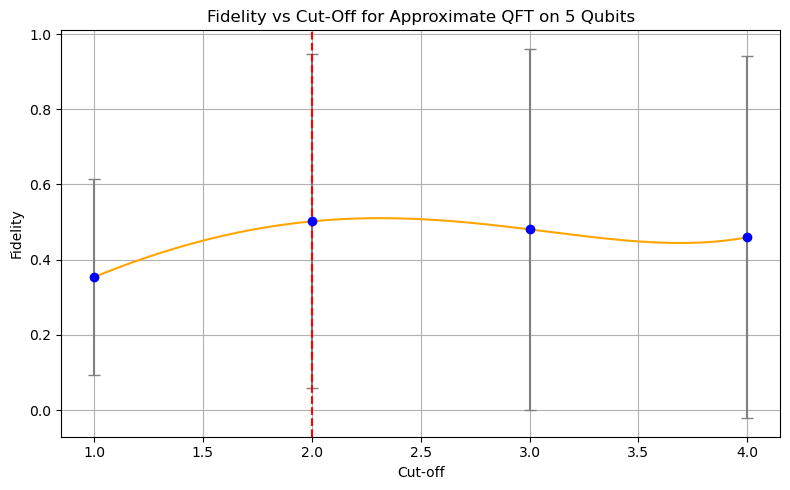

Maximum Fidelity: 0.5019 at cut-off ≈ 2.00
At non-integer cut off Maximum Fidelity: 0.5104 at cut-off ≈ 2.31
2 2.3115577889447234
[0.21494217 0.35954521 0.34443847 0.31781598 0.31551526]


C:\Users\20221753\AppData\Local\Temp\ipykernel_12504\3180408729.py:12: RankWarning: Polyfit may be poorly conditioned
  p_fit = np.polyfit(cut_offs, fidelities, degree)


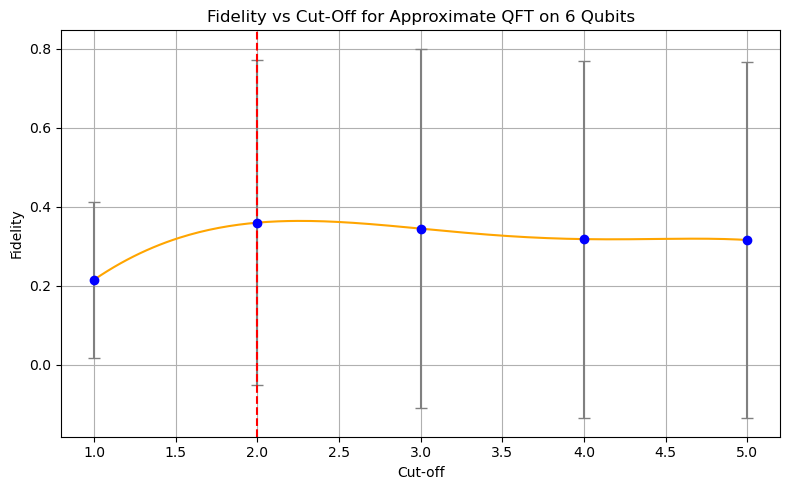

Maximum Fidelity: 0.3595 at cut-off ≈ 2.00
At non-integer cut off Maximum Fidelity: 0.3640 at cut-off ≈ 2.27
2 2.266331658291457
[0.14406677 0.29264109 0.28848295 0.25434173 0.24034863 0.22702704]


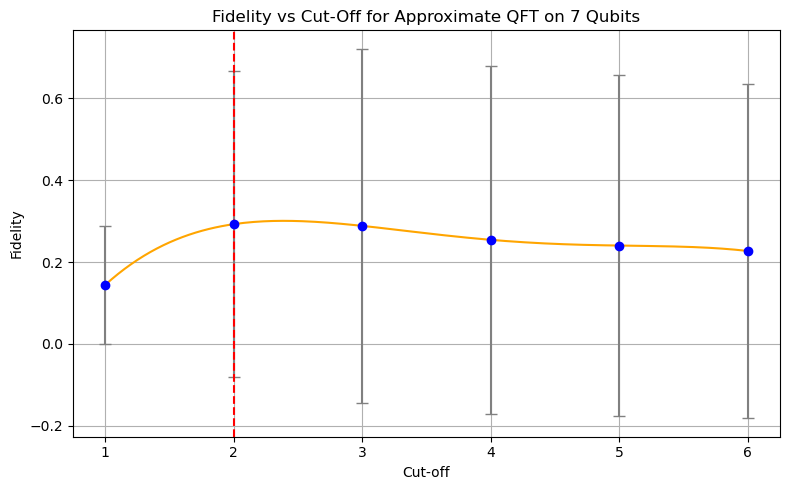

Maximum Fidelity: 0.2926 at cut-off ≈ 2.00
At non-integer cut off Maximum Fidelity: 0.3008 at cut-off ≈ 2.38
2 2.381909547738694
[0.08803326 0.20970181 0.21349537 0.1848648  0.1642528  0.14971584
 0.14031762]


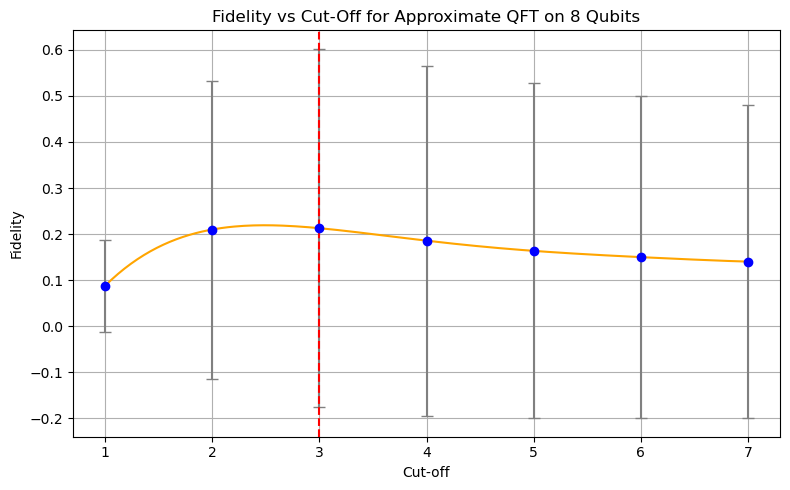

Maximum Fidelity: 0.2128 at cut-off ≈ 3.00
At non-integer cut off Maximum Fidelity: 0.2192 at cut-off ≈ 2.48
3 2.477386934673367
[0.05993497 0.17465008 0.1698495  0.14897105 0.12250398 0.11011793
 0.09896368 0.09945141]


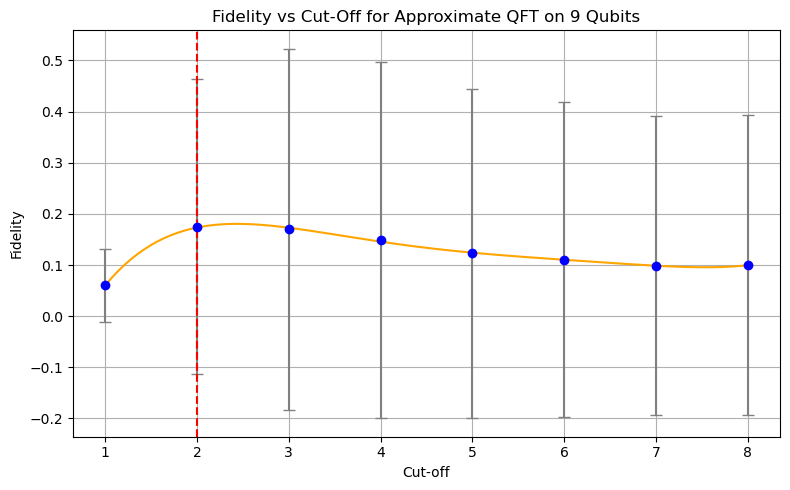

Maximum Fidelity: 0.1733 at cut-off ≈ 2.00
At non-integer cut off Maximum Fidelity: 0.1805 at cut-off ≈ 2.44
2 2.442211055276382
[0.03588596 0.11914719 0.12367017 0.10790058 0.0869252  0.07561011
 0.06083267 0.05731655 0.05249052]


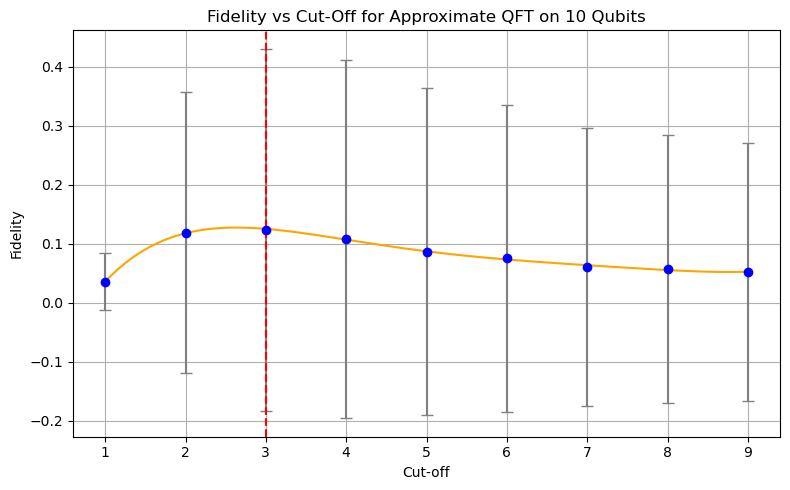

Maximum Fidelity: 0.1254 at cut-off ≈ 3.00
At non-integer cut off Maximum Fidelity: 0.1276 at cut-off ≈ 2.65
3 2.648241206030151
[2, 3, 4, 5, 6, 7, 8, 9, 10] [1.0, 1.6482412060301508, 2.4874371859296485, 2.3115577889447234, 2.266331658291457, 2.381909547738694, 2.477386934673367, 2.442211055276382, 2.648241206030151]
[0.90803658]


C:\Users\20221753\AppData\Local\Temp\ipykernel_12504\3180408729.py:12: RankWarning: Polyfit may be poorly conditioned
  p_fit = np.polyfit(cut_offs, fidelities, degree)


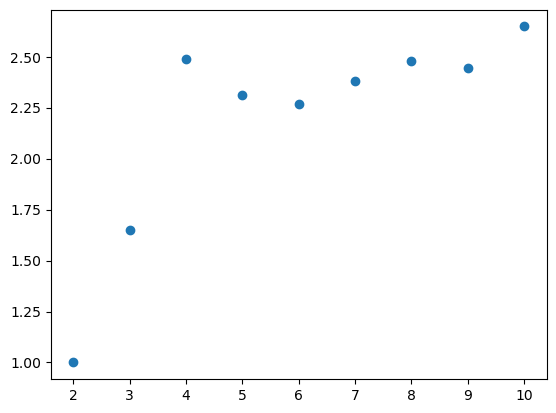

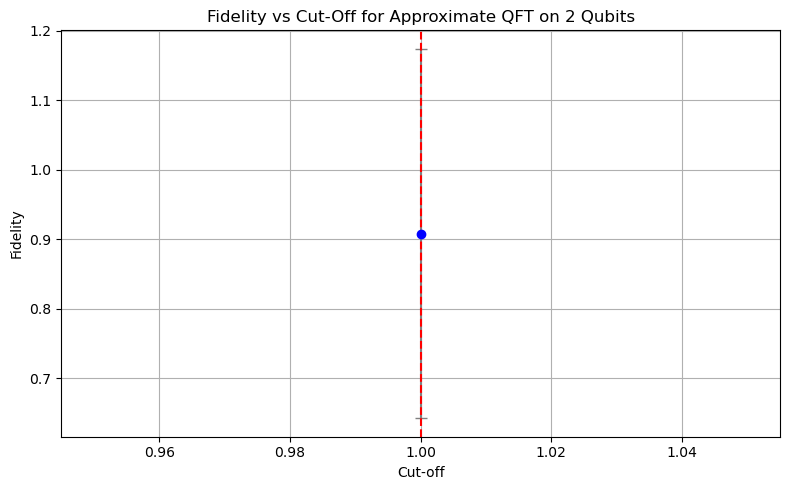

Maximum Fidelity: 0.9080 at cut-off ≈ 1.00
At non-integer cut off Maximum Fidelity: 0.9080 at cut-off ≈ 1.00
1 1.0
[0.79347729 0.85329307]


C:\Users\20221753\AppData\Local\Temp\ipykernel_12504\3180408729.py:12: RankWarning: Polyfit may be poorly conditioned
  p_fit = np.polyfit(cut_offs, fidelities, degree)


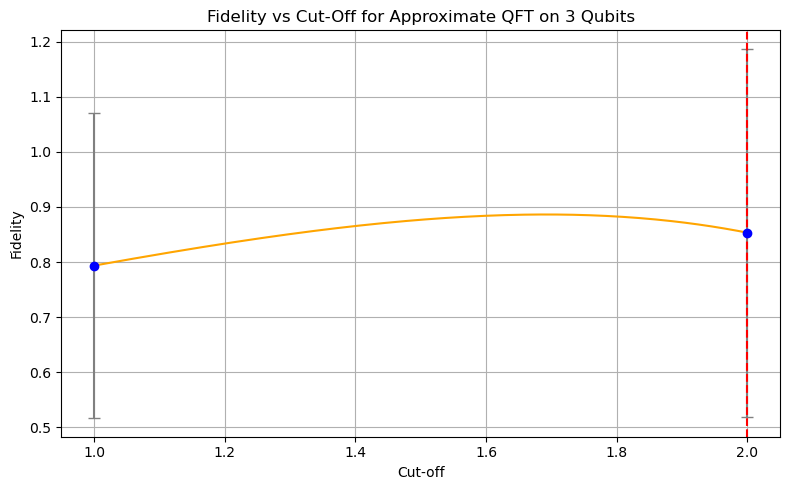

Maximum Fidelity: 0.8533 at cut-off ≈ 2.00
At non-integer cut off Maximum Fidelity: 0.8863 at cut-off ≈ 1.69
2 1.6934673366834172
[0.56807753 0.71298597 0.71521968]


C:\Users\20221753\AppData\Local\Temp\ipykernel_12504\3180408729.py:12: RankWarning: Polyfit may be poorly conditioned
  p_fit = np.polyfit(cut_offs, fidelities, degree)


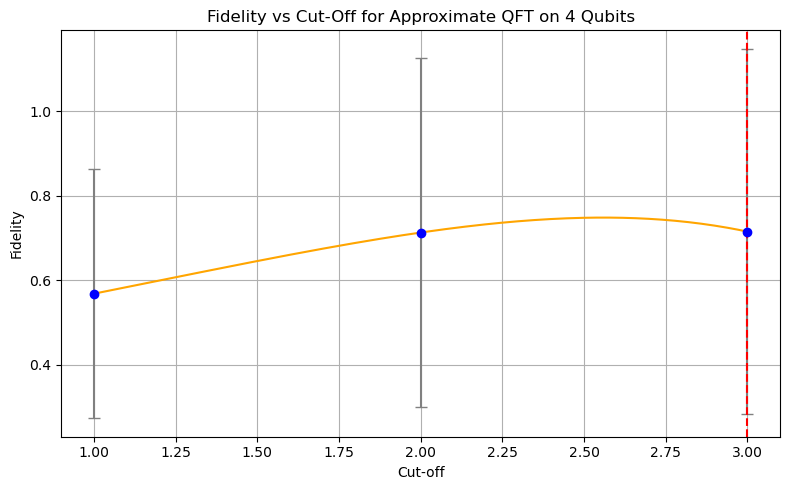

Maximum Fidelity: 0.7152 at cut-off ≈ 3.00
At non-integer cut off Maximum Fidelity: 0.7484 at cut-off ≈ 2.56
3 2.557788944723618
[0.41661807 0.63104125 0.64684501 0.63328135]


C:\Users\20221753\AppData\Local\Temp\ipykernel_12504\3180408729.py:12: RankWarning: Polyfit may be poorly conditioned
  p_fit = np.polyfit(cut_offs, fidelities, degree)


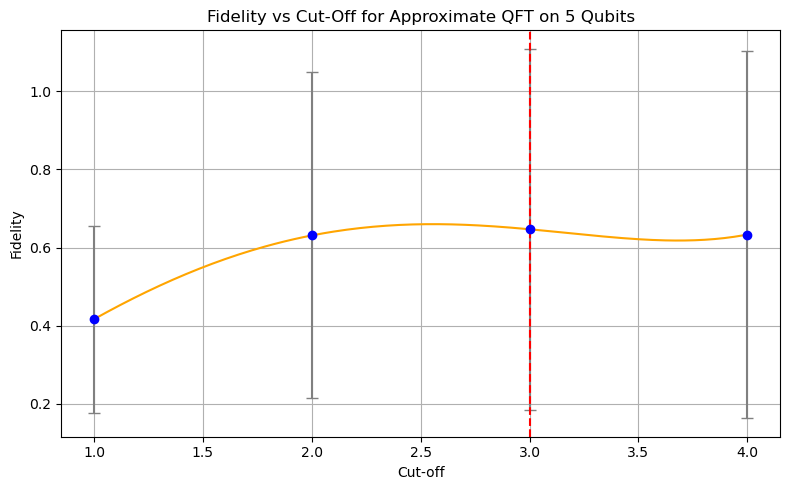

Maximum Fidelity: 0.6468 at cut-off ≈ 3.00
At non-integer cut off Maximum Fidelity: 0.6599 at cut-off ≈ 2.55
3 2.5527638190954773
[0.27941527 0.50941081 0.52039094 0.51480371 0.49481279]


C:\Users\20221753\AppData\Local\Temp\ipykernel_12504\3180408729.py:12: RankWarning: Polyfit may be poorly conditioned
  p_fit = np.polyfit(cut_offs, fidelities, degree)


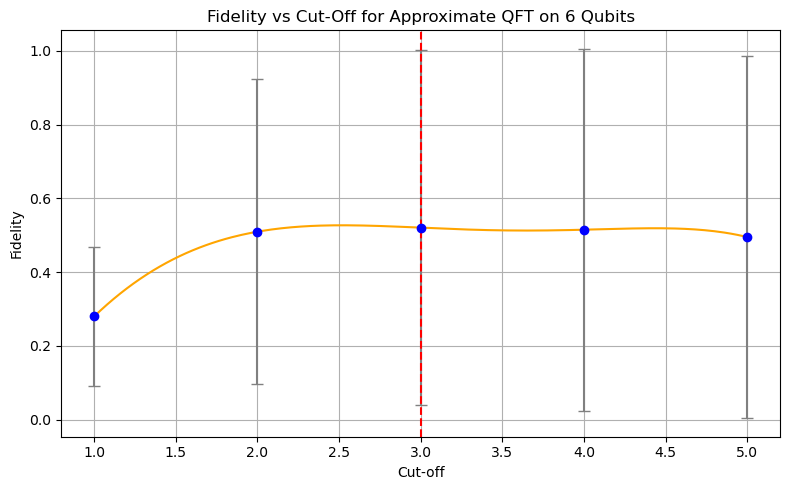

Maximum Fidelity: 0.5204 at cut-off ≈ 3.00
At non-integer cut off Maximum Fidelity: 0.5268 at cut-off ≈ 2.53
3 2.527638190954774
[0.19639306 0.43096782 0.4661937  0.44148565 0.42867256 0.4077189 ]


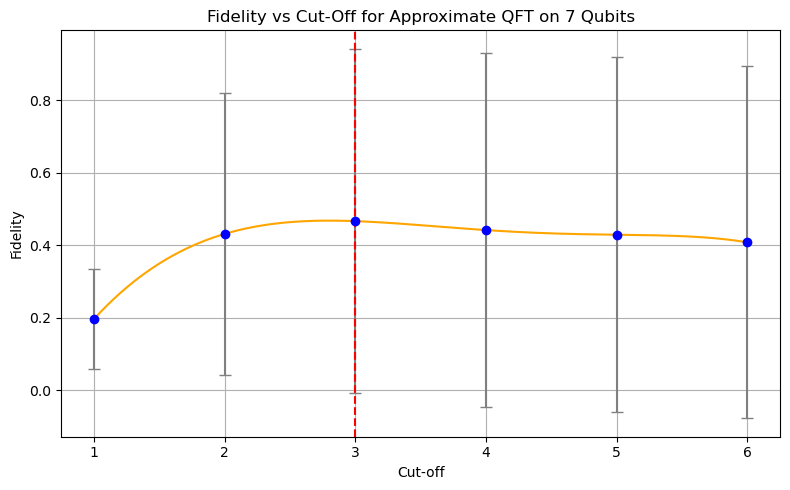

Maximum Fidelity: 0.4662 at cut-off ≈ 3.00
At non-integer cut off Maximum Fidelity: 0.4676 at cut-off ≈ 2.81
3 2.809045226130653
[0.12473236 0.3336287  0.38175375 0.35621662 0.33671127 0.31058483
 0.30680066]


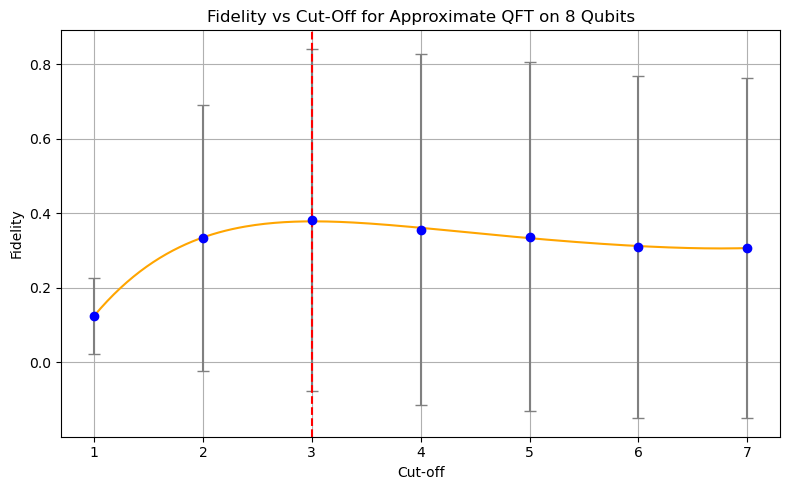

Maximum Fidelity: 0.3782 at cut-off ≈ 3.00
At non-integer cut off Maximum Fidelity: 0.3782 at cut-off ≈ 3.02
3 3.020100502512563
[0.08787859 0.29773726 0.34290735 0.3152064  0.28127905 0.2722004
 0.25862294 0.23599515]


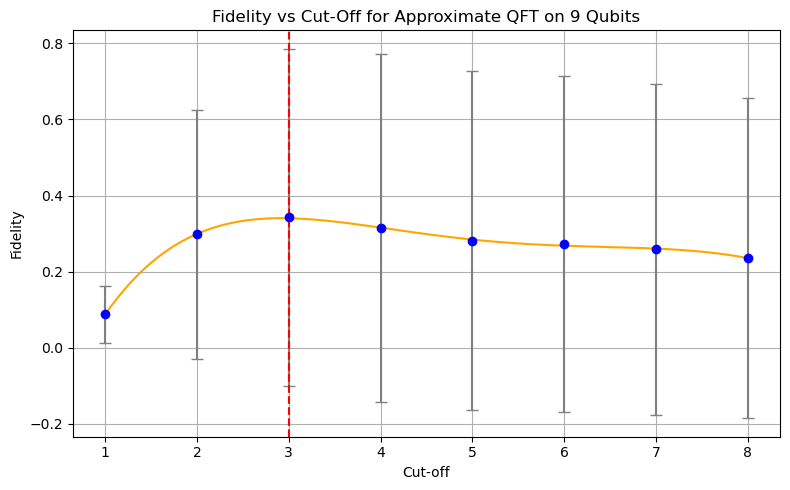

Maximum Fidelity: 0.3404 at cut-off ≈ 3.00
At non-integer cut off Maximum Fidelity: 0.3406 at cut-off ≈ 2.93
3 2.934673366834171
[0.05553759 0.24110751 0.2752723  0.25717364 0.22128753 0.20159428
 0.18617765 0.17389863 0.16977725]


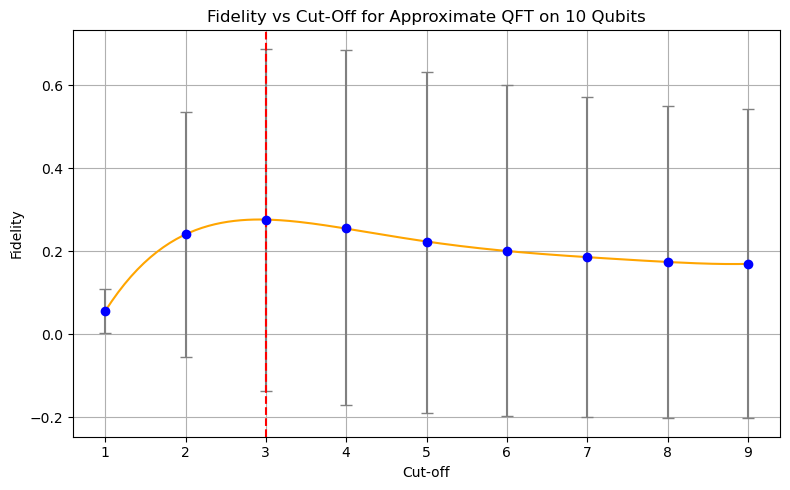

Maximum Fidelity: 0.2765 at cut-off ≈ 3.00
At non-integer cut off Maximum Fidelity: 0.2767 at cut-off ≈ 2.93
3 2.92964824120603
[2, 3, 4, 5, 6, 7, 8, 9, 10] [1.0, 1.6482412060301508, 2.4874371859296485, 2.3115577889447234, 2.266331658291457, 2.381909547738694, 2.477386934673367, 2.442211055276382, 2.648241206030151]
[2, 3, 4, 5, 6, 7, 8, 9, 10] [1.0, 1.6934673366834172, 2.557788944723618, 2.5527638190954773, 2.527638190954774, 2.809045226130653, 3.020100502512563, 2.934673366834171, 2.92964824120603]
[0.97731433]


C:\Users\20221753\AppData\Local\Temp\ipykernel_12504\3180408729.py:12: RankWarning: Polyfit may be poorly conditioned
  p_fit = np.polyfit(cut_offs, fidelities, degree)


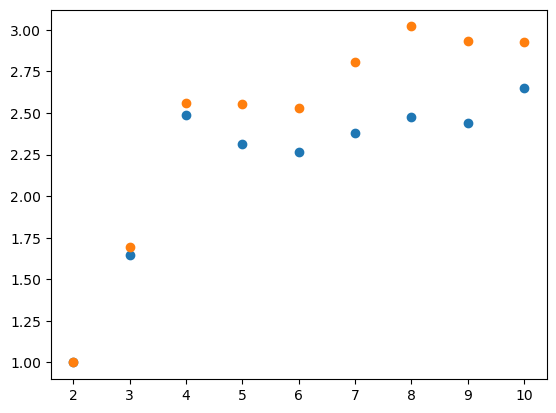

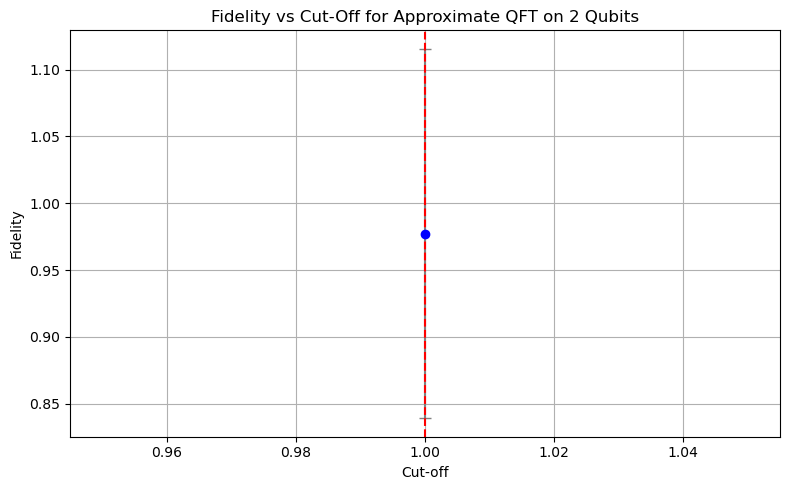

Maximum Fidelity: 0.9773 at cut-off ≈ 1.00
At non-integer cut off Maximum Fidelity: 0.9773 at cut-off ≈ 1.00
1 1.0
[0.8795877 0.9656111]


C:\Users\20221753\AppData\Local\Temp\ipykernel_12504\3180408729.py:12: RankWarning: Polyfit may be poorly conditioned
  p_fit = np.polyfit(cut_offs, fidelities, degree)


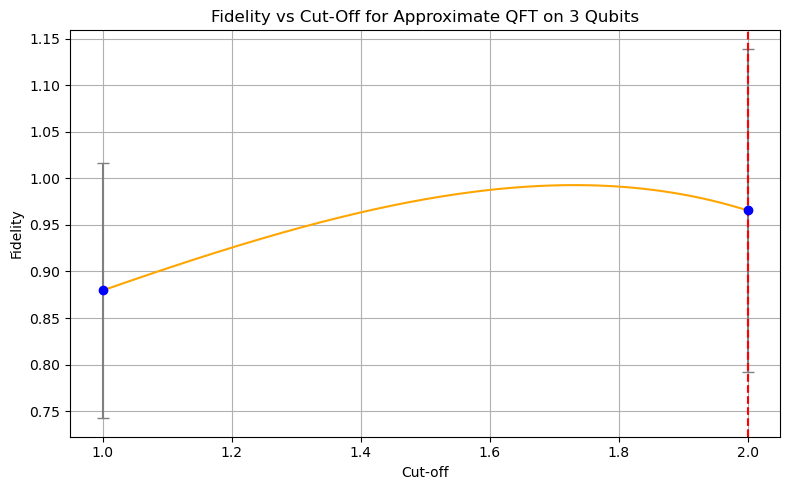

Maximum Fidelity: 0.9656 at cut-off ≈ 2.00
At non-integer cut off Maximum Fidelity: 0.9929 at cut-off ≈ 1.73
2 1.7336683417085426
[0.69654597 0.91210795 0.93653009]


C:\Users\20221753\AppData\Local\Temp\ipykernel_12504\3180408729.py:12: RankWarning: Polyfit may be poorly conditioned
  p_fit = np.polyfit(cut_offs, fidelities, degree)


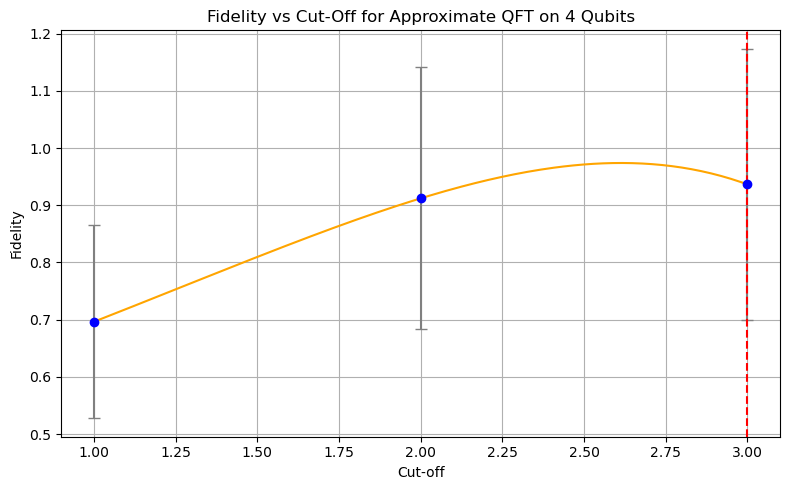

Maximum Fidelity: 0.9365 at cut-off ≈ 3.00
At non-integer cut off Maximum Fidelity: 0.9739 at cut-off ≈ 2.61
3 2.608040201005025
[0.52843813 0.85603547 0.90922561 0.91195471]


C:\Users\20221753\AppData\Local\Temp\ipykernel_12504\3180408729.py:12: RankWarning: Polyfit may be poorly conditioned
  p_fit = np.polyfit(cut_offs, fidelities, degree)


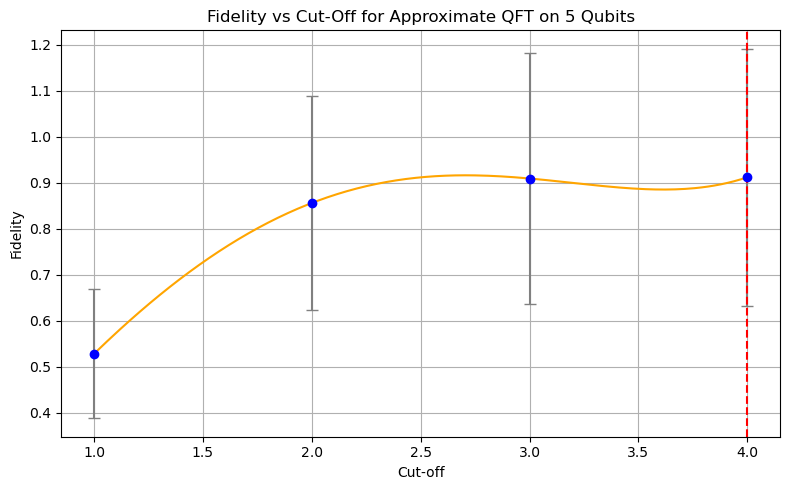

Maximum Fidelity: 0.9120 at cut-off ≈ 4.00
At non-integer cut off Maximum Fidelity: 0.9162 at cut-off ≈ 2.70
4 2.7035175879396984
[0.37772541 0.77154147 0.86481523 0.86522882 0.86573641]


C:\Users\20221753\AppData\Local\Temp\ipykernel_12504\3180408729.py:12: RankWarning: Polyfit may be poorly conditioned
  p_fit = np.polyfit(cut_offs, fidelities, degree)


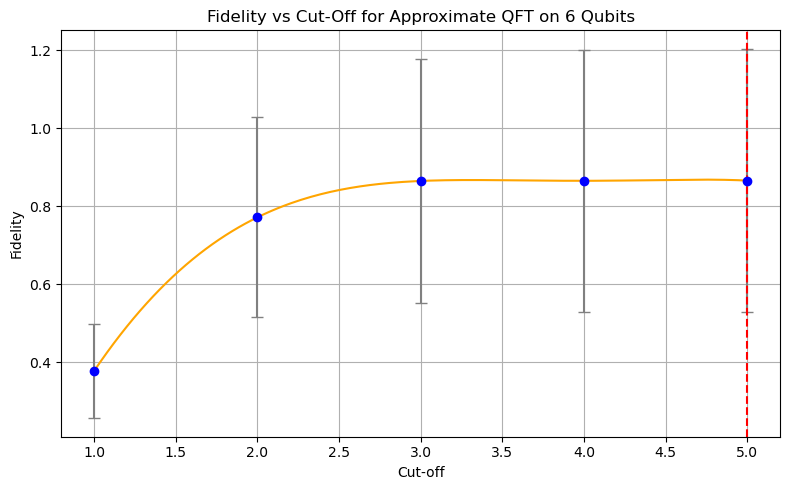

Maximum Fidelity: 0.8657 at cut-off ≈ 5.00
At non-integer cut off Maximum Fidelity: 0.8682 at cut-off ≈ 4.72
5 4.71859296482412
[0.27083386 0.70176217 0.83189325 0.84777665 0.83586867 0.84508175]


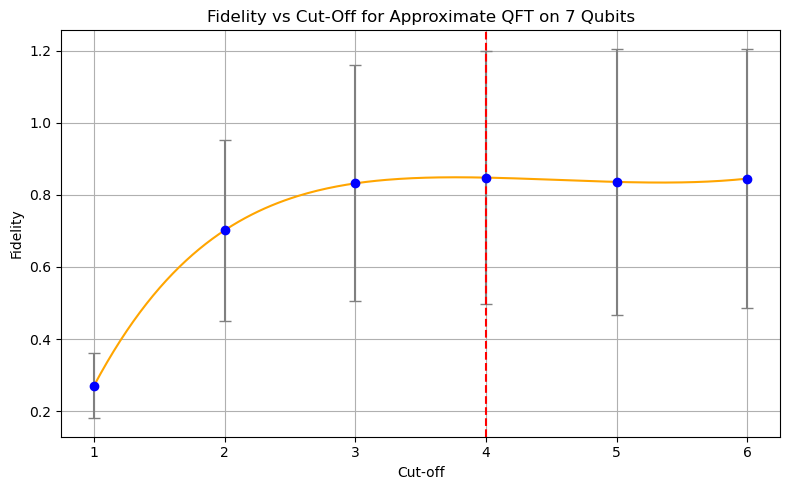

Maximum Fidelity: 0.8478 at cut-off ≈ 4.00
At non-integer cut off Maximum Fidelity: 0.8487 at cut-off ≈ 3.76
4 3.763819095477387
[0.19105678 0.62869651 0.78023315 0.80995469 0.79908507 0.7942064
 0.78217737]


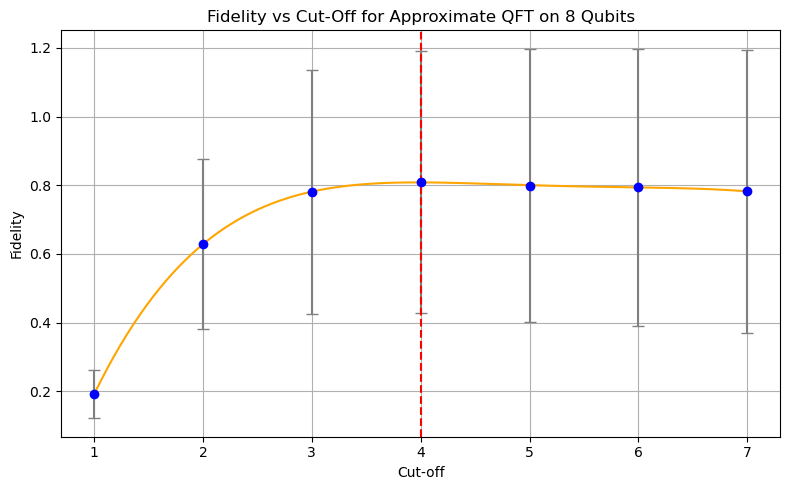

Maximum Fidelity: 0.8084 at cut-off ≈ 4.00
At non-integer cut off Maximum Fidelity: 0.8084 at cut-off ≈ 3.98
4 3.9849246231155777
[0.13597171 0.5708392  0.75986751 0.78467439 0.76726329 0.76102193
 0.74791197 0.75017908]


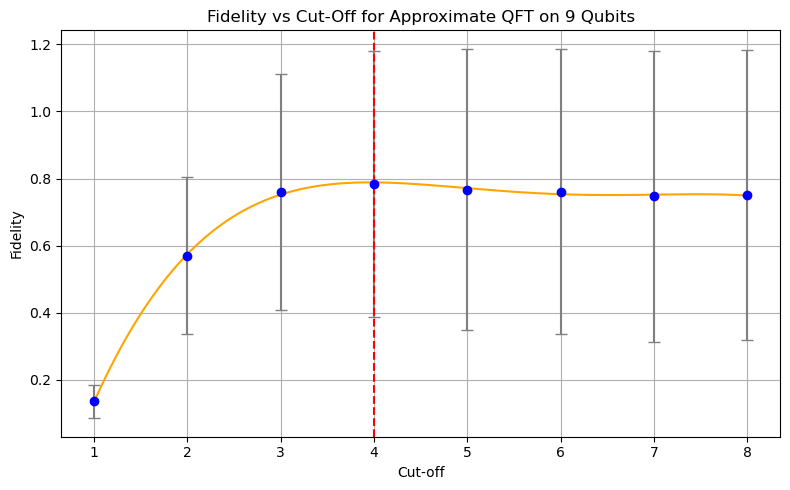

Maximum Fidelity: 0.7888 at cut-off ≈ 4.00
At non-integer cut off Maximum Fidelity: 0.7888 at cut-off ≈ 3.95
4 3.9547738693467336
[0.09576426 0.50257598 0.71353178 0.74554389 0.73403899 0.71700873
 0.70224231 0.69442708 0.69334081]


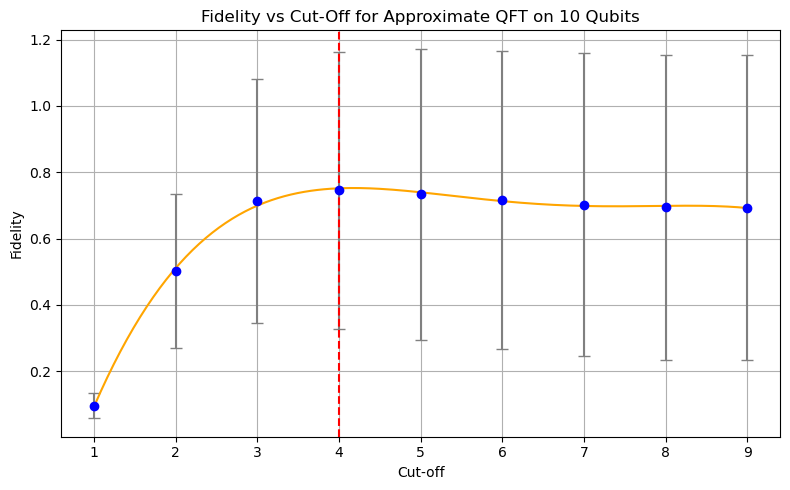

Maximum Fidelity: 0.7517 at cut-off ≈ 4.00
At non-integer cut off Maximum Fidelity: 0.7526 at cut-off ≈ 4.18
4 4.175879396984925
[2, 3, 4, 5, 6, 7, 8, 9, 10] [1.0, 1.6482412060301508, 2.4874371859296485, 2.3115577889447234, 2.266331658291457, 2.381909547738694, 2.477386934673367, 2.442211055276382, 2.648241206030151]
[2, 3, 4, 5, 6, 7, 8, 9, 10] [1.0, 1.6934673366834172, 2.557788944723618, 2.5527638190954773, 2.527638190954774, 2.809045226130653, 3.020100502512563, 2.934673366834171, 2.92964824120603]
[2, 3, 4, 5, 6, 7, 8, 9, 10] [1.0, 1.7336683417085426, 2.608040201005025, 2.7035175879396984, 4.71859296482412, 3.763819095477387, 3.9849246231155777, 3.9547738693467336, 4.175879396984925]


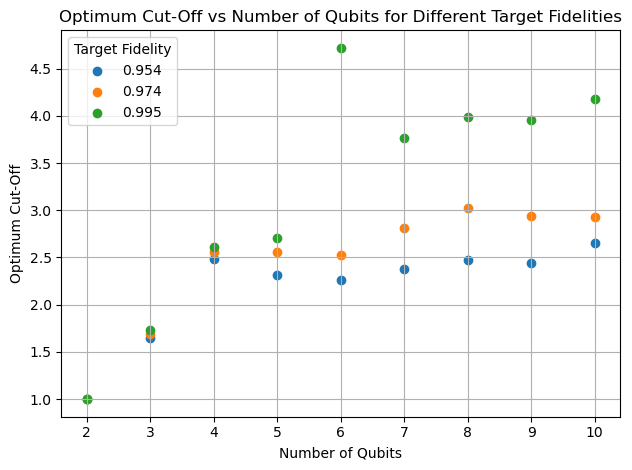

In [274]:
#real
opt_cut_offs_diff_fid_real([0.954, 0.974, 0.995])

[0.8504417]


C:\Users\20221753\AppData\Local\Temp\ipykernel_28660\2744195943.py:12: RankWarning: Polyfit may be poorly conditioned
  p_fit = np.polyfit(cut_offs, fidelities, degree)


<Figure size 1000x600 with 0 Axes>

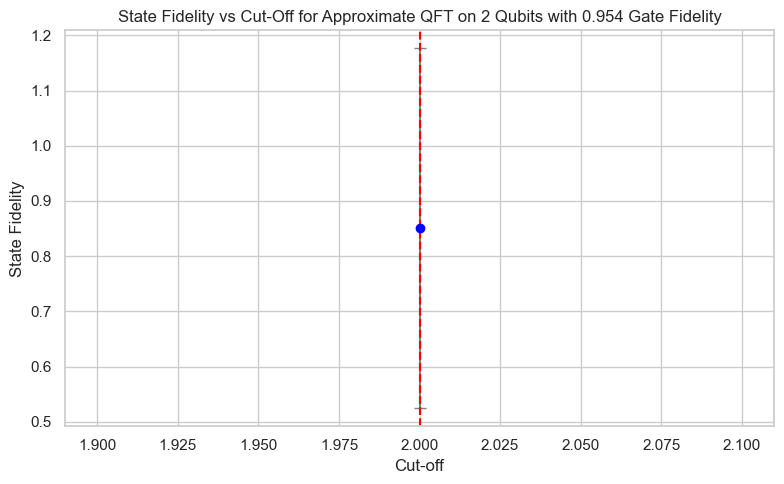

Maximum Fidelity: 0.8504 at cut-off ≈ 1.00
At non-integer cut off Maximum Fidelity: 0.8504 at cut-off ≈ 1.00
1 1.0
[0.7285435  0.76485135]


C:\Users\20221753\AppData\Local\Temp\ipykernel_28660\2744195943.py:12: RankWarning: Polyfit may be poorly conditioned
  p_fit = np.polyfit(cut_offs, fidelities, degree)


<Figure size 1000x600 with 0 Axes>

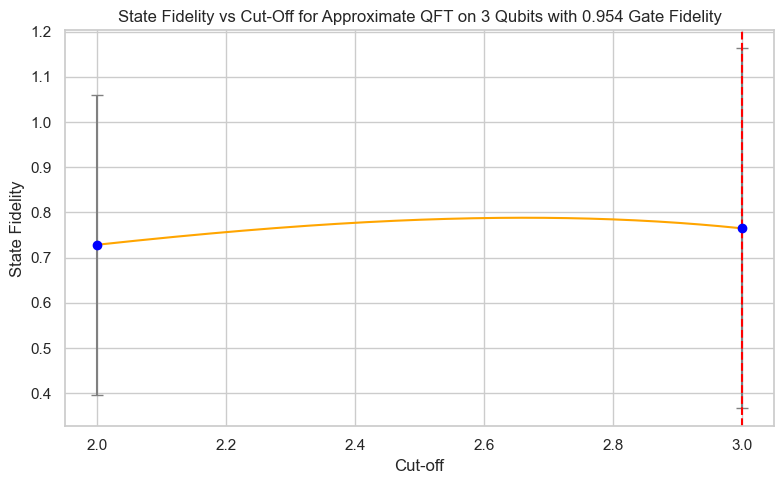

Maximum Fidelity: 0.7649 at cut-off ≈ 2.00
At non-integer cut off Maximum Fidelity: 0.7883 at cut-off ≈ 1.66
2 1.6633165829145728
[0.48687413 0.58164477 0.57037132]


C:\Users\20221753\AppData\Local\Temp\ipykernel_28660\2744195943.py:12: RankWarning: Polyfit may be poorly conditioned
  p_fit = np.polyfit(cut_offs, fidelities, degree)


<Figure size 1000x600 with 0 Axes>

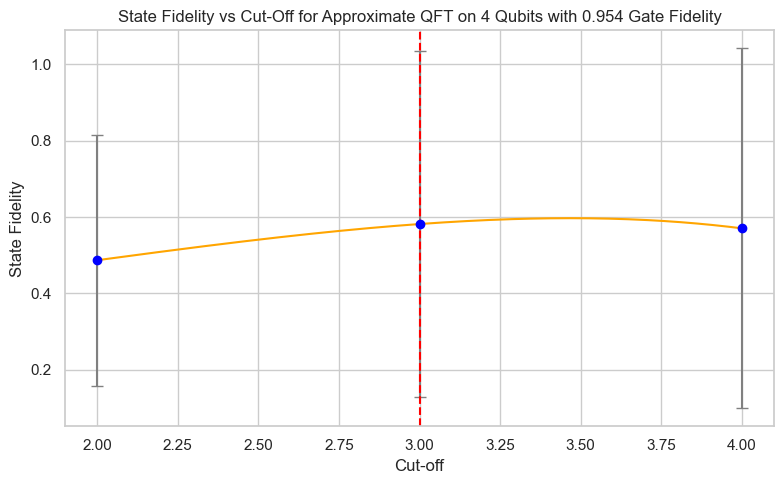

Maximum Fidelity: 0.5816 at cut-off ≈ 2.00
At non-integer cut off Maximum Fidelity: 0.5970 at cut-off ≈ 2.47
2 2.467336683417085
[0.35396704 0.50190578 0.4806039  0.45956905]


C:\Users\20221753\AppData\Local\Temp\ipykernel_28660\2744195943.py:12: RankWarning: Polyfit may be poorly conditioned
  p_fit = np.polyfit(cut_offs, fidelities, degree)


<Figure size 1000x600 with 0 Axes>

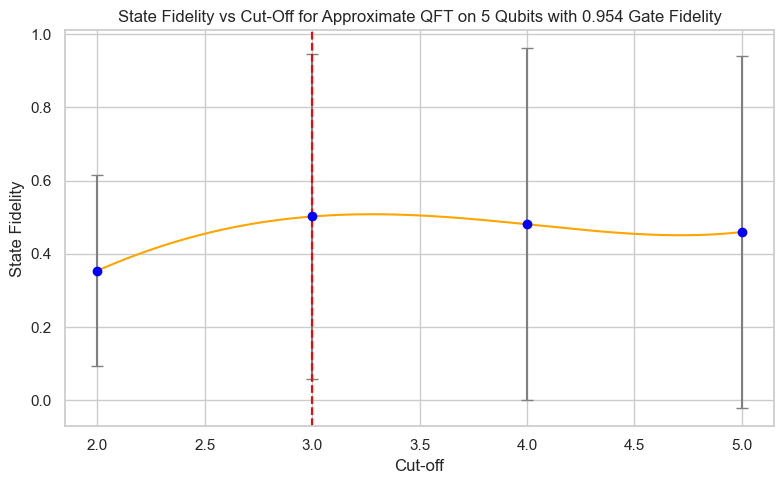

Maximum Fidelity: 0.5019 at cut-off ≈ 2.00
At non-integer cut off Maximum Fidelity: 0.5080 at cut-off ≈ 2.28
2 2.2814070351758793
[0.21494217 0.35954521 0.34443847 0.31781598 0.31551526]


<Figure size 1000x600 with 0 Axes>

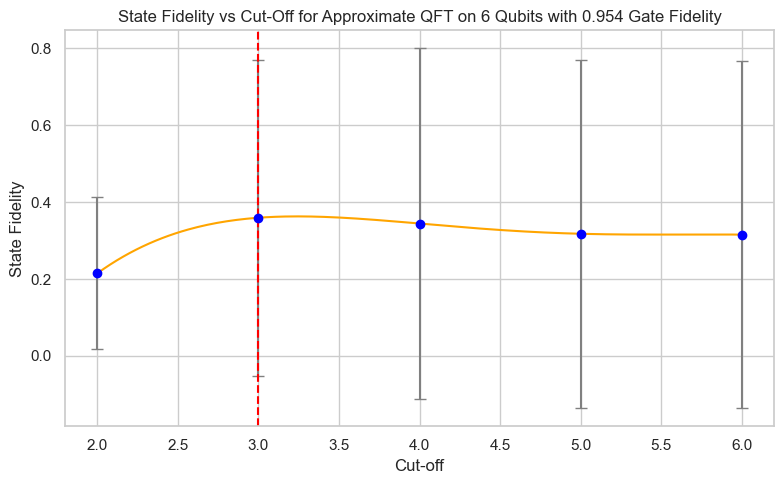

Maximum Fidelity: 0.3595 at cut-off ≈ 2.00
At non-integer cut off Maximum Fidelity: 0.3630 at cut-off ≈ 2.25
2 2.2462311557788945
[0.14406677 0.29264109 0.28848295 0.25434173 0.24034863 0.22702704]


<Figure size 1000x600 with 0 Axes>

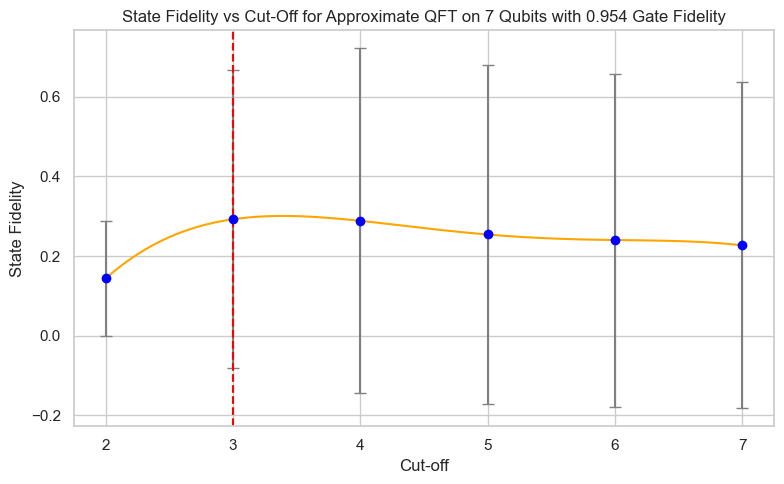

Maximum Fidelity: 0.2926 at cut-off ≈ 2.00
At non-integer cut off Maximum Fidelity: 0.3009 at cut-off ≈ 2.38
2 2.381909547738694
[0.08803326 0.20970181 0.21349537 0.1848648  0.1642528  0.14971584
 0.14031762]


<Figure size 1000x600 with 0 Axes>

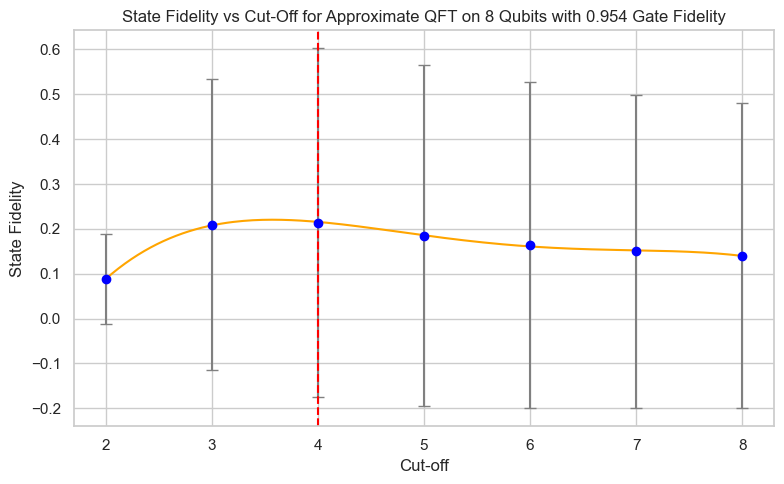

Maximum Fidelity: 0.2156 at cut-off ≈ 3.00
At non-integer cut off Maximum Fidelity: 0.2204 at cut-off ≈ 2.57
3 2.567839195979899
[0.05993497 0.17465008 0.1698495  0.14897105 0.12250398 0.11011793
 0.09896368 0.09945141]


<Figure size 1000x600 with 0 Axes>

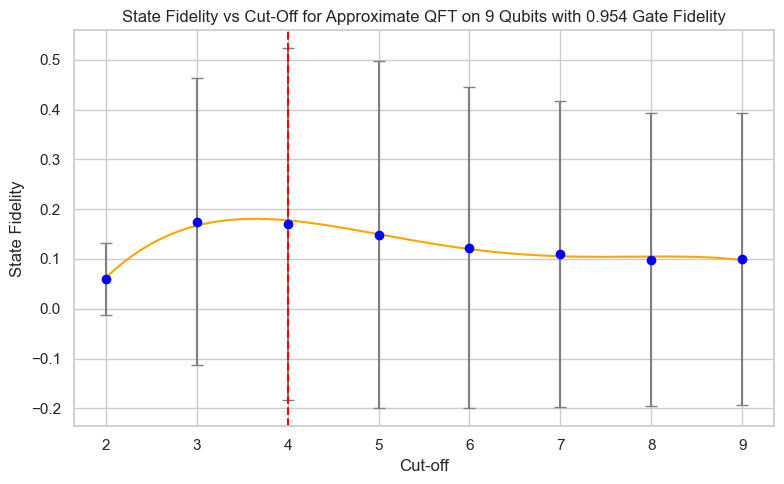

Maximum Fidelity: 0.1776 at cut-off ≈ 3.00
At non-integer cut off Maximum Fidelity: 0.1807 at cut-off ≈ 2.65
3 2.6532663316582914
[0.03588596 0.11914719 0.12367017 0.10790058 0.0869252  0.07561011
 0.06083267 0.05731655 0.05249052]


<Figure size 1000x600 with 0 Axes>

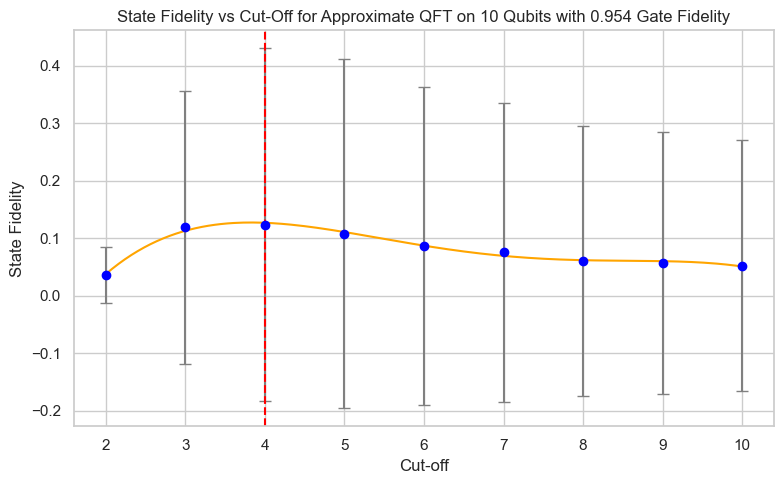

Maximum Fidelity: 0.1271 at cut-off ≈ 3.00
At non-integer cut off Maximum Fidelity: 0.1276 at cut-off ≈ 2.81
3 2.809045226130653
[1, 2, 2, 2, 2, 2, 2, 2, 2] [1, 2, 3, 2, 3, 3, 3, 3, 4]
[0.90803658]


C:\Users\20221753\AppData\Local\Temp\ipykernel_28660\2744195943.py:12: RankWarning: Polyfit may be poorly conditioned
  p_fit = np.polyfit(cut_offs, fidelities, degree)


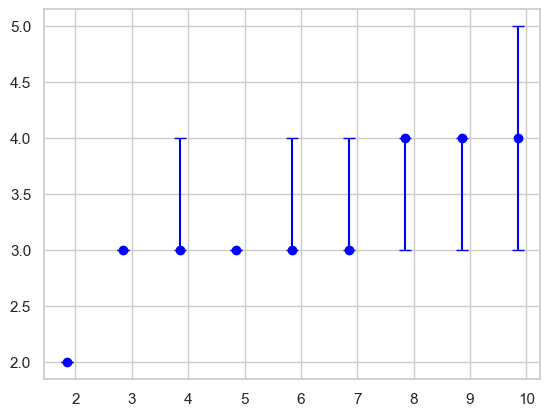

<Figure size 1000x600 with 0 Axes>

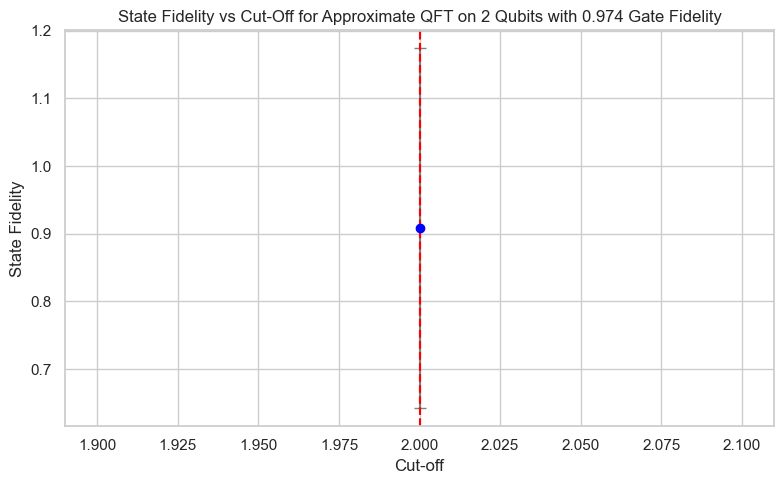

Maximum Fidelity: 0.9080 at cut-off ≈ 1.00
At non-integer cut off Maximum Fidelity: 0.9080 at cut-off ≈ 1.00
1 1.0
[0.79347729 0.85329307]


C:\Users\20221753\AppData\Local\Temp\ipykernel_28660\2744195943.py:12: RankWarning: Polyfit may be poorly conditioned
  p_fit = np.polyfit(cut_offs, fidelities, degree)


<Figure size 1000x600 with 0 Axes>

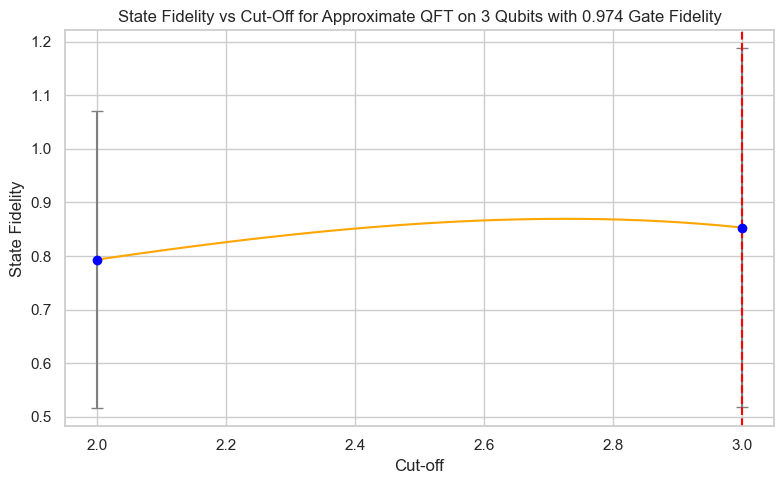

Maximum Fidelity: 0.8533 at cut-off ≈ 2.00
At non-integer cut off Maximum Fidelity: 0.8695 at cut-off ≈ 1.73
2 1.728643216080402
[0.56807753 0.71298597 0.71521968]


C:\Users\20221753\AppData\Local\Temp\ipykernel_28660\2744195943.py:12: RankWarning: Polyfit may be poorly conditioned
  p_fit = np.polyfit(cut_offs, fidelities, degree)


<Figure size 1000x600 with 0 Axes>

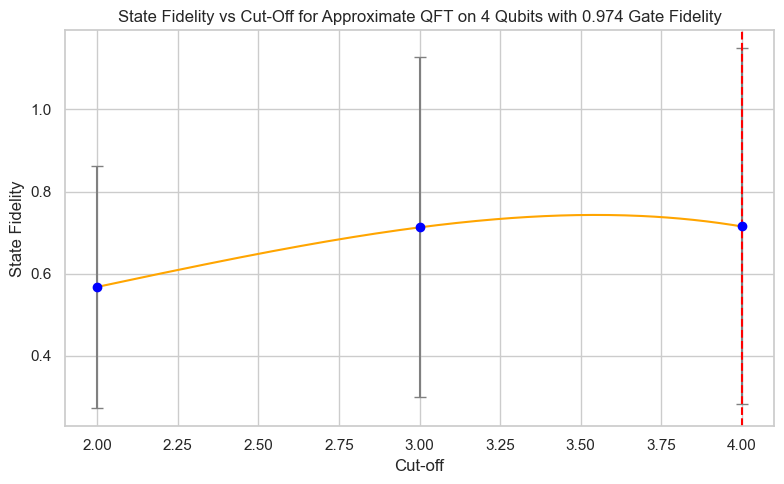

Maximum Fidelity: 0.7152 at cut-off ≈ 3.00
At non-integer cut off Maximum Fidelity: 0.7432 at cut-off ≈ 2.55
3 2.5477386934673367
[0.41661807 0.63104125 0.64684501 0.63328135]


C:\Users\20221753\AppData\Local\Temp\ipykernel_28660\2744195943.py:12: RankWarning: Polyfit may be poorly conditioned
  p_fit = np.polyfit(cut_offs, fidelities, degree)


<Figure size 1000x600 with 0 Axes>

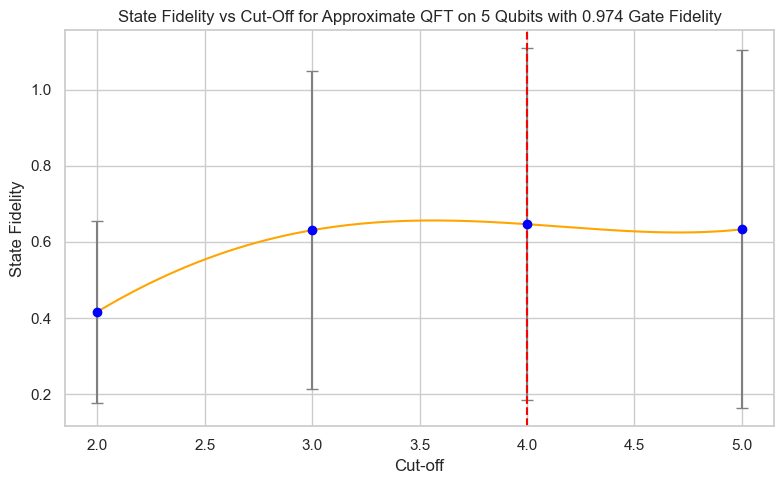

Maximum Fidelity: 0.6468 at cut-off ≈ 3.00
At non-integer cut off Maximum Fidelity: 0.6566 at cut-off ≈ 2.57
3 2.567839195979899
[0.27941527 0.50941081 0.52039094 0.51480371 0.49481279]


<Figure size 1000x600 with 0 Axes>

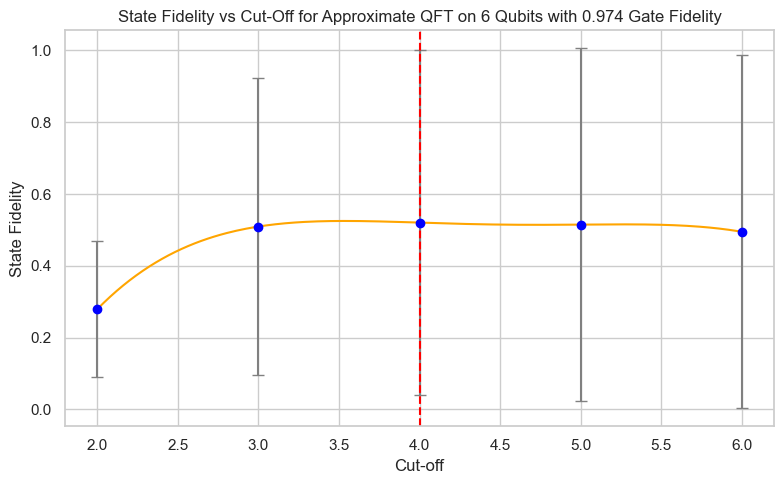

Maximum Fidelity: 0.5204 at cut-off ≈ 3.00
At non-integer cut off Maximum Fidelity: 0.5250 at cut-off ≈ 2.53
3 2.527638190954774
[0.19639306 0.43096782 0.4661937  0.44148565 0.42867256 0.4077189 ]


<Figure size 1000x600 with 0 Axes>

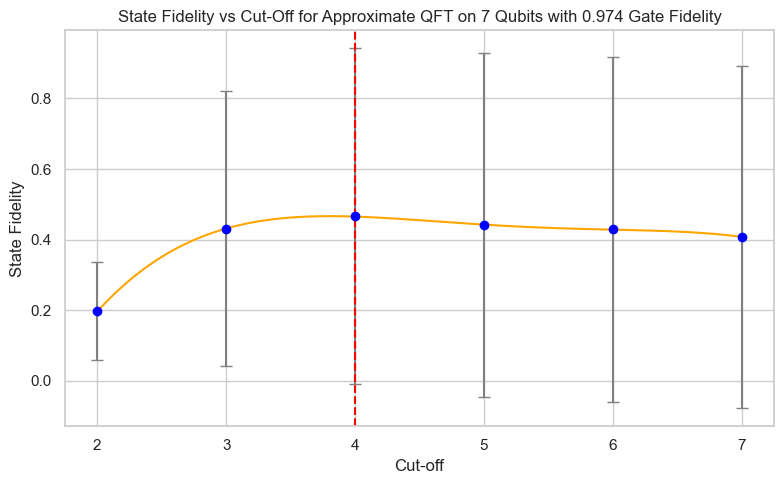

Maximum Fidelity: 0.4652 at cut-off ≈ 3.00
At non-integer cut off Maximum Fidelity: 0.4665 at cut-off ≈ 2.81
3 2.809045226130653
[0.12473236 0.3336287  0.38175375 0.35621662 0.33671127 0.31058483
 0.30680066]


<Figure size 1000x600 with 0 Axes>

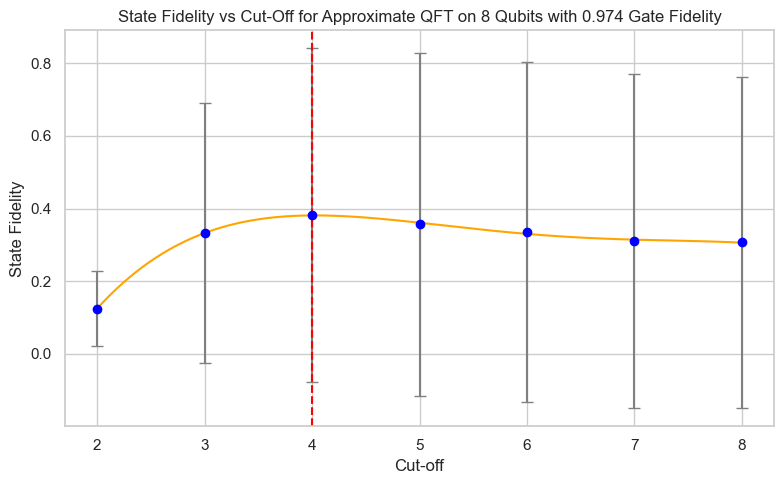

Maximum Fidelity: 0.3811 at cut-off ≈ 3.00
At non-integer cut off Maximum Fidelity: 0.3811 at cut-off ≈ 3.02
3 3.020100502512563
[0.08787859 0.29773726 0.34290735 0.3152064  0.28127905 0.2722004
 0.25862294 0.23599515]


<Figure size 1000x600 with 0 Axes>

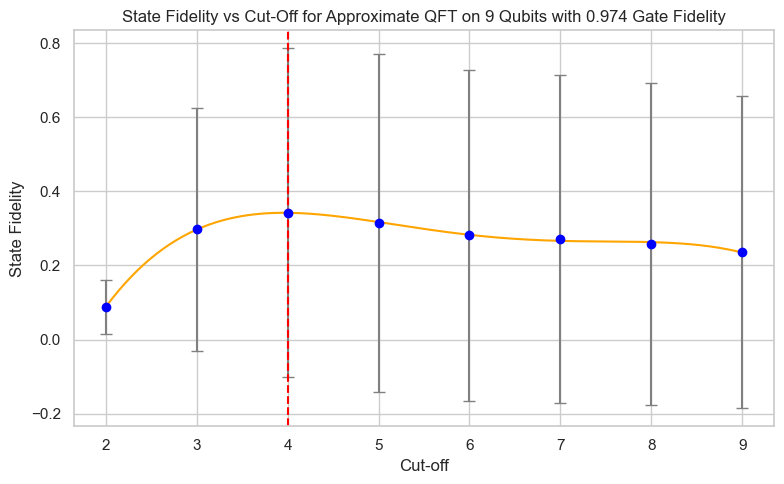

Maximum Fidelity: 0.3422 at cut-off ≈ 3.00
At non-integer cut off Maximum Fidelity: 0.3422 at cut-off ≈ 2.97
3 2.969849246231156
[0.05553759 0.24110751 0.2752723  0.25717364 0.22128753 0.20159428
 0.18617765 0.17389863 0.16977725]


<Figure size 1000x600 with 0 Axes>

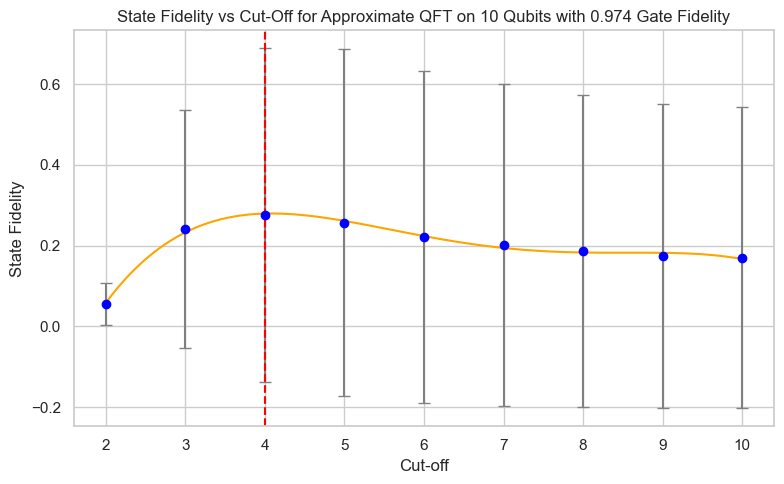

Maximum Fidelity: 0.2794 at cut-off ≈ 3.00
At non-integer cut off Maximum Fidelity: 0.2797 at cut-off ≈ 3.09
3 3.090452261306533
[1, 2, 2, 2, 2, 3, 3, 3, 3] [1, 2, 3, 4, 4, 3, 3, 3, 3]
[0.97731433]


C:\Users\20221753\AppData\Local\Temp\ipykernel_28660\2744195943.py:12: RankWarning: Polyfit may be poorly conditioned
  p_fit = np.polyfit(cut_offs, fidelities, degree)


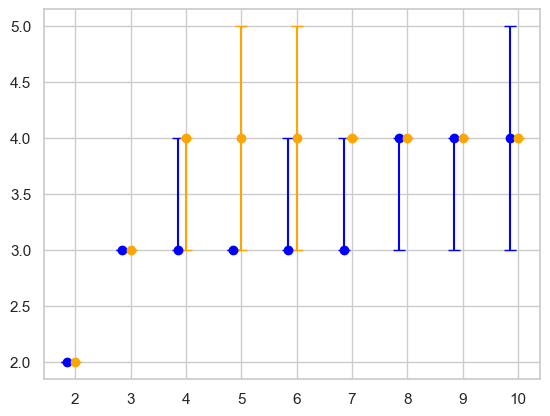

<Figure size 1000x600 with 0 Axes>

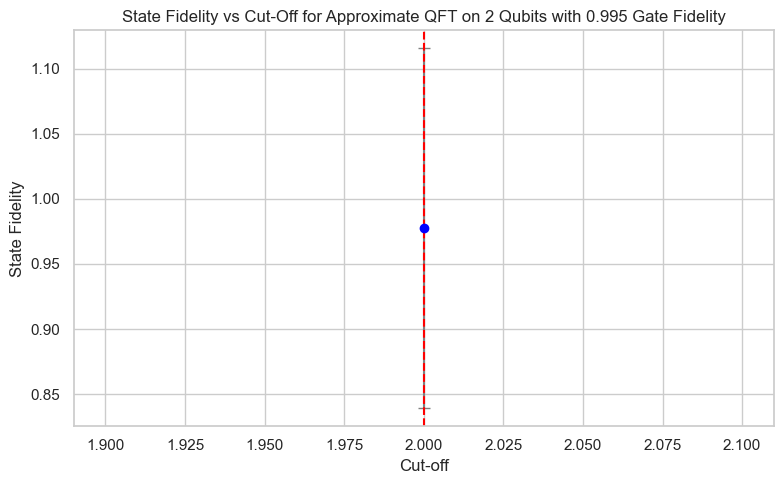

Maximum Fidelity: 0.9773 at cut-off ≈ 1.00
At non-integer cut off Maximum Fidelity: 0.9773 at cut-off ≈ 1.00
1 1.0
[0.8795877 0.9656111]


C:\Users\20221753\AppData\Local\Temp\ipykernel_28660\2744195943.py:12: RankWarning: Polyfit may be poorly conditioned
  p_fit = np.polyfit(cut_offs, fidelities, degree)


<Figure size 1000x600 with 0 Axes>

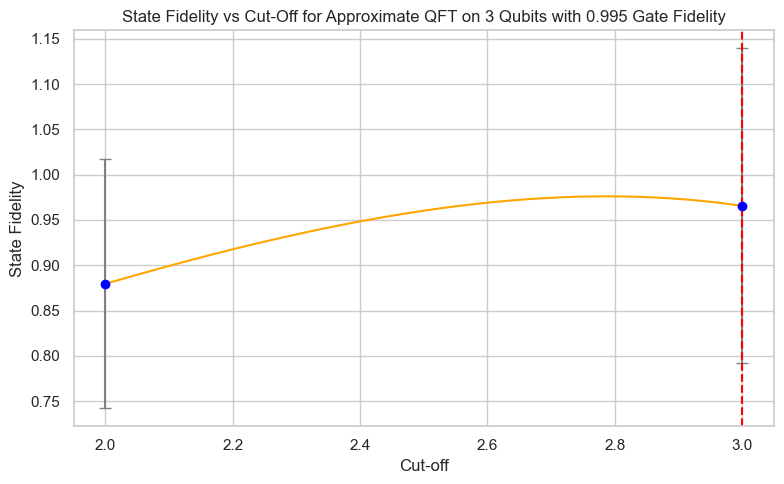

Maximum Fidelity: 0.9656 at cut-off ≈ 2.00
At non-integer cut off Maximum Fidelity: 0.9761 at cut-off ≈ 1.79
2 1.7889447236180904
[0.69654597 0.91210795 0.93653009]


C:\Users\20221753\AppData\Local\Temp\ipykernel_28660\2744195943.py:12: RankWarning: Polyfit may be poorly conditioned
  p_fit = np.polyfit(cut_offs, fidelities, degree)


<Figure size 1000x600 with 0 Axes>

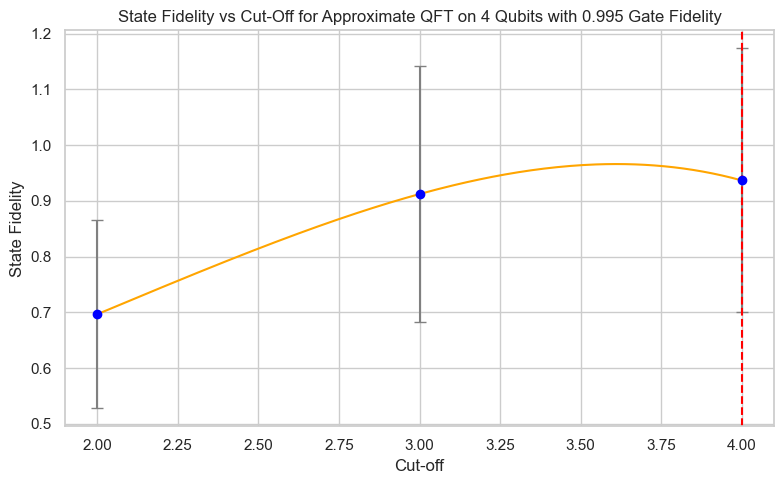

Maximum Fidelity: 0.9365 at cut-off ≈ 3.00
At non-integer cut off Maximum Fidelity: 0.9659 at cut-off ≈ 2.61
3 2.608040201005025
[0.52843813 0.85603547 0.90922561 0.91195471]


C:\Users\20221753\AppData\Local\Temp\ipykernel_28660\2744195943.py:12: RankWarning: Polyfit may be poorly conditioned
  p_fit = np.polyfit(cut_offs, fidelities, degree)


<Figure size 1000x600 with 0 Axes>

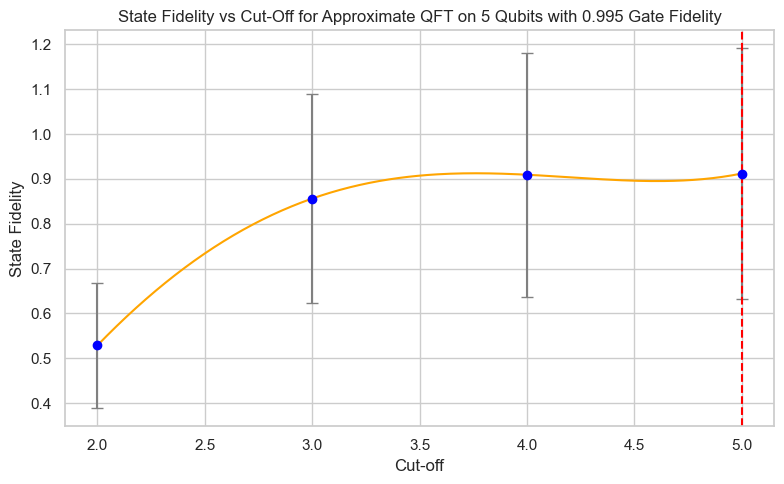

Maximum Fidelity: 0.9120 at cut-off ≈ 4.00
At non-integer cut off Maximum Fidelity: 0.9125 at cut-off ≈ 2.76
4 2.7638190954773867
[0.37772541 0.77154147 0.86481523 0.86522882 0.86573641]


<Figure size 1000x600 with 0 Axes>

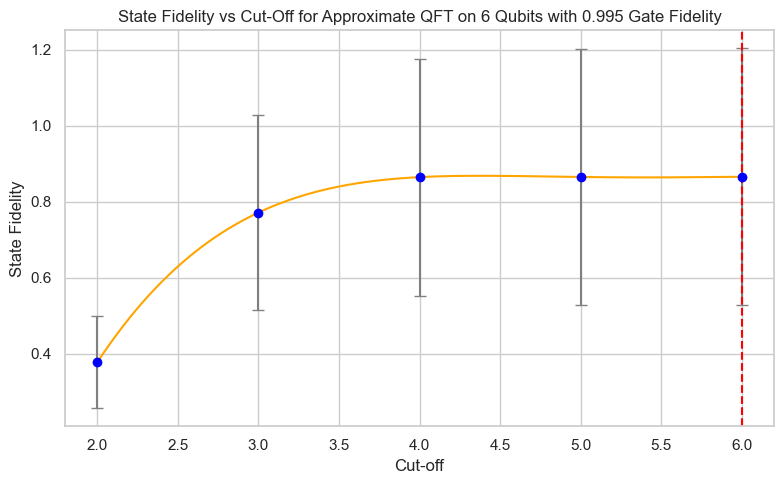

Maximum Fidelity: 0.8657 at cut-off ≈ 5.00
At non-integer cut off Maximum Fidelity: 0.8684 at cut-off ≈ 3.37
5 3.371859296482412
[0.27083386 0.70176217 0.83189325 0.84777665 0.83586867 0.84508175]


<Figure size 1000x600 with 0 Axes>

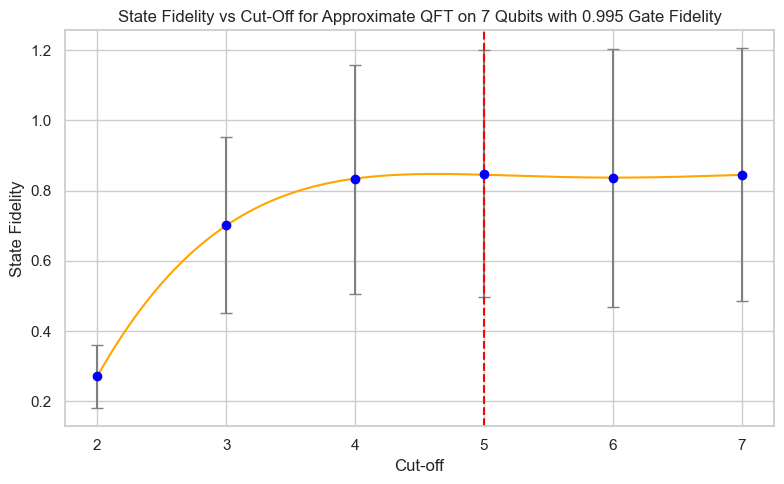

Maximum Fidelity: 0.8453 at cut-off ≈ 4.00
At non-integer cut off Maximum Fidelity: 0.8475 at cut-off ≈ 3.64
4 3.6381909547738696
[0.19105678 0.62869651 0.78023315 0.80995469 0.79908507 0.7942064
 0.78217737]


<Figure size 1000x600 with 0 Axes>

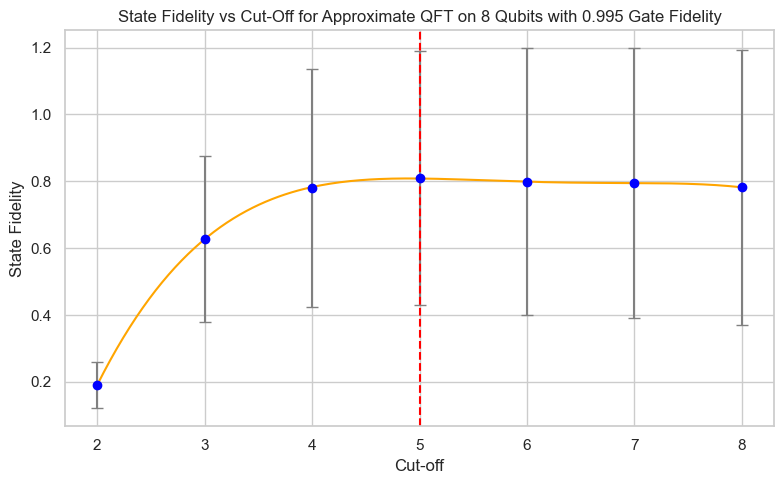

Maximum Fidelity: 0.8084 at cut-off ≈ 4.00
At non-integer cut off Maximum Fidelity: 0.8085 at cut-off ≈ 3.89
4 3.8944723618090453
[0.13597171 0.5708392  0.75986751 0.78467439 0.76726329 0.76102193
 0.74791197 0.75017908]


<Figure size 1000x600 with 0 Axes>

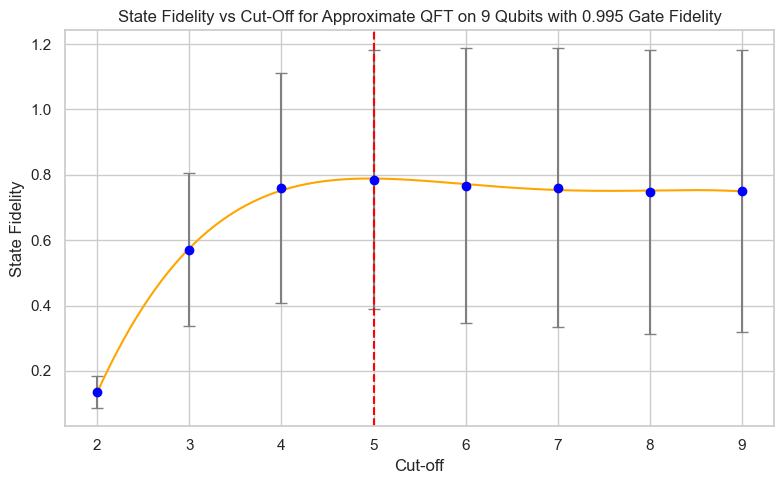

Maximum Fidelity: 0.7887 at cut-off ≈ 4.00
At non-integer cut off Maximum Fidelity: 0.7887 at cut-off ≈ 3.95
4 3.9547738693467336
[0.09576426 0.50257598 0.71353178 0.74554389 0.73403899 0.71700873
 0.70224231 0.69442708 0.69334081]


<Figure size 1000x600 with 0 Axes>

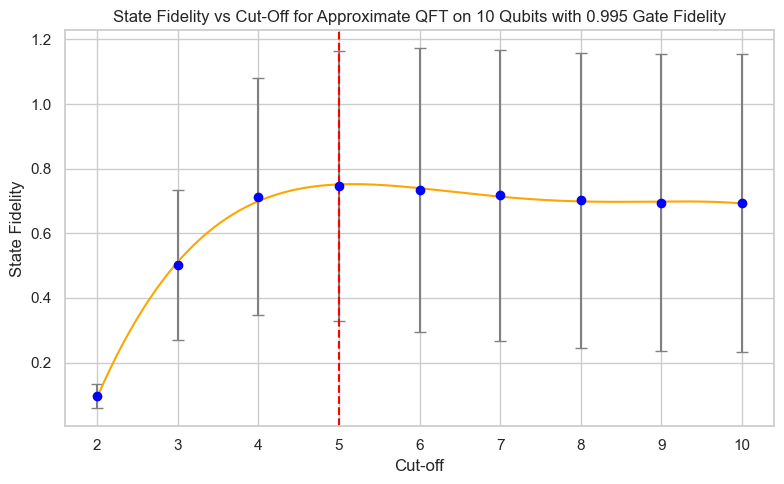

Maximum Fidelity: 0.7513 at cut-off ≈ 4.00
At non-integer cut off Maximum Fidelity: 0.7522 at cut-off ≈ 4.18
4 4.175879396984925
[1, 2, 3, 3, 3, 3, 4, 4, 4] [1, 2, 3, 4, 5, 6, 6, 4, 5]


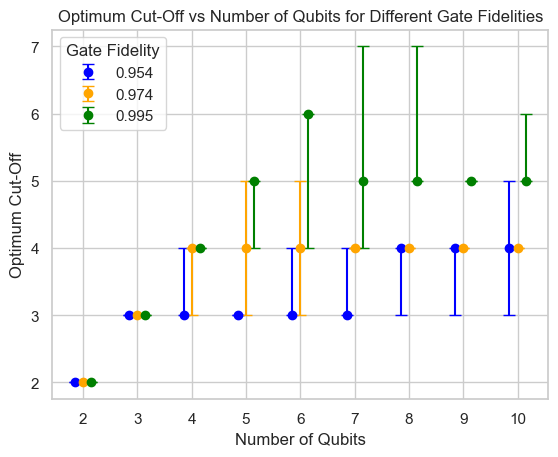

In [49]:
opt_cut_offs_diff_fid_int_better([0.954, 0.974, 0.995], 0.02)

[0.97731433]


C:\Users\20221753\AppData\Local\Temp\ipykernel_12504\3752277522.py:12: RankWarning: Polyfit may be poorly conditioned
  p_fit = np.polyfit(cut_offs, fidelities, degree)


<Figure size 1000x600 with 0 Axes>

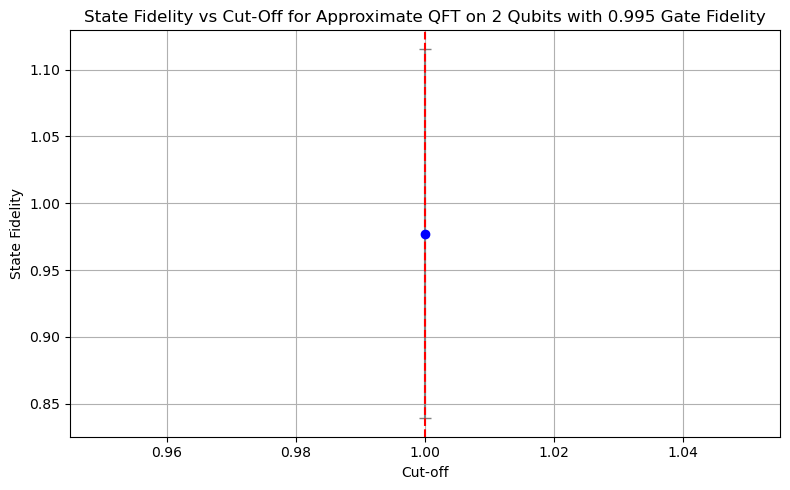

Maximum Fidelity: 0.9773 at cut-off ≈ 1.00
At non-integer cut off Maximum Fidelity: 0.9773 at cut-off ≈ 1.00
1 1.0
[0.8795877 0.9656111]


C:\Users\20221753\AppData\Local\Temp\ipykernel_12504\3752277522.py:12: RankWarning: Polyfit may be poorly conditioned
  p_fit = np.polyfit(cut_offs, fidelities, degree)


<Figure size 1000x600 with 0 Axes>

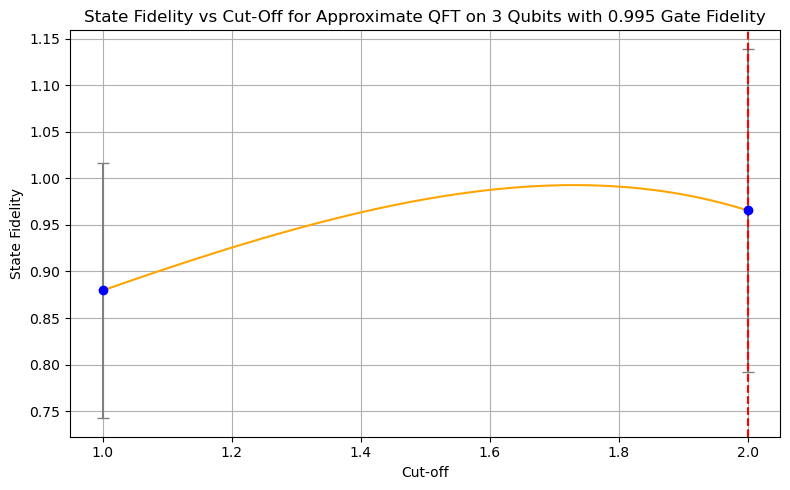

Maximum Fidelity: 0.9656 at cut-off ≈ 2.00
At non-integer cut off Maximum Fidelity: 0.9929 at cut-off ≈ 1.73
2 1.7336683417085426
[0.69654597 0.91210795 0.93653009]


C:\Users\20221753\AppData\Local\Temp\ipykernel_12504\3752277522.py:12: RankWarning: Polyfit may be poorly conditioned
  p_fit = np.polyfit(cut_offs, fidelities, degree)


<Figure size 1000x600 with 0 Axes>

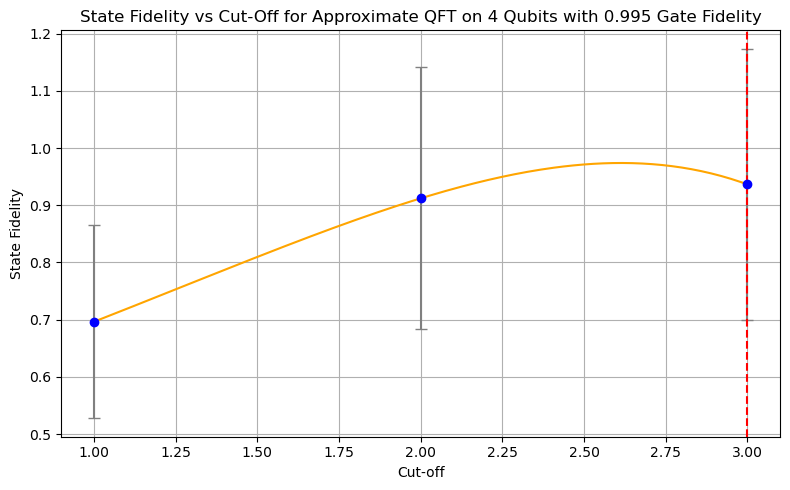

Maximum Fidelity: 0.9365 at cut-off ≈ 3.00
At non-integer cut off Maximum Fidelity: 0.9739 at cut-off ≈ 2.61
3 2.608040201005025
[0.52843813 0.85603547 0.90922561 0.91195471]


C:\Users\20221753\AppData\Local\Temp\ipykernel_12504\3752277522.py:12: RankWarning: Polyfit may be poorly conditioned
  p_fit = np.polyfit(cut_offs, fidelities, degree)


<Figure size 1000x600 with 0 Axes>

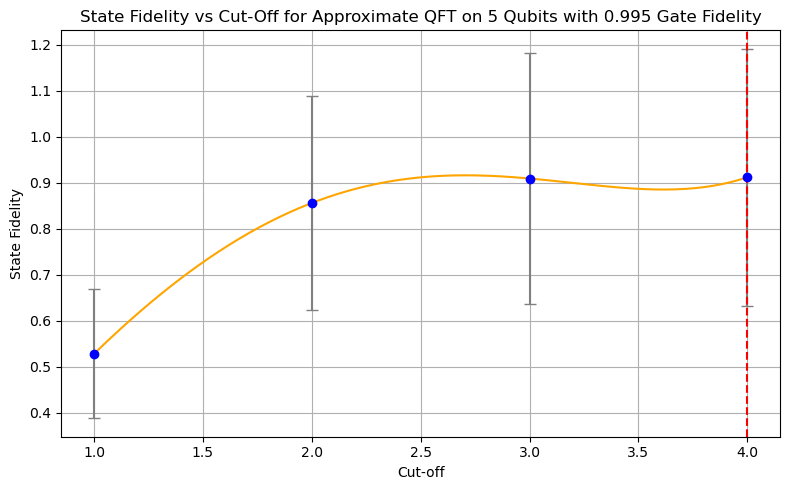

Maximum Fidelity: 0.9120 at cut-off ≈ 4.00
At non-integer cut off Maximum Fidelity: 0.9162 at cut-off ≈ 2.70
4 2.7035175879396984
[0.37772541 0.77154147 0.86481523 0.86522882 0.86573641]


C:\Users\20221753\AppData\Local\Temp\ipykernel_12504\3752277522.py:12: RankWarning: Polyfit may be poorly conditioned
  p_fit = np.polyfit(cut_offs, fidelities, degree)


<Figure size 1000x600 with 0 Axes>

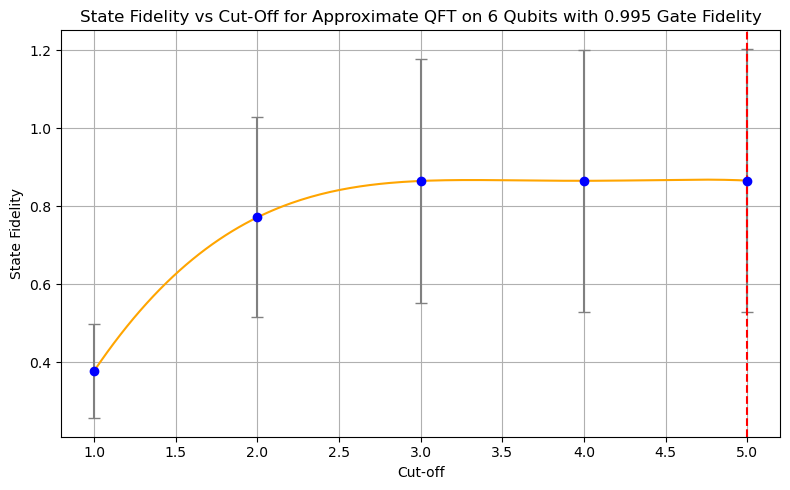

Maximum Fidelity: 0.8657 at cut-off ≈ 5.00
At non-integer cut off Maximum Fidelity: 0.8682 at cut-off ≈ 4.72
5 4.71859296482412
[0.27083386 0.70176217 0.83189325 0.84777665 0.83586867 0.84508175]


<Figure size 1000x600 with 0 Axes>

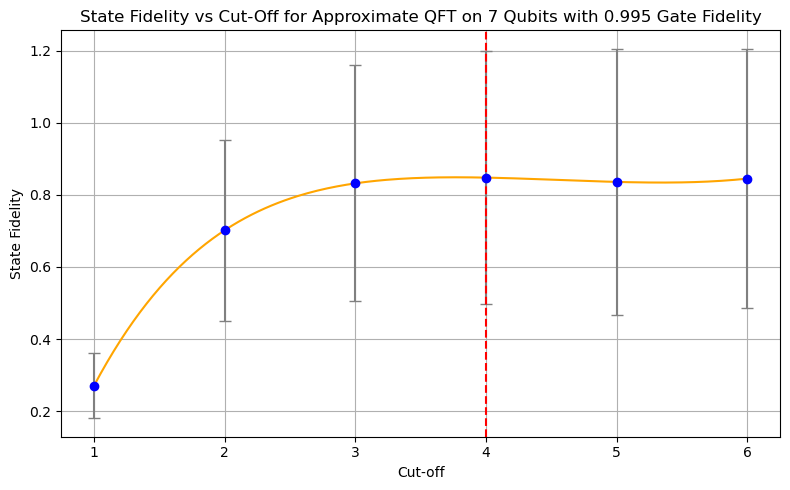

Maximum Fidelity: 0.8478 at cut-off ≈ 4.00
At non-integer cut off Maximum Fidelity: 0.8487 at cut-off ≈ 3.76
4 3.763819095477387
[0.19105678 0.62869651 0.78023315 0.80995469 0.79908507 0.7942064
 0.78217737]


<Figure size 1000x600 with 0 Axes>

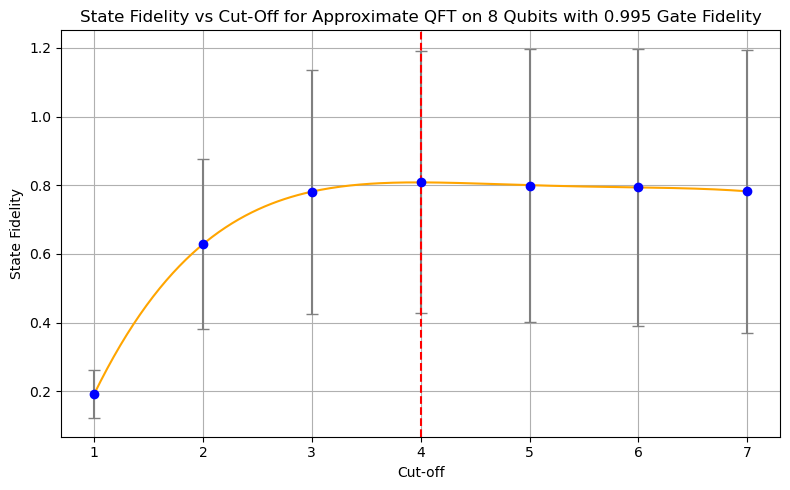

Maximum Fidelity: 0.8084 at cut-off ≈ 4.00
At non-integer cut off Maximum Fidelity: 0.8084 at cut-off ≈ 3.98
4 3.9849246231155777
[0.13597171 0.5708392  0.75986751 0.78467439 0.76726329 0.76102193
 0.74791197 0.75017908]


<Figure size 1000x600 with 0 Axes>

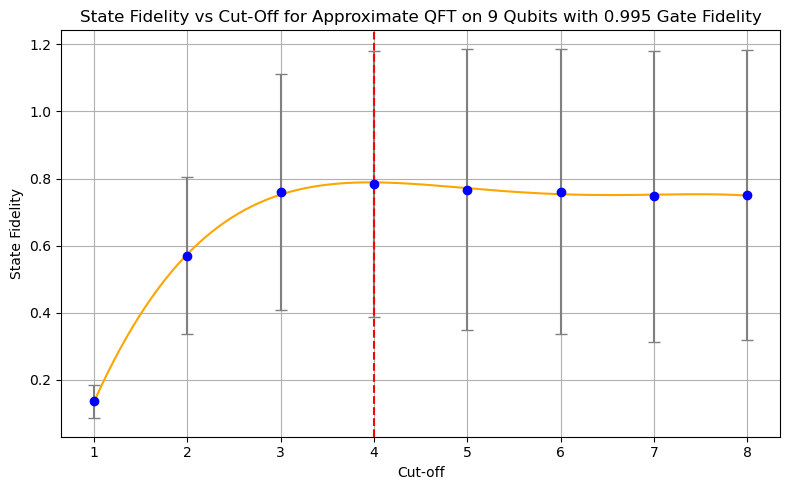

Maximum Fidelity: 0.7888 at cut-off ≈ 4.00
At non-integer cut off Maximum Fidelity: 0.7888 at cut-off ≈ 3.95
4 3.9547738693467336
[0.09576426 0.50257598 0.71353178 0.74554389 0.73403899 0.71700873
 0.70224231 0.69442708 0.69334081]


<Figure size 1000x600 with 0 Axes>

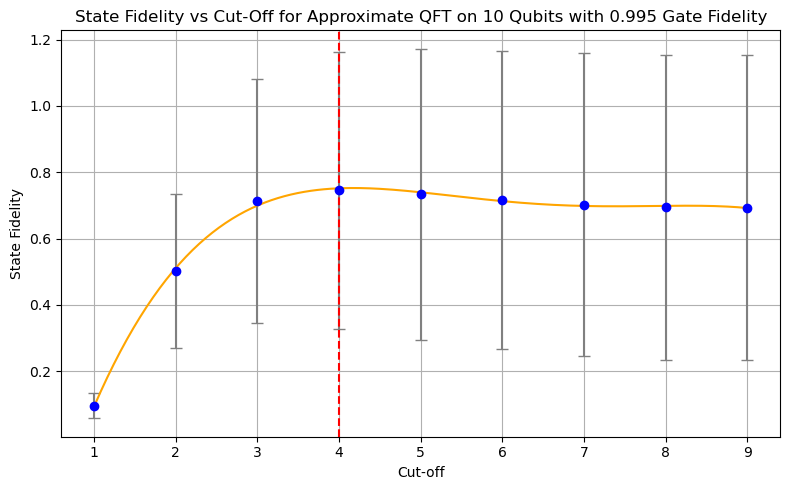

Maximum Fidelity: 0.7517 at cut-off ≈ 4.00
At non-integer cut off Maximum Fidelity: 0.7526 at cut-off ≈ 4.18
4 4.175879396984925
[1, 2, 3, 3, 3, 3, 4, 4, 4] [1, 2, 3, 4, 5, 6, 6, 4, 5]
[0.98716874]


C:\Users\20221753\AppData\Local\Temp\ipykernel_12504\3752277522.py:12: RankWarning: Polyfit may be poorly conditioned
  p_fit = np.polyfit(cut_offs, fidelities, degree)


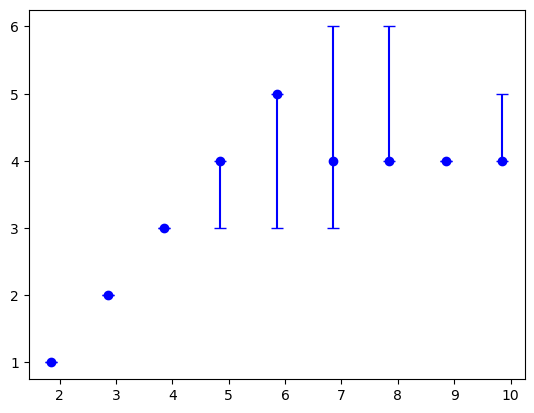

<Figure size 1000x600 with 0 Axes>

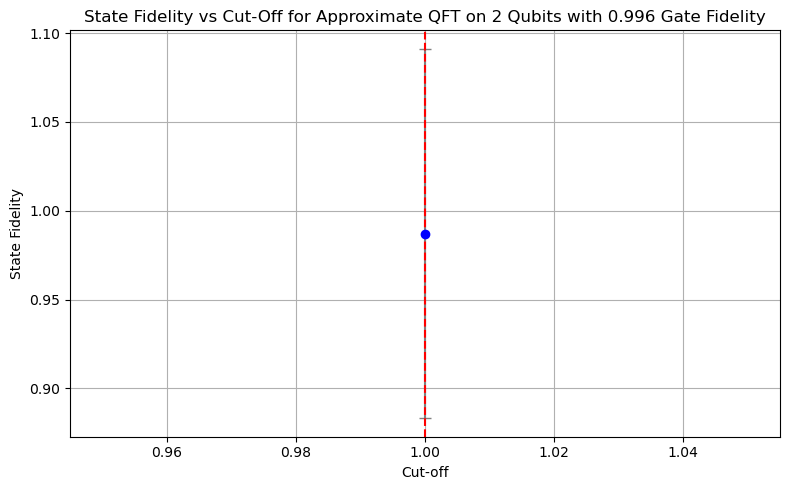

Maximum Fidelity: 0.9872 at cut-off ≈ 1.00
At non-integer cut off Maximum Fidelity: 0.9872 at cut-off ≈ 1.00
1 1.0
[0.88295731 0.97809416]


C:\Users\20221753\AppData\Local\Temp\ipykernel_12504\3752277522.py:12: RankWarning: Polyfit may be poorly conditioned
  p_fit = np.polyfit(cut_offs, fidelities, degree)


<Figure size 1000x600 with 0 Axes>

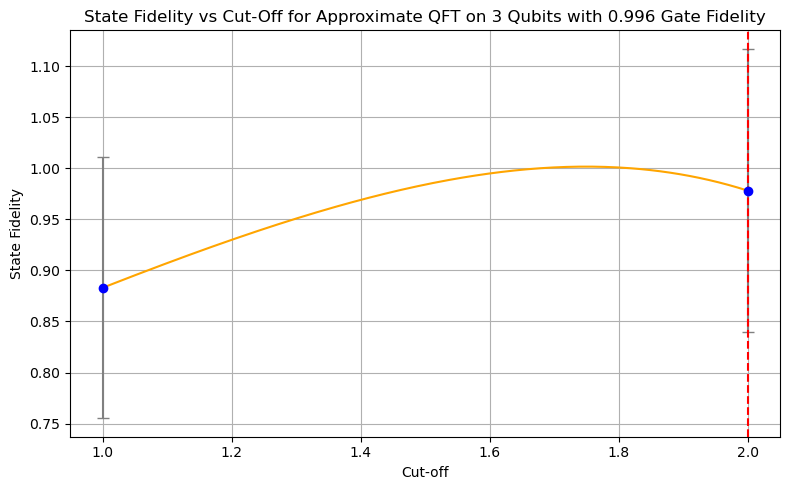

Maximum Fidelity: 0.9781 at cut-off ≈ 2.00
At non-integer cut off Maximum Fidelity: 1.0016 at cut-off ≈ 1.75
2 1.7487437185929648
[0.70659995 0.9278165  0.94747949]


C:\Users\20221753\AppData\Local\Temp\ipykernel_12504\3752277522.py:12: RankWarning: Polyfit may be poorly conditioned
  p_fit = np.polyfit(cut_offs, fidelities, degree)


<Figure size 1000x600 with 0 Axes>

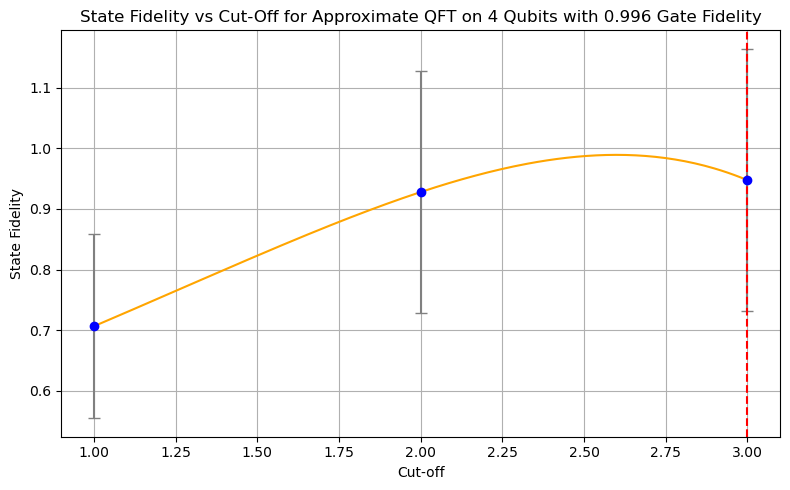

Maximum Fidelity: 0.9475 at cut-off ≈ 3.00
At non-integer cut off Maximum Fidelity: 0.9891 at cut-off ≈ 2.60
3 2.5979899497487438
[0.53443223 0.86994012 0.93099151 0.93131787]


C:\Users\20221753\AppData\Local\Temp\ipykernel_12504\3752277522.py:12: RankWarning: Polyfit may be poorly conditioned
  p_fit = np.polyfit(cut_offs, fidelities, degree)


<Figure size 1000x600 with 0 Axes>

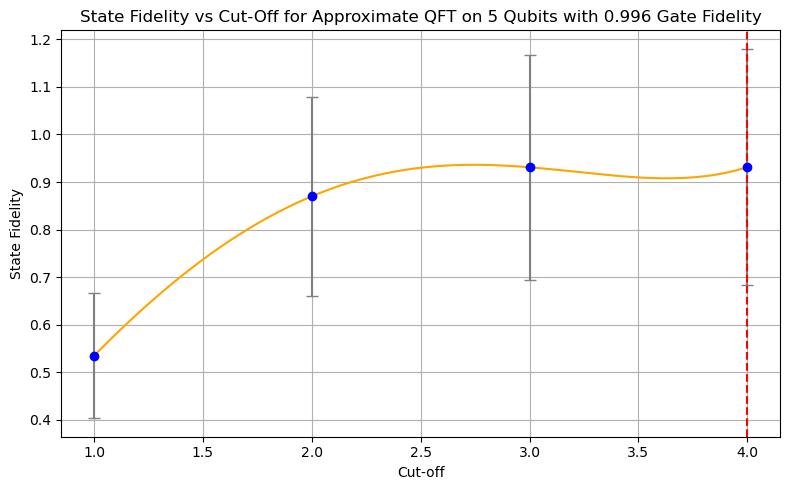

Maximum Fidelity: 0.9313 at cut-off ≈ 4.00
At non-integer cut off Maximum Fidelity: 0.9362 at cut-off ≈ 2.75
4 2.748743718592965
[0.38469726 0.79403809 0.88535366 0.89980895 0.89801534]


C:\Users\20221753\AppData\Local\Temp\ipykernel_12504\3752277522.py:12: RankWarning: Polyfit may be poorly conditioned
  p_fit = np.polyfit(cut_offs, fidelities, degree)


<Figure size 1000x600 with 0 Axes>

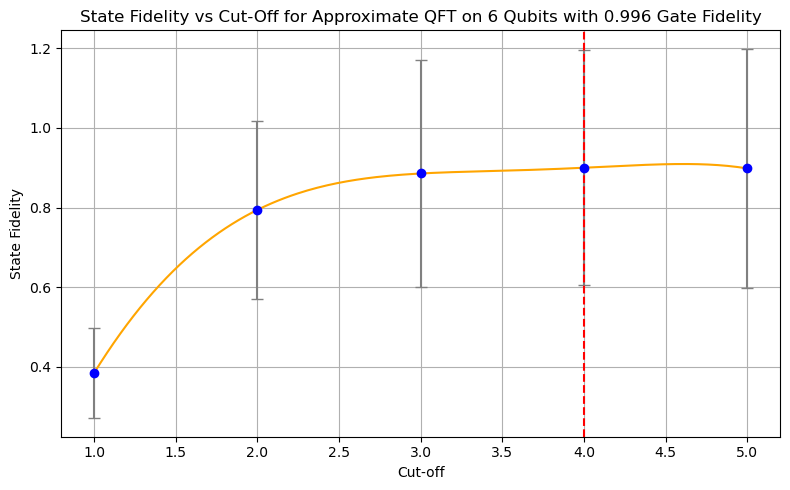

Maximum Fidelity: 0.8998 at cut-off ≈ 4.00
At non-integer cut off Maximum Fidelity: 0.9091 at cut-off ≈ 4.62
4 4.618090452261306
[0.27712677 0.72293912 0.86234396 0.88168992 0.88024789 0.87239186]


<Figure size 1000x600 with 0 Axes>

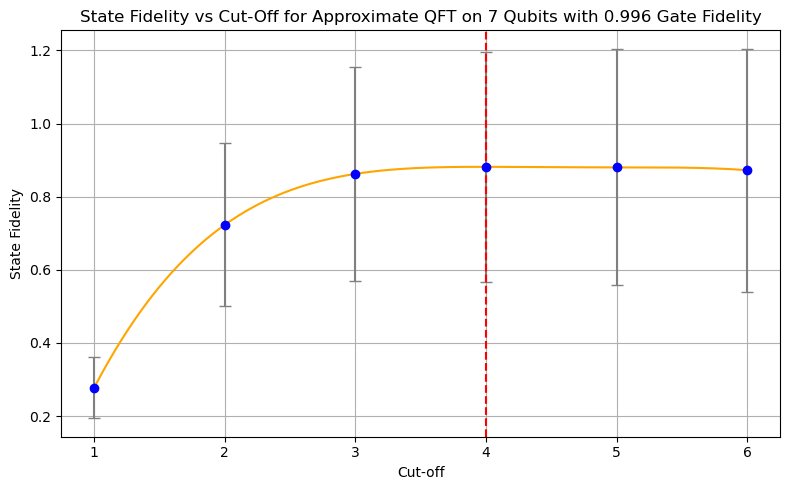

Maximum Fidelity: 0.8817 at cut-off ≈ 4.00
At non-integer cut off Maximum Fidelity: 0.8817 at cut-off ≈ 3.96
4 3.9648241206030153
[0.19713225 0.64917301 0.8203139  0.85035276 0.84358286 0.83913516
 0.82450967]


<Figure size 1000x600 with 0 Axes>

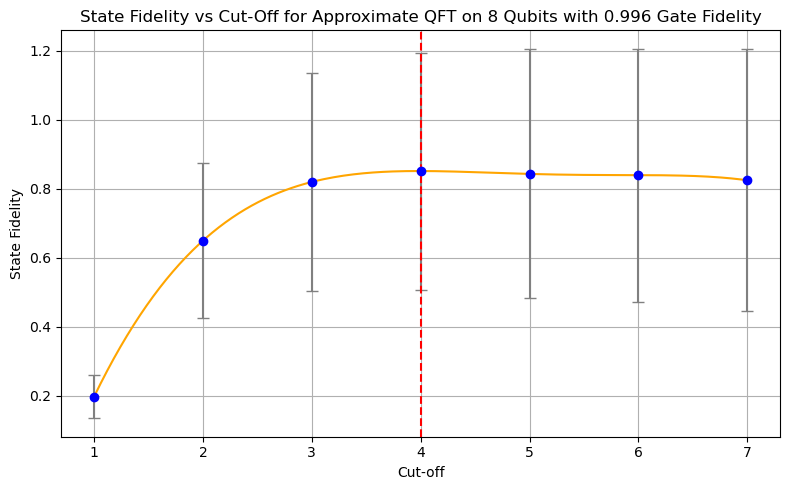

Maximum Fidelity: 0.8513 at cut-off ≈ 4.00
At non-integer cut off Maximum Fidelity: 0.8513 at cut-off ≈ 3.98
4 3.9849246231155777
[0.14058987 0.58844084 0.79068857 0.83005672 0.81919666 0.8148166
 0.81010202 0.80385576]


<Figure size 1000x600 with 0 Axes>

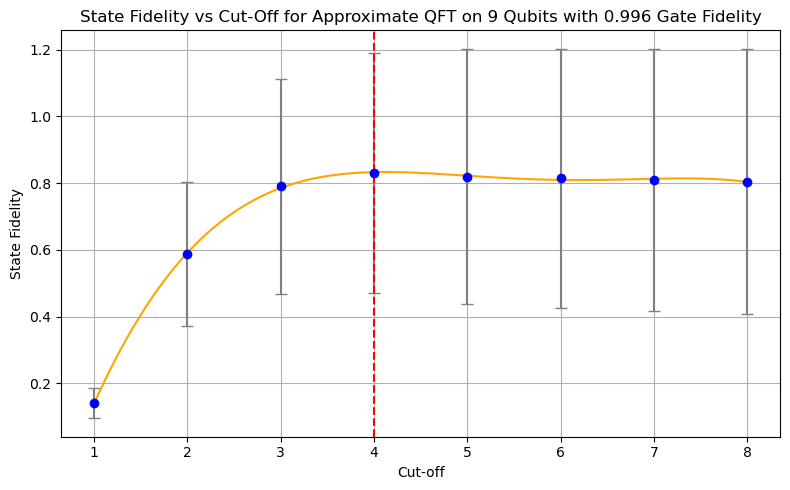

Maximum Fidelity: 0.8330 at cut-off ≈ 4.00
At non-integer cut off Maximum Fidelity: 0.8333 at cut-off ≈ 4.13
4 4.130653266331658
[0.09897922 0.52810106 0.75720773 0.80252143 0.79293792 0.77777509
 0.77330607 0.76286176 0.75386647]


<Figure size 1000x600 with 0 Axes>

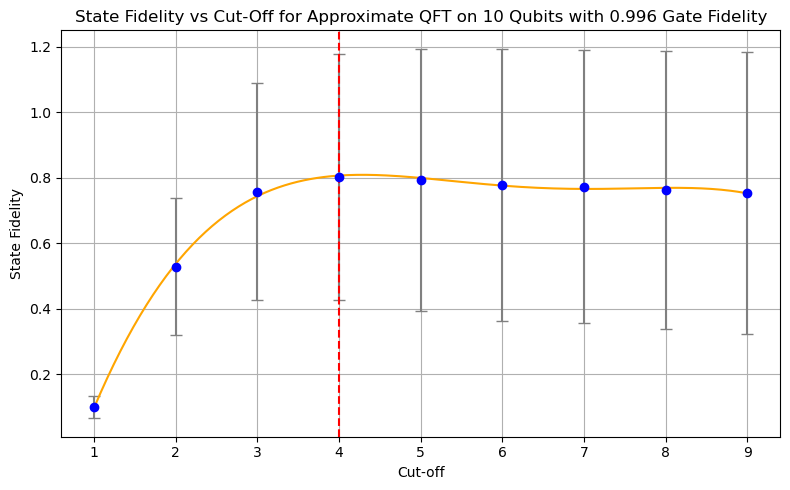

Maximum Fidelity: 0.8067 at cut-off ≈ 4.00
At non-integer cut off Maximum Fidelity: 0.8091 at cut-off ≈ 4.30
4 4.296482412060302
[1, 2, 2, 3, 3, 3, 4, 4, 4] [1, 2, 3, 4, 5, 6, 6, 6, 5]
[0.98877151]


C:\Users\20221753\AppData\Local\Temp\ipykernel_12504\3752277522.py:12: RankWarning: Polyfit may be poorly conditioned
  p_fit = np.polyfit(cut_offs, fidelities, degree)


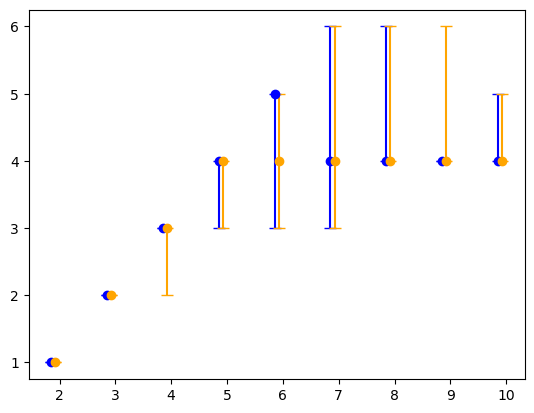

<Figure size 1000x600 with 0 Axes>

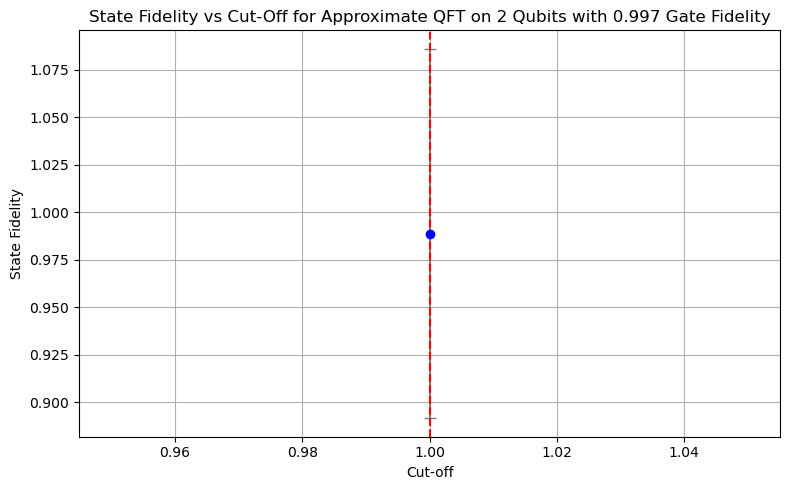

Maximum Fidelity: 0.9888 at cut-off ≈ 1.00
At non-integer cut off Maximum Fidelity: 0.9888 at cut-off ≈ 1.00
1 1.0
[0.88776263 0.97946281]


C:\Users\20221753\AppData\Local\Temp\ipykernel_12504\3752277522.py:12: RankWarning: Polyfit may be poorly conditioned
  p_fit = np.polyfit(cut_offs, fidelities, degree)


<Figure size 1000x600 with 0 Axes>

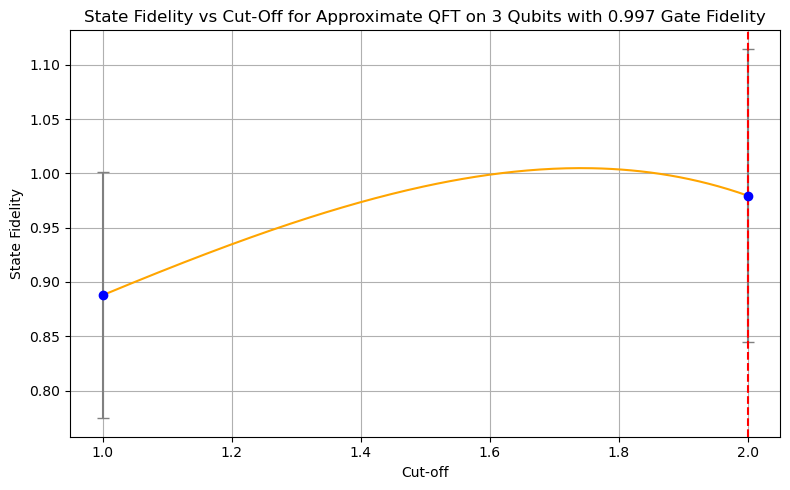

Maximum Fidelity: 0.9795 at cut-off ≈ 2.00
At non-integer cut off Maximum Fidelity: 1.0048 at cut-off ≈ 1.74
2 1.7437185929648242
[0.71061193 0.93398303 0.95984388]


C:\Users\20221753\AppData\Local\Temp\ipykernel_12504\3752277522.py:12: RankWarning: Polyfit may be poorly conditioned
  p_fit = np.polyfit(cut_offs, fidelities, degree)


<Figure size 1000x600 with 0 Axes>

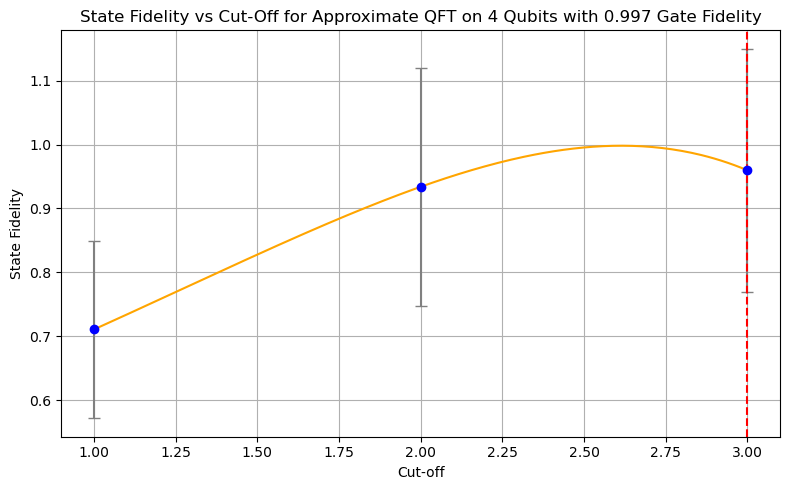

Maximum Fidelity: 0.9598 at cut-off ≈ 3.00
At non-integer cut off Maximum Fidelity: 0.9983 at cut-off ≈ 2.62
3 2.6180904522613067
[0.53803838 0.88133724 0.93629261 0.9388004 ]


C:\Users\20221753\AppData\Local\Temp\ipykernel_12504\3752277522.py:12: RankWarning: Polyfit may be poorly conditioned
  p_fit = np.polyfit(cut_offs, fidelities, degree)


<Figure size 1000x600 with 0 Axes>

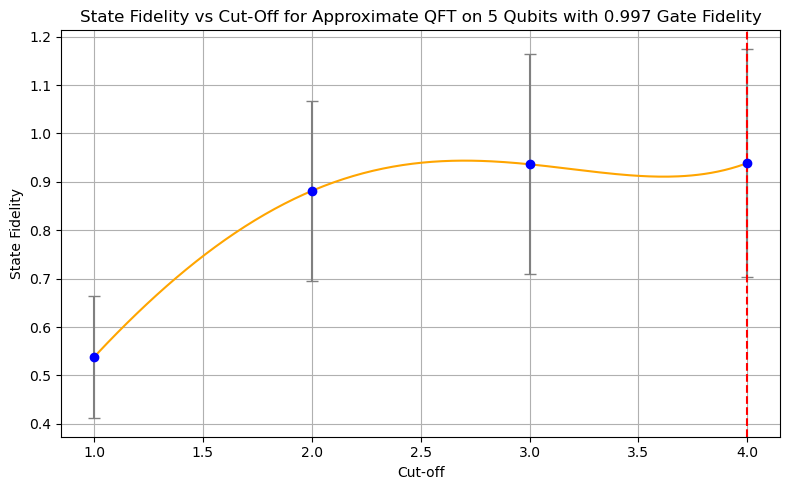

Maximum Fidelity: 0.9388 at cut-off ≈ 4.00
At non-integer cut off Maximum Fidelity: 0.9438 at cut-off ≈ 2.70
4 2.7035175879396984
[0.38990946 0.80169495 0.90361077 0.91532373 0.90947324]


C:\Users\20221753\AppData\Local\Temp\ipykernel_12504\3752277522.py:12: RankWarning: Polyfit may be poorly conditioned
  p_fit = np.polyfit(cut_offs, fidelities, degree)


<Figure size 1000x600 with 0 Axes>

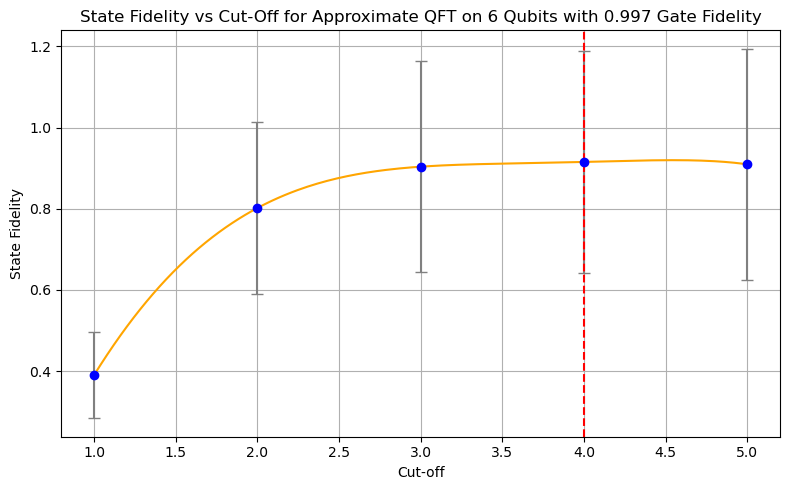

Maximum Fidelity: 0.9153 at cut-off ≈ 4.00
At non-integer cut off Maximum Fidelity: 0.9197 at cut-off ≈ 4.54
4 4.5376884422110555
[0.28115823 0.7292517  0.87490406 0.89835488 0.89278094 0.89080855]


<Figure size 1000x600 with 0 Axes>

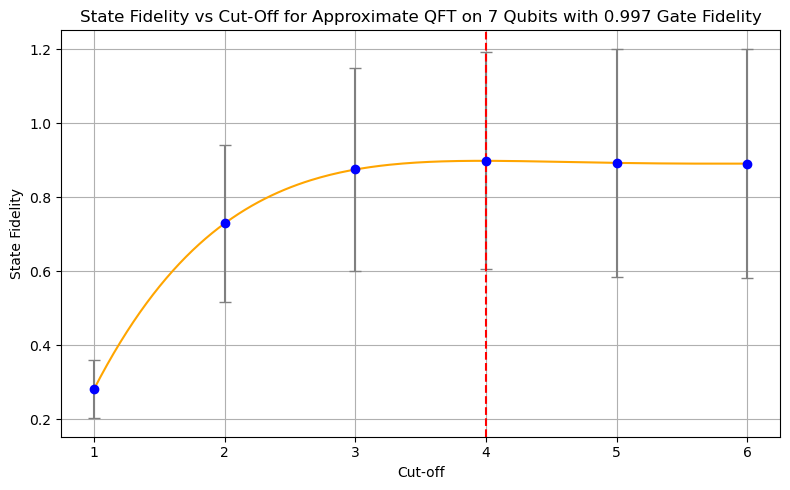

Maximum Fidelity: 0.8984 at cut-off ≈ 4.00
At non-integer cut off Maximum Fidelity: 0.8984 at cut-off ≈ 3.96
4 3.9648241206030153
[0.1993677  0.66253647 0.83811476 0.871595   0.86838424 0.85946509
 0.85736187]


<Figure size 1000x600 with 0 Axes>

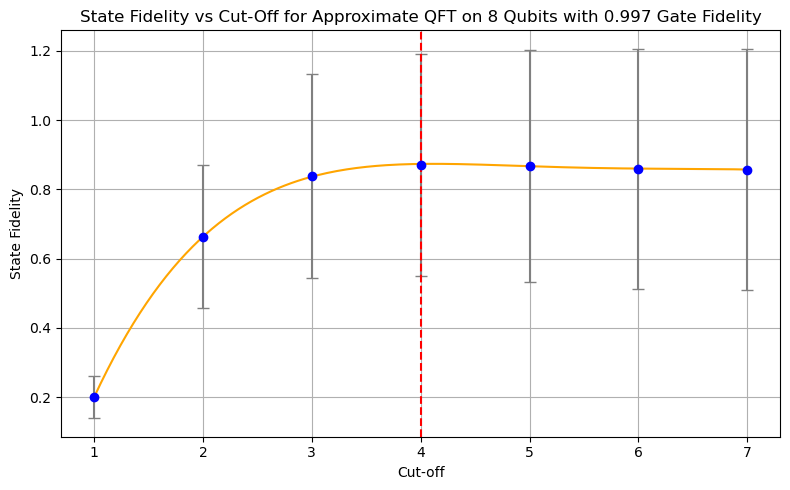

Maximum Fidelity: 0.8735 at cut-off ≈ 4.00
At non-integer cut off Maximum Fidelity: 0.8738 at cut-off ≈ 4.11
4 4.105527638190955
[0.1423394  0.60236355 0.81337502 0.85359726 0.84867746 0.84000202
 0.83683401 0.82882733]


<Figure size 1000x600 with 0 Axes>

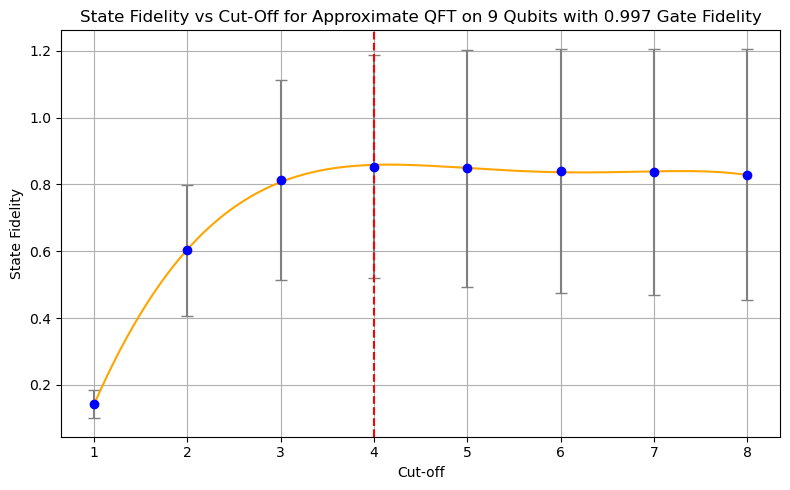

Maximum Fidelity: 0.8586 at cut-off ≈ 4.00
At non-integer cut off Maximum Fidelity: 0.8593 at cut-off ≈ 4.17
4 4.165829145728644
[0.10081362 0.54177734 0.7700599  0.81855017 0.82129782 0.81607326
 0.80225166 0.79491609 0.799866  ]


<Figure size 1000x600 with 0 Axes>

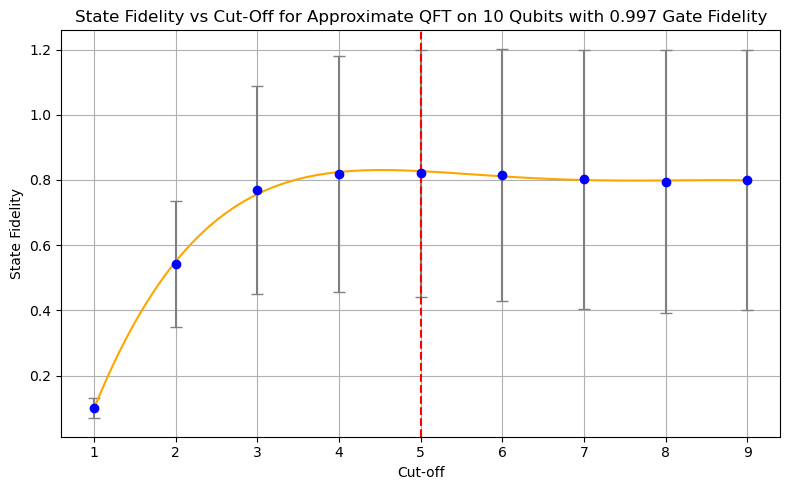

Maximum Fidelity: 0.8272 at cut-off ≈ 5.00
At non-integer cut off Maximum Fidelity: 0.8305 at cut-off ≈ 4.54
5 4.5376884422110555
[1, 2, 3, 3, 3, 4, 4, 4, 4] [1, 2, 3, 4, 5, 6, 7, 6, 6]
[0.99106603]


C:\Users\20221753\AppData\Local\Temp\ipykernel_12504\3752277522.py:12: RankWarning: Polyfit may be poorly conditioned
  p_fit = np.polyfit(cut_offs, fidelities, degree)


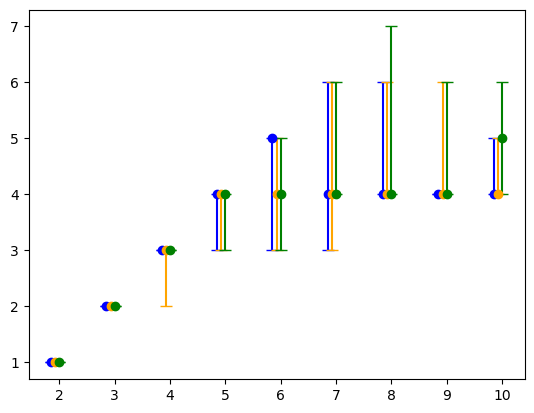

<Figure size 1000x600 with 0 Axes>

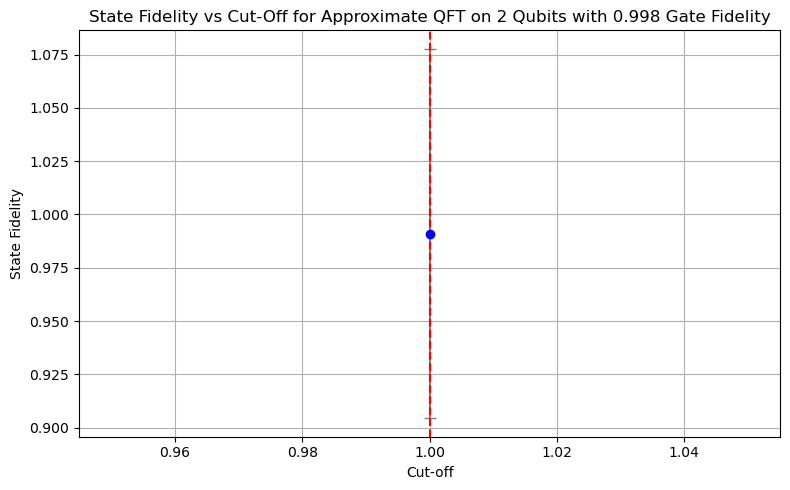

Maximum Fidelity: 0.9911 at cut-off ≈ 1.00
At non-integer cut off Maximum Fidelity: 0.9911 at cut-off ≈ 1.00
1 1.0
[0.88915092 0.98450338]


C:\Users\20221753\AppData\Local\Temp\ipykernel_12504\3752277522.py:12: RankWarning: Polyfit may be poorly conditioned
  p_fit = np.polyfit(cut_offs, fidelities, degree)


<Figure size 1000x600 with 0 Axes>

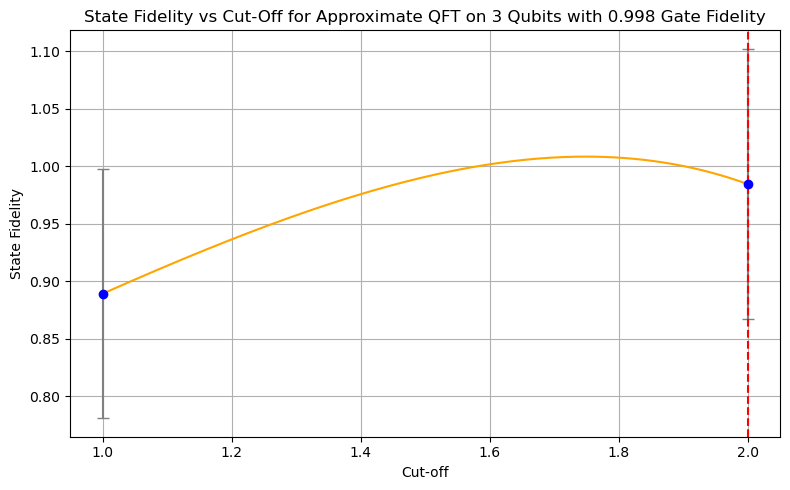

Maximum Fidelity: 0.9845 at cut-off ≈ 2.00
At non-integer cut off Maximum Fidelity: 1.0084 at cut-off ≈ 1.75
2 1.7487437185929648
[0.71551967 0.94331896 0.96800521]


C:\Users\20221753\AppData\Local\Temp\ipykernel_12504\3752277522.py:12: RankWarning: Polyfit may be poorly conditioned
  p_fit = np.polyfit(cut_offs, fidelities, degree)


<Figure size 1000x600 with 0 Axes>

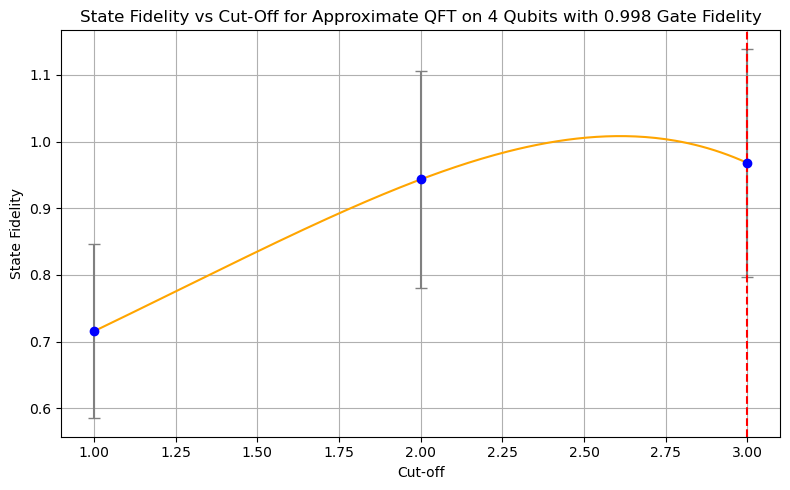

Maximum Fidelity: 0.9680 at cut-off ≈ 3.00
At non-integer cut off Maximum Fidelity: 1.0083 at cut-off ≈ 2.61
3 2.608040201005025
[0.54131253 0.88893671 0.95337591 0.95617848]


C:\Users\20221753\AppData\Local\Temp\ipykernel_12504\3752277522.py:12: RankWarning: Polyfit may be poorly conditioned
  p_fit = np.polyfit(cut_offs, fidelities, degree)


<Figure size 1000x600 with 0 Axes>

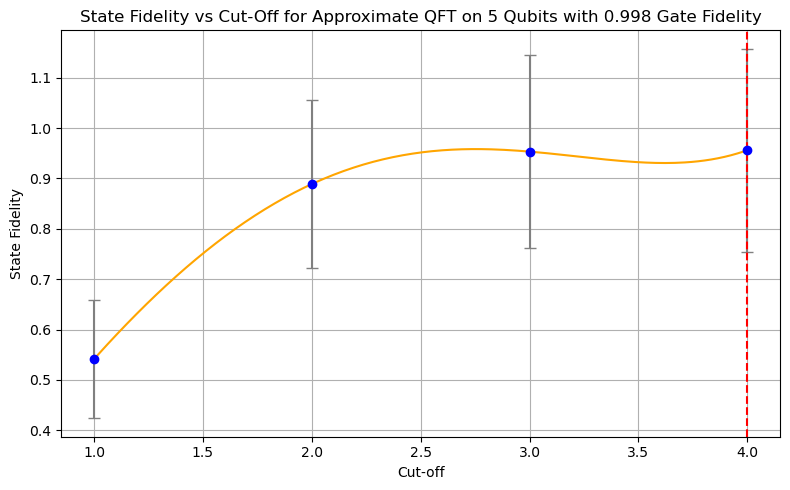

Maximum Fidelity: 0.9562 at cut-off ≈ 4.00
At non-integer cut off Maximum Fidelity: 0.9584 at cut-off ≈ 2.75
4 2.748743718592965
[0.39275395 0.81671532 0.92171789 0.9388586  0.93460003]


C:\Users\20221753\AppData\Local\Temp\ipykernel_12504\3752277522.py:12: RankWarning: Polyfit may be poorly conditioned
  p_fit = np.polyfit(cut_offs, fidelities, degree)


<Figure size 1000x600 with 0 Axes>

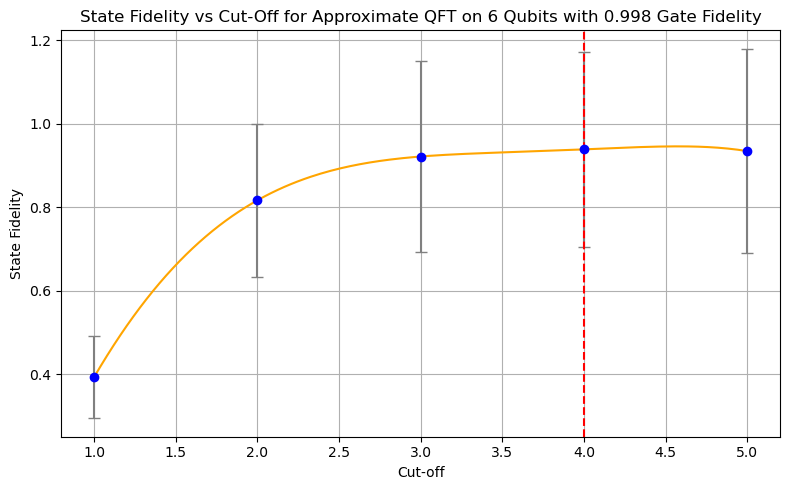

Maximum Fidelity: 0.9389 at cut-off ≈ 4.00
At non-integer cut off Maximum Fidelity: 0.9460 at cut-off ≈ 4.58
4 4.577889447236181
[0.28354057 0.74441153 0.89729518 0.92180228 0.92560649 0.91960795]


<Figure size 1000x600 with 0 Axes>

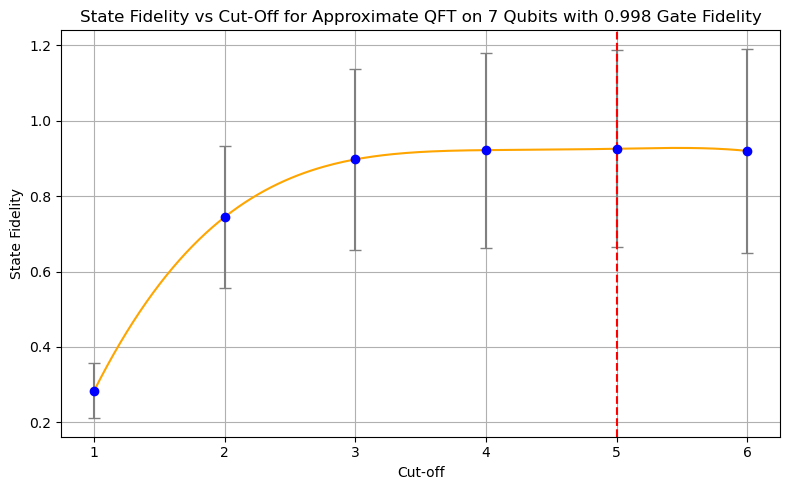

Maximum Fidelity: 0.9256 at cut-off ≈ 5.00
At non-integer cut off Maximum Fidelity: 0.9276 at cut-off ≈ 5.45
5 5.447236180904523
[0.20300013 0.67978981 0.86317125 0.90164033 0.89555254 0.89265674
 0.895391  ]


<Figure size 1000x600 with 0 Axes>

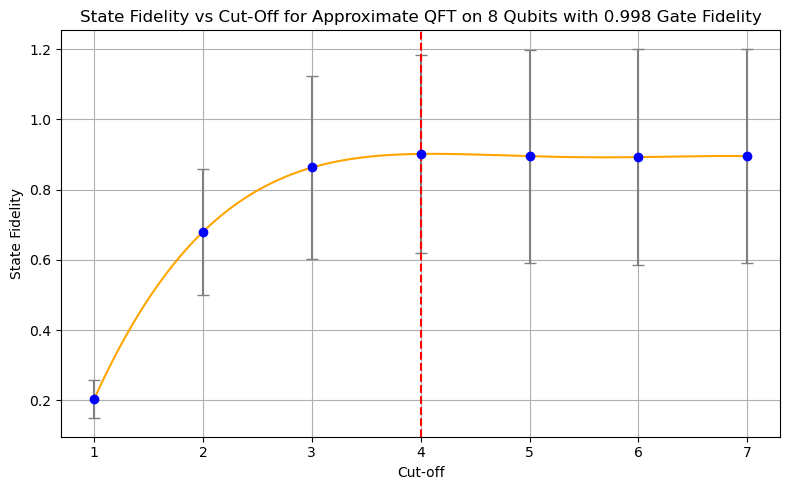

Maximum Fidelity: 0.9019 at cut-off ≈ 4.00
At non-integer cut off Maximum Fidelity: 0.9021 at cut-off ≈ 4.11
4 4.105527638190955
[0.14520376 0.61513128 0.83929806 0.88707216 0.88513821 0.88710262
 0.87731213 0.87114544]


<Figure size 1000x600 with 0 Axes>

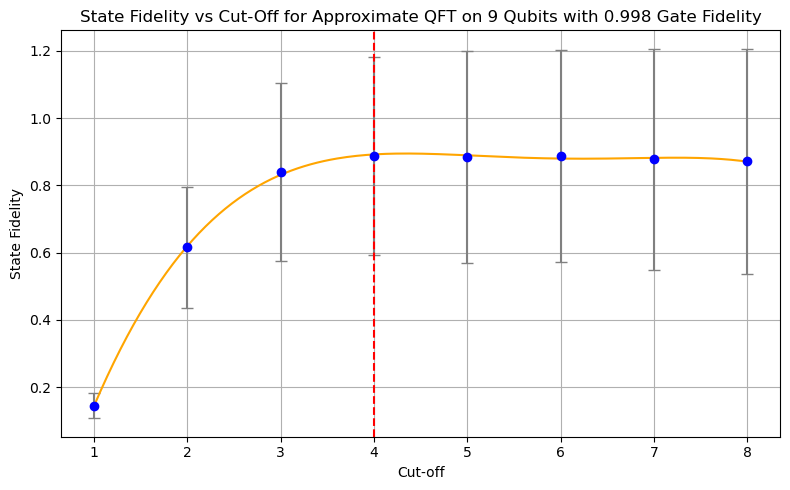

Maximum Fidelity: 0.8918 at cut-off ≈ 4.00
At non-integer cut off Maximum Fidelity: 0.8945 at cut-off ≈ 4.34
4 4.341708542713568
[0.10274573 0.55668596 0.80767396 0.86385428 0.86683215 0.86107169
 0.85365279 0.84524419 0.83818813]


<Figure size 1000x600 with 0 Axes>

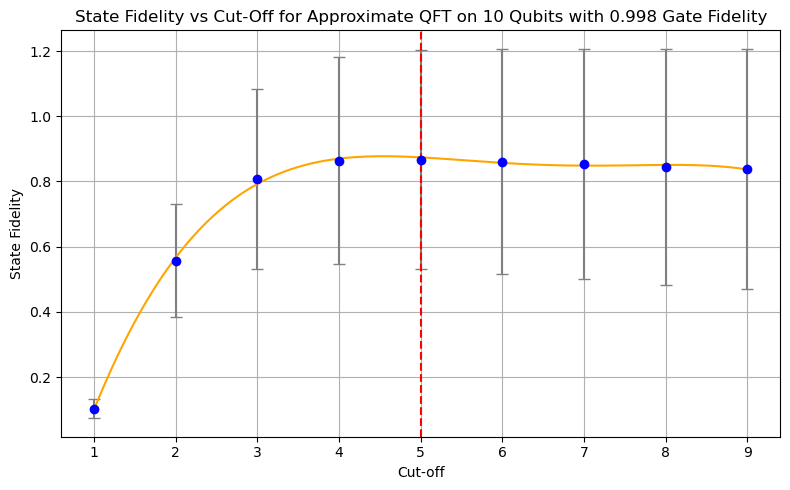

Maximum Fidelity: 0.8738 at cut-off ≈ 5.00
At non-integer cut off Maximum Fidelity: 0.8773 at cut-off ≈ 4.54
5 4.5376884422110555
[1, 2, 3, 3, 3, 4, 4, 4, 4] [1, 2, 3, 4, 5, 6, 7, 7, 6]
[0.99411744]


C:\Users\20221753\AppData\Local\Temp\ipykernel_12504\3752277522.py:12: RankWarning: Polyfit may be poorly conditioned
  p_fit = np.polyfit(cut_offs, fidelities, degree)


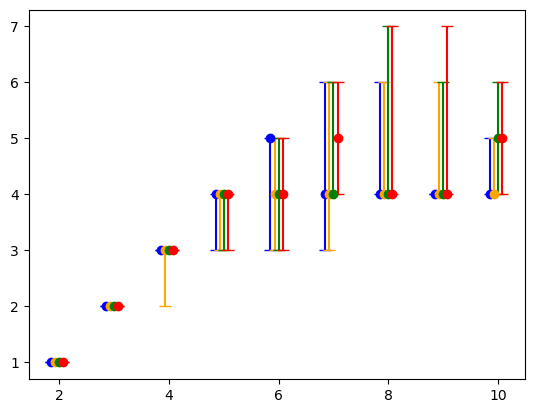

<Figure size 1000x600 with 0 Axes>

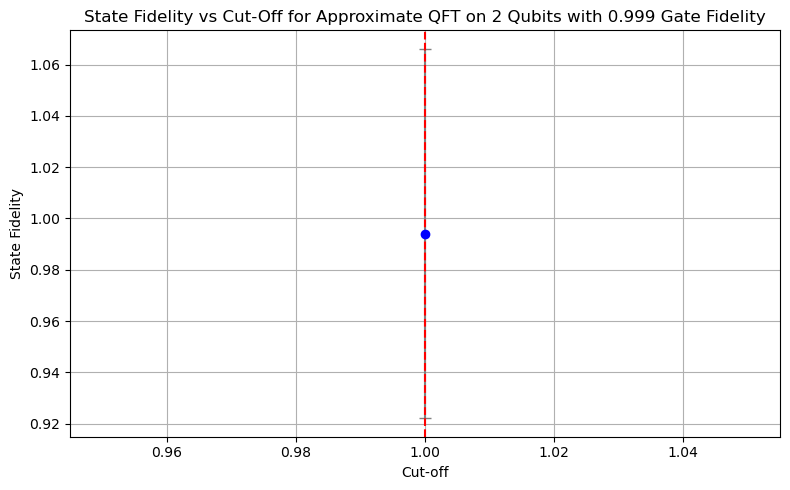

Maximum Fidelity: 0.9941 at cut-off ≈ 1.00
At non-integer cut off Maximum Fidelity: 0.9941 at cut-off ≈ 1.00
1 1.0
[0.89566151 0.98940336]


C:\Users\20221753\AppData\Local\Temp\ipykernel_12504\3752277522.py:12: RankWarning: Polyfit may be poorly conditioned
  p_fit = np.polyfit(cut_offs, fidelities, degree)


<Figure size 1000x600 with 0 Axes>

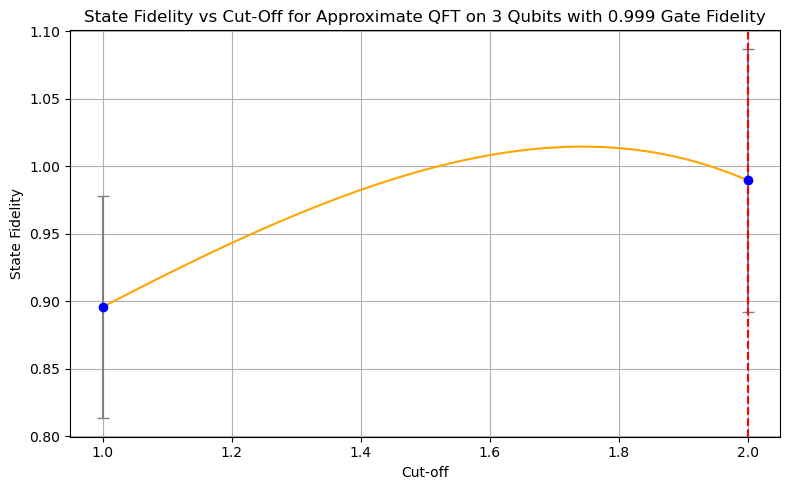

Maximum Fidelity: 0.9894 at cut-off ≈ 2.00
At non-integer cut off Maximum Fidelity: 1.0144 at cut-off ≈ 1.74
2 1.7437185929648242
[0.72356936 0.95814427 0.97921405]


C:\Users\20221753\AppData\Local\Temp\ipykernel_12504\3752277522.py:12: RankWarning: Polyfit may be poorly conditioned
  p_fit = np.polyfit(cut_offs, fidelities, degree)


<Figure size 1000x600 with 0 Axes>

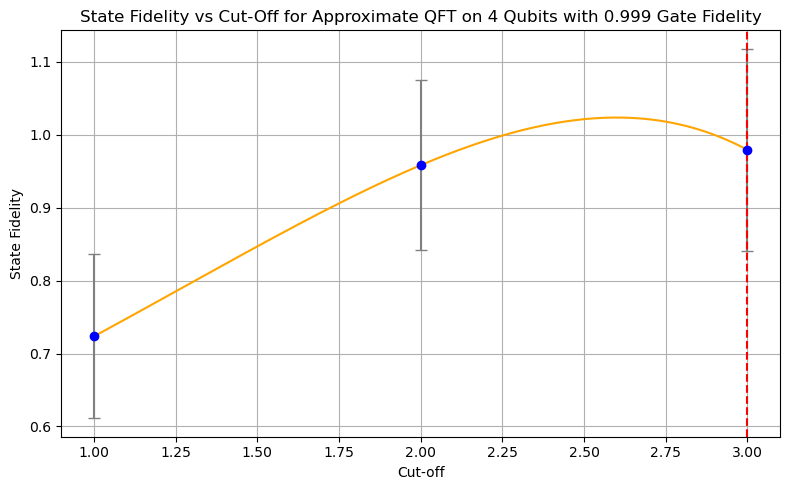

Maximum Fidelity: 0.9792 at cut-off ≈ 3.00
At non-integer cut off Maximum Fidelity: 1.0235 at cut-off ≈ 2.60
3 2.5979899497487438
[0.54782653 0.9001275  0.9667145  0.97241704]


C:\Users\20221753\AppData\Local\Temp\ipykernel_12504\3752277522.py:12: RankWarning: Polyfit may be poorly conditioned
  p_fit = np.polyfit(cut_offs, fidelities, degree)


<Figure size 1000x600 with 0 Axes>

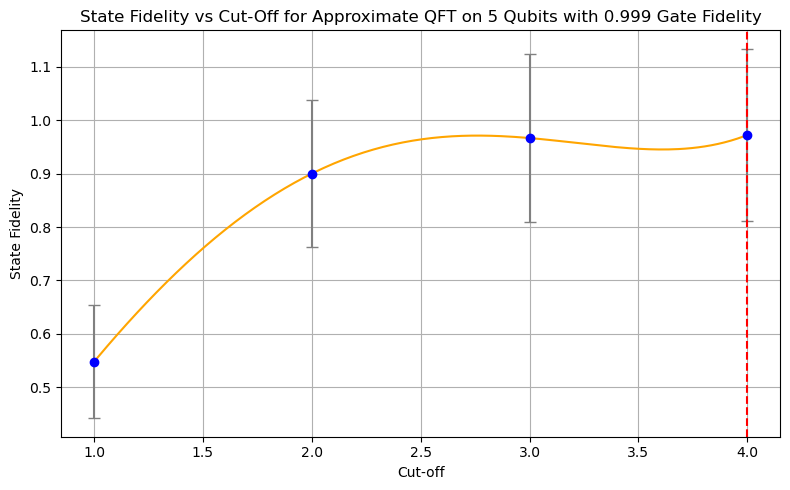

Maximum Fidelity: 0.9724 at cut-off ≈ 4.00
At non-integer cut off Maximum Fidelity: 0.9724 at cut-off ≈ 4.00
4 4.0
[0.39891363 0.83348361 0.9435842  0.95882921 0.9587846 ]


C:\Users\20221753\AppData\Local\Temp\ipykernel_12504\3752277522.py:12: RankWarning: Polyfit may be poorly conditioned
  p_fit = np.polyfit(cut_offs, fidelities, degree)


<Figure size 1000x600 with 0 Axes>

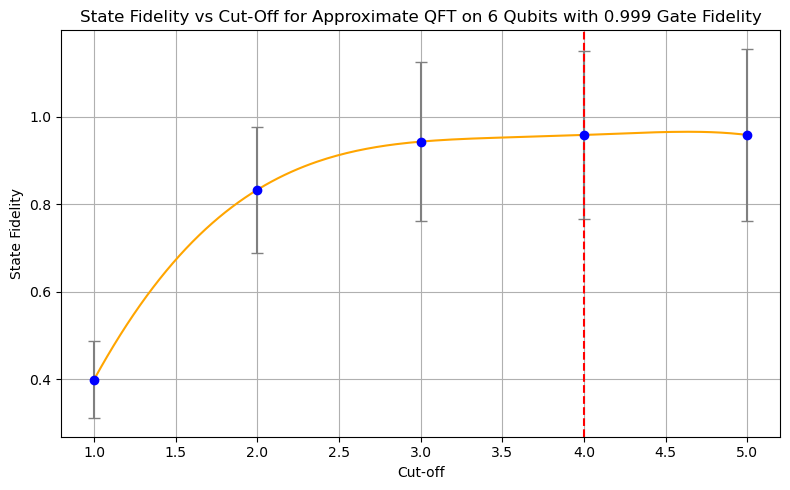

Maximum Fidelity: 0.9588 at cut-off ≈ 4.00
At non-integer cut off Maximum Fidelity: 0.9661 at cut-off ≈ 4.64
4 4.63819095477387
[0.28821968 0.76543448 0.92551809 0.951595   0.94992717 0.95188993]


<Figure size 1000x600 with 0 Axes>

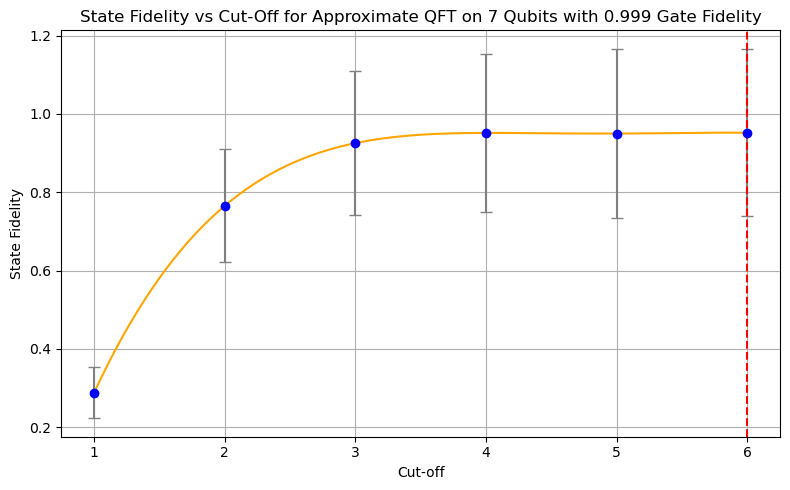

Maximum Fidelity: 0.9519 at cut-off ≈ 6.00
At non-integer cut off Maximum Fidelity: 0.9522 at cut-off ≈ 5.85
6 5.849246231155779
[0.20658165 0.70029945 0.89720292 0.93603269 0.9355199  0.93784392
 0.93347095]


<Figure size 1000x600 with 0 Axes>

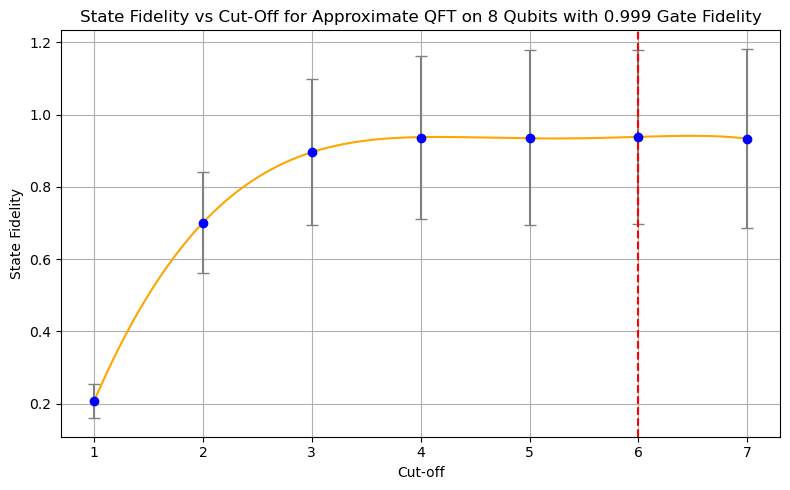

Maximum Fidelity: 0.9384 at cut-off ≈ 6.00
At non-integer cut off Maximum Fidelity: 0.9413 at cut-off ≈ 6.49
6 6.487437185929648
[0.14833876 0.63737301 0.87111194 0.91867898 0.92858311 0.92694638
 0.92273121 0.92076012]


<Figure size 1000x600 with 0 Axes>

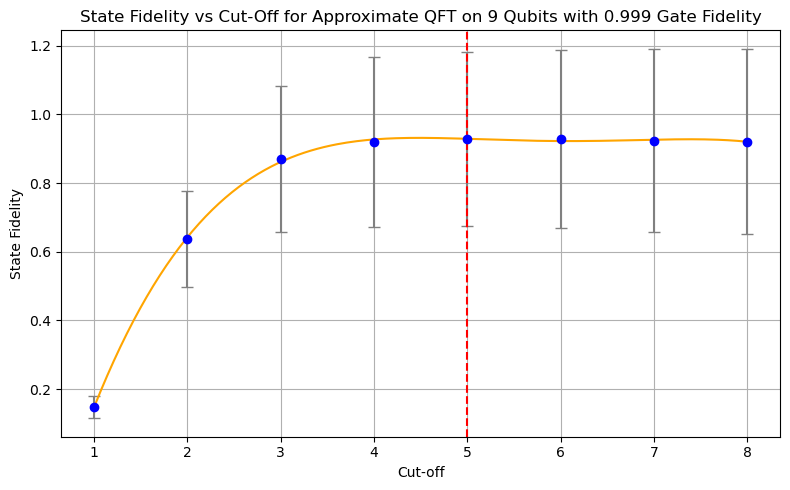

Maximum Fidelity: 0.9286 at cut-off ≈ 5.00
At non-integer cut off Maximum Fidelity: 0.9314 at cut-off ≈ 4.48
5 4.482412060301508
[0.10547238 0.57697473 0.84394882 0.90396513 0.91162192 0.91113691
 0.90732712 0.9036947  0.90115767]


<Figure size 1000x600 with 0 Axes>

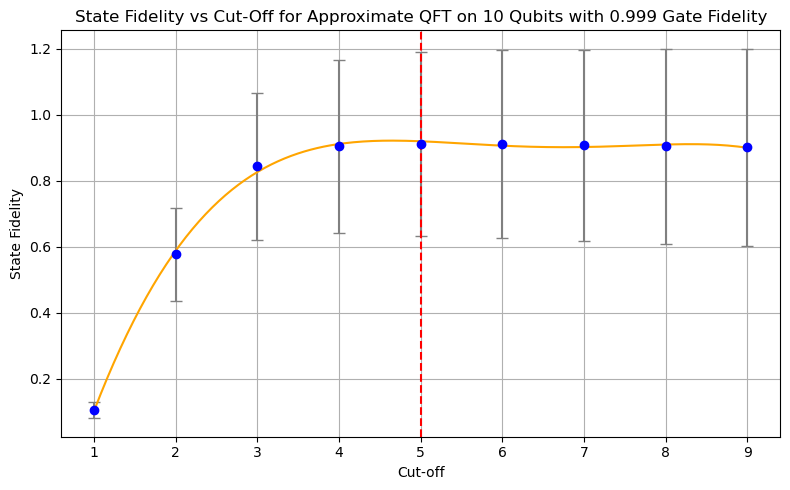

Maximum Fidelity: 0.9194 at cut-off ≈ 5.00
At non-integer cut off Maximum Fidelity: 0.9213 at cut-off ≈ 4.66
5 4.658291457286432
[1, 2, 3, 3, 3, 4, 4, 4, 4] [1, 2, 3, 4, 5, 6, 7, 8, 9]


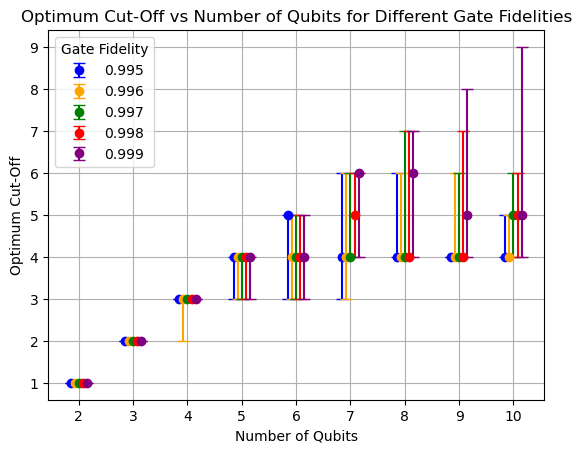

In [453]:
opt_cut_offs_diff_fid_int_better([0.995, 0.996, 0.997, 0.998, 0.999], 0.02)

[0.97731433]


C:\Users\20221753\AppData\Local\Temp\ipykernel_12504\3180408729.py:12: RankWarning: Polyfit may be poorly conditioned
  p_fit = np.polyfit(cut_offs, fidelities, degree)


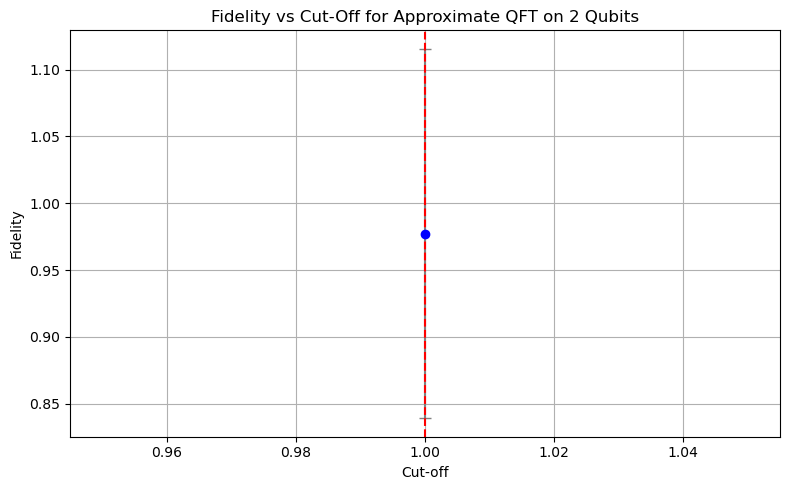

Maximum Fidelity: 0.9773 at cut-off ≈ 1.00
At non-integer cut off Maximum Fidelity: 0.9773 at cut-off ≈ 1.00
1 1.0
[0.8795877 0.9656111]


C:\Users\20221753\AppData\Local\Temp\ipykernel_12504\3180408729.py:12: RankWarning: Polyfit may be poorly conditioned
  p_fit = np.polyfit(cut_offs, fidelities, degree)


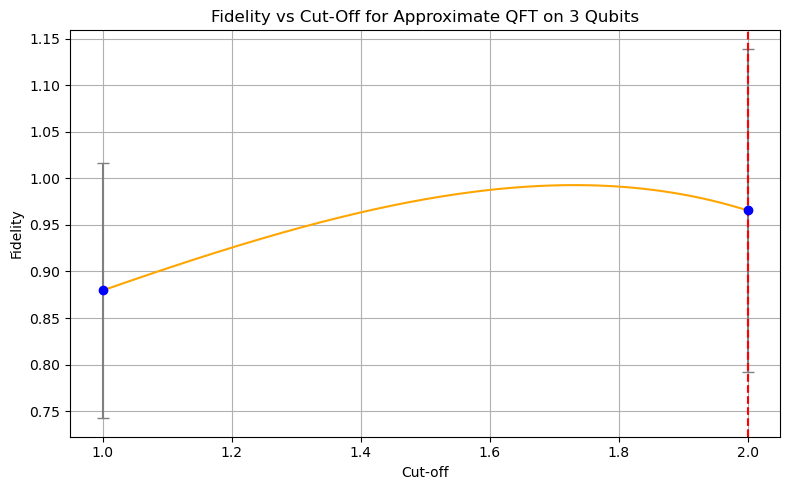

Maximum Fidelity: 0.9656 at cut-off ≈ 2.00
At non-integer cut off Maximum Fidelity: 0.9929 at cut-off ≈ 1.73
2 1.7336683417085426
[0.69654597 0.91210795 0.93653009]


C:\Users\20221753\AppData\Local\Temp\ipykernel_12504\3180408729.py:12: RankWarning: Polyfit may be poorly conditioned
  p_fit = np.polyfit(cut_offs, fidelities, degree)


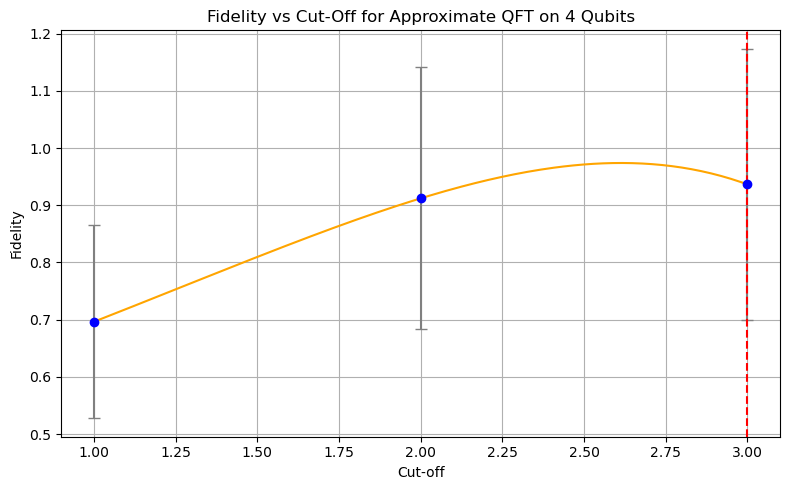

Maximum Fidelity: 0.9365 at cut-off ≈ 3.00
At non-integer cut off Maximum Fidelity: 0.9739 at cut-off ≈ 2.61
3 2.608040201005025
[0.52843813 0.85603547 0.90922561 0.91195471]


C:\Users\20221753\AppData\Local\Temp\ipykernel_12504\3180408729.py:12: RankWarning: Polyfit may be poorly conditioned
  p_fit = np.polyfit(cut_offs, fidelities, degree)


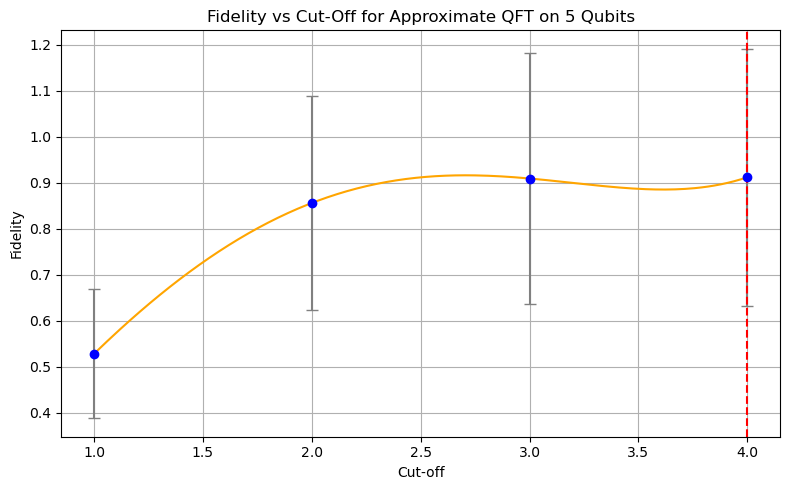

Maximum Fidelity: 0.9120 at cut-off ≈ 4.00
At non-integer cut off Maximum Fidelity: 0.9162 at cut-off ≈ 2.70
4 2.7035175879396984
[0.37772541 0.77154147 0.86481523 0.86522882 0.86573641]


C:\Users\20221753\AppData\Local\Temp\ipykernel_12504\3180408729.py:12: RankWarning: Polyfit may be poorly conditioned
  p_fit = np.polyfit(cut_offs, fidelities, degree)


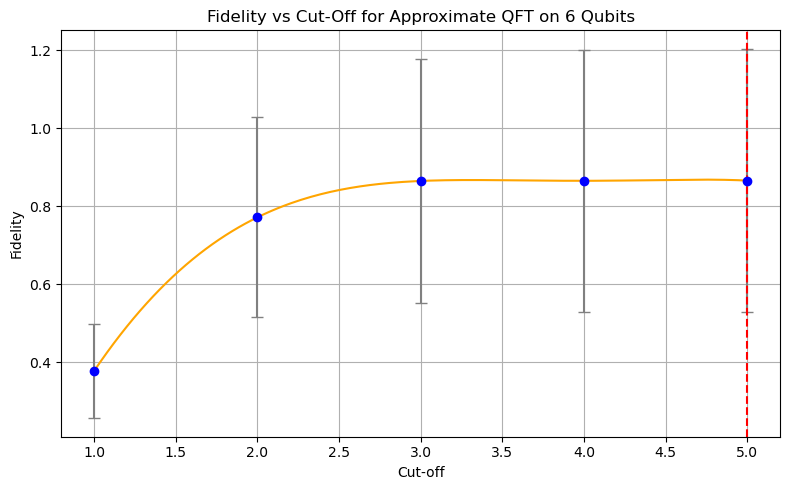

Maximum Fidelity: 0.8657 at cut-off ≈ 5.00
At non-integer cut off Maximum Fidelity: 0.8682 at cut-off ≈ 4.72
5 4.71859296482412
[0.27083386 0.70176217 0.83189325 0.84777665 0.83586867 0.84508175]


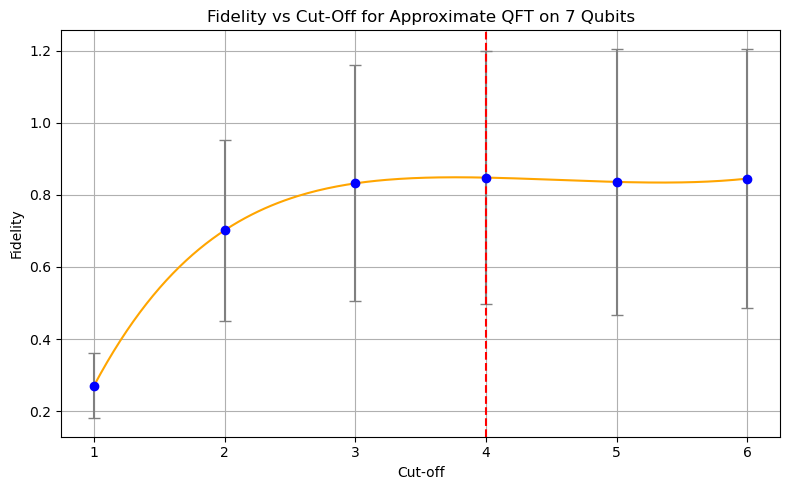

Maximum Fidelity: 0.8478 at cut-off ≈ 4.00
At non-integer cut off Maximum Fidelity: 0.8487 at cut-off ≈ 3.76
4 3.763819095477387
[0.19105678 0.62869651 0.78023315 0.80995469 0.79908507 0.7942064
 0.78217737]


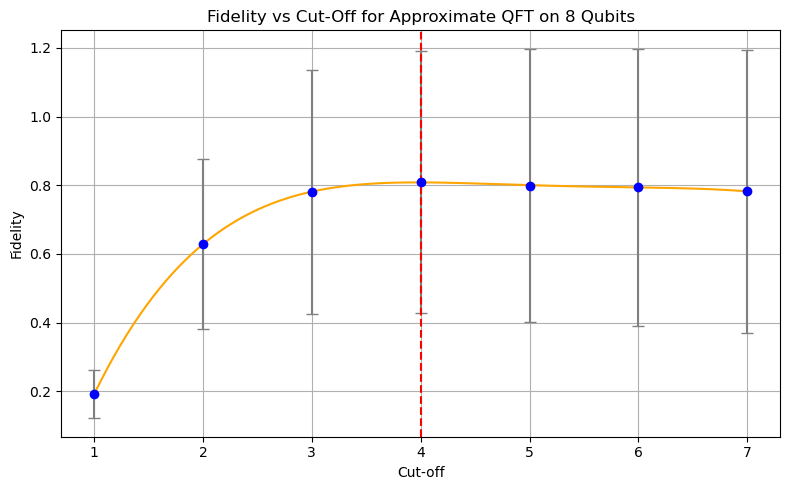

Maximum Fidelity: 0.8084 at cut-off ≈ 4.00
At non-integer cut off Maximum Fidelity: 0.8084 at cut-off ≈ 3.98
4 3.9849246231155777
[0.13597171 0.5708392  0.75986751 0.78467439 0.76726329 0.76102193
 0.74791197 0.75017908]


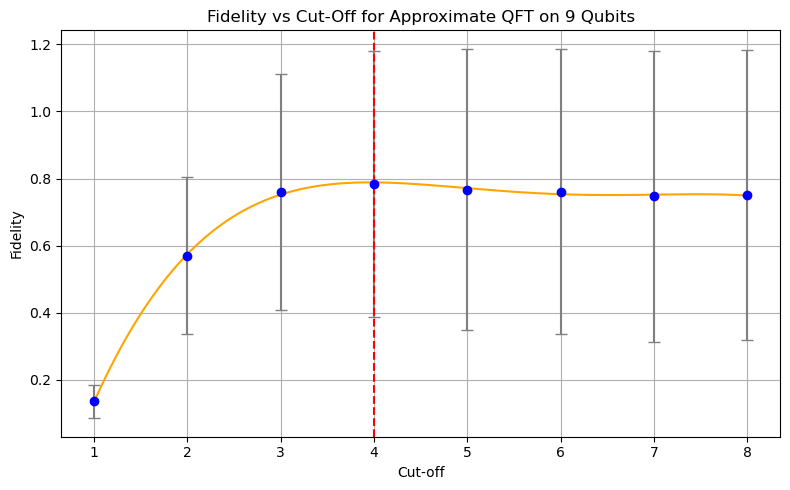

Maximum Fidelity: 0.7888 at cut-off ≈ 4.00
At non-integer cut off Maximum Fidelity: 0.7888 at cut-off ≈ 3.95
4 3.9547738693467336
[0.09576426 0.50257598 0.71353178 0.74554389 0.73403899 0.71700873
 0.70224231 0.69442708 0.69334081]


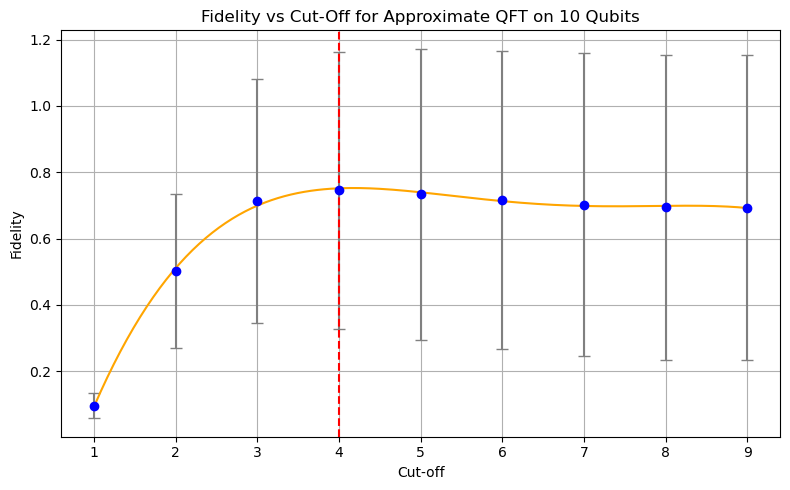

Maximum Fidelity: 0.7517 at cut-off ≈ 4.00
At non-integer cut off Maximum Fidelity: 0.7526 at cut-off ≈ 4.18
4 4.175879396984925
[2, 3, 4, 5, 6, 7, 8, 9, 10] [1.0, 1.7336683417085426, 2.608040201005025, 2.7035175879396984, 4.71859296482412, 3.763819095477387, 3.9849246231155777, 3.9547738693467336, 4.175879396984925]
[0.98716874]


C:\Users\20221753\AppData\Local\Temp\ipykernel_12504\3180408729.py:12: RankWarning: Polyfit may be poorly conditioned
  p_fit = np.polyfit(cut_offs, fidelities, degree)


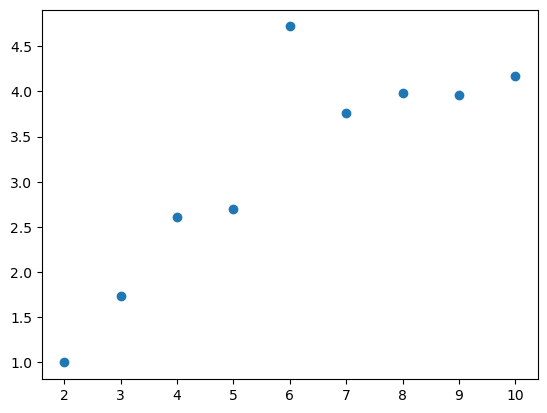

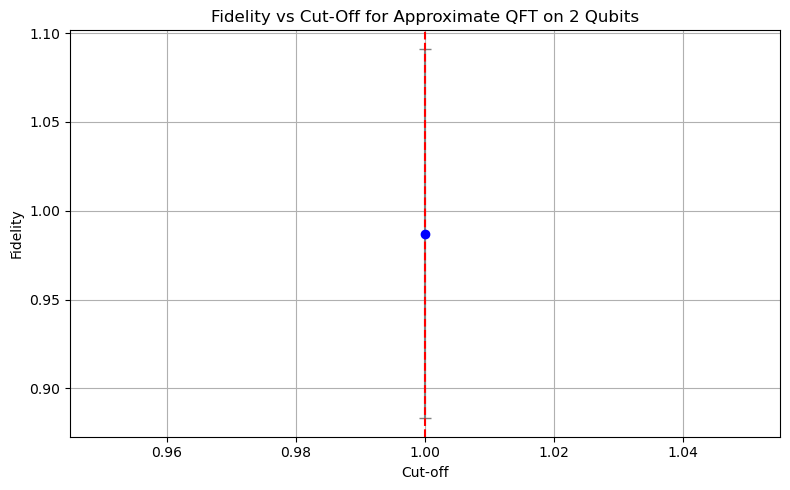

Maximum Fidelity: 0.9872 at cut-off ≈ 1.00
At non-integer cut off Maximum Fidelity: 0.9872 at cut-off ≈ 1.00
1 1.0
[0.88295731 0.97809416]


C:\Users\20221753\AppData\Local\Temp\ipykernel_12504\3180408729.py:12: RankWarning: Polyfit may be poorly conditioned
  p_fit = np.polyfit(cut_offs, fidelities, degree)


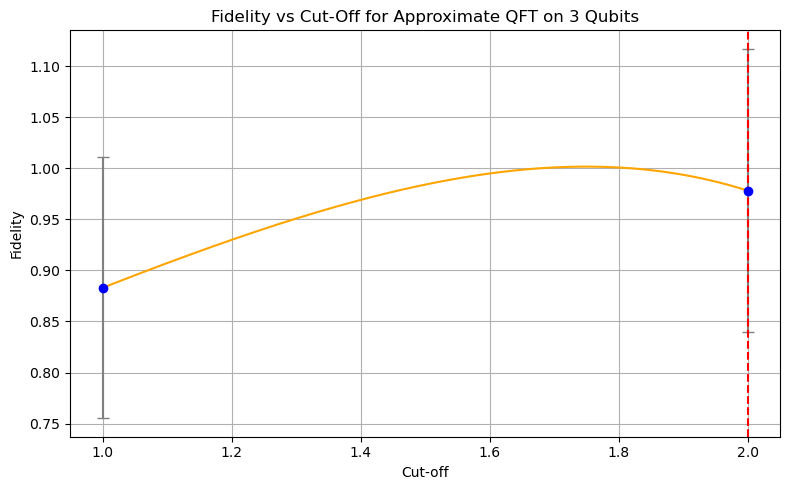

Maximum Fidelity: 0.9781 at cut-off ≈ 2.00
At non-integer cut off Maximum Fidelity: 1.0016 at cut-off ≈ 1.75
2 1.7487437185929648
[0.70659995 0.9278165  0.94747949]


C:\Users\20221753\AppData\Local\Temp\ipykernel_12504\3180408729.py:12: RankWarning: Polyfit may be poorly conditioned
  p_fit = np.polyfit(cut_offs, fidelities, degree)


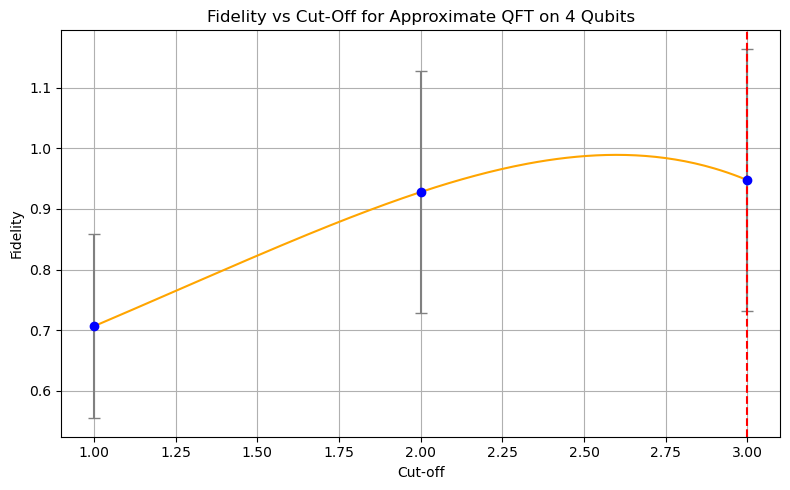

Maximum Fidelity: 0.9475 at cut-off ≈ 3.00
At non-integer cut off Maximum Fidelity: 0.9891 at cut-off ≈ 2.60
3 2.5979899497487438
[0.53443223 0.86994012 0.93099151 0.93131787]


C:\Users\20221753\AppData\Local\Temp\ipykernel_12504\3180408729.py:12: RankWarning: Polyfit may be poorly conditioned
  p_fit = np.polyfit(cut_offs, fidelities, degree)


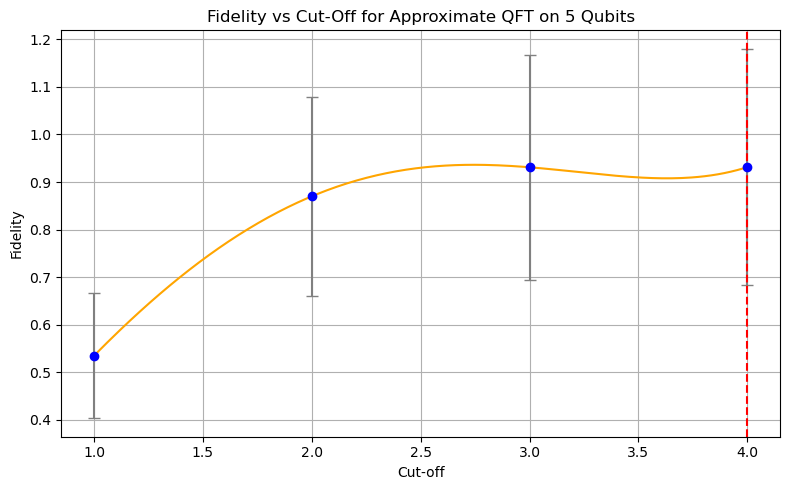

Maximum Fidelity: 0.9313 at cut-off ≈ 4.00
At non-integer cut off Maximum Fidelity: 0.9362 at cut-off ≈ 2.75
4 2.748743718592965
[0.38469726 0.79403809 0.88535366 0.89980895 0.89801534]


C:\Users\20221753\AppData\Local\Temp\ipykernel_12504\3180408729.py:12: RankWarning: Polyfit may be poorly conditioned
  p_fit = np.polyfit(cut_offs, fidelities, degree)


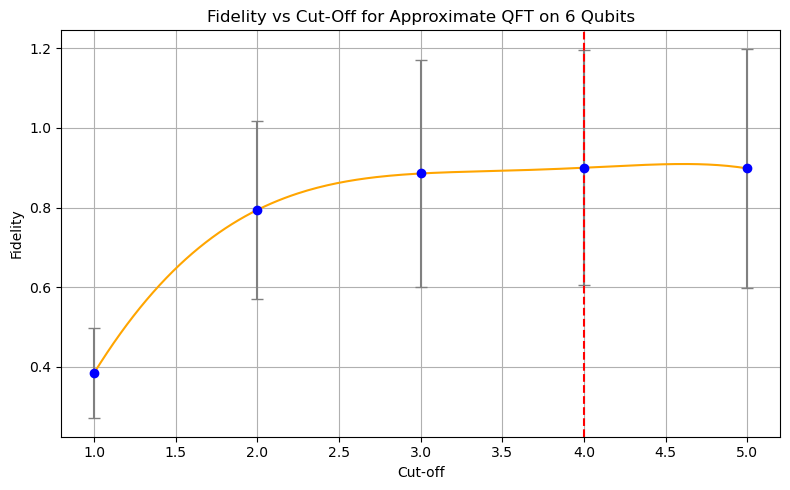

Maximum Fidelity: 0.8998 at cut-off ≈ 4.00
At non-integer cut off Maximum Fidelity: 0.9091 at cut-off ≈ 4.62
4 4.618090452261306
[0.27712677 0.72293912 0.86234396 0.88168992 0.88024789 0.87239186]


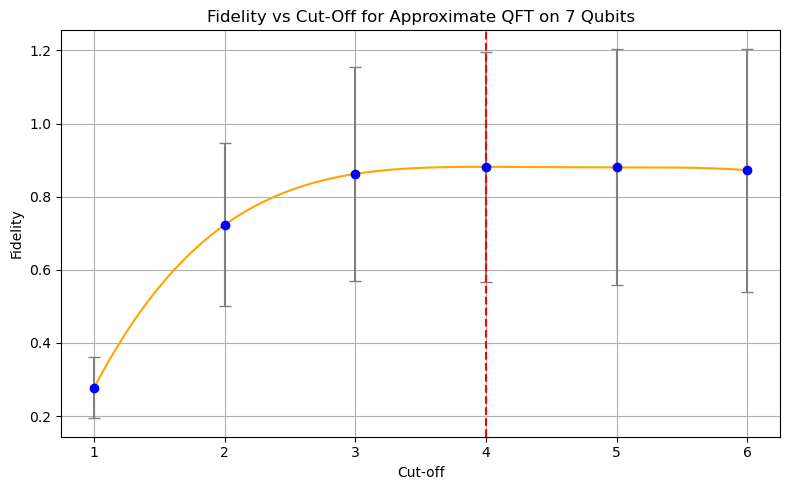

Maximum Fidelity: 0.8817 at cut-off ≈ 4.00
At non-integer cut off Maximum Fidelity: 0.8817 at cut-off ≈ 3.96
4 3.9648241206030153
[0.19713225 0.64917301 0.8203139  0.85035276 0.84358286 0.83913516
 0.82450967]


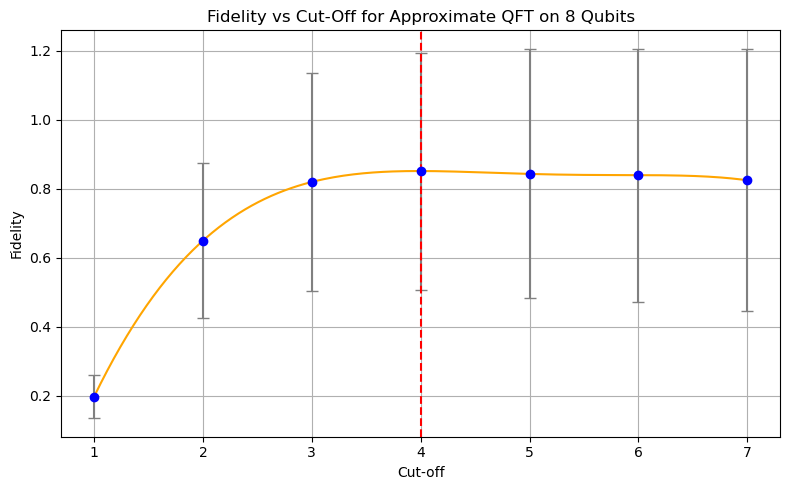

Maximum Fidelity: 0.8513 at cut-off ≈ 4.00
At non-integer cut off Maximum Fidelity: 0.8513 at cut-off ≈ 3.98
4 3.9849246231155777
[0.14058987 0.58844084 0.79068857 0.83005672 0.81919666 0.8148166
 0.81010202 0.80385576]


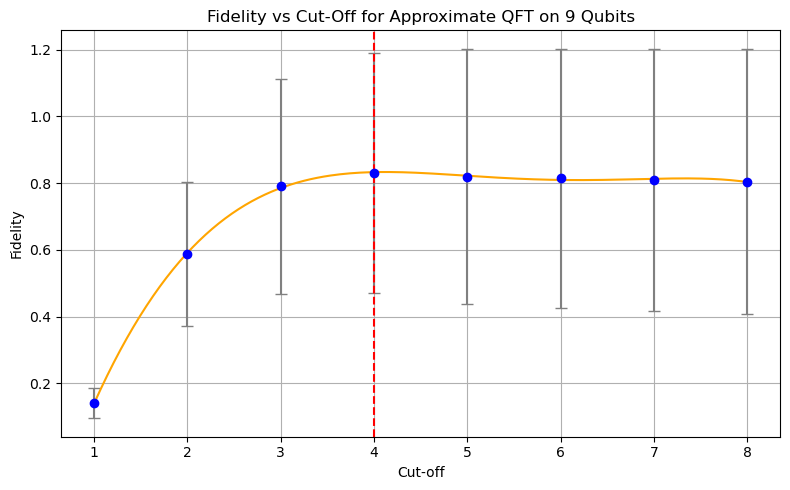

Maximum Fidelity: 0.8330 at cut-off ≈ 4.00
At non-integer cut off Maximum Fidelity: 0.8333 at cut-off ≈ 4.13
4 4.130653266331658
[0.09897922 0.52810106 0.75720773 0.80252143 0.79293792 0.77777509
 0.77330607 0.76286176 0.75386647]


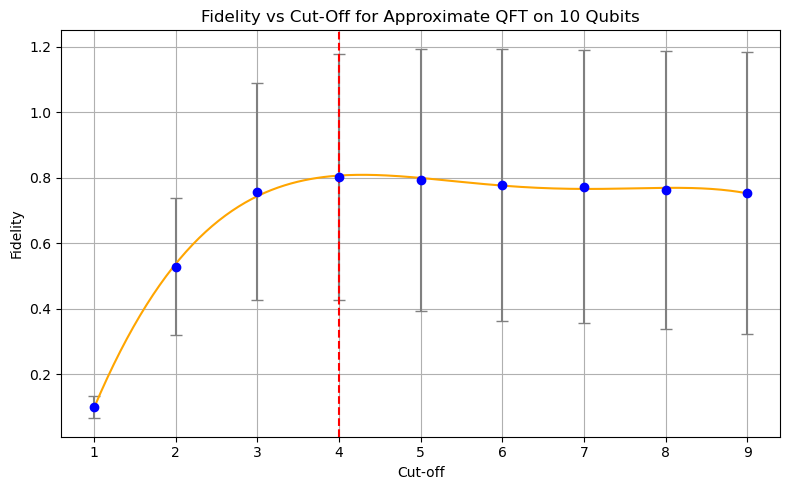

Maximum Fidelity: 0.8067 at cut-off ≈ 4.00
At non-integer cut off Maximum Fidelity: 0.8091 at cut-off ≈ 4.30
4 4.296482412060302
[2, 3, 4, 5, 6, 7, 8, 9, 10] [1.0, 1.7336683417085426, 2.608040201005025, 2.7035175879396984, 4.71859296482412, 3.763819095477387, 3.9849246231155777, 3.9547738693467336, 4.175879396984925]
[2, 3, 4, 5, 6, 7, 8, 9, 10] [1.0, 1.7487437185929648, 2.5979899497487438, 2.748743718592965, 4.618090452261306, 3.9648241206030153, 3.9849246231155777, 4.130653266331658, 4.296482412060302]
[0.98877151]


C:\Users\20221753\AppData\Local\Temp\ipykernel_12504\3180408729.py:12: RankWarning: Polyfit may be poorly conditioned
  p_fit = np.polyfit(cut_offs, fidelities, degree)


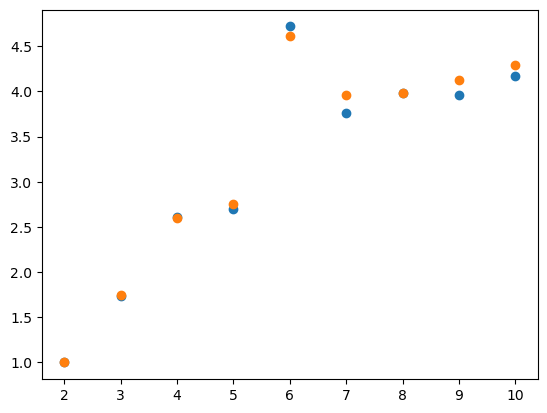

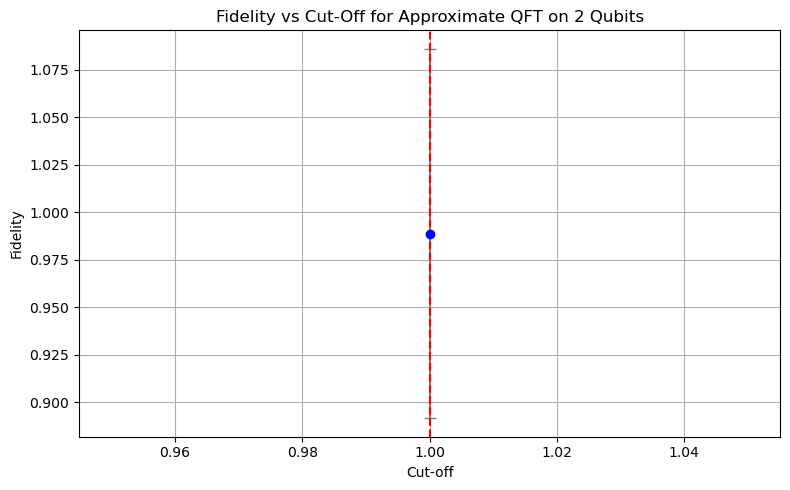

Maximum Fidelity: 0.9888 at cut-off ≈ 1.00
At non-integer cut off Maximum Fidelity: 0.9888 at cut-off ≈ 1.00
1 1.0
[0.88776263 0.97946281]


C:\Users\20221753\AppData\Local\Temp\ipykernel_12504\3180408729.py:12: RankWarning: Polyfit may be poorly conditioned
  p_fit = np.polyfit(cut_offs, fidelities, degree)


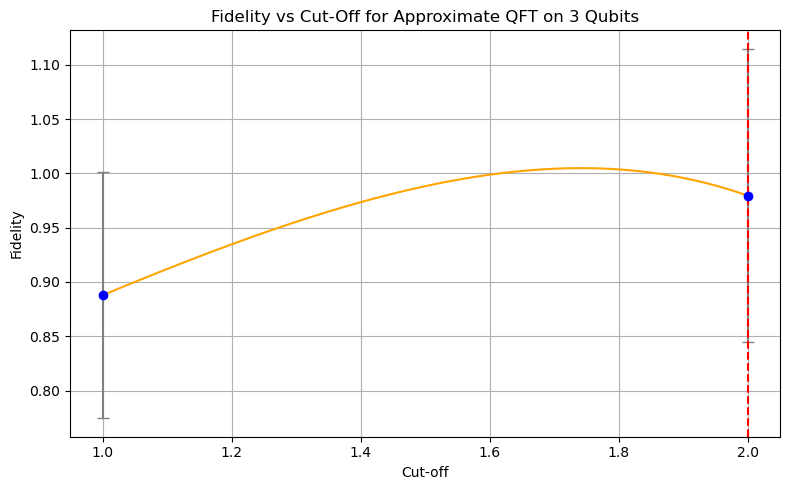

Maximum Fidelity: 0.9795 at cut-off ≈ 2.00
At non-integer cut off Maximum Fidelity: 1.0048 at cut-off ≈ 1.74
2 1.7437185929648242
[0.71061193 0.93398303 0.95984388]


C:\Users\20221753\AppData\Local\Temp\ipykernel_12504\3180408729.py:12: RankWarning: Polyfit may be poorly conditioned
  p_fit = np.polyfit(cut_offs, fidelities, degree)


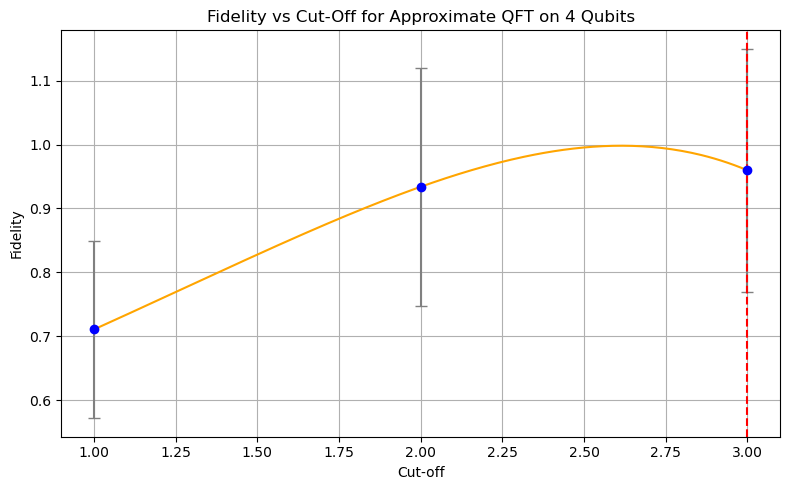

Maximum Fidelity: 0.9598 at cut-off ≈ 3.00
At non-integer cut off Maximum Fidelity: 0.9983 at cut-off ≈ 2.62
3 2.6180904522613067
[0.53803838 0.88133724 0.93629261 0.9388004 ]


C:\Users\20221753\AppData\Local\Temp\ipykernel_12504\3180408729.py:12: RankWarning: Polyfit may be poorly conditioned
  p_fit = np.polyfit(cut_offs, fidelities, degree)


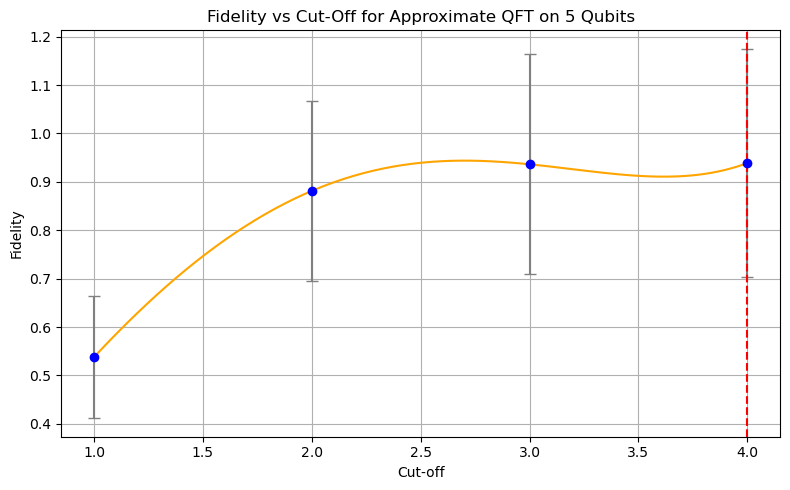

Maximum Fidelity: 0.9388 at cut-off ≈ 4.00
At non-integer cut off Maximum Fidelity: 0.9438 at cut-off ≈ 2.70
4 2.7035175879396984
[0.38990946 0.80169495 0.90361077 0.91532373 0.90947324]


C:\Users\20221753\AppData\Local\Temp\ipykernel_12504\3180408729.py:12: RankWarning: Polyfit may be poorly conditioned
  p_fit = np.polyfit(cut_offs, fidelities, degree)


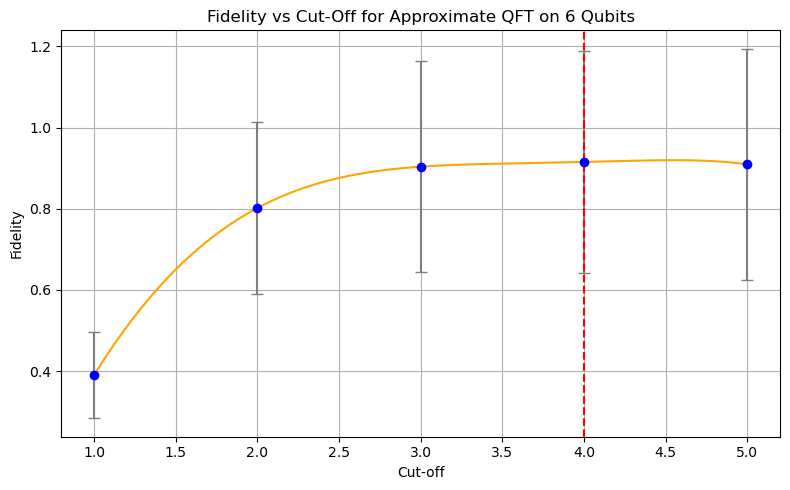

Maximum Fidelity: 0.9153 at cut-off ≈ 4.00
At non-integer cut off Maximum Fidelity: 0.9197 at cut-off ≈ 4.54
4 4.5376884422110555
[0.28115823 0.7292517  0.87490406 0.89835488 0.89278094 0.89080855]


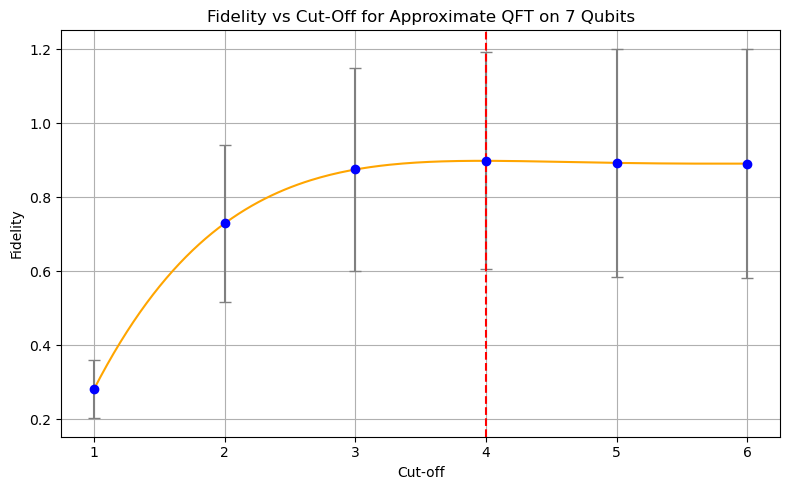

Maximum Fidelity: 0.8984 at cut-off ≈ 4.00
At non-integer cut off Maximum Fidelity: 0.8984 at cut-off ≈ 3.96
4 3.9648241206030153
[0.1993677  0.66253647 0.83811476 0.871595   0.86838424 0.85946509
 0.85736187]


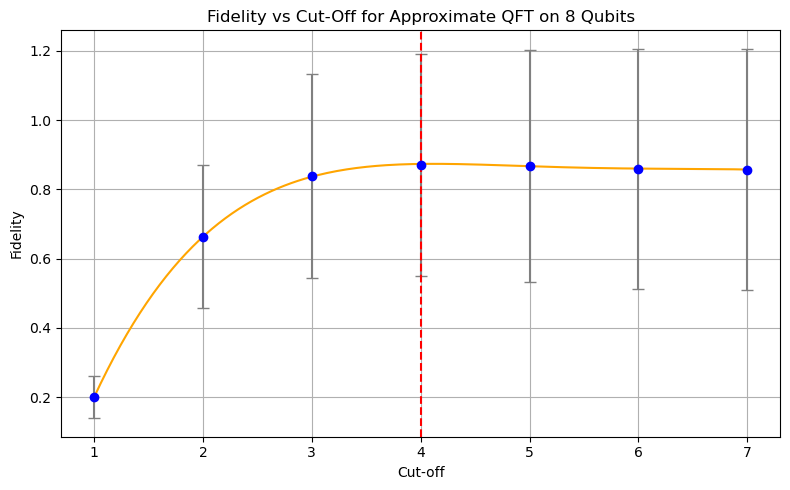

Maximum Fidelity: 0.8735 at cut-off ≈ 4.00
At non-integer cut off Maximum Fidelity: 0.8738 at cut-off ≈ 4.11
4 4.105527638190955
[0.1423394  0.60236355 0.81337502 0.85359726 0.84867746 0.84000202
 0.83683401 0.82882733]


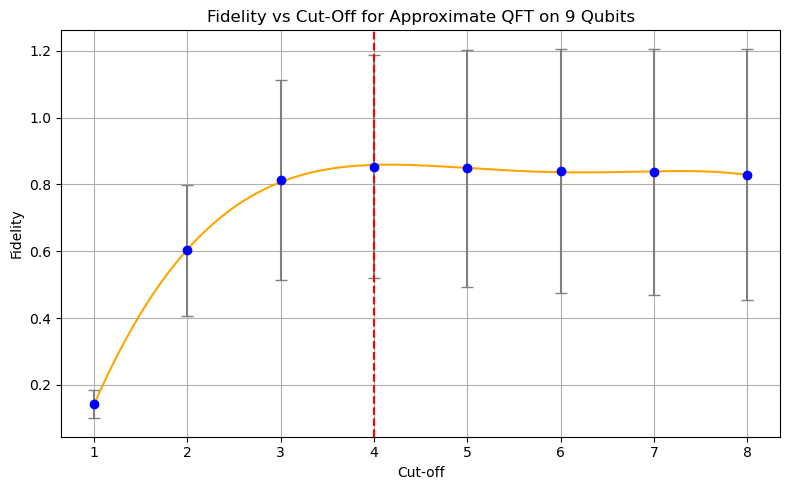

Maximum Fidelity: 0.8586 at cut-off ≈ 4.00
At non-integer cut off Maximum Fidelity: 0.8593 at cut-off ≈ 4.17
4 4.165829145728644
[0.10081362 0.54177734 0.7700599  0.81855017 0.82129782 0.81607326
 0.80225166 0.79491609 0.799866  ]


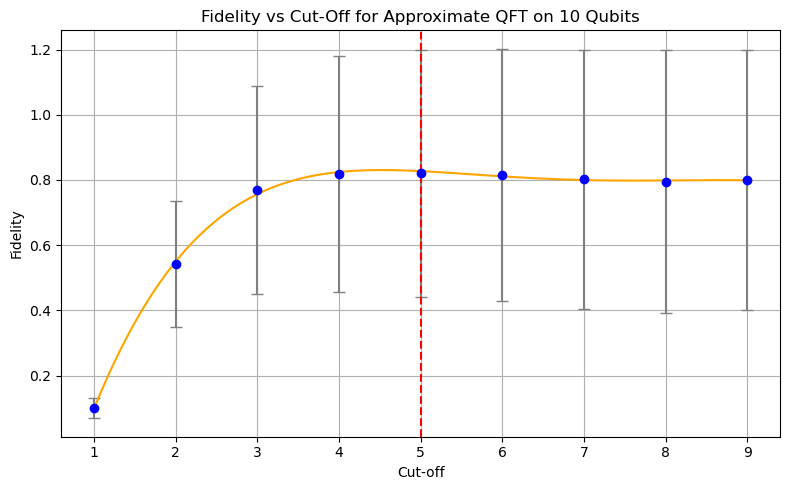

Maximum Fidelity: 0.8272 at cut-off ≈ 5.00
At non-integer cut off Maximum Fidelity: 0.8305 at cut-off ≈ 4.54
5 4.5376884422110555
[2, 3, 4, 5, 6, 7, 8, 9, 10] [1.0, 1.7336683417085426, 2.608040201005025, 2.7035175879396984, 4.71859296482412, 3.763819095477387, 3.9849246231155777, 3.9547738693467336, 4.175879396984925]
[2, 3, 4, 5, 6, 7, 8, 9, 10] [1.0, 1.7487437185929648, 2.5979899497487438, 2.748743718592965, 4.618090452261306, 3.9648241206030153, 3.9849246231155777, 4.130653266331658, 4.296482412060302]
[2, 3, 4, 5, 6, 7, 8, 9, 10] [1.0, 1.7437185929648242, 2.6180904522613067, 2.7035175879396984, 4.5376884422110555, 3.9648241206030153, 4.105527638190955, 4.165829145728644, 4.5376884422110555]
[0.99106603]


C:\Users\20221753\AppData\Local\Temp\ipykernel_12504\3180408729.py:12: RankWarning: Polyfit may be poorly conditioned
  p_fit = np.polyfit(cut_offs, fidelities, degree)


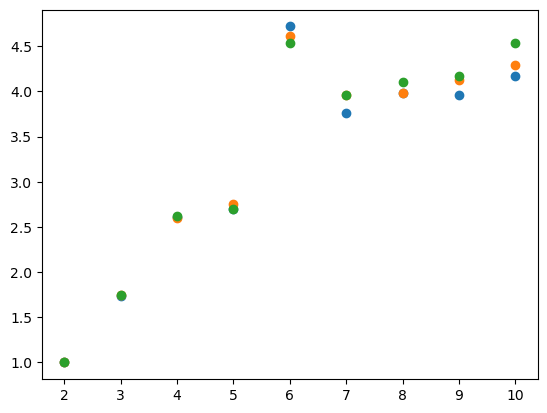

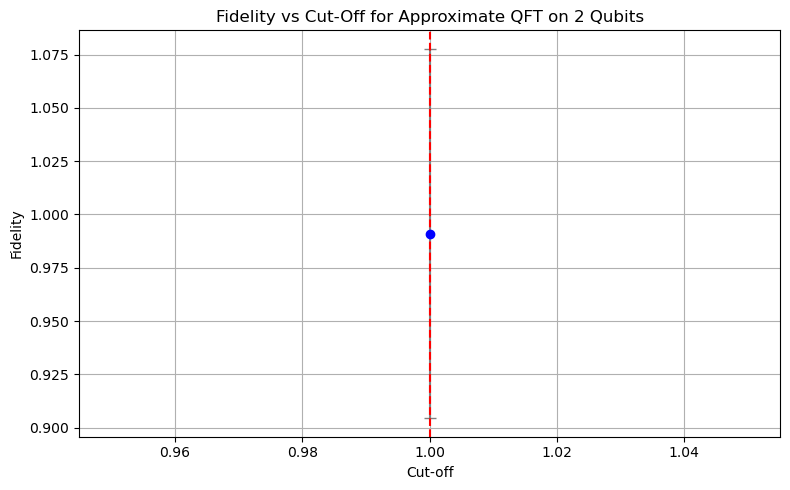

Maximum Fidelity: 0.9911 at cut-off ≈ 1.00
At non-integer cut off Maximum Fidelity: 0.9911 at cut-off ≈ 1.00
1 1.0
[0.88915092 0.98450338]


C:\Users\20221753\AppData\Local\Temp\ipykernel_12504\3180408729.py:12: RankWarning: Polyfit may be poorly conditioned
  p_fit = np.polyfit(cut_offs, fidelities, degree)


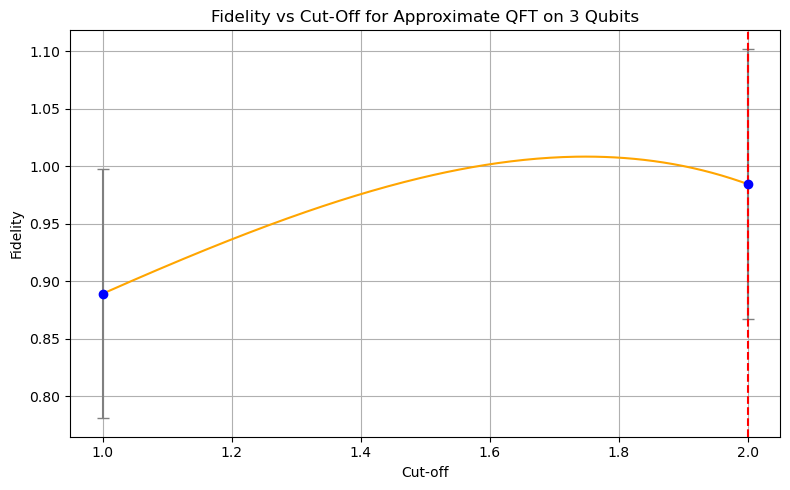

Maximum Fidelity: 0.9845 at cut-off ≈ 2.00
At non-integer cut off Maximum Fidelity: 1.0084 at cut-off ≈ 1.75
2 1.7487437185929648
[0.71551967 0.94331896 0.96800521]


C:\Users\20221753\AppData\Local\Temp\ipykernel_12504\3180408729.py:12: RankWarning: Polyfit may be poorly conditioned
  p_fit = np.polyfit(cut_offs, fidelities, degree)


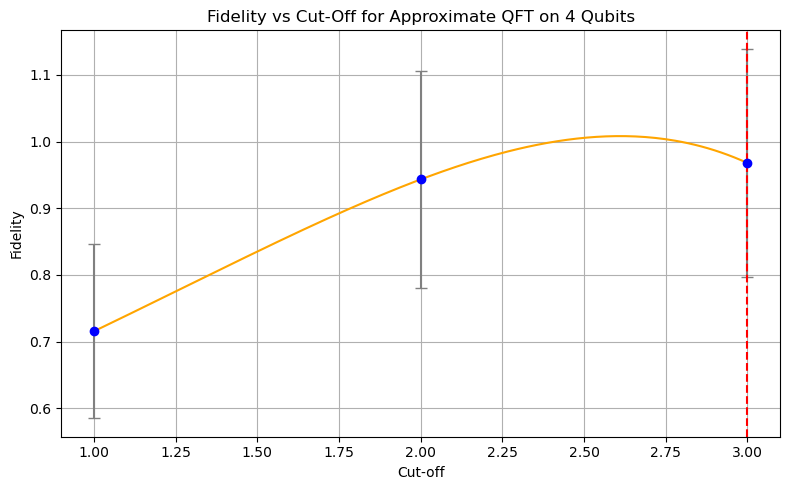

Maximum Fidelity: 0.9680 at cut-off ≈ 3.00
At non-integer cut off Maximum Fidelity: 1.0083 at cut-off ≈ 2.61
3 2.608040201005025
[0.54131253 0.88893671 0.95337591 0.95617848]


C:\Users\20221753\AppData\Local\Temp\ipykernel_12504\3180408729.py:12: RankWarning: Polyfit may be poorly conditioned
  p_fit = np.polyfit(cut_offs, fidelities, degree)


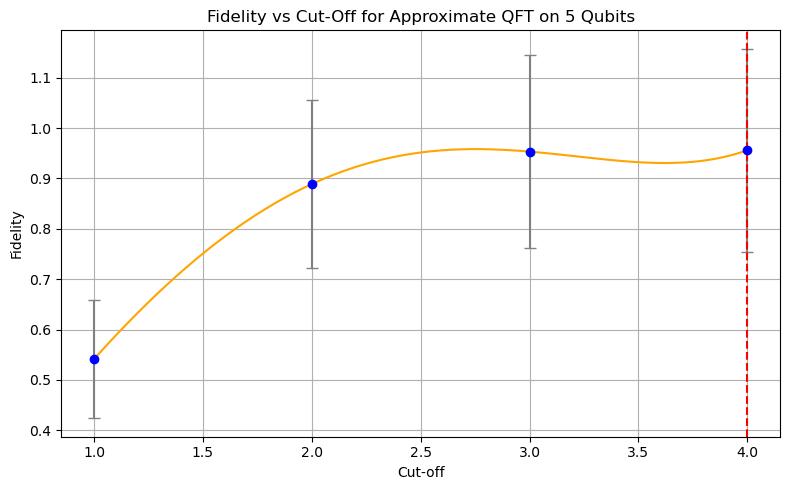

Maximum Fidelity: 0.9562 at cut-off ≈ 4.00
At non-integer cut off Maximum Fidelity: 0.9584 at cut-off ≈ 2.75
4 2.748743718592965
[0.39275395 0.81671532 0.92171789 0.9388586  0.93460003]


C:\Users\20221753\AppData\Local\Temp\ipykernel_12504\3180408729.py:12: RankWarning: Polyfit may be poorly conditioned
  p_fit = np.polyfit(cut_offs, fidelities, degree)


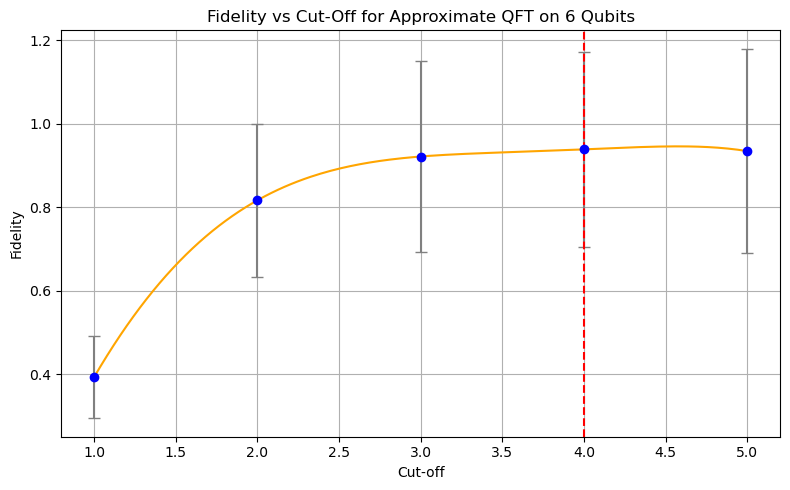

Maximum Fidelity: 0.9389 at cut-off ≈ 4.00
At non-integer cut off Maximum Fidelity: 0.9460 at cut-off ≈ 4.58
4 4.577889447236181
[0.28354057 0.74441153 0.89729518 0.92180228 0.92560649 0.91960795]


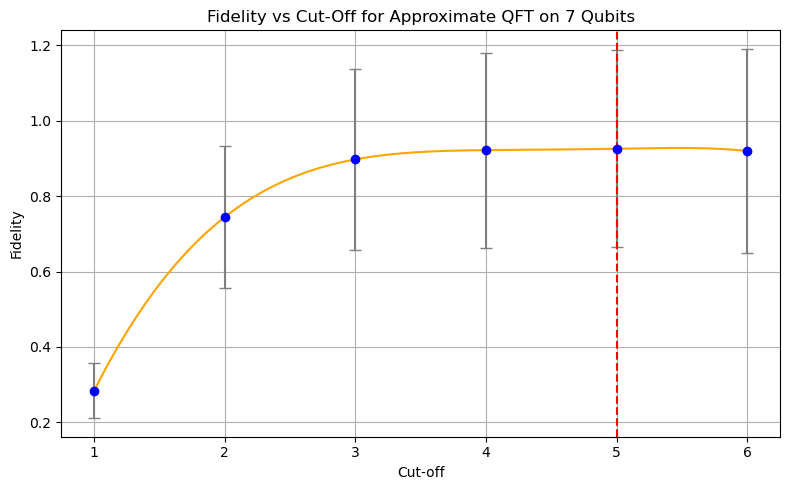

Maximum Fidelity: 0.9256 at cut-off ≈ 5.00
At non-integer cut off Maximum Fidelity: 0.9276 at cut-off ≈ 5.45
5 5.447236180904523
[0.20300013 0.67978981 0.86317125 0.90164033 0.89555254 0.89265674
 0.895391  ]


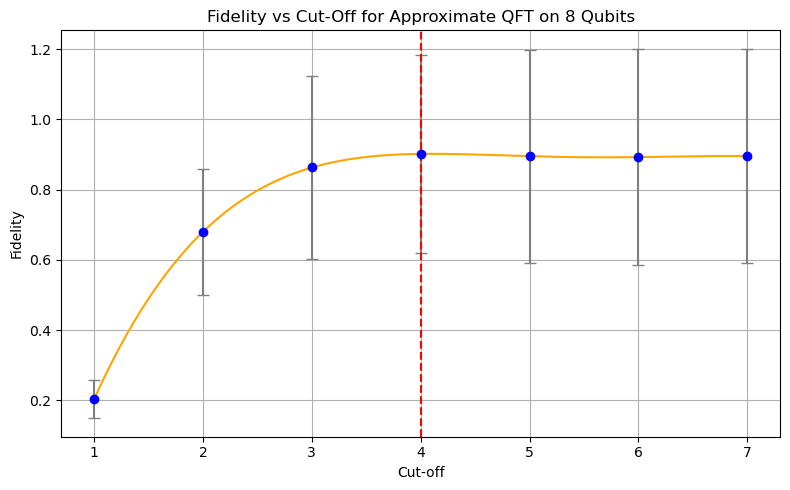

Maximum Fidelity: 0.9019 at cut-off ≈ 4.00
At non-integer cut off Maximum Fidelity: 0.9021 at cut-off ≈ 4.11
4 4.105527638190955
[0.14520376 0.61513128 0.83929806 0.88707216 0.88513821 0.88710262
 0.87731213 0.87114544]


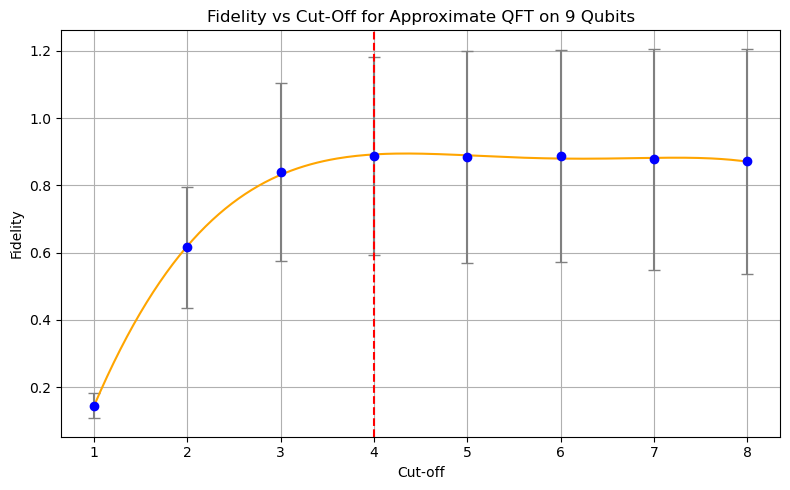

Maximum Fidelity: 0.8918 at cut-off ≈ 4.00
At non-integer cut off Maximum Fidelity: 0.8945 at cut-off ≈ 4.34
4 4.341708542713568
[0.10274573 0.55668596 0.80767396 0.86385428 0.86683215 0.86107169
 0.85365279 0.84524419 0.83818813]


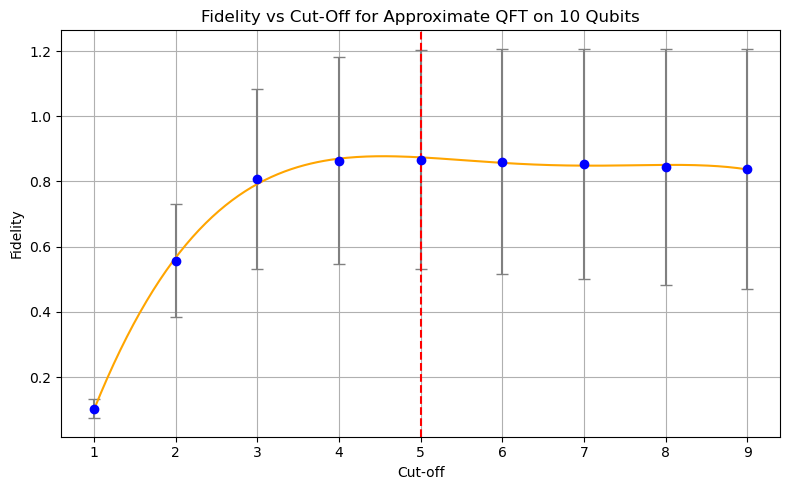

Maximum Fidelity: 0.8738 at cut-off ≈ 5.00
At non-integer cut off Maximum Fidelity: 0.8773 at cut-off ≈ 4.54
5 4.5376884422110555
[2, 3, 4, 5, 6, 7, 8, 9, 10] [1.0, 1.7336683417085426, 2.608040201005025, 2.7035175879396984, 4.71859296482412, 3.763819095477387, 3.9849246231155777, 3.9547738693467336, 4.175879396984925]
[2, 3, 4, 5, 6, 7, 8, 9, 10] [1.0, 1.7487437185929648, 2.5979899497487438, 2.748743718592965, 4.618090452261306, 3.9648241206030153, 3.9849246231155777, 4.130653266331658, 4.296482412060302]
[2, 3, 4, 5, 6, 7, 8, 9, 10] [1.0, 1.7437185929648242, 2.6180904522613067, 2.7035175879396984, 4.5376884422110555, 3.9648241206030153, 4.105527638190955, 4.165829145728644, 4.5376884422110555]
[2, 3, 4, 5, 6, 7, 8, 9, 10] [1.0, 1.7487437185929648, 2.608040201005025, 2.748743718592965, 4.577889447236181, 5.447236180904523, 4.105527638190955, 4.341708542713568, 4.5376884422110555]
[0.99411744]


C:\Users\20221753\AppData\Local\Temp\ipykernel_12504\3180408729.py:12: RankWarning: Polyfit may be poorly conditioned
  p_fit = np.polyfit(cut_offs, fidelities, degree)


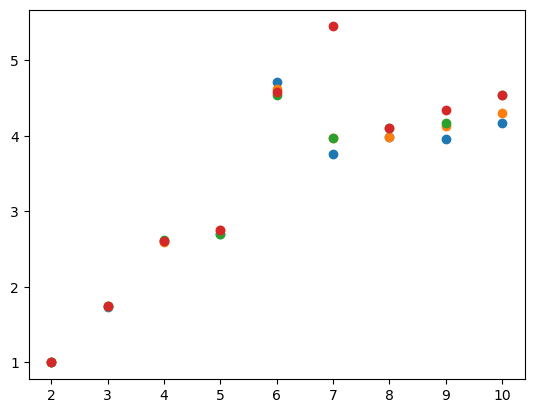

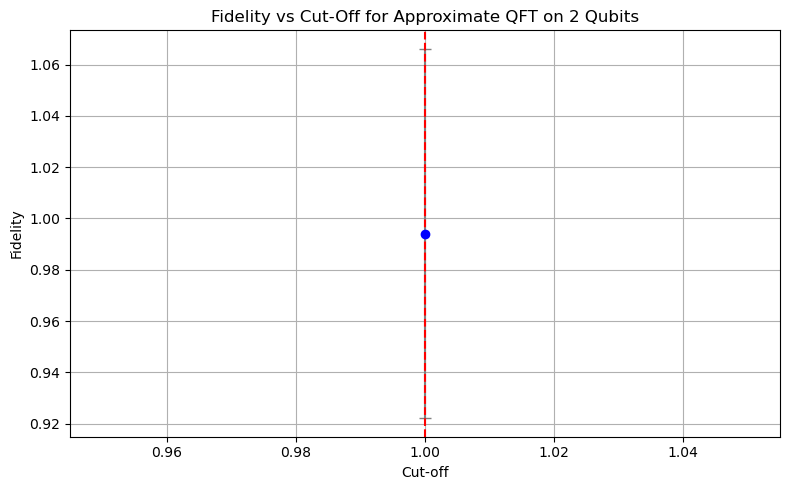

Maximum Fidelity: 0.9941 at cut-off ≈ 1.00
At non-integer cut off Maximum Fidelity: 0.9941 at cut-off ≈ 1.00
1 1.0
[0.89566151 0.98940336]


C:\Users\20221753\AppData\Local\Temp\ipykernel_12504\3180408729.py:12: RankWarning: Polyfit may be poorly conditioned
  p_fit = np.polyfit(cut_offs, fidelities, degree)


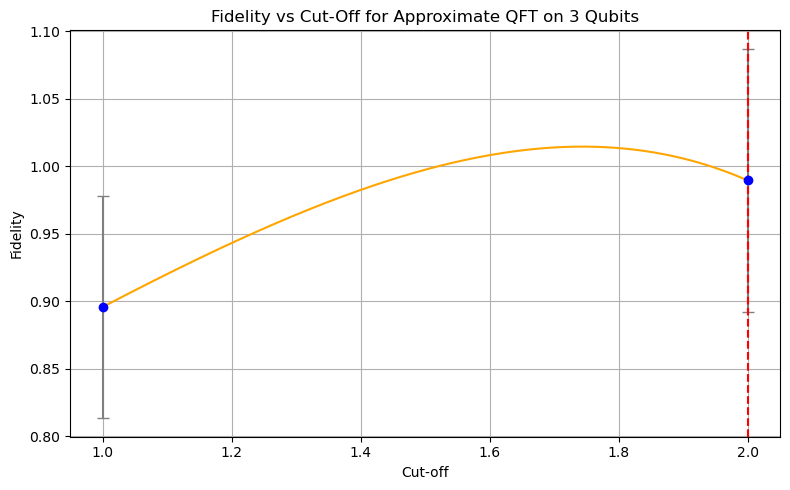

Maximum Fidelity: 0.9894 at cut-off ≈ 2.00
At non-integer cut off Maximum Fidelity: 1.0144 at cut-off ≈ 1.74
2 1.7437185929648242
[0.72356936 0.95814427 0.97921405]


C:\Users\20221753\AppData\Local\Temp\ipykernel_12504\3180408729.py:12: RankWarning: Polyfit may be poorly conditioned
  p_fit = np.polyfit(cut_offs, fidelities, degree)


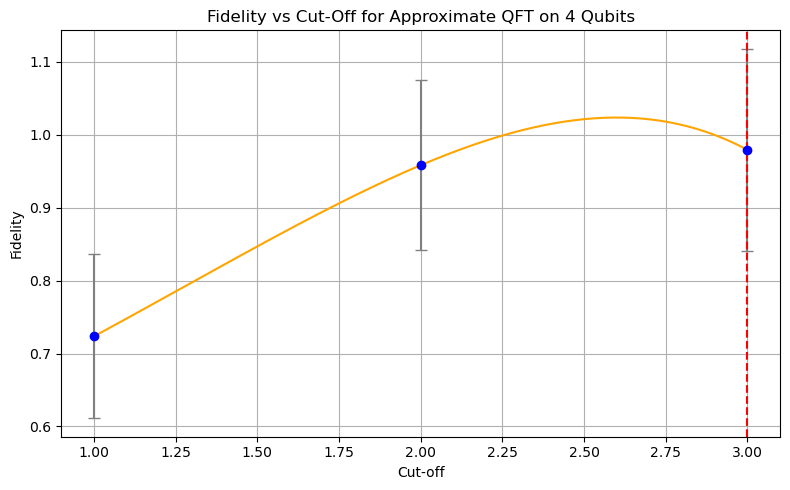

Maximum Fidelity: 0.9792 at cut-off ≈ 3.00
At non-integer cut off Maximum Fidelity: 1.0235 at cut-off ≈ 2.60
3 2.5979899497487438
[0.54782653 0.9001275  0.9667145  0.97241704]


C:\Users\20221753\AppData\Local\Temp\ipykernel_12504\3180408729.py:12: RankWarning: Polyfit may be poorly conditioned
  p_fit = np.polyfit(cut_offs, fidelities, degree)


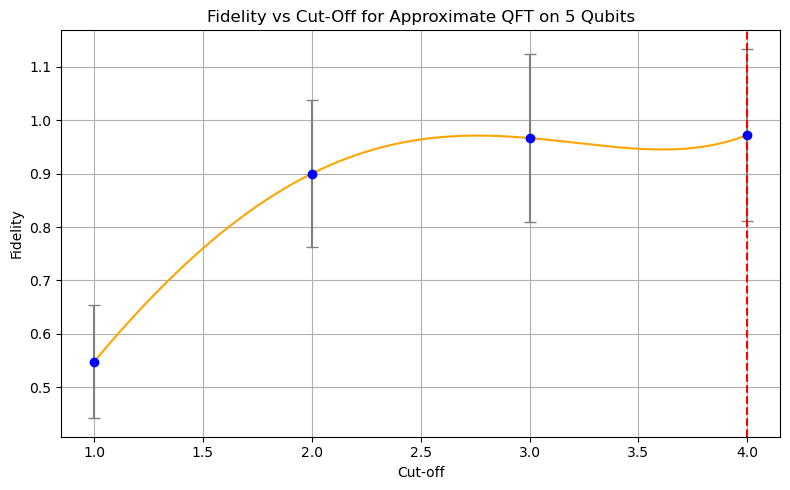

Maximum Fidelity: 0.9724 at cut-off ≈ 4.00
At non-integer cut off Maximum Fidelity: 0.9724 at cut-off ≈ 4.00
4 4.0
[0.39891363 0.83348361 0.9435842  0.95882921 0.9587846 ]


C:\Users\20221753\AppData\Local\Temp\ipykernel_12504\3180408729.py:12: RankWarning: Polyfit may be poorly conditioned
  p_fit = np.polyfit(cut_offs, fidelities, degree)


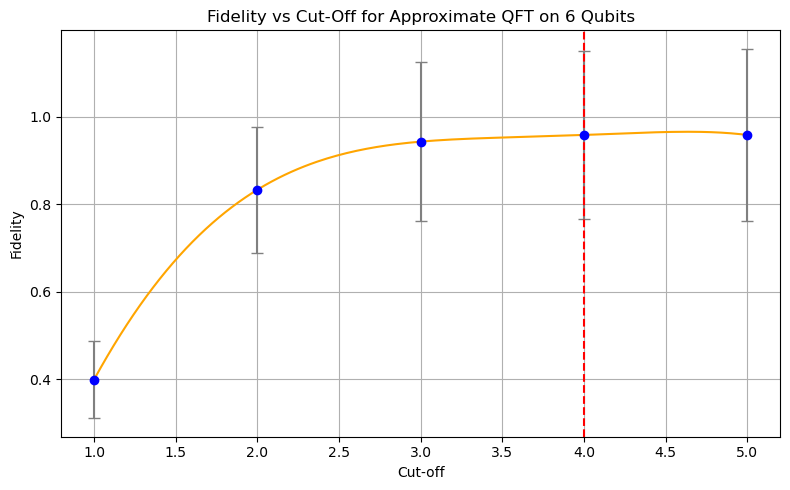

Maximum Fidelity: 0.9588 at cut-off ≈ 4.00
At non-integer cut off Maximum Fidelity: 0.9661 at cut-off ≈ 4.64
4 4.63819095477387
[0.28821968 0.76543448 0.92551809 0.951595   0.94992717 0.95188993]


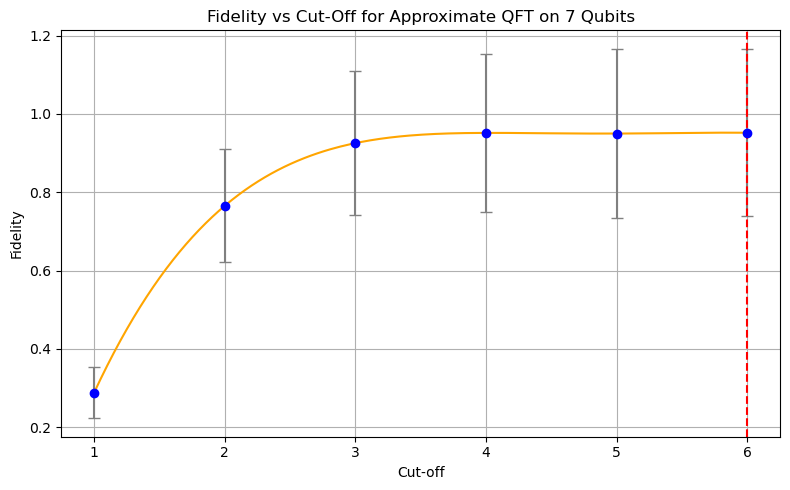

Maximum Fidelity: 0.9519 at cut-off ≈ 6.00
At non-integer cut off Maximum Fidelity: 0.9522 at cut-off ≈ 5.85
6 5.849246231155779
[0.20658165 0.70029945 0.89720292 0.93603269 0.9355199  0.93784392
 0.93347095]


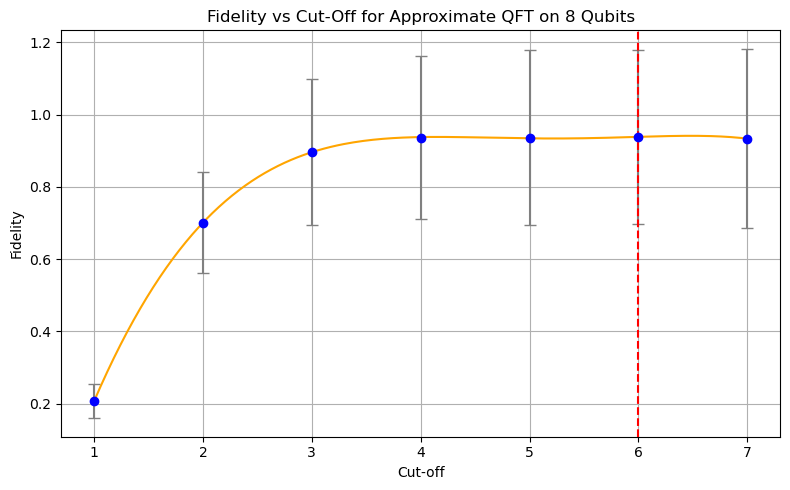

Maximum Fidelity: 0.9384 at cut-off ≈ 6.00
At non-integer cut off Maximum Fidelity: 0.9413 at cut-off ≈ 6.49
6 6.487437185929648
[0.14833876 0.63737301 0.87111194 0.91867898 0.92858311 0.92694638
 0.92273121 0.92076012]


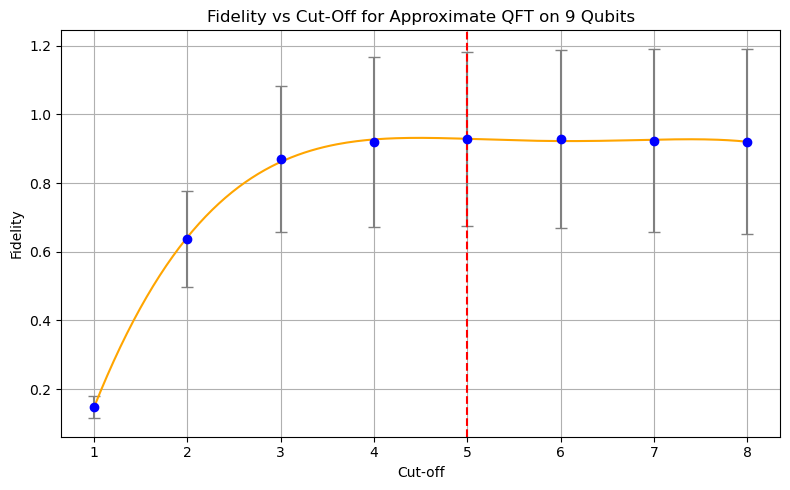

Maximum Fidelity: 0.9286 at cut-off ≈ 5.00
At non-integer cut off Maximum Fidelity: 0.9314 at cut-off ≈ 4.48
5 4.482412060301508
[0.10547238 0.57697473 0.84394882 0.90396513 0.91162192 0.91113691
 0.90732712 0.9036947  0.90115767]


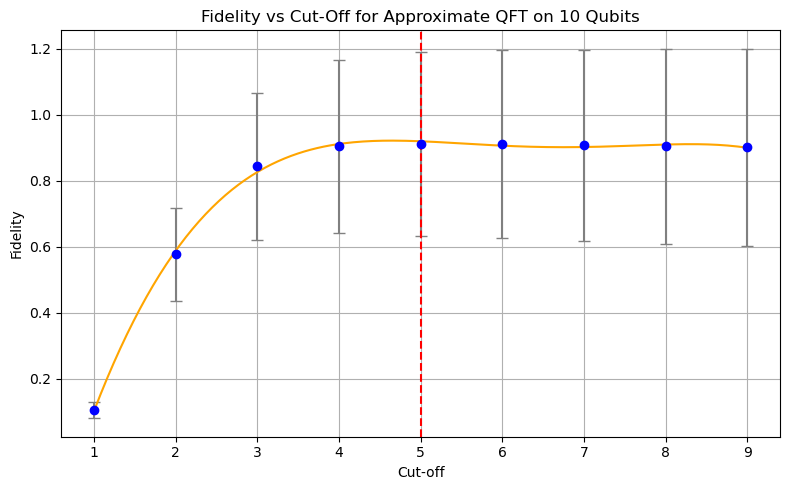

Maximum Fidelity: 0.9194 at cut-off ≈ 5.00
At non-integer cut off Maximum Fidelity: 0.9213 at cut-off ≈ 4.66
5 4.658291457286432
[2, 3, 4, 5, 6, 7, 8, 9, 10] [1.0, 1.7336683417085426, 2.608040201005025, 2.7035175879396984, 4.71859296482412, 3.763819095477387, 3.9849246231155777, 3.9547738693467336, 4.175879396984925]
[2, 3, 4, 5, 6, 7, 8, 9, 10] [1.0, 1.7487437185929648, 2.5979899497487438, 2.748743718592965, 4.618090452261306, 3.9648241206030153, 3.9849246231155777, 4.130653266331658, 4.296482412060302]
[2, 3, 4, 5, 6, 7, 8, 9, 10] [1.0, 1.7437185929648242, 2.6180904522613067, 2.7035175879396984, 4.5376884422110555, 3.9648241206030153, 4.105527638190955, 4.165829145728644, 4.5376884422110555]
[2, 3, 4, 5, 6, 7, 8, 9, 10] [1.0, 1.7487437185929648, 2.608040201005025, 2.748743718592965, 4.577889447236181, 5.447236180904523, 4.105527638190955, 4.341708542713568, 4.5376884422110555]
[2, 3, 4, 5, 6, 7, 8, 9, 10] [1.0, 1.7437185929648242, 2.5979899497487438, 4.0, 4.63819095477387, 5.84924623

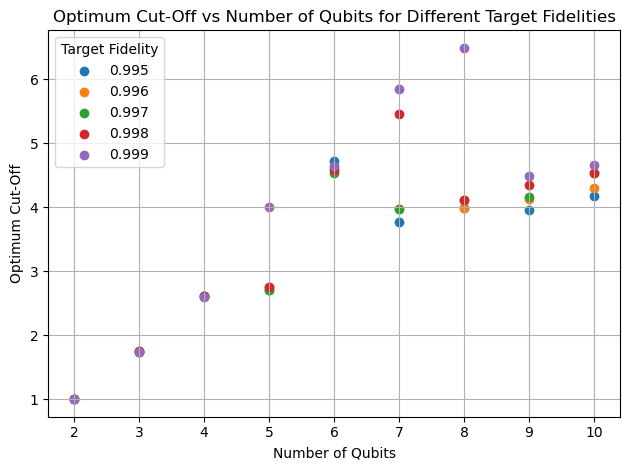

In [276]:
opt_cut_offs_diff_fid_real([0.995, 0.996, 0.997, 0.998, 0.999])

In [58]:
def fide_vs_optcutoff(fidelities, qubit_num, threshold):
    lst1=[0.954, 0.974, 0.995, 0.996, 0.997, 0.998, 0.999]
    lst2=[0.949327039718628, 0.9698064804077149, 0.9939908027648926,0.9954576969146729,0.9961935997009277,0.9971898555755615,0.9983320236206055]
    
    opt_cutoffs_int=[]
    opt_cutoffs_real=[]
    cutoff_lows=[]
    cutoff_highs=[]
    for target_fidelity in fidelities: 
        index = lst1.index(target_fidelity)
        fidelity=lst2[index]
        

        cutoff=graph_per_fidelity(qubit_num, target_fidelity, fidelity, threshold)
        cutoff_int=cutoff[0]
        cutoff_real=cutoff[1]
        cutoff_err_low=cutoff[2][0]
        cutoff_err_high=cutoff[2][1]
            
        cutoff_lows.append(cutoff_err_low)
        cutoff_highs.append(cutoff_err_high)
            
            
        opt_cutoffs_int.append(cutoff_int)
        opt_cutoffs_real.append(cutoff_real)

        
    lower_errorbars=[opt_cutoffs_int[i]-cutoff_lows[i] for i in range(len(fidelities))]
    upper_errorbars=[cutoff_highs[i]-opt_cutoffs_int[i] for i in range(len(fidelities))]
    errorbar = [lower_errorbars, upper_errorbars]
        
            
        
        #try:
            #popt, _ = curve_fit(poly2, qubits, opt_cutoffs)
            #fit_x = np.linspace(min(qubits), max(qubits), 300)
            #fit_y = poly2(fit_x, *popt)
            #plt.plot(fit_x, fit_y, '--', label=f'Fit {target_fidelity}')
       # except Exception as e:
            #print(f"Fit failed for fidelity {target_fidelity}: {e}")

    print(fidelities, opt_cutoffs_real)
    plt.errorbar(fidelities,  [opt+1 for opt in opt_cutoffs_int], yerr=errorbar, fmt='o', ecolor='gray', capsize=4)
    plt.xlabel("Gate Fidelity")
    plt.ylabel("Optimum Cut-Off")
    plt.title(f"Gate Fidelity vs Optimum Cut-Off for a {qubit_num} Qubit QFT Circuit")
    plt.grid(True)
    plt.tight_layout()
    plt.show()
            
            

[0.03588596 0.11914719 0.12367017 0.10790058 0.0869252  0.07561011
 0.06083267 0.05731655 0.05249052]


<Figure size 1000x600 with 0 Axes>

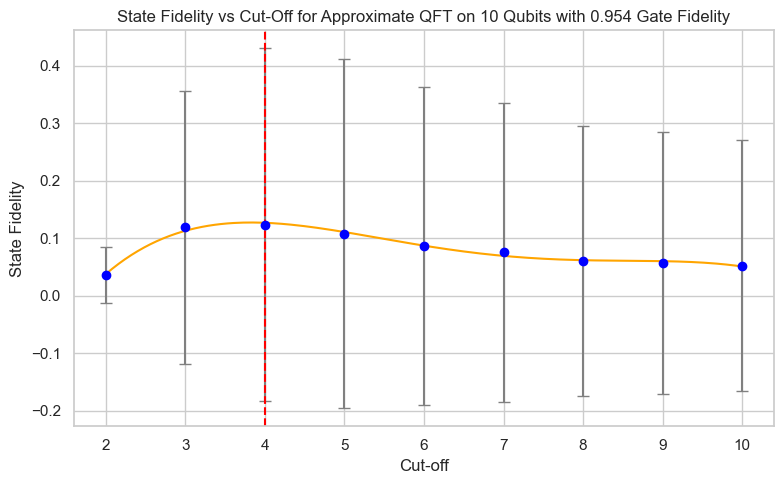

Maximum Fidelity: 0.1271 at cut-off ≈ 3.00
At non-integer cut off Maximum Fidelity: 0.1276 at cut-off ≈ 2.81
[0.05553759 0.24110751 0.2752723  0.25717364 0.22128753 0.20159428
 0.18617765 0.17389863 0.16977725]


<Figure size 1000x600 with 0 Axes>

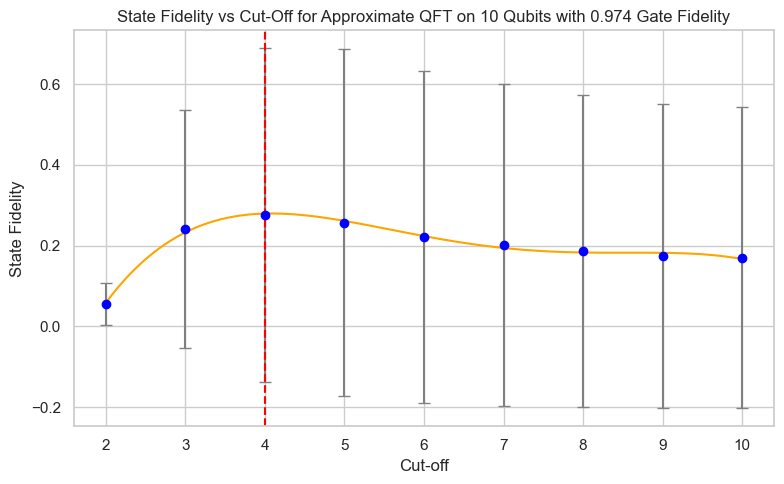

Maximum Fidelity: 0.2794 at cut-off ≈ 3.00
At non-integer cut off Maximum Fidelity: 0.2797 at cut-off ≈ 3.09
[0.09576426 0.50257598 0.71353178 0.74554389 0.73403899 0.71700873
 0.70224231 0.69442708 0.69334081]


<Figure size 1000x600 with 0 Axes>

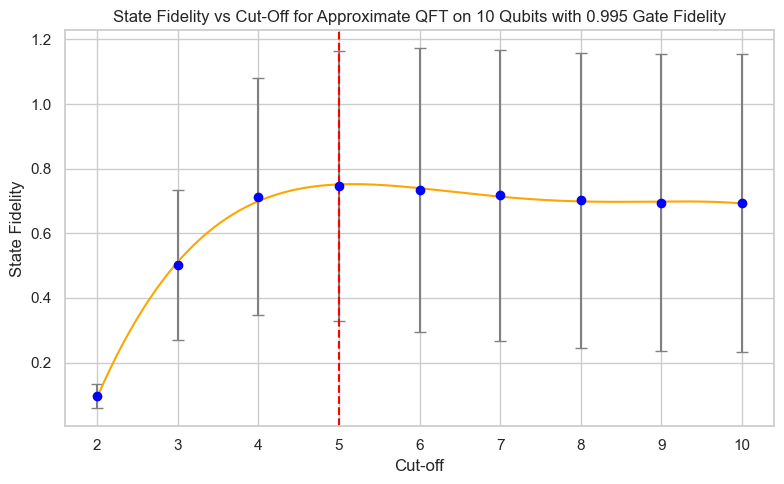

Maximum Fidelity: 0.7513 at cut-off ≈ 4.00
At non-integer cut off Maximum Fidelity: 0.7522 at cut-off ≈ 4.18
[0.09897922 0.52810106 0.75720773 0.80252143 0.79293792 0.77777509
 0.77330607 0.76286176 0.75386647]


<Figure size 1000x600 with 0 Axes>

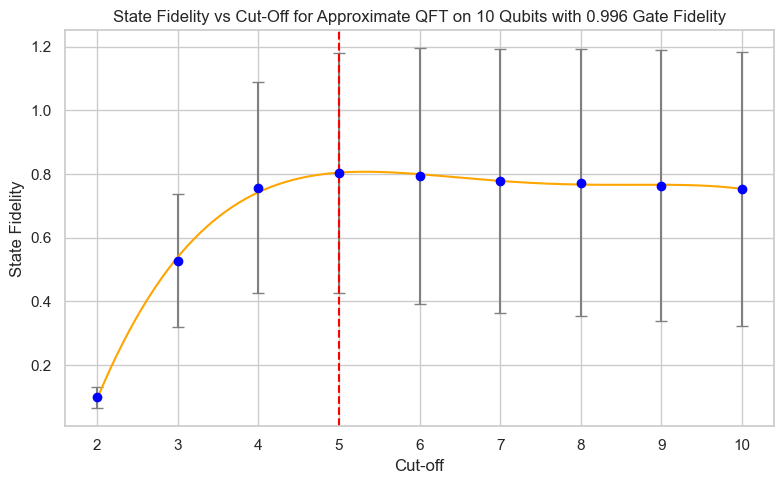

Maximum Fidelity: 0.8044 at cut-off ≈ 4.00
At non-integer cut off Maximum Fidelity: 0.8072 at cut-off ≈ 4.34
[0.10081362 0.54177734 0.7700599  0.81855017 0.82129782 0.81607326
 0.80225166 0.79491609 0.799866  ]


<Figure size 1000x600 with 0 Axes>

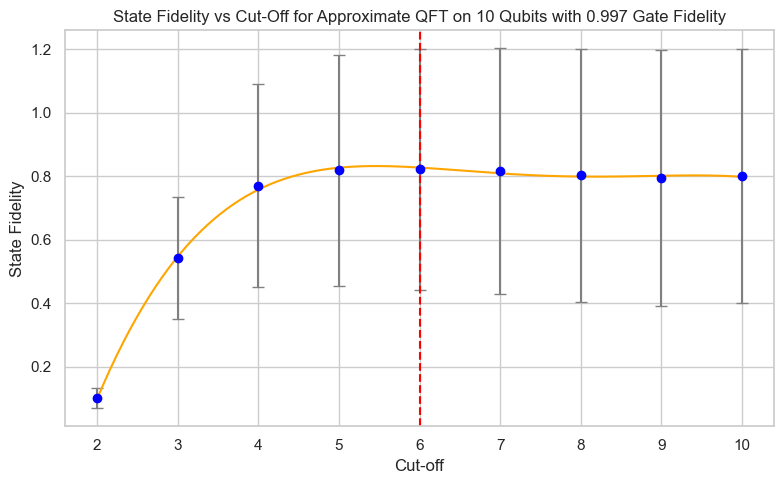

Maximum Fidelity: 0.8272 at cut-off ≈ 5.00
At non-integer cut off Maximum Fidelity: 0.8319 at cut-off ≈ 4.46
[0.10274573 0.55668596 0.80767396 0.86385428 0.86683215 0.86107169
 0.85365279 0.84524419 0.83818813]


<Figure size 1000x600 with 0 Axes>

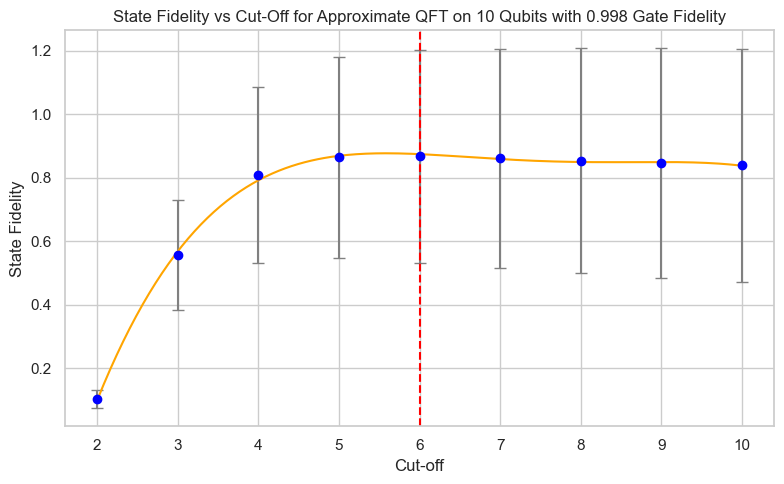

Maximum Fidelity: 0.8738 at cut-off ≈ 5.00
At non-integer cut off Maximum Fidelity: 0.8765 at cut-off ≈ 4.58
[0.10547238 0.57697473 0.84394882 0.90396513 0.91162192 0.91113691
 0.90732712 0.9036947  0.90115767]


<Figure size 1000x600 with 0 Axes>

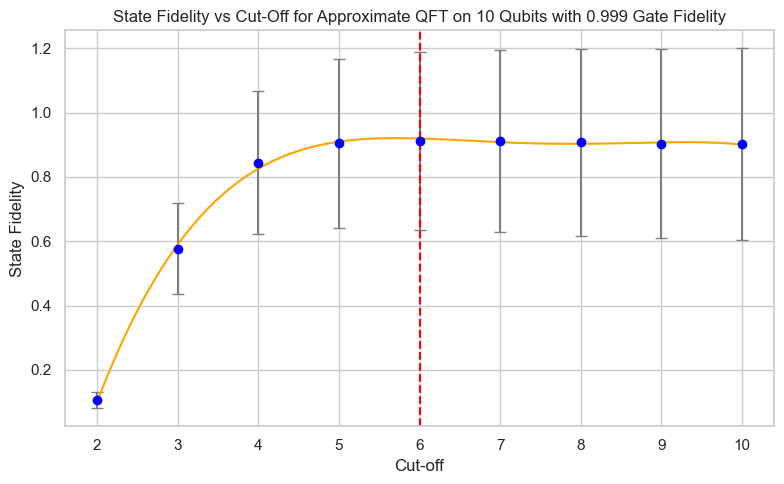

Maximum Fidelity: 0.9194 at cut-off ≈ 5.00
At non-integer cut off Maximum Fidelity: 0.9206 at cut-off ≈ 4.70
[0.954, 0.974, 0.995, 0.996, 0.997, 0.998, 0.999] [2.809045226130653, 3.090452261306533, 4.175879396984925, 4.336683417085427, 4.457286432160804, 4.577889447236181, 4.698492462311558]


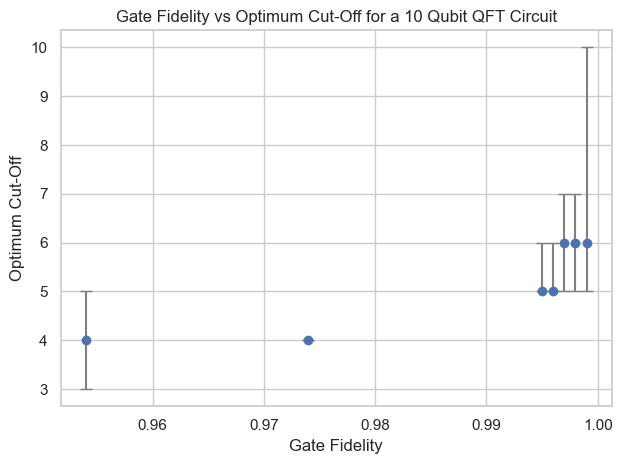

In [59]:
fide_vs_optcutoff([0.954, 0.974, 0.995, 0.996, 0.997, 0.998, 0.999], 10, 0.02)

# Pure state instead of Mixed State

In [33]:
def initialize_custom_superposition(qc, ctrl_qubits, p):
    """
    Initializes the 2 control qubits into the custom superposition:
    sqrt((1-p)/3)|11> + sqrt((1-p)/3)|01> + sqrt((1-p)/3)|10> + sqrt(p)|00>
    """
    a = np.sqrt((1 - p) / 3)
    b = np.sqrt(p)

    # Target state vector for 2 qubits (|00>, |01>, |10>, |11>)
    state = [b, a, a, a] #|00> means identity matrix, so do nothing

    # Use an initialize instruction
    qc.initialize(state, ctrl_qubits)

def apply_quantum_noise(qc, target_qubit, ctrl_qubits, p):
    """
    Applies a quantum noise operation to `target_qubit` controlled on `ctrl_qubits`
    according to a quantum superposition that encodes a probability of applying
    one of [I, X, Y, Z].
    
    ctrl_qubits: list of 2 qubit indices
    """
    # Initialize ancillas to the desired superposition
    initialize_custom_superposition(qc, ctrl_qubits, p)

    
    from qiskit.circuit.library import XGate, YGate, ZGate, MCXGate

    x_gate = MCXGate(2)          # Multi-controlled X
    y_gate = YGate().control(2)  # Multi-controlled HY
    z_gate = ZGate().control(2)  # Double-controlled Z
    
    # Create controlled gates
    #x_gate = XGate().control(2)
    #y_gate = YGate().control(2)
    #z_gate = ZGate().control(2)

    c0, c1 = ctrl_qubits

    # Apply controlled-X when ctrl is |11⟩
    qc.append(x_gate, [c0, c1, target_qubit])

    # Apply controlled-Y when ctrl is |01⟩
    qc.x(c0)
    qc.append(y_gate, [c0, c1, target_qubit])
    qc.x(c0)

    # Apply controlled-Z when ctrl is |10⟩
    qc.x(c1)
    qc.append(z_gate, [c0, c1, target_qubit])
    qc.x(c1)

    # Optionally reset ancillas here if reusing (not supported on all devices)
    qc.reset(ctrl_qubits)


In [34]:
def approx_QFT_circ_pure(m, cut_off, p_single, p_multi, orig_circuit): #The cut_off is defined as the number of rotation gates which are still implemented. If cut_off>=m-1, it's just the normal QFT
    """QFT circ"""            
    
    QFT = QuantumCircuit(m+2, name="QFT")

    # Append the original circuit to the first m qubits
    QFT.compose(orig_circuit, qubits=range(m), inplace=True)
    
    ancilla_0 = m
    ancilla_1 = m + 1
    
    for qubit in reversed(range(m)): #summing over all qubits in the circuit, starting from the bottom one.
        QFT.h(qubit) #hadamard on the qubit
        apply_quantum_noise(QFT, qubit, [ancilla_0, ancilla_1], p_single)
        for k in range(min(qubit, cut_off)):
            QFT.cp(2*pi/(2**(k+2)), qubit-k-1, qubit) #rotation gates on the qubits (k many of them)
            apply_quantum_noise(QFT, qubit, [ancilla_0, ancilla_1], p_multi)

    for number in range(m//2):
        QFT.swap(number, m-number-1)
        apply_quantum_noise(QFT, number, [ancilla_0, ancilla_1], p_multi)
        apply_quantum_noise(QFT, m-number-1, [ancilla_0, ancilla_1], p_multi)
        apply_quantum_noise(QFT, number, [ancilla_0, ancilla_1], p_multi)

    
    #print(QFT.draw())
    
    state = Statevector.from_instruction(QFT)
    
    relevant_elts = state.data[:2**m]  # This only works because the last 2 qubits are in state 0

    # Normalize manually
    relevant_elts /= np.linalg.norm(relevant_elts)
    
    # Make a new statevector (not valid quantum state unless you're certain about structure)
    relevant_state=Statevector(relevant_elts)

    return (relevant_state)

In [35]:
approx_QFT_circ_pure(5, 5, 1, 0.9, init_state_random(5, 'random_sup')[1])

Statevector([-0.14463378-0.03780949j,  0.0182633 -0.16896307j,
             -0.07933513-0.06906883j, -0.13326142-0.23235204j,
              0.13074467+0.10454827j,  0.04541971-0.14000742j,
             -0.24465391+0.0383686j , -0.12317203-0.05436827j,
             -0.24353251+0.14208562j, -0.05747642+0.08193381j,
              0.13689257-0.2481658j , -0.12894915+0.0667667j ,
             -0.02983594+0.02223838j,  0.18909866+0.12994211j,
             -0.14064647+0.01676526j, -0.0139946 +0.1085639j ,
             -0.19573614-0.02526701j, -0.1101016 +0.01954561j,
             -0.05171944+0.13703586j, -0.21655659+0.12678577j,
              0.13167598+0.05455398j,  0.13409036+0.06204979j,
              0.14300764-0.06061921j, -0.15525233-0.07196743j,
             -0.06364219+0.11172005j,  0.05846217-0.01773875j,
             -0.03751985+0.09679962j,  0.16740025-0.06789413j,
             -0.13110529+0.10075913j, -0.02714479-0.00964744j,
             -0.182126  +0.20716596j, -0.12793085+0.209

In [36]:
n=5
cut_off=5
p_single=1
p_multi=0.995
qr, orig_circuit=init_state_random(n, 'random_sup')
output_ideal = output_from_approx_QFT(n, orig_circuit, qr, n)
output_noisy = approx_QFT_circ_pure(n, cut_off, p_single, p_multi, orig_circuit)
    
error=norm(output_ideal, output_noisy, 'Fidelity')
print(error)

0.9999999999999996


In [37]:
def poly_graph_pure(n, init_state, fidelity_single, fidelity_mult, trials, err):
    cut_offs = list(range(1, n))
    fidelities = []
    
    std_devs = []
    
    results_dict = {}  # Store all norms or fidelities per cutoff

    for cut_off in cut_offs:
        trial_cutoff = []
        for _ in range(trials):
            qr, circ = init_state_random(n, init_state)
            ideal = output_from_approx_QFT(n, circ, qr, n)
            output = approx_QFT_circ_pure(n, cut_off, fidelity_single, fidelity_mult, circ)
            y = norm(ideal, output, err)
            trial_cutoff.append(y)
        
        results_dict[cut_off] = trial_cutoff
        
        avg_fidelity = sum(trial_cutoff) / trials
        fidelities.append(avg_fidelity)
    
        #using std devs
        std_dev = np.std(trial_cutoff)
        
        std_devs.append(std_dev)

    print(fidelities) 
    # Fit polynomial (quadratic or cubic typically works well)
    degree = 5  # You can change to 2 or 4 if needed
    p_fit = np.polyfit(cut_offs, fidelities, degree)
    poly = np.poly1d(p_fit)

    # Create smooth x values for the curve
    x_smooth = np.linspace(1, n-1, 200)
    y_smooth = poly(x_smooth)

        
    # Evaluate fitted curve at integer cut-off values
    fit_vals = [poly(x) for x in cut_offs]  # Evaluate polynomial at integer points only

    if err == 'norm':
        opt_index = int(np.argmin(fit_vals))
        
        # Find optimal cut-off on the smooth curve (including non-integer values)
        min_index = np.argmin(y_smooth)
        opt_cutoff_real = x_smooth[min_index]
        opt_value_real = y_smooth[min_index]
    elif err == 'Fidelity':
        opt_index = int(np.argmax(fit_vals))
        
         # Find optimal cut-off on the smooth curve (including non-integer values)
        max_index = np.argmax(y_smooth)
        opt_cutoff_real = x_smooth[max_index]
        opt_value_real = y_smooth[max_index]
    else:
        raise ValueError("err must be either 'norm' or 'Fidelity'")

    opt_cutoff = cut_offs[opt_index]
    opt_value = fit_vals[opt_index]

    # Plot data points and best-fit curve
    plt.figure(figsize=(8, 5))
    
    plt.errorbar(cut_offs, fidelities, yerr=std_devs, fmt='o', color='blue', ecolor='gray', capsize=4, label='Data w/ error bars')

    #plt.plot(cut_offs, fidelities, 'o', color='blue')
    plt.plot(x_smooth, y_smooth, '-', color='orange')
    plt.axvline(opt_cutoff, color='red', linestyle='--', label=f'Optimal Cut-off ≈ {opt_cutoff:.2f}')
    
    plt.title(f'Fidelity vs Cut-Off for Approximate QFT on {n} Qubits')
    plt.xlabel('Cut-off')
    plt.ylabel(err)
    plt.grid(True)
    plt.tight_layout()
    plt.show()
        

    print(f"{'Maximum' if err == 'Fidelity' else 'Minimum'} {err}: {opt_value:.4f} at cut-off ≈ {opt_cutoff:.2f}")
    print(f"At non-integer cut off {'Maximum' if err == 'Fidelity' else 'Minimum'} {err}: {opt_value_real:.4f} at cut-off ≈ {opt_cutoff_real:.2f}")
    
    
    with open(f"pure_qft_results_{n}_qubits_{fidelity_mult}_fidelity.csv", mode="w", newline="") as file:
        writer = csv.writer(file)
        writer.writerow(["Cut-off", "Trial", "Value"])  # Header
        for cutoff, values in results_dict.items():
            for i, val in enumerate(values):
                writer.writerow([cutoff, i, val])
    return (opt_cutoff, opt_cutoff_real, results_dict)


[0.20547917011416966, 0.6721340584386819, 0.8441600605112397, 0.8697703683145521, 0.862658027716703, 0.8442438425061236, 0.8438697881596238]


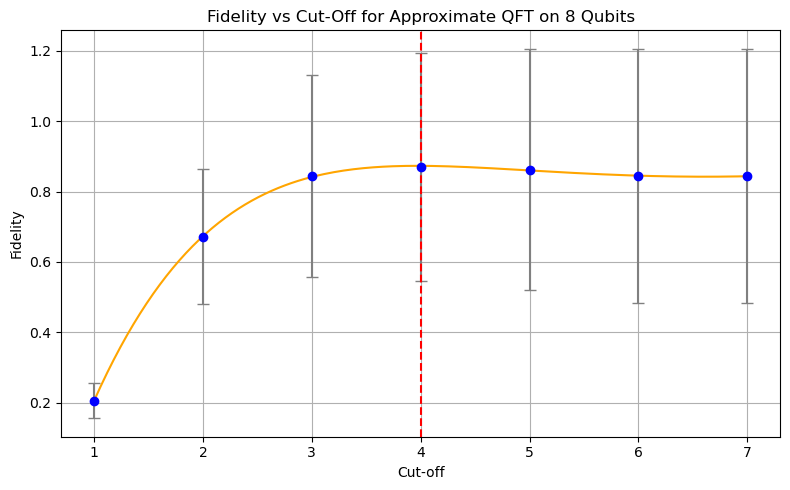

Maximum Fidelity: 0.8732 at cut-off ≈ 4.00
At non-integer cut off Maximum Fidelity: 0.8732 at cut-off ≈ 3.95


(4,
 3.9547738693467336,
 {1: [0.22419688049184713,
   0.23099823853307982,
   0.2449526629395518,
   0.24025020986761492,
   0.1991395174366497,
   0.013981377446825361,
   0.19531798093437225,
   0.2361114775975361,
   0.2038430060351077,
   0.1875527692381307,
   0.002594960268268862,
   0.1930660676567321,
   0.23321086270401076,
   0.20152717590902192,
   0.22735394686728558,
   0.2494928023051128,
   0.2062181595243574,
   0.17960438188423822,
   0.2461534574655676,
   0.2007659650165761,
   0.1781375980664254,
   0.2609466832450186,
   0.19833870089983946,
   0.1912081778400659,
   0.1419538209586146,
   0.1988049352487638,
   0.2596827614576177,
   0.2719443739202357,
   0.17399425736324858,
   0.3017082045007009,
   0.23699975029141826,
   0.2368224149034663,
   0.25926974744906495,
   0.20919687268090909,
   0.24256660325520296,
   0.18273783447997688,
   0.278996453926878,
   0.21816540528013034,
   0.17638883971262362,
   0.2644167627332684,
   0.1607329815456507,
   0.2092

In [587]:
poly_graph_pure(8, 'random_sup', 0.999786, 0.9939908027648926, 10000,'Fidelity')

In [42]:
def compare_mixed_pure(n, target_fidelity, state, threshold, ax=None, label_suffix=""):

    if state=='pure':
        target_fidelity='pure'
        fidelity=0.9939908027648926
        color='blue'
        colorline='orange'
    else: #if mixed state
        lst1=[0.954, 0.974, 0.995, 0.996, 0.997, 0.998, 0.999]
        lst2=[0.949327039718628, 0.9698064804077149, 0.9939908027648926,0.9954576969146729,0.9961935997009277,0.9971898555755615,0.9983320236206055]

        index = lst1.index(target_fidelity)
        fidelity=lst2[index]
        color='red'
        colorline='orangered'

    df=extract_data(n, target_fidelity, fidelity)
    
    cut_offs = df['Cut-off'].values
    fidelities = df['Mean'].values
    print(fidelities)
    std_devs = df['Standard Deviation'].values


    degree = 4
    p_fit = np.polyfit(cut_offs, fidelities, degree)
    poly = np.poly1d(p_fit)

    # Create smooth x values for the curve
    x_smooth = np.linspace(cut_offs.min(), cut_offs.max(), 200)
    y_smooth = poly(x_smooth)


    # Evaluate fitted curve at integer cut-off values
    fit_vals = [poly(x) for x in cut_offs]  # Evaluate polynomial at integer points only


    
    opt_index = int(np.argmax(fit_vals))

     # Find optimal cut-off on the smooth curve (including non-integer values)
    max_index = np.argmax(y_smooth)
    opt_cutoff_real = x_smooth[max_index]
    opt_value_real = y_smooth[max_index]


    opt_cutoff = cut_offs[opt_index]
    opt_value = fit_vals[opt_index]
    
    #finding points close enough to optimal
    closeby = np.abs(fidelities - opt_value) <= threshold
    closeby=closeby.tolist()
    first_true_index = closeby.index(True)+1
    true_indices = [i for i, val in enumerate(closeby) if val]
    last_true_index=max(true_indices)+1
    
    # Use provided axis or create a new one
    if ax is None:
        fig, ax = plt.subplots(figsize=(8, 5))
    
    ax.errorbar(cut_offs+1, fidelities, yerr=std_devs, fmt='o', color=color, ecolor='gray', capsize=4, label=f'{label_suffix}')

    #plt.plot(cut_offs, fidelities, 'o', color='blue')
    x_smooth_new = np.linspace(cut_offs.min()+1, cut_offs.max()+1, 200)
    ax.plot(x_smooth_new, y_smooth, '-', color=colorline)

    plt.title(f'Mixed vs Pure State AQFT Performance for {n} Qubits, 0.995 Gate Fidelity')
    plt.xlabel('Cut-off')
    plt.ylabel('State Fidelity')
    plt.grid(True)
    


    print(f"Maximum Fidelity: {opt_value:.4f} at cut-off ≈ {opt_cutoff:.2f}")
    print(f"At non-integer cut off Maximum Fidelity: {opt_value_real:.4f} at cut-off ≈ {opt_cutoff_real:.2f}")
    
    return(opt_cutoff, opt_cutoff_real, [first_true_index, last_true_index])

    



[0.37772541 0.77154147 0.86481523 0.86522882 0.86573641]
Maximum Fidelity: 0.8657 at cut-off ≈ 5.00
At non-integer cut off Maximum Fidelity: 0.8684 at cut-off ≈ 3.37
[0.37903586 0.77188064 0.86234295 0.87532596 0.86556975]
Maximum Fidelity: 0.8753 at cut-off ≈ 4.00
At non-integer cut off Maximum Fidelity: 0.8768 at cut-off ≈ 4.38


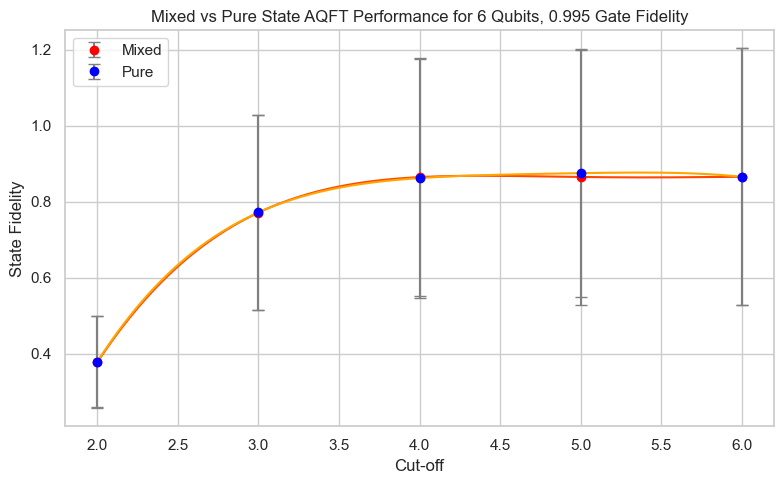

In [43]:
fig, ax = plt.subplots(figsize=(8, 5))
compare_mixed_pure(6, 0.995, 'mixed', 0.02, ax=ax, label_suffix="Mixed")
compare_mixed_pure(6, 0.995, 'pure', 0.02, ax=ax, label_suffix="Pure")
ax.legend()
plt.tight_layout()
plt.show()
